In [18]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import sklearn.model_selection
import itertools


# Load Data

In [19]:
seed = 5
data_path = "income2.csv"

In [20]:
from sklearn import preprocessing

# Read data
data = pd.read_csv(data_path, header=0)



to_encode = ['workclass', 'eduction-levels', 'marital-status', 'occupation', 'relationship', 'race', 'sex', 'native-country', 'income']
label_encoder = preprocessing.LabelEncoder()

df = data[to_encode]
df = df.apply(label_encoder.fit_transform)

data = data.drop(to_encode, axis=1)
data = pd.concat([data, df], axis=1)
# Last column represnets label, and others are features
features = np.array(data.iloc[:, 0:-1])
classes = np.array(data.iloc[:, -1])

data.describe()

,age,fnlwgt,eduction-years,capital-gain,capital-loss,hours-per-week,workclass,eduction-levels,marital-status,occupation,relationship,race,sex,native-country,income
count,30161.000000,3.016100e+04,30161.000000,30161.000000,30161.000000,30161.000000,30161.00000,30161.000000,30161.000000,30161.000000,30161.000000,30161.000000,30161.000000,30161.000000,30161.000000
mean,38.437187,1.897920e+05,10.121349,1092.044064,88.375419,40.931269,2.19933,10.333742,2.580153,5.959981,1.418388,3.678592,0.675674,36.382514,0.248898
std,13.134296,1.056542e+05,2.550029,7406.466611,404.304753,11.980182,0.95394,3.812353,1.498037,4.029569,1.601344,0.834721,0.468130,6.105467,0.432382
min,17.000000,1.376900e+04,1.000000,0.000000,0.000000,1.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,28.000000,1.176270e+05,9.000000,0.000000,0.000000,40.000000,2.00000,9.000000,2.000000,2.000000,0.000000,4.000000,0.000000,38.000000,0.000000
50%,37.000000,1.784210e+05,10.000000,0.000000,0.000000,40.000000,2.00000,11.000000,2.000000,6.000000,1.000000,4.000000,1.000000,38.000000,0.000000
75%,47.000000,2.376240e+05,13.000000,0.000000,0.000000,45.000000,2.00000,12.000000,4.000000,9.000000,3.000000,4.000000,1.000000,38.000000,0.000000
max,90.000000,1.484705e+06,16.000000,99999.000000,4356.000000,99.000000,6.00000,15.000000,6.000000,13.000000,5.000000,4.000000,1.000000,40.000000,1.000000


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f75e9099438>,
      dtype=object)

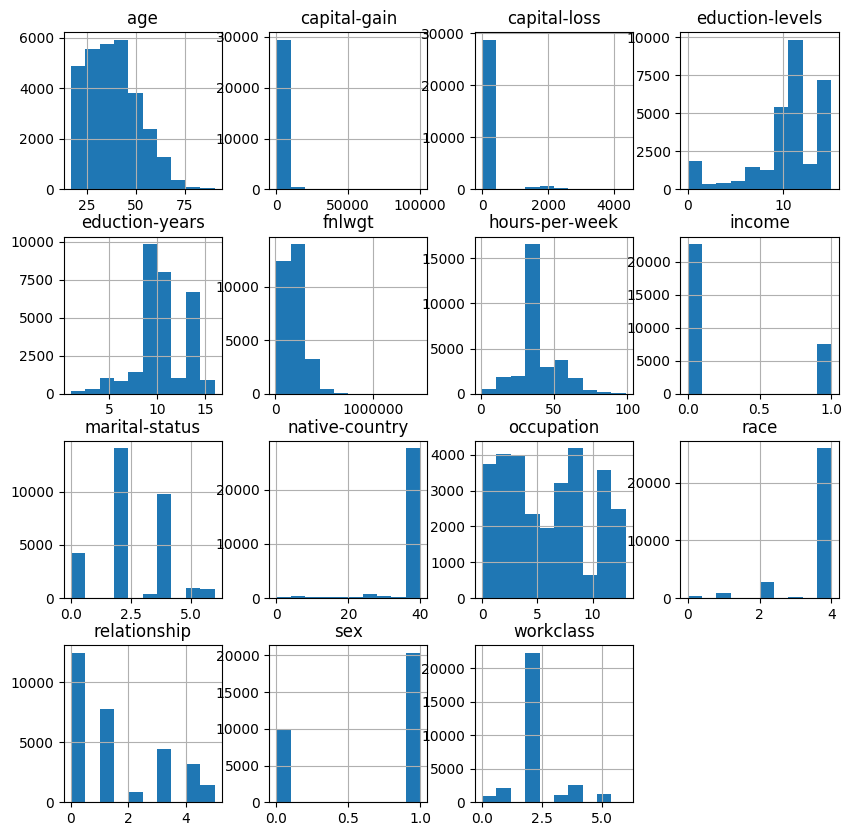

In [21]:
# draw hist for dataset
data.hist(figsize=(10, 10))

In [22]:
# split data
training_x, testing_x, training_y, testing_y = sklearn.model_selection.train_test_split(
features, classes, test_size=0.2, random_state=seed, stratify=classes)

In [23]:
print(training_x.shape)
print(testing_x.shape)
print(training_y.shape)
print(testing_y.shape)

(24128, 14)
(6033, 14)
(24128,)
(6033,)


In [24]:
from sklearn.preprocessing import StandardScaler

features = StandardScaler().fit_transform(features)
training_x = StandardScaler().fit_transform(training_x)
testing_x = StandardScaler().fit_transform(testing_x)


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


# Accuracy
### According to the fig above, the sample is not balanced (Death = 1 samples are significally fewer than Death = 0 samples), so we use "weighted" mode for accuracy calculating.

In [25]:
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, roc_auc_score
from sklearn.utils import compute_sample_weight

def balanced_accuracy(truth, pred):
    wts = compute_sample_weight('balanced', truth)
    return accuracy_score(truth, pred, sample_weight=wts)

# Section 2: Boosting

In [58]:
n_estimators =  [2, 5, 10, 20, 30, 45, 60, 80, 90, 100]

max_depth = np.arange(3, 21)
min_samples_split = [2,3,4]
min_samples_leaf = [2,3,4]
# params = {'criterion': ['gini', 'entropy'], 'max_depth': max_depth, "min_samples_split": min_samples_split, "min_samples_leaf": min_samples_leaf
#           }


params = {'n_estimators': n_estimators, 'base_estimator__criterion': ['gini', 'entropy'], 'base_estimator__max_depth': max_depth, "base_estimator__min_samples_split": min_samples_split, "base_estimator__min_samples_leaf": min_samples_leaf}


Use grid search to find best params. Take a few minutes.

In [59]:
from sklearn import ensemble
from sklearn.base import BaseEstimator
from sklearn.tree import DecisionTreeClassifier


base = DecisionTreeClassifier()
Boosting_classifier = ensemble.AdaBoostClassifier(base_estimator=base)
# print(Boosting_classifier.get_params().keys())
grid_seacher = sklearn.model_selection.GridSearchCV(Boosting_classifier, n_jobs=100, param_grid=params, 
                                                    refit=True, verbose=10, cv=5, scoring=make_scorer(balanced_accuracy))
grid_fit = grid_seacher.fit(training_x, training_y)


Fitting 5 folds for each of 3240 candidates, totalling 16200 fits


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7420485227827386, total=   0.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.735369720635103, total=   0.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7339727238795257, total=   0.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7534581878971351, total=   0.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7513331651511894, total=   0.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7620621895546814, total=   0.3s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7652169169370353, total=   0.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7571764908553217, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7659863790843908, total=   0.4s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.76815528542256, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.794407304257946, total=   0.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7777646214361595, total=   0.8s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7702304401504493, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7655266352726666, total=   0.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7909269639171186, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7894089408251745, total=   1.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7770269602917109, total=   1.4s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7814919915890548, total=   1.4s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7996739498693618, total=   1.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.8010590190661573, total=   1.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 [CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7941289155588734, total=   2.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.8030146142582331, total=   2.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7872919693358982, total=   2.2s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.788707396154419, total=   2.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.8000835856065495, total=   2.3s


[Parallel(n_jobs=100)]: Done  21 tasks      | elapsed:    3.7s
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7942718998535703, total=   3.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7949691349163054, total=   3.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7935725012085221, total=   3.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7907831979097877, total=   3.7s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.792892305529057, total=   4.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.78647448964943, total=   4.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7913674081385454, total=   4.6s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7957993063175831, total=   4.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7977479686468174, total=   5.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7905300755117862, total=   5.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7420485227827386, total=   0.3s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.735369720635103, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.791916965746935, total=   6.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7339727238795257, total=   0.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7534581878971351, total=   0.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7953905079100749, total=   6.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7513331651511894, total=   0.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.784821843865744, total=   6.5s

[Parallel(n_jobs=100)]: Done  42 tasks      | elapsed:   10.1s
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7620621895546814, total=   0.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7652169169370353, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7964988015873453, total=   6.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7571764908553217, total=   0.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.76815528542256, total=   0.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7659863790843908, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7931754810652639, total=   7.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7903946711074105, total=   6.7s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.794407304257946, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7777646214361595, total=   1.0s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7702304401504493, total=   0.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7655266352726666, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7940061443050332, total=   7.1s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7909269639171186, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7860657498061958, total=   7.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7955354303716734, total=   7.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7996739498693618, total=   1.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7894089408251745, total=   1.6s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7940105329811619, total=   7.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7814919915890548, total=   1.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7770269602917109, total=   1.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.8010590190661573, total=   1.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
[Parallel(n_jobs=100)]: Done  65 tasks      | elapsed:   14.2s


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7865123891010365, total=   7.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7941289155588734, total=   2.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7904022509977319, total=   8.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.8030146142582331, total=   2.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7926284295831474, total=   7.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7922048725032304, total=   7.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7872919693358982, total=   2.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7842650664675987, total=   8.8s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.788707396154419, total=   2.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.8000835856065495, total=   2.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7949691349163054, total=   3.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7942718998535703, total=   3.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7907831979097877, total=   3.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.792892305529057, total=   3.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7935725012085221, total=   3.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7977479686468174, total=   4.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7913674081385454, total=   4.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7905300755117862, total=   4.7s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.78647448964943, total=   5.2s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7420485227827386, total=   0.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.735369720635103, total=   0.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7957993063175831, total=   5.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7339727238795257, total=   0.2s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.791916965746935, total=   5.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7534581878971351, total=   0.2s



[Parallel(n_jobs=100)]: Done  88 tasks      | elapsed:   21.9s
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7513331651511894, total=   0.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7953905079100749, total=   5.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7620621895546814, total=   0.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7652169169370353, total=   0.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7844055241321887, total=   6.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7571764908553217, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7931754810652639, total=   6.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7659863790843908, total=   0.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7966391831310553, total=   6.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.76815528542256, total=   0.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7777646214361595, total=   0.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7940061443050332, total=   6.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7702304401504493, total=   0.7s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.794407304257946, total=   1.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7909269639171186, total=   0.7s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7655266352726666, total=   1.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7940105329811619, total=   6.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7903946711074105, total=   8.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7955354303716734, total=   6.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7996739498693618, total=   1.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7860657498061958, total=   7.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7894089408251745, total=   1.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7770269602917109, total=   1.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7814919915890548, total=   1.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
[Parallel(n_jobs=100)]: Done 113 tasks      | elapsed:   26.1s


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.8010590190661573, total=   1.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7865123891010365, total=   8.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7904022509977319, total=   8.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.8030146142582331, total=   2.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7941289155588734, total=   2.7s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7864593298687874, total=   2.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.788707396154419, total=   2.2s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7926284295831474, total=   8.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.8000835856065495, total=   2.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7842650664675987, total=   8.7s


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7922048725032304, total=   8.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7942718998535703, total=   3.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.789950558442677, total=   3.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.792892305529057, total=   3.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7949691349163054, total=   4.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7935725012085221, total=   3.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7905300755117862, total=   4.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7860581699158747, total=   4.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7913674081385454, total=   4.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7977479686468174, total=   5.1s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7420485227827386, total=   0.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.735369720635103, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7957993063175831, total=   5.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7331400844124148, total=   0.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.745957195346777, total=   0.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 

[Parallel(n_jobs=100)]: Done 138 tasks      | elapsed:   34.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7513331651511894, total=   0.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7953905079100749, total=   5.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7915006460133798, total=   6.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7620621895546814, total=   0.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7844055241321887, total=   5.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7652169169370353, total=   0.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7535599643974847, total=   0.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.75804976721018, total=   0.4s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7963608324924226, total=   6.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7931754810652639, total=   6.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.76815528542256, total=   0.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7777646214361595, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7899783513738552, total=   6.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7937151224554251, total=   0.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7627038387550604, total=   0.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7802575070811117, total=   0.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.791202902106964, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7940105329811619, total=   7.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7949811415431953, total=   7.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7894089408251745, total=   1.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7860657498061958, total=   7.7s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.8009304889603492, total=   1.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7940061443050332, total=   8.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7973097290153718, total=   1.4s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7818798127996782, total=   1.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7999456165116268, total=   1.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

[Parallel(n_jobs=100)]: Done 165 tasks      | elapsed:   39.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7865123891010365, total=   8.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7904022509977319, total=   8.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7956461569381837, total=   2.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7939859312641765, total=   2.5s


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7814761262166584, total=   2.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7996817405657171, total=   2.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7842650664675987, total=   8.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7960607698147056, total=   2.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7920669034083077, total=   7.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7926284295831474, total=   8.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7924661632547589, total=   3.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7958093542737374, total=   3.4s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7994058023758716, total=   3.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.8006426993326018, total=   3.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7839866777685262, total=   3.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7936024577220133, total=   4.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7970381004335468, total=   4.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7830110540067184, total=   4.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7995534212659429, total=   4.3s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.8030267731268829, total=   4.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7420485227827386, total=   0.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.735369720635103, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7331400844124148, total=   0.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.745957195346777, total=   0.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7513331651511894, total=   0.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7923610784116685, total=   5.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7620621895546814, total=   0.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7652169169370353, total=   0.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.8028936289295345, total=   5.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
[Parallel(n_jobs=100)]: Done 192 tasks      | elapsed:   47.0s


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7535599643974847, total=   0.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7912197306841999, total=   6.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.76815528542256, total=   0.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.75804976721018, total=   0.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7821834677998218, total=   6.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7777646214361595, total=   0.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7994226895173816, total=   6.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7937151224554251, total=   0.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7802575070811117, total=   0.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7627038387550604, total=   0.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7890330471733326, total=   7.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.791202902106964, total=   0.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7864820695397512, total=   6.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.8005385045206994, total=   6.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7894089408251745, total=   1.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.8009304889603492, total=   1.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7913576617186827, total=   8.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7967940393674882, total=   7.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7818798127996782, total=   1.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.800361936245182, total=   1.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7973097290153718, total=   1.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.785973298113641, total=   7.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7939859312641765, total=   2.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.782883229492664, total=   7.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7998583088412343, total=   7.3s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7956461569381837, total=   2.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7898328404490511, total=   7.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7814761262166584, total=   2.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7996817405657171, total=   2.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 


[Parallel(n_jobs=100)]: Done 221 tasks      | elapsed:   52.4s
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7987400813891294, total=   7.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7960607698147056, total=   2.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 [CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7924661632547589, total=   3.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7958093542737374, total=   3.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.8014753387997126, total=   3.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7994058023758716, total=   3.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7839866777685262, total=   3.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7936024577220133, total=   4.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7830110540067184, total=   3.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7970381004335468, total=   4.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.8030267731268829, total=   4.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7420485227827386, total=   0.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.735369720635103, total=   0.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7331400844124148, total=   0.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.745957195346777, total=   0.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7513331651511894, total=   0.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7995534212659429, total=   6.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7923610784116685, total=   6.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7620621895546814, total=   0.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7652169169370353, total=   0.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7990063697838263, total=   5.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.8031719795681672, total=   6.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7821834677998218, total=   6.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7535599643974847, total=   0.5s

[CV]  base_estimator__criterion=gini, base_estimator__max

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.76815528542256, total=   0.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7777646214361595, total=   0.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7912197306841999, total=   7.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7937151224554251, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
[Parallel(n_jobs=100)]: Done 250 tasks      | elapsed:  1.0min



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7627038387550604, total=   1.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7802575070811117, total=   0.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7890330471733326, total=   7.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7881941189553224, total=   6.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7864820695397512, total=   7.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.791202902106964, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7917739814522381, total=   8.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.800816855159332, total=   7.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7894089408251745, total=   1.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7818798127996782, total=   1.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.8009304889603492, total=   1.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.800361936245182, total=   1.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7973097290153718, total=   1.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7902491601826065, total=   8.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.782883229492664, total=   8.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7939859312641765, total=   2.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7814761262166584, total=   2.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7956461569381837, total=   2.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.8001366594798669, total=   8.3s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7995727208562402, total=   8.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.785973298113641, total=   9.6s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7996817405657171, total=   2.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.796477089548261, total=   2.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7958093542737374, total=   3.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7924661632547589, total=   3.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7839866777685262, total=   3.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7994058023758716, total=   3.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.8010590190661573, total=   3.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7970381004335468, total=   4.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7991371015323875, total=   4.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.8033051237655157, total=   4.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
[Parallel(n_jobs=100)]: Done 281 tasks      | elapsed:  1.2min


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7424648425162939, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7830110540067184, total=   5.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7936024577220133, total=   5.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.735369720635103, total=   0.2s


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7331400844124148, total=   0.2s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7923610784116685, total=   5.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7513331651511894, total=   0.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.745957195346777, total=   0.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7912197306841999, total=   5.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.8031719795681672, total=   5.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7821834677998218, total=   6.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7648005972034798, total=   0.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7620621895546814, total=   0.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7535599643974847, total=   0.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7592963139620589, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.76815528542256, total=   0.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7893002841634915, total=   6.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7777646214361595, total=   0.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7627038387550604, total=   0.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7913374486778258, total=   0.8s


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7840140344782587, total=   0.8s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.791202902106964, total=   1.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7917739814522381, total=   7.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7890330471733326, total=   7.8s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7864820695397512, total=   7.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7892710097906916, total=   1.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.8013468086939045, total=   1.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.8001052976456339, total=   1.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.8002239671502593, total=   1.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7818798127996782, total=   1.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
[Parallel(n_jobs=100)]: Done 312 tasks      | elapsed:  1.3min


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7886104386888779, total=   7.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.785973298113641, total=   7.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.800816855159332, total=   8.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 [CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7898328404490511, total=   8.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7907958310603234, total=   2.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7996891096500044, total=   2.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.784390364351546, total=   2.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.800787905773886, total=   2.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.8017609267847068, total=   2.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.782883229492664, total=   8.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7998583088412343, total=   8.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.782789199765464, total=   7.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 [CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7931684515777082, total=   3.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7977479686468173, total=   3.6s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7814786528467655, total=   3.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 

[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.8005216173791893, total=   3.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7978881423317215, total=   4.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7974670533176377, total=   4.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7945679749633926, total=   4.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7424648425162939, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.735369720635103, total=   0.3s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7964939766897711, total=   5.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7331400844124148, total=   0.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7874450601510234, total=   6.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.745957195346777, total=   0.3s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7513331651511894, total=   0.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.795116698189331, total=   6.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7620621895546814, total=   0.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7960873067513644, total=   5.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7648005972034798, total=   0.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.797477159838066, total=   6.7s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7535599643974847, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7592963139620589, total=   0.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7871793046024863, total=   6.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 


[Parallel(n_jobs=100)]: Done 345 tasks      | elapsed:  1.4min
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.76815528542256, total=   0.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7777646214361595, total=   0.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.79955583371473, total=   7.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7913374486778258, total=   0.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7840140344782587, total=   0.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7627038387550604, total=   1.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.791942232048006, total=   8.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.791202902106964, total=   0.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7990039573350391, total=   7.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7888925895087427, total=   8.4s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7880144706997042, total=   7.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7935872979413707, total=   8.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7892710097906916, total=   1.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7818798127996782, total=   1.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.8013468086939045, total=   1.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7953950488279635, total=   8.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.8001052976456339, total=   1.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.8006402868838147, total=   1.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.788059950041632, total=   8.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7908160441011801, total=   7.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7856544833328547, total=   8.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7955354303716734, total=   7.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7907958310603234, total=   2.4s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7996891096500044, total=   2.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.784390364351546, total=   2.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.8017609267847068, total=   2.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7915102021310424, total=   8.4s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.800787905773886, total=   2.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7931684515777082, total=   3.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7978881423317215, total=   3.6s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.8009379371127445, total=   3.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7814786528467655, total=   4.1s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7977479686468173, total=   4.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[Parallel(n_jobs=100)]: Done 378 tasks      | elapsed:  1.5min


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7945679749633926, total=   4.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.795116698189331, total=   4.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7424648425162939, total=   0.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7974670533176377, total=   4.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.735369720635103, total=   0.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7331400844124148, total=   0.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.745957195346777, total=   0.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7874450601510234, total=   5.8s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7513331651511894, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7969102964233264, total=   6.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7620621895546814, total=   0.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7871793046024863, total=   5.8s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7960873067513644, total=   5.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7648005972034798, total=   0.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7535599643974847, total=   0.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7592963139620589, total=   0.4s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.791942232048006, total=   6.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.76815528542256, total=   0.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.797477159838066, total=   6.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.79955583371473, total=   6.8s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7913374486778258, total=   0.7s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7777646214361595, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7627038387550604, total=   0.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7840140344782587, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7888925895087427, total=   7.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.791202902106964, total=   0.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7880144706997042, total=   7.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7953950488279635, total=   6.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7935872979413707, total=   7.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7892710097906916, total=   1.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.8013468086939045, total=   1.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7818798127996782, total=   1.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.8006402868838147, total=   1.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.8001052976456339, total=   1.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

[Parallel(n_jobs=100)]: Done 413 tasks      | elapsed:  1.7min


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7955354303716734, total=   6.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7990039573350391, total=   8.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7907958310603234, total=   2.4s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.788059950041632, total=   8.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7996891096500044, total=   2.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7915102021310424, total=   7.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.8017609267847068, total=   2.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.8003715860403307, total=   2.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.784390364351546, total=   2.8s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7856544833328547, total=   8.8s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7908160441011801, total=   9.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 [CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7931684515777082, total=   3.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7978881423317215, total=   3.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.8005216173791893, total=   3.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7977479686468173, total=   4.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7814786528467655, total=   4.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7945679749633926, total=   4.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7964939766897711, total=   3.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7357708805880158, total=   0.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7874450601510234, total=   4.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7974670533176377, total=   4.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7259045048666342, total=   0.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7352267363404059, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7328940149213404, total=   0.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.795116698189331, total=   5.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7871793046024863, total=   4.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7465794922553503, total=   0.2s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7960873067513644, total=   4.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.774183467799822, total=   0.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.791942232048006, total=   5.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7854038875649603, total=   0.4s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.797477159838066, total=   5.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7529905538488041, total=   0.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7780403517671992, total=   0.5s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7846869928113622, total=   0.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7990039573350391, total=   5.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7880144706997042, total=   5.7s


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
[Parallel(n_jobs=100)]: Done 448 tasks      | elapsed:  1.8min


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7955259123144507, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7886015676591347, total=   0.8s


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7991395139811747, total=   6.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7694003273134457, total=   0.8s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7945696467072142, total=   0.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7953950488279635, total=   5.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7888925895087427, total=   6.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 
[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7971693474716618, total=   0.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 [CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7935872979413707, total=   6.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7876335237876483, total=   1.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7778823394297854, total=   1.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7926142008096702, total=   1.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.788059950041632, total=   6.6s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7970699775573337, total=   1.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.8031502675290827, total=   1.4s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7856544833328547, total=   6.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7841574549944011, total=   2.0s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7955354303716734, total=   5.9s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7837588216715955, total=   2.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7817696746963736, total=   2.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7908160441011801, total=   7.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.800407772772138, total=   2.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7915102021310424, total=   6.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7999793907946469, total=   2.4s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7855847713112637, total=   3.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7767788911539234, total=   3.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7951456475747768, total=   3.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.8062241867979775, total=   3.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.782497229320394, total=   4.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7812886962014414, total=   4.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7879543674972843, total=   4.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7820910161072671, total=   4.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7357708805880158, total=   0.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7259045048666342, total=   0.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.796934420911198, total=   4.6s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7717906342415801, total=   5.1s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7352267363404059, total=   0.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
[Parallel(n_jobs=100)]: Done 485 tasks      | elapsed:  1.9min


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7328940149213404, total=   0.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7465794922553503, total=   0.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7627973240690229, total=   5.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.778379511326768, total=   5.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.774183467799822, total=   0.4s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7777949409974447, total=   5.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 

[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7854038875649603, total=   0.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7529905538488041, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7780403517671992, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7846869928113622, total=   0.4s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7822590354248575, total=   6.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7886015676591347, total=   0.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7898642227871183, total=   6.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7955259123144507, total=   0.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7694003273134457, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7945696467072142, total=   0.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7727991041947803, total=   6.7s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.8005047302376791, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7769951477217262, total=   7.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7876335237876483, total=   1.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7640412300094748, total=   7.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7843358091950602, total=   6.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7835200568694595, total=   7.0s






/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7778823394297854, total=   1.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7921978810761148, total=   1.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7970699775573337, total=   1.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.8063332065074543, total=   1.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7756107841166845, total=   7.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7833425019380402, total=   2.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7841574549944011, total=   2.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7640488098997961, total=   7.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.800407772772138, total=   2.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7776544833328548, total=   7.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7817696746963736, total=   2.5s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 

[Parallel(n_jobs=100)]: Done 522 tasks      | elapsed:  2.0min


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.8055174541818537, total=   2.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.783624251681362, total=   7.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7850449542599711, total=   8.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.8008120302617576, total=   3.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.782497229320394, total=   3.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.785306382612191, total=   3.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7947293278412215, total=   3.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7767788911539234, total=   3.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7816746963737117, total=   4.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7717906342415801, total=   4.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.781567084900514, total=   4.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7887870069643951, total=   4.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7357708805880158, total=   0.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7259045048666342, total=   0.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7352267363404059, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7328940149213404, total=   0.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7465794922553503, total=   0.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7987256066964065, total=   5.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.774183467799822, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7854038875649603, total=   0.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7529905538488041, total=   0.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7780403517671992, total=   0.3s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7772406902294066, total=   6.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7626593930345401, total=   6.0s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7826753551584129, total=   5.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7787958310603232, total=   6.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.787603643395037, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7886015676591347, total=   0.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7902805425206736, total=   6.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7694003273134457, total=   0.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7955259123144507, total=   0.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7945696467072142, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7726611731602975, total=   6.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7971693474716618, total=   0.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7769951477217262, total=   7.1s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7826874174023488, total=   6.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7876335237876483, total=   1.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7834862825864393, total=   6.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7643170920784402, total=   7.0s


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 


[Parallel(n_jobs=100)]: Done 561 tasks      | elapsed:  2.2min


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7970699775573337, total=   1.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7926142008096702, total=   1.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7778823394297854, total=   1.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.8063332065074543, total=   1.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7833425019380402, total=   2.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.777516552298372, total=   7.2s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7641867409342787, total=   7.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7760271038502398, total=   7.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7841574549944011, total=   2.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7817696746963736, total=   2.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7854612739935265, total=   7.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.800407772772138, total=   2.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.8055174541818537, total=   2.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7835055821767365, total=   7.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 [CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.782497229320394, total=   3.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7938966883741108, total=   3.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7851684515777083, total=   3.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7767788911539234, total=   3.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.8058078670644222, total=   3.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7820910161072671, total=   4.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7720690229406528, total=   4.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7988635757913293, total=   4.3s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7812886962014414, total=   5.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7883706872308397, total=   4.5s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7360467426569812, total=   0.3s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7254881851330788, total=   0.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7345471876884204, total=   0.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7316450557206744, total=   0.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7393665001387733, total=   0.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7744593298687875, total=   0.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7772406902294066, total=   5.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7820531166556605, total=   0.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7568930488960348, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.778379511326768, total=   5.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7777402890894821, total=   0.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7818427156913023, total=   5.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.763351574837061, total=   6.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7885549523667732, total=   0.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7898642227871183, total=   6.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.786931235464699, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7756350167963478, total=   0.7s

[Parallel(n_jobs=100)]: Done 600 tasks      | elapsed:  2.3min


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7931583450572798, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.8010614315149445, total=   0.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7991153894933031, total=   0.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7733533549628184, total=   6.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.763900772344885, total=   6.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7848900980235383, total=   6.2s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7769951477217262, total=   7.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7839363766030149, total=   6.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7908286772517156, total=   1.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.8006521002612766, total=   1.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7839715179878836, total=   1.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7992702457297359, total=   1.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.8052246288504981, total=   1.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7946882195871258, total=   2.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7906983261075542, total=   2.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7780708030664102, total=   7.6s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7831565649315224, total=   2.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.8010759062076673, total=   2.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7960776569562158, total=   2.1s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7760271038502398, total=   8.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7641867409342787, total=   7.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7832272315381039, total=   7.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7842123147928604, total=   8.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7882105142266502, total=   3.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7766384334893336, total=   3.2s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7958210183566675, total=   3.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.787771454822131, total=   3.4s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.788881551981149, total=   3.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.78808774297281, total=   4.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7826477935054122, total=   4.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7729168221884062, total=   4.1s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7954071110718993, total=   4.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7360467426569812, total=   0.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7840357465173431, total=   4.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7254881851330788, total=   0.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7345471876884204, total=   0.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7316450557206744, total=   0.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7393665001387733, total=   0.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7744593298687875, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7820531166556605, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[Parallel(n_jobs=100)]: Done 641 tasks      | elapsed:  2.5min


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7808572166872434, total=   5.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7773584082230324, total=   5.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7568930488960348, total=   0.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.783244996985271, total=   6.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7777402890894821, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7885549523667732, total=   0.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.786931235464699, total=   0.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7883489751917553, total=   6.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7931583450572798, total=   0.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7756350167963478, total=   0.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7844761907387701, total=   6.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7991153894933031, total=   0.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.8010614315149445, total=   0.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7775291854489076, total=   6.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7783971977375176, total=   7.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7893268211001502, total=   6.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7908286772517156, total=   1.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7750110540067184, total=   7.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7789236526588402, total=   6.7s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.8006521002612766, total=   1.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.8052246288504981, total=   1.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7834172672198454, total=   1.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7992702457297359, total=   1.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7788059375807518, total=   7.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7906983261075542, total=   2.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7946882195871258, total=   2.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7715703580349709, total=   7.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7869668717937407, total=   7.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7723676246805822, total=   7.6s


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.8010759062076673, total=   2.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7753243939469133, total=   7.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7835728846650779, total=   2.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7960776569562158, total=   2.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7882105142266502, total=   3.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7958210183566675, total=   3.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7767763645238163, total=   3.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.787771454822131, total=   4.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.788881551981149, total=   3.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.78808774297281, total=   4.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7826477935054122, total=   4.2s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 

[Parallel(n_jobs=100)]: Done 682 tasks      | elapsed:  2.6min



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7737494616555168, total=   4.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7360467426569812, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7954071110718993, total=   4.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7837598083274976, total=   4.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7254881851330788, total=   0.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7345471876884204, total=   0.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7316450557206744, total=   0.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7393665001387733, total=   0.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7744593298687875, total=   0.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7820531166556605, total=   0.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7768041574549943, total=   5.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.783244996985271, total=   5.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7568930488960348, total=   0.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7777402890894821, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7885549523667732, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7809926210916192, total=   6.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7848925104723254, total=   6.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.786931235464699, total=   0.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7883489751917553, total=   6.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7931583450572798, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7756350167963478, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.8010614315149445, total=   0.8s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7991153894933031, total=   0.8s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7783971977375176, total=   6.8s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7775291854489076, total=   6.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7755653047747566, total=   7.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7908286772517156, total=   1.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7893268211001502, total=   7.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7793399723923956, total=   6.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.8006521002612766, total=   1.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7839715179878836, total=   1.6s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.8052246288504981, total=   1.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7992702457297359, total=   1.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7783896178471964, total=   7.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7906983261075542, total=   2.1s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7800271038502398, total=   7.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7946882195871258, total=   2.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7835728846650779, total=   2.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7718133739125441, total=   7.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7869668717937407, total=   7.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.8010759062076673, total=   2.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7960776569562158, total=   2.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7753243939469133, total=   7.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 

[Parallel(n_jobs=100)]: Done 725 tasks      | elapsed:  2.8min


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7958210183566675, total=   3.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.787771454822131, total=   3.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7882105142266502, total=   3.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7766384334893336, total=   3.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.788881551981149, total=   3.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7826477935054122, total=   4.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7730547532228889, total=   4.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7876714232392547, total=   4.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7359088116224984, total=   0.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7954071110718993, total=   4.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7256261161675617, total=   0.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7833434885939422, total=   4.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7349635074219758, total=   0.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7316450557206744, total=   0.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7397828198723286, total=   0.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7828286772517155, total=   5.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7744593298687876, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7833020758563267, total=   0.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7883489751917553, total=   5.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7568930488960348, total=   0.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7760846599504093, total=   0.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7925825930561913, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7808572166872434, total=   6.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7768041574549943, total=   6.3s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7783971977375176, total=   6.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7851684486621708, total=   6.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7887319188032962, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7931532917970656, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7820253237244824, total=   0.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7973217912593076, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.8016036580994867, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 [CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7751489850412012, total=   6.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7802979126589912, total=   7.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7963762381923111, total=   1.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7917689281920239, total=   1.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7789236526588402, total=   6.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7866124206839128, total=   1.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.8024555971568947, total=   1.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.8030195357805213, total=   2.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7893268211001502, total=   7.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7783896178471964, total=   7.0s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7937378621263891, total=   2.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7955183324241293, total=   2.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7870337936776823, total=   2.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7804434235837951, total=   7.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.8031599173242314, total=   2.4s

[Parallel(n_jobs=100)]: Done 768 tasks      | elapsed:  2.9min


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7945431097705555, total=   2.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7718133739125441, total=   8.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7747701051184352, total=   7.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7934796864681731, total=   3.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7908034109506445, total=   3.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7869668717937407, total=   8.4s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.8016422572800812, total=   3.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7810977059347094, total=   3.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7955499050643964, total=   3.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7961205891642023, total=   4.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7844333170633668, total=   4.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7756830227683825, total=   4.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7359088116224984, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7909776253416487, total=   4.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7256261161675617, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7908275940027902, total=   5.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7349635074219758, total=   0.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7316450557206744, total=   0.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7397828198723286, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7744593298687876, total=   0.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7833020758563267, total=   0.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.788755645130162, total=   5.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7568930488960348, total=   0.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7855872979413707, total=   6.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7760846599504093, total=   0.4s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7925825930561913, total=   0.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.780556088317207, total=   6.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7676602830974187, total=   7.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7887319188032962, total=   0.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7931532917970656, total=   0.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7820253237244824, total=   0.8s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7799018059662925, total=   6.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7973217912593076, total=   0.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7865409022650368, total=   7.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.8016036580994867, total=   0.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7641968474547072, total=   7.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7770977059347095, total=   7.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7837718705714334, total=   6.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7963762381923111, total=   1.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7917689281920239, total=   1.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7866124206839128, total=   1.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.8024555971568947, total=   1.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.8030195357805213, total=   1.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 

[Parallel(n_jobs=100)]: Done 813 tasks      | elapsed:  3.1min


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7841833654074145, total=   7.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7762827528783486, total=   7.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7955183324241293, total=   2.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7937378621263891, total=   2.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.8031599173242314, total=   2.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7766992599985664, total=   7.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7784845961698584, total=   8.4s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7870337936776823, total=   2.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7945431097705555, total=   2.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7657317752447672, total=   8.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7857323872857975, total=   7.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7933417554336905, total=   3.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7908034109506445, total=   3.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.8016422572800812, total=   3.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7955499050643964, total=   3.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7812356369691923, total=   4.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7954284073616814, total=   4.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7756830227683825, total=   4.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7908275940027902, total=   4.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7909776253416487, total=   4.2s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7844333170633668, total=   5.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7359088116224984, total=   0.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7256261161675617, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7349635074219758, total=   0.2s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7316450557206744, total=   0.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7397828198723286, total=   0.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7744593298687876, total=   0.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7833020758563267, total=   0.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7848951161388499, total=   5.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7568930488960348, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7865409022650368, total=   5.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7760846599504093, total=   0.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7806940193516897, total=   6.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.788755645130162, total=   6.0s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7925825930561913, total=   0.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7675223520629361, total=   6.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7887319188032962, total=   0.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7931532917970656, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7820253237244824, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.8016036580994867, total=   0.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7973217912593076, total=   0.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7799018059662925, total=   6.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7772356369691923, total=   6.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.76433477848919, total=   6.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7963762381923111, total=   1.4s

[Parallel(n_jobs=100)]: Done 858 tasks      | elapsed:  3.3min


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7837718705714334, total=   6.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7917689281920239, total=   1.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.8030195357805213, total=   1.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7866124206839128, total=   1.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7841833654074145, total=   6.8s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.8024555971568947, total=   1.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7937378621263891, total=   2.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7955183324241293, total=   2.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7757285021103104, total=   7.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7784845961698584, total=   7.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7657317752447672, total=   7.5s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7870337936776823, total=   2.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 
[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.8031599173242314, total=   2.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7766992599985664, total=   7.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7945431097705555, total=   2.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7857323872857975, total=   7.4s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7934796864681731, total=   3.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7908034109506445, total=   3.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.8016422572800812, total=   3.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7810977059347094, total=   3.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7955499050643964, total=   4.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7756830227683825, total=   4.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7844333170633668, total=   4.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7954284073616814, total=   5.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7908275940027902, total=   5.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7909776253416487, total=   4.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7467508111056879, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7525969737862127, total=   0.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7338171064342931, total=   0.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.743573121552496, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7534292385116892, total=   0.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7806940193516897, total=   6.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7676602830974187, total=   6.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.785396307674639, total=   0.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7865409022650368, total=   6.1s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7925939877688134, total=   0.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7848951161388499, total=   6.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7681362083321369, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7934321196648121, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7901039742451563, total=   0.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7772356369691923, total=   6.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.788755645130162, total=   7.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7922180941169716, total=   0.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.8023199058256051, total=   0.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7799018059662925, total=   7.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.8005216173791893, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7767662580033878, total=   1.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 [CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

[Parallel(n_jobs=100)]: Done 905 tasks      | elapsed:  3.5min


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7949739041968339, total=   0.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7837718705714334, total=   6.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.76433477848919, total=   6.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7854443136466738, total=   1.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7905427086623217, total=   1.7s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7841833654074145, total=   7.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.8022013710061336, total=   1.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7801119756524734, total=   1.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7929043677729928, total=   1.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7762827528783486, total=   7.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7784845961698584, total=   7.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7772154239283354, total=   2.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7896176175026559, total=   3.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7657317752447672, total=   7.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7832224066405296, total=   2.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7879194923770422, total=   2.8s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7766992599985664, total=   7.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.790428161410745, total=   2.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7857323872857975, total=   7.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.783794194493095, total=   3.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7812735364207989, total=   3.8s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7857179125930747, total=   3.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7794755290385312, total=   3.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7757108156995607, total=   4.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7467508111056879, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7525969737862127, total=   0.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.771575411295185, total=   4.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7338171064342931, total=   0.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.743573121552496, total=   0.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7534292385116892, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7707175055270032, total=   5.8s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7834677998219876, total=   1.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7797514672283768, total=   6.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7925939877688134, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':






[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7681362083321369, total=   0.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7932965630186766, total=   0.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7769920853299219, total=   6.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7901039742451563, total=   0.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 






/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7731052858250309, total=   8.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7922180941169716, total=   1.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.8023199058256051, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7588150104797725, total=   7.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7610598064831032, total=   8.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7650749662637458, total=   7.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7805131356053862, total=   1.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.8005216173791893, total=   1.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7953902239303892, total=   1.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7714684966354382, total=   8.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7598285336931867, total=   7.6s

[Parallel(n_jobs=100)]: Done 952 tasks      | elapsed:  3.7min
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7678765396652215, total=   9.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7715871661400636, total=   9.1s


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7854443136466738, total=   1.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.790959028395877, total=   1.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7809446151195842, total=   1.8s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7570395934422465, total=   9.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7958258432542419, total=   1.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.752572741106549, total=  10.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7671745675513232, total=   9.6s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7922121098495919, total=   2.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7587149788968963, total=   9.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7635608341466733, total=   8.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7821162824083379, total=   2.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7883358121105974, total=   2.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7637060405879574, total=   9.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7772128972982284, total=   2.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.773816383697912, total=  11.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7528511298056217, total=  10.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.790428161410745, total=   2.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7840478087612788, total=   3.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7785174423612506, total=   3.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7754349536305951, total=   3.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7793375599436085, total=   3.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.781133078756209, total=   4.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7851636237645966, total=   4.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7467508111056879, total=   0.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7750716931292889, total=   4.8s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7525969737862127, total=   0.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7820072217228837, total=   4.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7338171064342931, total=   0.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7707175055270032, total=   5.0s


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.743573121552496, total=   0.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7534292385116892, total=   0.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7711590915616298, total=   6.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7834677998219876, total=   0.6s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7776843432533229, total=   6.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7925939877688134, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7681362083321369, total=   0.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7600892359815097, total=   6.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7934321196648121, total=   0.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7901039742451563, total=   0.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7720058983224062, total=   6.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.785855580120015, total=   1.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.8023199058256051, total=   0.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7677386086307388, total=   8.0s


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7581203020471445, total=   7.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7799588848373481, total=   0.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 

[Parallel(n_jobs=100)]: Done 1001 tasks      | elapsed:  3.9min


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.8001052976456339, total=   1.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7953902239303892, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7723011361025489, total=   8.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7586644462947543, total=   8.1s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7854443136466738, total=   1.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7567612047431738, total=   9.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7815064457779436, total=   1.6s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7905427086623217, total=   1.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7958258432542419, total=   1.6s


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7653508283327113, total=   9.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7655216055585863, total=   8.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7675908872848786, total=   9.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7929043677729928, total=   1.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7711756713040826, total=  10.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7545164087398433, total=   9.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7641223603215128, total=   8.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7681524134597182, total=   9.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7892012977691005, total=   2.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7883358121105974, total=   2.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7772128972982285, total=   2.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7883562125381168, total=   2.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7905661305056677, total=   2.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7785174423612506, total=   3.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7812735364207989, total=   3.6s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7587149788968963, total=   9.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7759892043986333, total=   3.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7797538796771639, total=   3.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7861366447754171, total=   3.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.778918827761266, total=   4.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7729673547905481, total=   5.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.770855436561486, total=   5.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.776851703786212, total=   5.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.745223463205949, total=   0.3s


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7711590915616298, total=   5.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7434202532372448, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7342410060581698, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7412179971436607, total=   0.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7511976085050538, total=   0.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7684105773924029, total=   6.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7877815613425594, total=   0.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.759951304947027, total=   6.4s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7739874242728759, total=   0.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.792348445261133, total=   0.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.8002456791893439, total=   0.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7957968938687959, total=   0.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7770017351250706, total=   7.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7579823710126617, total=   7.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.789426627235924, total=   0.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[Parallel(n_jobs=100)]: Done 1050 tasks      | elapsed:  4.1min


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7800867093514025, total=   0.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7982971661546413, total=   1.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.8016301950361455, total=   0.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.771608878179148, total=   7.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7720058983224062, total=   6.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7940081205323746, total=   0.9s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7642423267966351, total=   7.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7575938442102845, total=   8.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7798841195555427, total=   1.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7866705331763761, total=   1.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7748326968905221, total=   1.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7522943524074764, total=   8.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7856865507588416, total=   1.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7938749763350262, total=   1.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7667582478177679, total=   8.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7576014241006058, total=   8.1s


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7743567716558042, total=   2.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7623390852450544, total=   8.9s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7778873926899996, total=   2.3s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7811254988658876, total=   2.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7879350679069872, total=   2.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7631517517594795, total=   8.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7758859201217528, total=   9.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7877850365681286, total=   2.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7556274369060265, total=  10.2s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7819782723374378, total=   3.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7697671480662667, total=   4.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7750590599787534, total=   4.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7679411984265984, total=   4.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7843309842974858, total=   4.1s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.745223463205949, total=   0.4s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7434202532372448, total=   0.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7342410060581698, total=   0.4s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7821258912275092, total=   4.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7643474116397254, total=   5.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7412179971436607, total=   0.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7511976085050538, total=   0.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7727091791323324, total=   6.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.780891406719566, total=   6.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7877815613425594, total=   0.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.792348445261133, total=   0.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7739874242728759, total=   0.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7592389101036493, total=   7.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.8002456791893439, total=   0.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 

[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7957968938687959, total=   0.8s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7746297235747254, total=   6.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7573028223606765, total=   7.3s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7655064457779437, total=   6.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7982971661546413, total=   0.9s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.789426627235924, total=   1.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7698101007780872, total=   8.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7800867093514025, total=   1.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[Parallel(n_jobs=100)]: Done 1101 tasks      | elapsed:  4.3min


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.765726721984553, total=   7.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7970579153133979, total=   1.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7940081205323746, total=   1.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7870868529099314, total=   1.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7839363766030149, total=   9.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7920765532034564, total=   2.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7668769173223933, total=   8.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7748326968905221, total=   2.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7801599816245084, total=   2.6s


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.75839616411611, total=   8.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7938749763350262, total=   2.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7814408706504699, total=   9.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7614432800252662, total=   9.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7742188406213214, total=   3.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7532800826897127, total=  10.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7808496367969221, total=   3.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7592717562950415, total=  10.0s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7648146182449137, total=   9.5s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7778873926899996, total=   3.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7753436935372107, total=   9.2s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7876470674732058, total=   3.0s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7523246719687617, total=  10.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7850063550793765, total=   3.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7747831979097879, total=   4.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7696292170317839, total=   4.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7843309842974858, total=   3.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7680791294610811, total=   4.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7780886007429424, total=   4.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7728471101668152, total=   5.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7706020828853072, total=   4.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7666947658560395, total=   5.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.745223463205949, total=   0.3s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7434202532372448, total=   0.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7342410060581698, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7592389101036493, total=   6.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7426049254392495, total=   0.2s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7511976085050538, total=   0.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7811552826654756, total=   6.5s


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7566106405581556, total=   6.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7877815613425594, total=   0.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7693937810445319, total=   6.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7739874242728759, total=   0.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7957968938687959, total=   0.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.8006619989228991, total=   0.6s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7666947658560394, total=   7.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.789426627235924, total=   0.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7650901260443883, total=   6.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7982971661546413, total=   0.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7750436308594936, total=   7.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7800867093514025, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7835200568694595, total=   7.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7995534212659429, total=   0.8s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7564651296333516, total=   7.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[Parallel(n_jobs=100)]: Done 1152 tasks      | elapsed:  4.5min


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7608890292572281, total=   7.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7940081205323746, total=   0.8s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7677312688285884, total=   6.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7866705331763761, total=   1.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7798841195555427, total=   1.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.792348445261133, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7748326968905221, total=   2.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7804702620884363, total=   8.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7920765532034564, total=   2.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7938749763350262, total=   2.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7746351603548768, total=   2.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7778873926899996, total=   2.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7591338252605587, total=   9.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7811254988658877, total=   2.8s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7684042271616921, total=   8.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7521842143041719, total=   9.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7872307477396505, total=   3.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7963946067754429, total=   3.2s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7756220441758432, total=   8.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7583986907462172, total=   9.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7749211289442707, total=   3.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7697671480662667, total=   4.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7680791294610811, total=   4.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7850328920160353, total=   3.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.784193015202563, total=   3.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7666947658560395, total=   4.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7729850412012979, total=   5.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7456397829395045, total=   0.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7822638603224319, total=   4.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7438365729708002, total=   0.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7342410060581698, total=   0.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7413559662385835, total=   0.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7595147721726148, total=   6.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.780891406719566, total=   6.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7511976085050538, total=   0.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7665568348215567, total=   6.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7883358121105974, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7698101007780873, total=   6.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7901112291481237, total=   0.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7741253553073587, total=   0.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7978712551902113, total=   0.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7944172029195685, total=   0.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7574407533951593, total=   7.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7675691752457943, total=   7.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7652305837089782, total=   7.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7898429469694795, total=   0.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7902491601826065, total=   0.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7836580259643822, total=   7.9s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7824542766085733, total=   1.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7981737303167155, total=   1.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.8069043824774426, total=   1.0s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[Parallel(n_jobs=100)]: Done 1205 tasks      | elapsed:  4.7min


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7610294869218179, total=   8.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7621683080191795, total=   8.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7814408706504697, total=   8.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7895898245714779, total=   1.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7831388785207728, total=   1.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7682855576570665, total=   8.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7910919061701457, total=   2.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7920572536131592, total=   1.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7988901127279879, total=   1.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.759547618364007, total=   8.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7650833190883978, total=   8.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.752186740934279, total=   9.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7922029343363289, total=   2.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7875208590542365, total=   2.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7746871859657181, total=   2.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7955643797571194, total=   2.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7506366533635762, total=   9.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7743730849751771, total=   9.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7856817258612673, total=   2.8s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7824148841482673, total=   3.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7758260070630796, total=   3.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7909848626880102, total=   3.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7815342387091218, total=   5.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7456397829395045, total=   0.4s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7772583766401563, total=   4.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7787736213199818, total=   5.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7751489850412012, total=   4.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7438365729708002, total=   0.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7793351474948212, total=   5.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7342410060581698, total=   0.4s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7413559662385835, total=   0.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7511976085050538, total=   0.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7901112291481237, total=   0.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7883358121105974, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7725601871508843, total=   5.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7741253553073587, total=   0.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7721448218438657, total=   7.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7632439633638635, total=   6.8s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7992630083833744, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7783621264840007, total=   7.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7944172029195685, total=   0.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7898429469694795, total=   0.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7707200321571104, total=   7.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7902491601826065, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7588200637399867, total=   7.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7824542766085733, total=   0.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.8064880627438872, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7769920853299219, total=   8.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':






[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7981737303167155, total=   0.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.770211260731, total=   9.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7716057308564702, total=   8.8s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7611623646960867, total=   8.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7893139625025124, total=   1.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.767566762797007, total=   8.6s

[Parallel(n_jobs=100)]: Done 1258 tasks      | elapsed:  4.9min
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7646586465301904, total=   7.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7835551982543281, total=   1.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7928875362485286, total=   1.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7704761760343202, total=   8.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7988901127279879, total=   1.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7920572536131592, total=   1.9s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 

[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7871070659507882, total=   2.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7884585833644377, total=   2.7s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7599083522352061, total=   9.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7602278638294432, total=   9.4s



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7746871859657181, total=   2.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7709236555743777, total=  10.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7951456475747768, total=   2.7s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7639747414314415, total=  10.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7856817258612673, total=   3.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7815342387091218, total=   3.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 [CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.78255281518275, total=   4.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 [CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7740278503545894, total=   4.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7765781780451537, total=   4.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7787736213199818, total=   5.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7456397829395045, total=   0.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7718689597749003, total=   5.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7438365729708002, total=   0.4s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7342410060581698, total=   0.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7847617787237642, total=   6.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7413559662385835, total=   0.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7689041890378706, total=   6.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7511976085050538, total=   0.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7769648281604411, total=   6.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7883358121105974, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7901112291481237, total=   0.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.770211260731, total=   7.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7741253553073587, total=   0.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7782241573890779, total=   7.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7992630083833744, total=   0.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.76908001952396, total=   7.7s


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7944172029195685, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.76049415222414, total=   7.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7711363518906658, total=   7.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7898429469694795, total=   0.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7902491601826065, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7661809411697149, total=   7.1s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7824542766085733, total=   0.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7721438674173289, total=   8.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7962252758462871, total=   0.8s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 

[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7981737303167155, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7682759078619179, total=   7.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7722979126589911, total=   8.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7704761760343202, total=   7.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7893139625025124, total=   1.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7910919061701457, total=   1.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7584037440064314, total=   8.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7920572536131592, total=   1.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7968157514065725, total=   1.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7835551982543281, total=   1.7s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

[Parallel(n_jobs=100)]: Done 1313 tasks      | elapsed:  5.2min
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7873829280197537, total=   2.5s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7922029343363289, total=   2.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7751035056992734, total=   2.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7957095861984036, total=   2.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.758534095150593, total=   9.3s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.770785724539895, total=  10.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7856817258612673, total=   2.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7657635147678628, total=   9.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.762827643630308, total=  10.2s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7603658329243659, total=   9.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7871072533374508, total=   3.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7762423267966349, total=   3.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7854190473456029, total=   4.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7825553418128571, total=   4.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7787736213199818, total=   4.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7721448218438657, total=   4.8s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7747326653076458, total=   4.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7776367969221051, total=   0.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7772583766401563, total=   5.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7713667346177037, total=   0.3s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7782241573890779, total=   5.0s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7681842348080059, total=   0.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7783886634206595, total=   5.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7377196014815239, total=   0.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7862118902018738, total=   0.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':






[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7645156622354934, total=   5.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7874677998219874, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7707200321571104, total=   5.8s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7816140572511412, total=   0.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7772128972982285, total=   0.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.78236323023676, total=   1.0s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7980261114266443, total=   1.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7713425897844512, total=   6.5s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7904022509977319, total=   1.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7834273737402738, total=   1.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7911196991013236, total=   1.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7720220505900256, total=   6.8s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7999842156922213, total=   1.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7725601871508843, total=   7.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7915270892725527, total=   1.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.770211260731, total=   8.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7805965143989205, total=   2.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7728016308248873, total=   2.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7624450191433556, total=   8.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7870951910935149, total=   2.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7611623646960867, total=   9.0s


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7674071606994171, total=   9.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7756628097275258, total=   3.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7668817422199676, total=   8.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7599083522352063, total=   7.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7909896875855845, total=   2.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7664290103075024, total=   2.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7818480002296938, total=   3.4s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7594193488502039, total=   8.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7702314737718569, total=   9.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


[Parallel(n_jobs=100)]: Done 1368 tasks      | elapsed:  5.4min
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7739422905488988, total=   3.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7647965775646732, total=   9.3s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7869861713840379, total=   3.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7648073808985522, total=   9.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7753020758563265, total=   4.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.775491312427282, total=   4.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7618318068276435, total=   6.3s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7455180453070716, total=   5.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7665947342731632, total=   7.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.758012690573947, total=   6.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7681475885621438, total=   7.6s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7776367969221051, total=   0.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7720144706997043, total=   8.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7720589164202246, total=   0.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7593920009187746, total=   6.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7637084530367447, total=   7.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7526033768768853, total=   7.3s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7377196014815239, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7374725659651439, total=   6.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7587222660292289, total=   6.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7681842348080059, total=   0.2s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7863498592967966, total=   0.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.752329725228976, total=   8.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7847117057624394, total=   0.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7772128972982285, total=   0.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7649405250959006, total=   7.5s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7818899193201068, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7976097916930888, total=   0.4s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7825011993316828, total=   0.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7834248471101667, total=   0.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7838967527060784, total=   1.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7998462465972985, total=   1.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7918030274623981, total=   1.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7904022509977319, total=   1.5s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7539874242728761, total=   9.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7843231789600621, total=   1.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7855822446811564, total=   1.9s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7491295185046944, total=  10.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7558104403431284, total=   9.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7865409022650368, total=   2.0s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7406651927991041, total=  10.4s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7889056764690207, total=   1.9s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7387139452754887, total=  10.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7655635246489992, total=   3.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7546777381983005, total=  10.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7818480002296938, total=   3.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7779556117028914, total=   3.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7747725175672223, total=   2.7s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7754400068908092, total=   3.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.775885920121753, total=   3.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7365095753538716, total=  10.6s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7455559447586781, total=  11.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7594121115038426, total=  10.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7498368600878579, total=  12.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7477406842715691, total=  11.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7663037124235551, total=   4.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 

[Parallel(n_jobs=100)]: Done 1425 tasks      | elapsed:  5.7min



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7681271354331162, total=   5.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7642094806052426, total=   5.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7764595085405283, total=   5.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7679903198769238, total=   5.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7585593614516638, total=   5.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7682524333170633, total=   6.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7653785568685405, total=   5.9s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7513060954951333, total=   6.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7774988658876224, total=   0.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7713667346177037, total=   0.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7377196014815239, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.767709556789504, total=   6.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7681842348080059, total=   0.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7863498592967966, total=   0.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7824921760601797, total=   0.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7784517499784663, total=   0.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.745841913348072, total=   7.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7816140572511412, total=   0.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.78236323023676, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7971958844083205, total=   0.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7338661460277355, total=   8.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7855544517499785, total=   1.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7496761893824112, total=   8.8s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7904022509977319, total=   1.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7763600447902609, total=   0.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7589982042190744, total=   8.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7415028855264292, total=   7.8s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7998462465972985, total=   1.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7589668423848412, total=   8.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7926260171343602, total=   1.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7553675836729142, total=   8.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7508251170002009, total=   9.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7535860476828544, total=   8.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7726636997904046, total=   1.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7843358121105976, total=   2.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7277820207298514, total=   9.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7869572219985922, total=   1.8s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7655635246489992, total=   2.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.789876285031054, total=   1.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7479083522352065, total=   9.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7685358752763501, total=   2.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7665694679720922, total=   2.8s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.764191794194493, total=   2.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7337307416233598, total=   9.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.738192540698843, total=  10.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7852991804107321, total=   2.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7742182287387442, total=   3.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7587198535804418, total=   9.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7519328309925689, total=   9.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7635274053231503, total=   4.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7732427952791365, total=   4.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7747966420550939, total=   4.4s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7675728846650781, total=   5.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':






[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.775951304947027, total=   0.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7819303454018204, total=   0.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7374437394125584, total=   0.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.757026960291711, total=   5.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7663809867788617, total=   0.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


[Parallel(n_jobs=100)]: Done 1482 tasks      | elapsed:  6.0min
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7832831773742632, total=   0.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7627233697819882, total=   5.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7619722644922334, total=   7.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7583315053547331, total=   7.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7917815613425594, total=   0.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7915222643749782, total=   0.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.8054074478164749, total=   1.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7821683080191792, total=   1.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7840212718246201, total=   1.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7511909041316144, total=   8.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7634325148468992, total=   8.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.756640667361452, total=   7.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7866957994774469, total=   1.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7948438370323582, total=   1.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7370537196014815, total=   8.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7809370352292628, total=   1.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7938870385789619, total=   1.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7952667295281894, total=   1.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7642482671724998, total=   8.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7591289359676355, total=   8.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7783921444773034, total=   1.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.728609606936748, total=   9.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7712464899939704, total=   2.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7390251801659538, total=  10.2s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7471984840219358, total=  10.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7912525768755923, total=   2.4s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7836314890277235, total=   2.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7492699761692843, total=  11.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7499899509029831, total=   9.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7441463148525654, total=  12.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7347013121249534, total=  10.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7893412957928732, total=   2.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 [CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7464941375196903, total=  11.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7767319188032961, total=   3.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7807142323925462, total=   2.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7729547216400127, total=   3.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7601091943248177, total=  11.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7810149011217659, total=   2.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7240376697579602, total=  12.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.777560848851123, total=   4.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7649698814206553, total=   4.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 [CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7577545149157312, total=   5.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7487088803848155, total=  14.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7613331419219616, total=   6.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7670221237636775, total=   6.1s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.775951304947027, total=   0.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7618747595394642, total=   7.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7615963708403917, total=   7.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7819303454018204, total=   0.4s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7686825778003248, total=   7.3s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7374437394125584, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7676299459795278, total=   0.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7503759510752533, total=   8.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7832831773742632, total=   0.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.751951304947027, total=   8.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7559363471941155, total=   8.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7917815613425594, total=   0.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.8054074478164749, total=   0.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 

[Parallel(n_jobs=100)]: Done 1541 tasks      | elapsed:  6.3min


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7525954807775129, total=   8.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7577299454281109, total=   9.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7821683080191792, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7427644778776308, total=   8.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7838833027296973, total=   0.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7915222643749782, total=   0.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7553651712241272, total=   9.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7544012173763244, total=  10.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7883358121105974, total=   1.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7948438370323582, total=   1.0s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7474961079159568, total=   9.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7530196966104407, total=   8.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7557839034064696, total=   8.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7808041574549943, total=   1.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7883393253966067, total=   1.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7974790599445275, total=   1.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7502380200407707, total=  10.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7491497315455511, total=   9.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7432833558241694, total=  10.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7786680065462689, total=   2.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.78168480289414, total=   1.9s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7781784145396077, total=   1.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7836314890277235, total=   2.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7893412957928732, total=   2.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7718285336931866, total=   2.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7772861695713343, total=   3.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.753578810336493, total=  10.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7822415802922852, total=   3.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7445601079560137, total=  11.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7561978106912378, total=  10.5s



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7735211459177691, total=   3.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7789236526588403, total=   3.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7495205719371786, total=  12.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7646914927215827, total=   4.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.760743518332424, total=   4.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7617494616555172, total=   4.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7674360310484457, total=   5.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.765230937978469, total=   5.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7590009474862903, total=   5.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7574281202446236, total=   5.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.775951304947027, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7557983780991927, total=   6.1s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7618747595394643, total=   6.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7819303454018204, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7374437394125584, total=   0.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7663809867788617, total=   0.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7832831773742632, total=   0.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7581583274056021, total=   7.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7917815613425594, total=   0.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.8054074478164749, total=   0.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7413927474231244, total=   7.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7486046855729129, total=   7.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7842574865772775, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7840212718246201, total=   0.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7994058023758714, total=   0.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7527283585517817, total=   9.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7866957994774469, total=   1.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7944300439289099, total=   1.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7609297715479926, total=   8.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7438704527835999, total=   9.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7566662264205117, total=   8.3s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7731699445864078, total=   1.0s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 

[Parallel(n_jobs=100)]: Done 1600 tasks      | elapsed:  6.5min
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7883393253966067, total=   1.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7974790599445275, total=   1.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 [CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7438376065922075, total=   9.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7903123259352838, total=   1.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7912525768755923, total=   1.7s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7430521474929833, total=   9.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7781784145396077, total=   1.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7469099888024349, total=  10.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7905661305056677, total=   1.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7893412957928732, total=   2.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7459398486912121, total=   9.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7509352551035057, total=  10.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7481791610439577, total=  10.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7825199689913579, total=   3.2s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7767319188032961, total=   3.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7475945907146342, total=  10.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7805985813882104, total=   3.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7660051106836255, total=   3.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7408470544230067, total=  10.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7779771685846784, total=   3.9s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7562026355888122, total=  11.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7659101323609635, total=   4.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7616090039909272, total=   5.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7571708317020586, total=   4.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7610219070314966, total=   5.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7657852268069472, total=   5.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7555349852134715, total=   6.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7613179821413191, total=   6.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7555224399093472, total=   5.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7550883459186308, total=   6.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7752565965143989, total=   0.3s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7824845961698585, total=   0.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7386952252433316, total=   0.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7673540077896824, total=   0.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.779253124236058, total=   0.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7927521318441528, total=   0.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7525985519793109, total=   8.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7985705015934997, total=   0.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7789807344454334, total=   0.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7876374176780572, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7520361767492606, total=   8.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7430545599417705, total=   8.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7530118005110683, total=   8.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7934538317038965, total=   0.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7447182520313532, total=   9.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7901617617502656, total=   0.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7421929710892139, total=   8.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':






[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7944452037095524, total=   1.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.786908495793735, total=   1.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7521993740848144, total=   8.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7868192529036694, total=   1.3s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7948552346922083, total=   1.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7566662264205116, total=   9.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7552296145779915, total=   9.0s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7841751414051509, total=   1.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7854569467972092, total=   2.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7817873611071232, total=   2.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7814143337138111, total=   2.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
[Parallel(n_jobs=100)]: Done 1661 tasks      | elapsed:  6.8min



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7883513876405425, total=   2.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7532932223514989, total=  10.6s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7488233368744437, total=  11.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7483196187085475, total=  10.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7377484280341093, total=  10.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7451168853541589, total=  10.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7746503201355193, total=   2.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7563357797861606, total=   9.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7743112923138762, total=   3.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7758955699169015, total=   3.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7779429785523558, total=   3.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7794900037312542, total=   3.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7415393123464075, total=  11.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.764265066467599, total=   4.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7603221453386545, total=   4.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7736696431134975, total=   5.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7702171249859849, total=   5.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7689729906828932, total=   5.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7595501449941142, total=   5.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7752565965143989, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7595577248844355, total=   6.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7661870718477797, total=   5.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7824845961698585, total=   0.2s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7388331562778144, total=   0.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7667678976129165, total=   7.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7673540077896824, total=   0.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7578419133480719, total=   7.7s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.779253124236058, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7927521318441528, total=   0.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7554046340693101, total=   8.2s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7985705015934997, total=   0.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7807839444141375, total=   0.6s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7431732177208646, total=   8.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7873590670394246, total=   0.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7934538317038965, total=   0.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7559235120158488, total=   9.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7897328088661747, total=   1.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.743150478049901, total=   8.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7591289359676356, total=   9.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7456566731550052, total=   9.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7944452037095524, total=   1.1s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7509504148841484, total=   8.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7867655114990381, total=   1.2s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7868192529036694, total=   1.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7952715544257638, total=   1.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7413627440708902, total=   8.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7854569467972092, total=   2.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7841751414051509, total=   1.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7501203020471446, total=   9.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7845661948376352, total=   2.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7883513876405425, total=   1.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.751492032501651, total=  11.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_de

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7623166998435814, total=  10.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7467796376582733, total=  10.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7721448218438658, total=   3.0s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7747250854173245, total=   3.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7779429785523558, total=   3.4s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7481513681127795, total=  10.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7794900037312542, total=   3.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 

[Parallel(n_jobs=100)]: Done 1722 tasks      | elapsed:  7.1min



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7758955699169015, total=   3.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7489799936770867, total=  11.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7592693175113454, total=  11.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7731153923454593, total=   4.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.764265066467599, total=   5.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7593389416865254, total=   4.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7718944661641423, total=   5.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7627378444747112, total=   5.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7688350215879703, total=   5.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7594197938499527, total=   6.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7598285336931867, total=   6.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7752565965143989, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7824845961698585, total=   0.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7661870718477797, total=   6.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7388331562778144, total=   0.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7670756571510496, total=   0.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7538065405265726, total=   7.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.779253124236058, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7927521318441528, total=   0.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7583138189439835, total=   7.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7985705015934997, total=   0.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7788428034109506, total=   0.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7876374176780572, total=   0.5s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7934538317038965, total=   0.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7553692612478108, total=   8.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7631541642082665, total=   8.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7496915511907848, total=   8.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7897328088661747, total=   1.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7500899824858593, total=   8.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7944452037095524, total=   0.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.786908495793735, total=   1.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7865409022650368, total=   1.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7952715544257638, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.752909242298085, total=   9.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7591313484164227, total=   9.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7841751414051509, total=   1.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7869842946969479, total=   2.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7510757127680956, total=  10.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7818306534473664, total=   1.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7459192052599845, total=  10.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7828958626431995, total=   2.0s



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7884893567354652, total=   2.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7427665595079892, total=  10.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7505366217807, total=  10.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7457736943351804, total=   9.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7720068908093831, total=   3.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7779429785523558, total=   3.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.773754514915731, total=   3.3s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7757551883731916, total=   3.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7613364414863992, total=  10.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7794900037312542, total=   3.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7491179627720095, total=  10.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7509377817336129, total=  12.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.773253323379942, total=   4.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.764265066467599, total=   4.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7691181971241773, total=   4.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7665694679720921, total=   4.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7688350215879703, total=   5.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7596981825490253, total=   6.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7531093054638376, total=   6.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7649405250959007, total=   5.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7839295988974705, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.761472565965144, total=   0.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7360517959171954, total=   0.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 

[Parallel(n_jobs=100)]: Done 1785 tasks      | elapsed:  7.5min


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7631517517594795, total=   7.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7808407452950358, total=   0.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.782443300560791, total=   0.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7592742829251486, total=   8.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7790110540067186, total=   0.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7936251973929771, total=   0.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7737393551350885, total=   0.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7632921333031892, total=   7.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7494132005521521, total=   7.5s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7529966407304257, total=   8.1s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7955257805765248, total=   0.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7958137810103061, total=   0.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7548503833012721, total=   9.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7754273737402739, total=   1.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7830944328002528, total=   1.2s


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7911180068853587, total=   1.0s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7811330787562087, total=   1.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7512136438025783, total=   8.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7893219962025759, total=   1.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.755231330213328, total=  10.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7580505900255535, total=   9.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7419090987395561, total=   9.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7714576933015591, total=   2.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.771715868959775, total=   2.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7679538315771339, total=   2.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7816926843524437, total=   2.1s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7567882862515234, total=  10.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7753268063957005, total=   2.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7463561684247675, total=  10.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.755805615445554, total=   9.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7556830227683827, total=   3.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7602170604955641, total=   3.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7462253868902352, total=  10.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7493987258594291, total=   9.5s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7611695230060307, total=   3.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7496660828619828, total=  11.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7529966407304257, total=   3.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7501203020471446, total=  11.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7715895785888509, total=   3.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7504138505268598, total=   4.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7487207786614605, total=   4.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7555079652166242, total=   4.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7538242269373223, total=   5.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7564665115347219, total=   4.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7405702144764422, total=   6.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7464961956989865, total=   6.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7837916678629877, total=   0.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7538434063567717, total=   0.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7576112759234855, total=   6.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7338863590685922, total=   6.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7594187602285452, total=   0.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7808407452950358, total=   0.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.782443300560791, total=   0.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7467724881583229, total=   7.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7936251973929771, total=   0.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7866275804645554, total=   0.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7788756496023428, total=   0.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7944268527147172, total=   0.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7962276882950744, total=   0.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7462254366762062, total=   8.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7284640960119441, total=   8.9s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7395667977834564, total=   9.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7840650033018461, total=   1.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7801549283642942, total=   1.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 




[Parallel(n_jobs=100)]: Done 1848 tasks      | elapsed:  7.8min


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7398474964755273, total=   9.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.769320508771426, total=   1.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7384658761377014, total=  10.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7913963575239914, total=   1.2s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7889056764690207, total=   1.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 [CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7365145261582972, total=   9.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7496888225329467, total=  10.1s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7414953056361079, total=  10.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7592237503230068, total=   2.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7709160756840565, total=   2.4s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7667175055270032, total=   2.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7744941669285897, total=   2.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7744989918261641, total=   2.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7494035507570035, total=  10.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7334574061845014, total=  12.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7493028223606765, total=   3.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7517350483792241, total=   3.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7602170604955641, total=   3.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7338459329868786, total=  11.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.776299827406521, total=   3.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7383077320623619, total=  12.2s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7667172361883862, total=   3.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7491227876695837, total=  11.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7417814762532327, total=  12.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7509579947744696, total=   4.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7415054121565363, total=  13.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7566030606678344, total=   5.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.753435700134945, total=   5.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7645145555671967, total=   5.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.755788728304044, total=   6.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7450890924229809, total=   6.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7839295988974705, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7541217950558443, total=   0.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7424810359183439, total=   7.2s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7595566912630278, total=   0.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7299863906514685, total=   7.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7797345800868666, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7437226933772997, total=   7.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.782443300560791, total=   0.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7926470470010624, total=   0.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7600898947345204, total=   8.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7851229722357806, total=   0.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7470327600562751, total=   8.3s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7734634930661229, total=   0.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7955257805765248, total=   0.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7347265784260244, total=   8.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7958137810103061, total=   0.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7890734732550462, total=   1.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7387365063697839, total=   8.9s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7335953372189841, total=   9.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7466393439609744, total=   9.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7800169973298114, total=   1.2s


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7768066840851015, total=   1.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7911180068853587, total=   1.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7884700571451679, total=   1.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7350137532556572, total=   9.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7807521318441529, total=   2.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.767690602658704, total=   2.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7289956071090183, total=  10.8s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7488966091475495, total=  11.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.739842671577953, total=  10.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7757259754802032, total=   2.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7735283832641306, total=   2.2s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7373270550403399, total=  11.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7753340437420619, total=   2.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 

[Parallel(n_jobs=100)]: Done 1913 tasks      | elapsed:  8.1min
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.720602027046427, total=  11.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.770762984868931, total=   3.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.733301788739269, total=  11.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7671793046024865, total=   3.9s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7520083838180824, total=   3.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7417983633947429, total=  11.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.766872092424819, total=   3.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7740802596438217, total=   3.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7396744092566541, total=  12.4s


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7369429081357882, total=  12.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7317845473599587, total=   4.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7589668423848412, total=   4.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7482867725171554, total=   5.5s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7467998506991301, total=   6.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7559122227062437, total=   5.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7844863762956158, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7439906974073329, total=   6.6s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7358350799621006, total=   7.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7452876625800339, total=   7.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7759336185362773, total=   0.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7608005972034798, total=   0.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7613340290376122, total=   7.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7785970530444645, total=   0.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7832735275791145, total=   0.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.744015963708404, total=   7.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7452813650508315, total=   8.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7848824829883143, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7801069223922593, total=   0.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7781758879095005, total=   0.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7937273574449549, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7899756549453822, total=   0.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7478810658152791, total=   8.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7492776439060166, total=   8.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7283084785667115, total=   9.4s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7331739642252147, total=   9.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7853139625025122, total=   1.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7848521634270292, total=   1.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7783289787246259, total=   1.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7888743146347875, total=   1.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7913770579336941, total=   1.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7332219701972494, total=  10.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7513447678810705, total=  10.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.773541818599443, total=   2.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7755956243360419, total=   2.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':






[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7675223520629358, total=   2.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7843454589902088, total=   2.0s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7290259266703034, total=  11.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7678282262941295, total=   2.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7398378466803787, total=  10.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7505012489592007, total=  12.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7370941456831951, total=  11.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7649774613109765, total=   3.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7632591231445061, total=   3.4s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7365019954635504, total=  11.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7541051422665019, total=   3.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7638247100925829, total=   3.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.766303328903618, total=   3.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7447029517344818, total=  12.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.735815030888535, total=  12.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.73666013953889, total=  13.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7481665278934222, total=   4.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7487305924238999, total=   4.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7430277067960607, total=   5.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7521870571433299, total=   4.7s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7533407218122828, total=   5.9s

[Parallel(n_jobs=100)]: Done 1978 tasks      | elapsed:  8.4min



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7437603146802951, total=   6.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7417635878147522, total=   6.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7844863762956158, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7730143271411755, total=   0.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7608005972034798, total=   0.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7784590839495418, total=   0.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7300015504321111, total=   7.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.742180908845278, total=   6.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7832735275791145, total=   0.3s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7924510034741163, total=   0.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7484546542340544, total=   8.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7832172040540929, total=   0.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7812331103390852, total=   0.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7466619196646473, total=   8.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.794281646273433, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7901160364890921, total=   0.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7848976427689569, total=   1.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7831691980820581, total=   1.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7437350483792242, total=   9.3s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.72599397054179, total=  10.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.748970343881938, total=  10.0s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7262647793505411, total=   9.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7713894742886673, total=   1.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7858534692392102, total=   1.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7483166851391316, total=  10.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7915150270286168, total=   1.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7288627293347496, total=  11.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 
[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7373616403181309, total=   9.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7729875678314049, total=   2.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7441311550719228, total=  11.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7683701513106894, total=   2.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7678057940222227, total=   2.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7812884268628242, total=   2.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7714588468402896, total=   2.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7419495248212696, total=  10.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7338838324384852, total=  10.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7437082186845768, total=  11.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 
[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7648395302764938, total=   3.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7320654626891383, total=  11.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7636779695081686, total=   3.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7646573495596938, total=   3.3s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7378939389589134, total=   3.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.76578281435816, total=   3.5s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7460802302349221, total=  11.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7502530773656243, total=  12.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7452548163886417, total=   4.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7527889976743518, total=   5.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7509150420626489, total=   4.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7623359994338788, total=   5.0s



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7568948935122131, total=   5.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7844863762956158, total=   0.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7498415825296434, total=   6.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7759336185362773, total=   0.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7430605529874529, total=   7.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7417863011508071, total=   6.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7608005972034798, total=   0.2s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7784590839495418, total=   0.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7832735275791145, total=   0.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7486055872979414, total=   8.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7333169485199117, total=   9.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7828008843205375, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7927192856527606, total=   0.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7735685779092135, total=   0.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7920620785107334, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7481690662490604, total=   8.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7901160364890921, total=   0.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 





[Parallel(n_jobs=100)]: Done 2045 tasks      | elapsed:  8.8min
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7812356369691923, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7316541962157972, total=   9.7s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.73231858508714, total=   8.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7434288667489735, total=   9.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7742036808406788, total=   1.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7379267851503059, total=  10.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7424961956989865, total=   9.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.749662601805339, total=  10.0s


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7871048408886635, total=   1.5s



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7690522265927817, total=   1.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7909607382001387, total=   2.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7711287720003445, total=   1.8s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7729875678314049, total=   2.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7328804157454994, total=   9.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7778176806684085, total=   3.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7815836646429668, total=   2.5s


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7313783341468316, total=   9.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7398451864825291, total=  11.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7568865026271211, total=   3.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7639917310287405, total=   3.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7729596197429295, total=   3.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7299560710901835, total=  13.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7638689597749002, total=   4.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7668913920151162, total=   3.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 [CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7315114520092711, total=  11.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 [CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7632800710592536, total=   3.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 [CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7437178684797254, total=  11.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7523726779407964, total=   4.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7491370983950156, total=   4.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7387292690234224, total=  15.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7431656378305435, total=   4.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.755108532624579, total=   4.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7509453352890253, total=   5.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7844863762956157, total=   0.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7766283269689053, total=   0.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7449865342099975, total=   6.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7300066036923253, total=   6.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7544077636452381, total=   0.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7783187024058319, total=   0.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7443120388182263, total=   7.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7841085794950124, total=   0.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.744422188647062, total=   6.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7898707399006576, total=   0.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7891103390852451, total=   0.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7695736311694278, total=   0.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7933303373016968, total=   0.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7386139136926125, total=   8.6s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7962228633974999, total=   0.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7372169169370353, total=   9.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7227887105572942, total=   9.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7832298372046284, total=   1.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7491324374647325, total=   9.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7934291538660311, total=   1.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7773584082230325, total=   1.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.742338177530498, total=  11.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7919554712500437, total=   1.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7369536880186052, total=   9.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7948455848970598, total=   1.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7441751998426626, total=  11.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7258434063567716, total=  10.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.733472565965144, total=  10.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7721296620632233, total=   2.1s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7792424703551638, total=   2.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7851901607012552, total=   2.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7640664963105458, total=   2.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7760335390118243, total=   2.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[Parallel(n_jobs=100)]: Done 2112 tasks      | elapsed:  9.1min


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7403943839903527, total=  10.4s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7374827222715435, total=  11.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7384436810384283, total=  10.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7447029517344818, total=  10.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7480336501191537, total=  12.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7376351660591892, total=  12.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7315162651813145, total=  12.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7567864710442448, total=   3.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7645055557150651, total=   3.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7482665594762984, total=   3.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7733976515155694, total=   3.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7688108971000988, total=   3.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.752881449366907, total=   4.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7398249734416721, total=   5.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7613653908718453, total=   5.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7567839444141377, total=   5.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7668793297711805, total=   6.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7491421516552299, total=   6.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7844863762956157, total=   0.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7766283269689053, total=   0.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7605146286140859, total=   0.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7791513418729427, total=   0.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7430933991788452, total=   8.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.754571130937611, total=   8.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.784527311677355, total=   0.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.729158804444572, total=   9.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.789592351201585, total=   1.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7451265088143987, total=   9.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7988286772517156, total=   1.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7788604898217002, total=   0.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.736803123833587, total=  10.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':






[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7881844691601737, total=   0.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.8021796589670492, total=   0.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7499892014197147, total=  10.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7344406098366303, total=  10.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7315263717017428, total=  10.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 
[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7442962817960751, total=   9.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7388746159809354, total=  11.5s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7837765080823452, total=   1.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.750814603540464, total=  11.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7934291538660311, total=   1.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7772078440380142, total=   1.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7204312498205516, total=  11.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7890557078078791, total=   1.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7905637180568805, total=   1.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7352884090843838, total=  11.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7844484768440093, total=   2.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7824275172988028, total=   2.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7621228286772516, total=   2.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7422002084355752, total=  12.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7714323099036308, total=   2.4s


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7850521916063326, total=   2.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7241654942720147, total=  11.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7726066209193488, total=   3.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7606634831532959, total=   3.1s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7556451233167761, total=   3.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7621657813890723, total=   4.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7688108971000988, total=   3.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7320578827988172, total=  13.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7373674811220534, total=  14.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7341618141982491, total=  13.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7442818071033521, total=  12.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7571926842573717, total=   4.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7524701828935657, total=   4.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7584087972666456, total=   4.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7692320417312285, total=   5.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7520515004971943, total=   5.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7844863762956157, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7494180137241954, total=   7.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7419495248212697, total=   7.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7766283269689053, total=   0.5s

[Parallel(n_jobs=100)]: Done 2181 tasks      | elapsed:  9.5min



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7560912034305481, total=   7.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7605146286140859, total=   0.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7589692548336284, total=   6.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7783187024058319, total=   0.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.737475092595251, total=   8.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7841085794950124, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7891785580981366, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7953551350885757, total=   0.8s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7933303373016968, total=   0.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7787023457463608, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.8021796589670492, total=   0.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7349645410433835, total=   9.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7834652731918804, total=   1.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7448529830733404, total=   9.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7837765080823452, total=   1.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7368107037239082, total=  10.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7730395934422462, total=   1.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7919554712500437, total=   1.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7948455848970598, total=   1.3s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.733904045479342, total=  11.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7388821958712568, total=  10.6s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.754130686716184, total=  10.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7480383345004992, total=  10.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7352884090843838, total=  10.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.765920238881392, total=   2.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7686460133796549, total=   2.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7628175371098797, total=   2.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7456735602965152, total=  11.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7403615377989605, total=  11.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.747351574837061, total=  11.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':






[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7709021455630244, total=   2.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7378813058083782, total=  10.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7818306534473664, total=   2.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7277845473599586, total=  10.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7635779379252922, total=   3.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7452194435671422, total=   3.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7679715179878838, total=   3.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7732596824206466, total=   3.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7707665889168887, total=   3.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.744833683483043, total=  12.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7398692085146117, total=  12.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7494331735048378, total=   5.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7385785408711131, total=   4.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7529203266961123, total=   4.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7527182520313532, total=   5.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7621690809535101, total=   5.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.769433173504838, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7468935701117355, total=   6.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7328930488960348, total=   6.8s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7402716127365127, total=   7.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7696761893824112, total=   0.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7677502081598666, total=   0.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7580420703497638, total=   7.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7813877967771523, total=   0.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7429554681443625, total=   8.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7884845318378909, total=   0.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7741758879095008, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7666972924861467, total=   0.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7726106405581555, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7897214287946211, total=   0.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7907040996005905, total=   1.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7377939073760372, total=  10.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7715728846650781, total=   1.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7657469350254099, total=   1.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7379217318900916, total=  10.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7673717878779177, total=   1.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7789405398003504, total=   1.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7437492303139586, total=  10.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7337736943351805, total=  10.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
[Parallel(n_jobs=100)]: Done 2250 tasks      | elapsed:  9.9min


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7772849106612776, total=   1.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.756909368204936, total=  10.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7379090987395562, total=  11.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.754825357088372, total=  12.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7261066352752016, total=  12.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7495415198519263, total=  11.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7694013609348531, total=   3.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7409385282379626, total=  12.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7606297088702757, total=   2.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7546871859657183, total=   3.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.758539148410807, total=   2.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 [CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7375230985672858, total=  11.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7808986440659275, total=   2.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 
[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7487233550775385, total=  11.5s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7447233052915674, total=   3.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7343001521720406, total=  12.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7422380200407707, total=   3.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7485974482265515, total=   3.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7339964971718969, total=   3.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7331840707456431, total=  13.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7442721573082035, total=  13.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7595331934572552, total=   4.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7282059203537283, total=   5.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7402589795859772, total=   5.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7516327683148517, total=   5.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.737506846759415, total=   6.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7327702776421946, total=   6.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7283286916075683, total=   7.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7306861523443108, total=   7.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7719361451663844, total=   0.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7685676878463349, total=   0.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7416410947095229, total=   8.5s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7317719142094232, total=   8.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7685828476269775, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7819420856056304, total=   0.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7889008515714462, total=   0.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7331839682898542, total=   9.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7754400068908095, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7796981825490253, total=   0.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7335953372189841, total=   9.3s


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7784340635677165, total=   0.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7936086879403295, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7975152466763349, total=   0.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7426141157203434, total=  10.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7373876941629103, total=  11.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7338636193976285, total=  11.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7621455683482156, total=   1.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7758790662953288, total=   1.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7713920009187745, total=   1.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7865553769577598, total=   1.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7830940873407555, total=   1.7s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7492728190084422, total=  12.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7420268167331822, total=  11.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7581784145396079, total=   2.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7368955755261419, total=  11.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7548124838496656, total=   2.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 
[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7394335891907591, total=  12.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7568587096959429, total=   2.6s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7538354489360413, total=   2.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7739398781001117, total=   2.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7306709925636681, total=  11.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.738453242987166, total=  14.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7453952740532315, total=  13.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7349670676734904, total=  12.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7417913807459302, total=   4.0s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7390269192523523, total=  14.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7352656694134199, total=   4.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7491093054638375, total=   4.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7353962987061923, total=  11.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.749836757632069, total=   3.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7471743331991553, total=  12.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 


[Parallel(n_jobs=100)]: Done 2321 tasks      | elapsed: 10.3min
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7459519109351479, total=   4.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7340066036923253, total=   5.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7469377817336128, total=   6.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7533028721466476, total=   5.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7469032199068841, total=   5.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7324944155732293, total=   6.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7690168537712826, total=   0.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7696761893824112, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7685828476269774, total=   0.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7291790174854288, total=   8.9s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7822204362442631, total=   0.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7337155818427172, total=   8.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7884845318378909, total=   0.4s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7580227707594666, total=   8.6s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7313682276264033, total=   9.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7830388469378966, total=   1.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7438751371649454, total=  10.2s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7802524333170634, total=   1.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7247146917798386, total=   9.9s


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7778899193201068, total=   0.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.793746657035252, total=   0.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7271060907668921, total=  10.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7912608008778557, total=   0.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7324539894915155, total=  11.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7764358436934738, total=   1.4s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7356794625168682, total=  11.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7780884894771599, total=   1.7s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7693381951821756, total=   1.7s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.770330969593036, total=   1.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7894913271317318, total=   1.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7503789842166113, total=  12.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7391049987079732, total=  12.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7432967238485957, total=  12.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.762587154382842, total=   3.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7661991340917154, total=   3.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7619252921416063, total=   3.6s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7740923218877575, total=   3.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7333074626920539, total=  14.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7355339515920643, total=  14.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7511934307617215, total=   4.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.747374314508025, total=   3.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7420647161847886, total=  13.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7422380200407707, total=   3.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7381748542880933, total=  15.8s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7495559945446492, total=  12.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7439654311062619, total=  13.2s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7417762209652874, total=   4.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7532956348002862, total=   4.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7489799936770867, total=  13.6s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7289779206982687, total=  15.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7464989624172645, total=   4.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.729158804444572, total=   5.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7416652191973945, total=   5.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.723363174366189, total=   7.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7233328548049038, total=   6.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7512453979667422, total=   6.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7740177438341612, total=   0.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7402348668236368, total=   7.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7388973556518993, total=   8.3s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7287298515604812, total=   8.1s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7682968790375837, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7723322518590829, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7880633872067612, total=   0.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7419218577969428, total=   9.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7965446381143014, total=   0.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7280780958396739, total=  10.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7746200005742342, total=   0.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7770699130035316, total=   0.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7754096873295242, total=   0.6s



[Parallel(n_jobs=100)]: Done 2392 tasks      | elapsed: 10.7min
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7902733051743122, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7387366849464526, total=  10.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7969368333599853, total=   1.0s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7352580895230987, total=  11.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7394313933790807, total=  12.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7455211165088697, total=  11.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7658974992104282, total=   1.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7399951153655986, total=  11.7s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7700581699158747, total=   1.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7711085589594877, total=   1.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7302748858709697, total=  11.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7832199941917425, total=   1.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7837791079177949, total=   1.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.723164604209136, total=  12.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7380066036923254, total=  12.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7654963392575154, total=   2.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7424833839717822, total=  12.7s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7451118320939447, total=  12.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7394335891907591, total=  13.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7709214451533216, total=   2.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.768556088317207, total=   3.2s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7568511298056216, total=   2.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7819855096837993, total=   2.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7530471733325678, total=   3.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.738453242987166, total=   3.6s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7485829735338285, total=   3.9s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7358072870309225, total=   4.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7274859456200292, total=  13.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7293942404318241, total=  15.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.747326776986801, total=  13.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7562122853839609, total=   4.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.752458170435601, total=  14.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7404322834419592, total=   5.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7439881707772259, total=   5.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7270873122972235, total=   5.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7375116716569894, total=   5.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7398209595388686, total=   5.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.735531424961957, total=   6.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7335902839587699, total=   6.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7723499382698327, total=   0.5s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7427543713572025, total=   7.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7713490482069539, total=   0.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7509694597768968, total=   6.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7689966407304257, total=   0.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7881965314041096, total=   0.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7965446381143014, total=   0.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7390148570084166, total=   8.2s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7740657498061959, total=   0.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7798386402136152, total=   0.7s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7780227970943753, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7887459953350133, total=   0.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 [CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7403817508398174, total=   8.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.731789600620173, total=   9.2s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.8024869589911277, total=   1.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7761675615148297, total=   2.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 [CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7704568032386804, total=   2.5s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7772511363782574, total=   2.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7792068281950473, total=   2.3s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7472056950333883, total=  10.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7762524333170632, total=   3.1s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7337189575280351, total=  11.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7283489046484252, total=  11.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.754822590370094, total=   3.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7552161704326854, total=   3.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 [CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7371840707456431, total=  12.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7352833558241696, total=  15.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.766051515201644, total=   2.6s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7395643209393203, total=  12.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.75717806904842, total=   3.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7313606477360819, total=  12.6s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7370784647819238, total=  12.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7573028223606766, total=   5.4s


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7463456315139684, total=  11.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7659177122512848, total=   3.5s

[Parallel(n_jobs=100)]: Done 2465 tasks      | elapsed: 11.1min




[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7384406098366304, total=  12.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7620632231760889, total=   5.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7526106142232466, total=   4.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 [CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.744831271034256, total=  13.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7556676463506313, total=   5.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7427341583163455, total=  15.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7313960205575812, total=   4.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7525889021841623, total=  14.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 [CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7434339200091877, total=   7.1s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7291992305262857, total=   6.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7365222085044073, total=   7.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7740177438341612, total=   0.8s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7712111171724713, total=   0.5s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7405349295013538, total=   7.1s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7884748820427422, total=   0.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_de

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7950173282750026, total=   0.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 

[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7459326113448507, total=   7.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7773609348531396, total=   1.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7752742829251487, total=   0.5s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7447106721410319, total=   8.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7385985372748611, total=  10.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.8011072680419005, total=   0.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7837598083274976, total=   1.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7809294553389415, total=   1.6s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7513568301250062, total=   8.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7685080823451722, total=   1.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7828133242533357, total=   1.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7276390364351547, total=  12.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7771252295272705, total=   2.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7290057136294468, total=  11.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7731457119067444, total=   3.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7395401964514488, total=  12.0s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7604348100720663, total=   3.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7445500014355854, total=  10.8s


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7647814177840304, total=   2.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7556804961382756, total=   3.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7614623483373862, total=   2.1s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7437323431724483, total=  11.5s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7452346033477849, total=   3.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7323387981279967, total=  12.7s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7347016283340043, total=  11.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7351201584886157, total=  11.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7571780690484201, total=   3.8s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7563499382698327, total=   3.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7452295500875706, total=   4.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7530293464055892, total=   3.8s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.759659100308242, total=   4.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7390027947644807, total=  13.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7384509183847898, total=  15.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7415180453070718, total=  17.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7506619196646473, total=   6.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7309468546326336, total=   6.3s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7358246806836835, total=  14.6s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7457994671475022, total=   6.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7223471245226679, total=  18.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7433389416865257, total=   7.6s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7380343966235035, total=  18.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7295574377673778, total=  18.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7255523845071636, total=   8.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7369132619368917, total=  18.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7291638577047863, total=   7.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7441414255596424, total=   8.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7352555628929914, total=   7.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7684423899623877, total=   0.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7688511298056219, total=   0.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.770105142266502, total=   0.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7492897061499524, total=   8.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7841737156122658, total=   0.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7968205763041469, total=   0.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 

[Parallel(n_jobs=100)]: Done 2538 tasks      | elapsed: 11.6min


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7406921981865737, total=   9.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7811153923454592, total=   0.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.739872979413707, total=  11.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7892937494616555, total=   1.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7728763961066926, total=   0.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7901208613866664, total=   0.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7391721256936366, total=   9.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7873663043857859, total=   0.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7492800563548038, total=  10.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7385684343506848, total=  11.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7320553561687099, total=  11.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.778645266875305, total=   1.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.770471963019323, total=   1.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7285818140055701, total=  12.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7722296936460994, total=   1.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7843285718486986, total=   1.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7768372290934892, total=   1.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.738026816733182, total=  11.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7320528295386028, total=  12.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7424809715229951, total=  10.9s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7666301070946626, total=   2.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7582658129719487, total=   2.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7579773177524476, total=   2.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7627113075380525, total=   2.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7629944830742594, total=   3.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7477358593739949, total=  12.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7456509230813403, total=  14.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7333093686295903, total=  11.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7380343966235035, total=  12.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7527461708693822, total=   3.8s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7561094490223664, total=   4.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7431479514197937, total=   4.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7492800826897127, total=   4.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7575919763331881, total=   4.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7341376897103776, total=  12.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7467700757095357, total=  12.8s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7344279766860948, total=  14.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7423481581440753, total=   5.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7462329667805565, total=   6.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7464965499684774, total=   5.9s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7402867725171552, total=   6.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7495439323007134, total=   6.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7287601711217662, total=   7.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7726333802291195, total=   0.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.769407907203767, total=   0.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7405325170525666, total=   7.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7666265468431478, total=   0.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.727649142955583, total=   8.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7855630563566418, total=   0.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7973772775814123, total=   0.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7883358121105974, total=   0.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7313960205575815, total=  10.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7902668465933561, total=   0.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7809345085991558, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7417766513556585, total=   8.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7346861523443107, total=   9.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7905371811202218, total=   1.0s



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7466586435512718, total=  10.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7423333526329237, total=   9.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7987473187354909, total=   0.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7717335553705246, total=   1.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7409511613884981, total=  10.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7240174567171037, total=  10.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7715653047747567, total=   1.2s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7677805277211518, total=   1.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7768372290934892, total=   1.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7921103274864767, total=   1.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7463582646645037, total=  10.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7348392431594362, total=  10.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7612103706681214, total=   2.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7391504780499011, total=   2.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7273505412156535, total=  11.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7582405466708776, total=   2.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7661943091941411, total=   2.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7739422905488987, total=   2.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7509163859035792, total=  11.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
[Parallel(n_jobs=100)]: Done 2613 tasks      | elapsed: 12.0min



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7513717878779179, total=   3.2s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7377635878147522, total=  11.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7481741077837435, total=   3.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7425684343506846, total=   3.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7538595734239129, total=   3.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7621907929925945, total=   3.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7399902904680243, total=  13.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7278744724224065, total=  12.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7393998149077389, total=  12.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7418939389589136, total=  14.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7274935255103506, total=   5.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7417983633947428, total=  14.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7267038387550605, total=   6.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7451240963656115, total=   5.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7316668293663325, total=   6.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7416483320558844, total=   6.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7740177438341612, total=   0.6s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7363590111688534, total=   7.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7694053805736599, total=   0.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7311176318585089, total=   8.5s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7325121019839789, total=   8.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7666265468431478, total=   0.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7491469121574553, total=   8.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7455476534455283, total=   7.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7862553142800426, total=   0.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7962711123732431, total=   0.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7876436303080767, total=   0.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7798537999942577, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7868933360130924, total=   0.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7905347686714347, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7999938654873698, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7341521146171295, total=  10.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7768546900571363, total=   1.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7471719207503681, total=   9.6s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7661556748686439, total=   1.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7378966295563117, total=  10.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7286146601969622, total=  11.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7723474116397254, total=   1.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7181965603376497, total=  11.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7768372290934892, total=   1.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7808648697829073, total=   1.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7363868041000317, total=  11.8s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7635450917339001, total=   2.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7695266588188004, total=   2.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7742495905729774, total=   2.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7346912056045248, total=  11.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7746610854089584, total=   2.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7509429228402381, total=  11.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7448143838927457, total=  11.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7285616009647135, total=  13.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7544810359183438, total=   3.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7480235435987252, total=  11.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7458242269373224, total=   3.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7370309799305176, total=   3.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7496794889468489, total=  11.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7548377501507365, total=   4.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7339939705417898, total=  12.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7256726291308967, total=  12.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7641223603215128, total=   3.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.757604038577124, total=   3.8s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7240321714979975, total=  13.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7358098136610295, total=   5.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.741934365040627, total=   6.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7235061586608861, total=   6.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7409922608642908, total=   5.7s


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7408036303448378, total=   5.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.741814120416894, total=   7.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7695887909500704, total=   0.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7456759727453025, total=   7.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7806889660914755, total=   0.4s


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7477623963106537, total=   7.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7719108788653132, total=   0.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7876518923707801, total=   0.4s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7294068735823594, total=   8.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7273631743661891, total=   8.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7802743942226218, total=   0.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 

[Parallel(n_jobs=100)]: Done 2688 tasks      | elapsed: 12.4min


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7759892043986334, total=   0.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7709630480346836, total=   0.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7790540067185392, total=   0.9s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.735122772965134, total=   8.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7437299307236612, total=   8.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7886225009328135, total=   0.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7793134354557368, total=   0.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.778668006546269, total=   1.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7554743460909012, total=   1.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7303875506043813, total=  10.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7641943208246001, total=   1.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7294498262941802, total=  12.1s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7632800710592534, total=   1.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7355263717017427, total=  12.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7400983088805306, total=  11.2s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7393998149077389, total=  10.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7402614037602955, total=  10.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7696435365672095, total=   1.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7298383530965575, total=  12.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7425810675012203, total=  11.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7512288035832209, total=   2.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7338585661374142, total=   2.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.733036033190732, total=  10.8s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.761757586117529, total=   2.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7538570731287146, total=   3.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7298636193976284, total=  11.7s[CV]  base_estimator__criterion=gini, base_estimator__max

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 [CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7401008355106378, total=   3.5s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7306810990840965, total=   3.4s


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7336382899308049, total=   3.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7439889817719966, total=  11.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.738312949289867, total=   4.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7521870571433299, total=  11.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7265002153377932, total=  14.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7430690346344934, total=   6.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7302496195698988, total=   6.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7499674893806303, total=   7.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7365048763631485, total=   8.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7384633495075943, total=   7.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.727122685118723, total=   9.0s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7729218754486205, total=   0.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7809597749002268, total=   0.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7265179017485427, total=  10.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7698343334577505, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7357946538803869, total=   9.6s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7882085936480454, total=   0.4s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7804123633175445, total=   0.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7181712940365788, total=  11.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7836335237876484, total=   1.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7468887452141612, total=  11.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7387147943306994, total=  11.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7747427718280744, total=   1.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7744138505268597, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7401159952912802, total=  11.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7845924477946083, total=   0.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7859986756804945, total=   1.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7334623189284867, total=  11.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7700682764363032, total=   1.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7643524648999396, total=   1.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7564676562634587, total=   1.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7728530124822399, total=   1.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7323489046484252, total=  13.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7726764442067224, total=   1.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.748021447358989, total=  12.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7285944471561056, total=  15.0s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7471791580967296, total=  12.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7441245384181321, total=  14.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7455028855264292, total=  14.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7523347784891902, total=   2.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7487536248528526, total=   3.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7346583594131326, total=  14.5s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7310898389273307, total=  16.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7457661144448591, total=   2.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7468014375437688, total=   3.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7303799707140601, total=  14.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 

[Parallel(n_jobs=100)]: Done 2765 tasks      | elapsed: 12.9min



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7437516427627455, total=   3.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7222748858709696, total=   4.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7420694766870141, total=  13.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7307811306669729, total=  15.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7367298515604812, total=  16.0s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7438881391943496, total=   4.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7322033937236211, total=   4.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7370857021282853, total=   3.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7473316018843753, total=  15.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7502892640974318, total=   3.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7305709609807919, total=   5.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7302571994602198, total=   5.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7396895690372965, total=   6.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7322037099326721, total=   5.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7713945275488817, total=   0.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7438799620625197, total=   7.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7184875821872577, total=   7.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7823441385052686, total=   0.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.739383387407046, total=   8.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7294515653805789, total=   9.2s


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7699672112320193, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7322278344205436, total=   7.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7884821193891037, total=   0.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7802743942226218, total=   0.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7819834046340693, total=   0.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7399932240374401, total=  10.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7664012173763244, total=   1.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7742936059031266, total=   1.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7846045100385441, total=   1.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7793375599436085, total=   0.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.730282465761291, total=  11.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7656216371414626, total=   1.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7607965775646732, total=   2.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7679235120158487, total=   1.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.723192397140314, total=  12.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7757503634756173, total=   1.6s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7402463464354418, total=  11.9s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7365193510558714, total=  12.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7432798367070856, total=  12.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7459350237936379, total=  11.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.774639373369874, total=   2.0s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7269241149616698, total=  11.9s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7348492472240757, total=  11.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7291259582531799, total=  13.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7436299635361338, total=   2.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7392505096327772, total=   2.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7435870108243131, total=   3.0s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7544186871499653, total=   2.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7437371680700227, total=   3.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7318997387234777, total=  13.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.732988027218697, total=  16.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7309847540842402, total=   4.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7287273249303742, total=   4.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7432858824542766, total=  15.0s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7399758157753014, total=  13.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7335902839587699, total=   5.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.745922961549702, total=  13.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7350948921875446, total=  15.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7412295998735418, total=   5.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.723201944479674, total=   5.7s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7358224468115652, total=   6.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7306810990840965, total=   6.3s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7363910317560974, total=   6.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7448216212391073, total=   5.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7223648109334175, total=   8.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7715299319532574, total=   0.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7417383215136811, total=   7.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7702632863418417, total=   0.5s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7491107254256479, total=   7.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7312353498521346, total=   8.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7658040138964655, total=   0.5s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7865505520601853, total=   0.3s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7226406730023832, total=   9.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7784904457837749, total=   0.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7290231834030877, total=   8.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7736367969221052, total=   0.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.766418903787074, total=   0.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 

[Parallel(n_jobs=100)]: Done 2842 tasks      | elapsed: 13.4min



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7654079072037668, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7847400666846797, total=   0.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7862577267288298, total=   0.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7445505079468361, total=  10.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7679917310287405, total=   1.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7679336185362772, total=   1.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7344102902753454, total=  11.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7586644462947545, total=   2.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7790833337928474, total=   1.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.74633552499354, total=  13.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7728192381992196, total=   2.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7452396566079991, total=  11.4s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 [CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.737729711075943, total=  10.7s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7408036303448378, total=  12.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7267760774067586, total=  13.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7399957506675473, total=   2.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7192873754629762, total=  12.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7551085326245789, total=   2.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7474440265296161, total=   3.1s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7470327600562751, total=   3.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7463658182199161, total=  13.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7316946222975107, total=   3.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7275885038330128, total=  15.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7276339831749405, total=  14.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7526130266720339, total=   5.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7490089430625326, total=   4.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7412078878344573, total=  14.3s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7220257831117747, total=  15.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7426088604323984, total=   5.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7269367481122053, total=   5.7s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7473098898452909, total=  14.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7332916822188406, total=  15.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7447077766320562, total=   5.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7344102902753451, total=   6.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7309670676734905, total=   6.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7388817128110681, total=   6.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7258055069051653, total=   7.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7359674746761805, total=   7.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7740227970943754, total=   0.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7703986907462173, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7499699018294174, total=   7.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7316365098050474, total=   8.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7637224152286886, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7868264902500309, total=   0.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7442640328461914, total=  10.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7759901149336554, total=   0.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7388551758744094, total=   9.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7301344282063797, total=  11.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7730749662637457, total=   0.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7793323954176119, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7755349852134714, total=   0.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7315061586608862, total=   9.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7805889315930619, total=   1.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7861318198778429, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7314985787705647, total=  10.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.747452683837788, total=   9.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.761197737517586, total=   1.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7649244020787274, total=   1.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7718582794323349, total=   1.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.766564414711878, total=   1.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7457711677050735, total=  11.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7419192052599846, total=  10.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7742278785338929, total=   1.9s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7380520830342531, total=   2.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7524575497430304, total=   2.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7398402591291658, total=  11.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7362265257245157, total=  11.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7331689109650004, total=  12.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.73898475408424, total=   3.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.754982625773592, total=   3.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7548229446395848, total=  14.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7382647793505412, total=  13.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':






[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7637012156903832, total=   3.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7258408797266646, total=   3.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7413700077521607, total=  13.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7353985471876885, total=   4.6s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7421977959867881, total=   4.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.756355079376458, total=  13.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.753736079021713, total=   5.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7287146917798386, total=  14.6s



[Parallel(n_jobs=100)]: Done 2921 tasks      | elapsed: 13.9min
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7335928105888769, total=   6.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7227887105572942, total=   5.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7433111985413187, total=  14.6s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7409584865812706, total=   5.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7348613094680114, total=   6.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7489713744293549, total=   7.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7263976571248097, total=   7.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7414700393350371, total=  18.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7318072870309226, total=   8.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7328804157454993, total=   8.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7734685463263373, total=   0.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7698469666082862, total=   0.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7417814762532327, total=   8.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7610840391627667, total=   0.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7862673765239784, total=   0.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7798653118354278, total=   0.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7255523845071636, total=  11.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7848774297281002, total=   1.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7862441069223922, total=   1.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7724777627838869, total=   1.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.750926035698728, total=  11.4s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7886176760352392, total=   1.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7889056764690207, total=   1.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7314985787705647, total=  11.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7413396881908755, total=  12.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7381725677461571, total=  10.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7314859456200293, total=  12.2s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7413530942757416, total=  11.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7704845961698584, total=   2.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7632439633638634, total=   2.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7558906658244565, total=   2.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7808865818219917, total=   1.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7763070647528826, total=   1.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7395415314823853, total=  11.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7289829739584829, total=  11.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7420849292256454, total=   2.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7344254500559878, total=  13.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.748984818574661, total=  12.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7556555841066956, total=   2.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7532883974539246, total=   2.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7399426914352981, total=   3.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.74772999511901, total=   3.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.740657612908783, total=  12.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7265608544603636, total=   3.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7270620459961527, total=  13.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7332219701972494, total=   4.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7445649826395591, total=   3.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7388479385280479, total=  12.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7311075253380802, total=   4.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7453590229260751, total=  15.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7363837944097359, total=   4.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7419146204505812, total=  13.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7443792242097103, total=  14.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 [CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7233353814350111, total=   5.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7377755476028991, total=   5.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7409584865812706, total=   5.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7197365413879238, total=   6.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7323489046484252, total=   7.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7298434063567717, total=   7.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7700025840535186, total=   0.4s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7256650492405753, total=   7.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7330410864509461, total=   7.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7803777312010107, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7355463300450509, total=   8.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7689915874702115, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.787237985086012, total=   0.4s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.78236323023676, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7787983576904304, total=   0.6s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7826275804645555, total=   0.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7452548281141728, total=  10.9s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7726207470785839, total=   1.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7914060073191399, total=   0.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7352353498521346, total=  10.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7456614980525794, total=  10.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7762998274065211, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.774813517471073, total=   1.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7324640960119443, total=  11.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7703213988343048, total=   1.2s


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7329157885669988, total=  10.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[Parallel(n_jobs=100)]: Done 3000 tasks      | elapsed: 14.3min


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.760835970024979, total=   1.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7387292690234224, total=  11.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.770502712970979, total=   1.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7449612679089265, total=  13.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7690795979435827, total=   1.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7348240833787935, total=  12.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.748970343881938, total=  12.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7343926038645956, total=  13.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7645434551666714, total=   2.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7537140888340177, total=   2.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7434212868586522, total=   2.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.740657612908783, total=  12.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7571973686387173, total=   3.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7501175207194889, total=   3.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7398257844364429, total=  14.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.741206810416607, total=  13.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7483423583795114, total=   4.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7425972285788334, total=  12.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7243160584570328, total=   4.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.744131155071923, total=   5.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.737066402537988, total=   4.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.74841605505346, total=  13.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7429093535004863, total=   5.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7367702776421946, total=  16.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.724004823566568, total=   5.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7506693970991798, total=   5.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7317517011685664, total=   7.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7208703092250712, total=   8.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7315090395604841, total=   7.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7388518763099714, total=   7.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7700025840535187, total=   0.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7322205970741821, total=   7.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7265507479399351, total=   8.8s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7774660196962302, total=   0.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7688536564357288, total=   0.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7229114818111344, total=   9.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7876543048195673, total=   0.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7820752298029788, total=   0.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7362289381733031, total=  10.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7771128657153522, total=   1.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7780657498061959, total=   0.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7787250854173245, total=   1.0s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.729825719946022, total=  10.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7864222327604112, total=   0.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7247121651497315, total=  10.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7888960266738719, total=   0.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7663138189439835, total=   1.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7707781446495737, total=   1.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7431684045488216, total=  11.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7621076688966091, total=   1.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7495463447495005, total=  12.2s



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7485702144764421, total=  13.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7427594246174166, total=  11.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7774084050634773, total=   2.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7774301171025618, total=   2.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7464911424387723, total=   2.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7337484280341094, total=   2.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.752620747078584, total=   3.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':






[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7336978954319677, total=  12.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7499674893806303, total=   3.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7598356685837594, total=   3.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.732200867093514, total=  13.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7542638309135324, total=  13.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7423127853225759, total=   3.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7412344247711161, total=  12.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7233429613253324, total=   4.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7500051106836259, total=   5.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7482973855488345, total=  14.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7482949731000473, total=   5.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7450966723133022, total=  15.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.744548095498049, total=   5.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7464557696172729, total=  15.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7230089867639037, total=  16.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7301521146171293, total=   5.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7448240336878944, total=  15.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7390341565987139, total=   5.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7196011369835483, total=   7.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7287323781905883, total=   7.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.730983700117452, total=   7.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7700025840535187, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7286146601969622, total=   7.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7773306152918545, total=   0.3s

[Parallel(n_jobs=100)]: Done 3081 tasks      | elapsed: 14.9min
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7359457626370961, total=   8.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7685752677366562, total=   0.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7419520514513768, total=   9.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7861269949802686, total=   0.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7838833027296973, total=   0.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7442769822057778, total=   9.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7348190301185795, total=  10.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7784871227999657, total=   1.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.778469436389216, total=   0.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7713616813574893, total=   0.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7757407136804687, total=   0.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7784880333349876, total=   1.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7403842774699245, total=  12.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7781263889287664, total=   1.7s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7628276436303081, total=   1.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7294068735823596, total=  12.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7629352551035056, total=   1.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7410868058810447, total=  11.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7369258950874273, total=  11.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7800515299060937, total=   1.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7677167941358656, total=   1.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7276087168738694, total=  13.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7417742389068712, total=  10.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7403539579086392, total=  12.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7592742829251486, total=   2.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7434371053923056, total=  14.4s


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7403945479576439, total=  12.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7506568664044331, total=   2.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7489992932673839, total=   2.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7464507163570586, total=   3.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7678692379235112, total=   2.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 
[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.728842516293893, total=  14.5s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7159618708547476, total=  13.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7288981021562492, total=   4.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7364716759022653, total=  14.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 [CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7449486347583911, total=  15.4s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.745371085170011, total=  14.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7348442964196503, total=   5.1s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7311216692123746, total=   5.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7313638331191998, total=  16.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7316643027362255, total=   5.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7411133428177035, total=   6.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7380419765138246, total=   7.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.738722031677061, total=   7.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7369356707894269, total=   6.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7238921588331564, total=   9.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.721657469350254, total=   8.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7266735191937753, total=   8.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7735216055585862, total=   0.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7829413419851273, total=   0.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.743855837574648, total=   8.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7313606477360821, total=   9.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7352824540991412, total=   9.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7740000574234114, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7847231795431695, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7815209409745006, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7729926210916191, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7163882971087311, total=  11.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7362135002440495, total=  11.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7657519882856241, total=   1.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.768189267564386, total=   1.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7857516868760949, total=   1.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7831013246871169, total=   1.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7359527979557264, total=  12.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7634096873295243, total=   2.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7582506531913059, total=   1.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7252588360274485, total=  13.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7484348100720665, total=   2.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7714829713281611, total=   1.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7417509546642165, total=  12.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7398402591291657, total=  13.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7366645574971558, total=  11.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7521822322457555, total=   2.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7227482844755808, total=  13.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7330612994918028, total=   2.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7492800563548038, total=  15.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7223547044129891, total=   2.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7377812742255018, total=   3.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7475945907146344, total=  15.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7516448305587875, total=   2.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[Parallel(n_jobs=100)]: Done 3162 tasks      | elapsed: 15.4min


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7508025412965282, total=   3.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7514851494247804, total=  14.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7393934939274743, total=  13.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7373194751500185, total=  13.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7290255958518749, total=   4.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.744830916764765, total=  15.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7442818071033521, total=  13.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7216751557610038, total=   4.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7320957822504236, total=   5.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7053184415286111, total=   4.8s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7402348668236368, total=  13.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7334719687236354, total=   5.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 [CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7241250681903012, total=   6.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7329132619368917, total=   7.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7406608363523408, total=   6.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7269342214820981, total=   7.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7369163711991296, total=   7.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7736620632231761, total=   0.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.731217663441385, total=   7.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7797537684113813, total=   0.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7419025582066454, total=   7.8s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7720462832696889, total=   0.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7857058503491389, total=   0.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7524388708453037, total=   8.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7851346743791506, total=   0.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7776923827844613, total=   1.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.778239053662178, total=   0.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7348316632691149, total=  11.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7282857388957479, total=  11.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7786124206839127, total=   1.1s


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7267558643659019, total=  10.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7853064177570936, total=   1.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.784050221210066, total=   0.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7345280082689712, total=  11.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7437173619684746, total=  11.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7650926526744954, total=   1.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7574255936145168, total=   1.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7481412615923512, total=   1.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7506404477137338, total=  11.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7660539276504312, total=   1.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.767724031482227, total=   1.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7375796797370845, total=  13.5s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7423068156962649, total=  12.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7389973872347756, total=  12.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7361932872031928, total=  13.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.739175744350972, total=   3.2s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7326449797582475, total=   2.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7524364583965166, total=  13.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7571732441508456, total=   2.8s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.740374170949496, total=   3.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7463706431174905, total=   2.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7335574377673777, total=  14.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7367677510120876, total=  15.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7163630308076604, total=   4.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7211133251026443, total=   4.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.722951907892848, total=   5.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7412054753856703, total=  14.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7312668756536589, total=   4.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.74312521174883, total=  15.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.740382485713708, total=   5.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.734635619742169, total=  16.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7453686727212239, total=  15.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7378863590685922, total=   5.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7132057767951995, total=   6.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7288900392057391, total=   6.1s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7370591651916266, total=   6.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7352328232220278, total=   8.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7403564845387465, total=   7.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7753197622670763, total=   0.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.74259875391197, total=   8.6s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7409385282379625, total=   8.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7822466335524995, total=   0.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7738646530190358, total=   0.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7381749801949442, total=   8.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7872307477396505, total=   0.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7834645705473549, total=   0.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7783845645869822, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7711590915616298, total=   0.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7919795957379153, total=   0.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7652775560596055, total=   1.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7729668570892909, total=   1.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7414983007170258, total=  12.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 


[Parallel(n_jobs=100)]: Done 3245 tasks      | elapsed: 16.0min


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7546644462947545, total=   1.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.753357374601625, total=   1.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.763861379884579, total=   2.4s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7404987427695464, total=  11.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7295346980964138, total=  12.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7321654942720147, total=  12.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7442480328203319, total=  12.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7576016261283368, total=   2.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7783910758694467, total=   2.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7266482528927044, total=  13.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.730497688707686, total=  11.4s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7342597260903271, total=  11.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7400993101775012, total=  11.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7275440581124925, total=   2.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7294422464038588, total=   2.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7396950526878816, total=  12.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.731412082094943, total=   2.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7212083034253065, total=  14.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7417711677050735, total=   3.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7385912999284997, total=   2.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7344608228774873, total=   3.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7345431680496138, total=  14.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7319047919836916, total=   4.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7412609617077749, total=   4.2s


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7211234316230728, total=   5.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7382546728301128, total=  16.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7381918673364545, total=   5.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7391252117488301, total=  17.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7344431364667375, total=   6.0s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7489799936770867, total=  16.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7228862155100635, total=   6.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7412151251808189, total=  16.7s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7464820752757544, total=   6.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.730374917453846, total=   8.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7757411352608459, total=   0.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7328627293347496, total=  10.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.744831271034256, total=  10.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7748807028625572, total=   0.5s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7455018169185724, total=   9.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7666467598840047, total=   0.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7830699628528839, total=   0.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7841713031634787, total=   0.2s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7352607420600566, total=  10.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7470656062476673, total=  12.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.748430529746183, total=   9.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7782365270320709, total=   1.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7226078268109908, total=  12.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7356365098050476, total=  11.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7705972609032703, total=   1.0s


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7325919205259984, total=  11.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7684853426742082, total=   0.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7829633555921943, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7847666036213384, total=   0.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7371815441155359, total=  13.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7442480328203319, total=  13.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7574205403543024, total=   1.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7623416118751615, total=   1.5s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7657696746963738, total=   1.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7681451761133566, total=   1.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7609563084846513, total=   1.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7458393867179649, total=   2.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7432967238485957, total=  13.7s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7365272617646215, total=   3.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7499867889709276, total=   2.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7438678998185838, total=   3.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7365070487237646, total=   3.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7372815756984122, total=  13.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.744946108128284, total=  16.3s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7387027320867636, total=  14.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7407601711217664, total=  16.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.729828246576129, total=  16.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7311277383789371, total=   4.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7310494128456171, total=  14.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7280604094289242, total=   5.7s


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7311226851187229, total=   5.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7254552865253937, total=   4.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7383026788021477, total=  16.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':






[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7329321545878803, total=   4.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.745639786013495, total=  15.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7517562627170515, total=  16.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7226204599615264, total=   6.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7347088920152747, total=   6.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7405204548086308, total=   5.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 


[Parallel(n_jobs=100)]: Done 3328 tasks      | elapsed: 16.5min
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.730001550432111, total=   8.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7309215883315628, total=   7.9s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.773802520887766, total=   0.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7398402591291657, total=   8.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7765434551666714, total=   0.3s


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7721943208246002, total=   0.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7816878594548694, total=   0.5s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7459470860375736, total=   8.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7284565161216229, total=  10.2s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7805720444515517, total=   0.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7240174567171034, total=   9.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7509236232499408, total=  10.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7729623015303339, total=   1.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7724181572827242, total=   1.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7661430417181084, total=   1.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.787680841756226, total=   0.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7857396246321591, total=   1.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7414801458554654, total=  11.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.75673846507221, total=   1.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7596729162479544, total=   1.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7337004220620746, total=  11.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.742323702837775, total=  11.6s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7593541014671681, total=   1.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7394287642931847, total=  12.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.771594403486425, total=   2.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7623191122923686, total=   1.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7221990869677569, total=  13.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7333043153693761, total=  12.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.730638146372276, total=  12.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7373254535863235, total=  11.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7343153119526832, total=   3.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7350923655574377, total=   2.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7360679893192453, total=  14.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7371689109650005, total=   3.3s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7509405103914509, total=   3.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7487064679360284, total=  13.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7485926233289771, total=   3.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7510656062476673, total=  14.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7252714691779839, total=   4.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7264178701656666, total=   4.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7342369864193632, total=  15.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7228988486605988, total=   4.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7402807033505928, total=   4.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7280718744313514, total=   5.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7474502713890009, total=  15.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7246919521088746, total=  16.4s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.737041086450946, total=   6.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7375965668785945, total=   6.1s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7366272933474978, total=   6.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7392739080567519, total=  17.1s


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7406487741084049, total=   7.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7728344770162796, total=   0.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7316440896953689, total=   9.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7762650664675989, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7721943208246, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7871024284398763, total=   0.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7805720444515517, total=   0.7s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7308216065346576, total=   7.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.73303876184857, total=   8.9s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7368829423756066, total=  10.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7792197306841999, total=   1.5s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7369208418272131, total=  10.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7714374802607024, total=   1.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7355112119211, total=  10.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.765872232909357, total=   1.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7874000786688062, total=   0.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7815740148478182, total=   0.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7371663843348932, total=  10.8s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7644055241321888, total=   1.9s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7491522581756583, total=   1.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7523069855580119, total=   1.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7325868672657843, total=  11.8s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7425924036812591, total=  11.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7707786511608244, total=   1.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.742310258692469, total=  11.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7646814740475654, total=   1.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7364918889431221, total=  13.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7412199500783931, total=  12.9s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7434612298801772, total=   2.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7412649229090701, total=   3.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7311049987079733, total=   3.5s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7318972120933703, total=  13.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7405196818743001, total=   3.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7395415314823853, total=  14.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7468014375437688, total=   3.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.742180908845278, total=  14.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7493963134106422, total=  15.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 

[Parallel(n_jobs=100)]: Done 3413 tasks      | elapsed: 17.0min
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7302774125010767, total=   4.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7358391553764064, total=   4.0s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7439841568744223, total=  13.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.737909098739556, total=   5.1s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7268215567486865, total=   5.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7277163283470671, total=  15.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7414700393350369, total=  15.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.736243412866026, total=   5.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.731909845243906, total=  17.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7426092908227692, total=  16.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7181889804473284, total=   5.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7385792376845639, total=   6.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7342976255419335, total=   8.0s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7313855451582844, total=   7.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7327374314508024, total=   8.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7699126589910708, total=   0.6s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7188710557294209, total=   8.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7406511865571921, total=   7.8s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7754349536305952, total=   0.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.772339831749404, total=   0.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7313657009962963, total=   9.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7807003637513258, total=   0.5s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.72872227167016, total=   9.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7827843748678898, total=   0.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7750439001981109, total=   0.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7798992793361854, total=   0.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7413482693781672, total=  10.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7872172040540927, total=   1.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7900311412674869, total=   1.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7725360626630128, total=   1.1s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7350948921875448, total=  10.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7392378764822419, total=  11.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7607687846334951, total=   1.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7550933991788453, total=   1.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7449499405388814, total=  11.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7375953372189842, total=  13.2s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.745654260706218, total=  12.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7743466651353756, total=   1.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.773421776003441, total=   1.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7749225489060809, total=   1.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.733562491027592, total=  12.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7389907325205448, total=  12.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7387568979873095, total=   2.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7352227167015994, total=  14.0s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7380056492657885, total=  12.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7441513681127795, total=   2.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7366677194292114, total=   3.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7410892183298319, total=   3.0s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7417814762532328, total=   2.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7300838956042377, total=  15.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7288349364035719, total=  13.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7211411180338224, total=   4.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.742079875965431, total=   3.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7384203967957736, total=  15.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7355101433132435, total=  13.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.724734079216547, total=   4.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7342950989118264, total=   5.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7395426089002358, total=  14.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7416700440949687, total=   4.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7409157885669987, total=  15.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7265456946797211, total=   6.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7379135166978217, total=   6.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7331743184947056, total=   7.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7317668609492091, total=   7.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7175069051652357, total=   8.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7732356369691924, total=   0.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7280022969364611, total=   9.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7772356369691925, total=   0.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7299838640213615, total=   9.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.723194923770421, total=   9.3s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7723373051192971, total=   0.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7838977774224203, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7838929525248459, total=   0.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7417983633947428, total=  10.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7316542460017682, total=  10.2s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7760346837405612, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7697343018748743, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7733659881133539, total=   1.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7793640968802673, total=   0.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7406656612499151, total=  10.6s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7323337448677827, total=  11.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7873759541809346, total=   1.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7420429397503553, total=  11.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 
[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7580126905739472, total=   1.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[Parallel(n_jobs=100)]: Done 3498 tasks      | elapsed: 17.6min



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7498191736771083, total=   1.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7245439145539637, total=  11.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7631517517594794, total=   1.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7625781633407039, total=   1.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7446626661689971, total=  12.1s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7489713744293547, total=   2.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7393884406672601, total=  14.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7419049706554325, total=  13.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7312151368112779, total=  15.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7465138821097361, total=   3.6s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7319553245858336, total=   3.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7494325001424494, total=   3.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.746648993756123, total=   2.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7505391484108072, total=   4.2s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7405373682850498, total=  16.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7502265404289656, total=  15.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7349316948519913, total=  15.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.743699675557725, total=  16.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7345355881592924, total=  15.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7493842511667063, total=  14.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7354036004479027, total=   5.2s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7316415630652616, total=   5.4s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.733497832266215, total=   6.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7499795516245661, total=   5.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.731097544724503, total=   5.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7403993728552183, total=  16.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7340066036923255, total=   6.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7305128484883288, total=   6.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7359602373298191, total=   5.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7292916822188404, total=   7.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7488371996845896, total=   7.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7303850239742743, total=   8.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7707452984581815, total=   0.5s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7297004220620747, total=   8.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7737696746963737, total=   0.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7791464584110941, total=   0.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7349727416262755, total=   8.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7809787143899584, total=   0.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7827891997654641, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7718537999942577, total=   0.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.73718659737575, total=  10.5s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7751742513422722, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7489751687795124, total=  10.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7715450917338998, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7294346665135376, total=  10.0s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7835128195230979, total=   0.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7877946863632771, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7508124838496656, total=   1.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7385912999284997, total=  10.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7302369864193632, total=  12.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.746074822705217, total=   2.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7563478420300964, total=   1.3s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7642322202762065, total=   2.2s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7588385230850672, total=   2.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7319047919836916, total=  12.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.749822282939346, total=  12.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7357870739900658, total=  12.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.737565017657699, total=  12.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7350201269057395, total=   2.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7376888225329467, total=   3.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7413599012317321, total=   2.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.757575089191678, total=  13.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7362627124563232, total=   3.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7382698326107553, total=  14.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7480359220517121, total=   3.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.746189249944399, total=  14.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7265482213098281, total=   4.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7410511929713746, total=  14.1s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7216498894599328, total=   4.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7474465531597232, total=  14.6s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7255549111372706, total=   4.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7340190202057522, total=   4.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7344052370151309, total=  14.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7365386506461687, total=   4.3s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7463272190393216, total=  14.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7488492619285254, total=  14.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7237264348674955, total=   6.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7324767291624795, total=   6.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7238719457922994, total=   7.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7306860498885219, total=   6.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7449547654364558, total=   7.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.728865255964857, total=   8.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7284337764506589, total=   7.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7703416118751616, total=   0.6s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7428997037053376, total=   7.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7401306720117342, total=   7.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7765106089752793, total=   0.5s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7618166470470009, total=   0.2s

[Parallel(n_jobs=100)]: Done 3585 tasks      | elapsed: 18.2min
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7852967679619449, total=   0.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7854347370568677, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7688092107152087, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7321882339429786, total=  11.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7595097189124006, total=   1.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.768365098050475, total=   0.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7831133869310528, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7760311265630372, total=   1.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7441197135205578, total=  10.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7427417382066669, total=   1.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7335523845071636, total=  11.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7538444399781792, total=   2.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7384608228774873, total=  12.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7603499382698325, total=   1.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7459108993057662, total=  12.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7334624594447157, total=  12.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7532787476587759, total=   1.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7574684819309884, total=   2.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7353404346952253, total=  12.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7252436762468057, total=  14.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7144294696947946, total=   3.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7435581873457182, total=  13.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7336206035200552, total=   3.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7478738284689176, total=  13.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.734016607756965, total=   2.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7229215883315627, total=   3.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7273227482844755, total=  15.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7358367429276194, total=   3.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7446788272466103, total=  12.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7309266415917771, total=  14.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7270822590370094, total=   4.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7166717390680181, total=   4.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.723887105572942, total=   5.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7399709908777271, total=  15.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.738027361304873, total=   4.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7348661343655858, total=   4.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7434288667489737, total=  16.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7471378448993653, total=  17.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7283489046484253, total=   6.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.742338177530498, total=   6.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7267760774067586, total=   6.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7420501770967168, total=   6.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7334270866232163, total=   7.6s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7754677998219873, total=   0.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7273252749145825, total=   8.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7220838956042378, total=   8.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7401017226262884, total=   7.9s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7798386402136152, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.765004220620747, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7890315833200074, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7818354783449407, total=   0.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7275885038330128, total=  10.2s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7489920559210224, total=   9.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7684055241321888, total=   1.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7675829911855064, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7582557064515202, total=   0.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7664509477936893, total=   0.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7685277215638918, total=   0.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.740512101983979, total=  11.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7415256251973931, total=   1.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7487258319216746, total=   2.0s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7481304670684658, total=  11.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7416332366705906, total=   2.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7576426377577186, total=   2.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7542662433623195, total=   2.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.73258181400557, total=  13.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7292512561371272, total=  13.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.732083149099888, total=   3.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7439889817719966, total=  14.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7335852306985557, total=   3.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7349534420359781, total=  13.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7301495879870225, total=   3.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7374498262941801, total=  15.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.730843318573742, total=   3.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7424930337669309, total=   3.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7442673324106291, total=  14.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7320199833472105, total=  15.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.714324384851704, total=   4.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7272924287231906, total=  14.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7261788739269001, total=  17.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.711545551121192, total=   5.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7248374630336789, total=   5.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7358198557861091, total=   4.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7384871051165971, total=   4.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7392429297424561, total=  16.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
[Parallel(n_jobs=100)]: Done 3672 tasks      | elapsed: 18.7min


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7489631065355766, total=  15.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7441245384181321, total=  16.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7264825289270435, total=  17.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.726086422234345, total=   6.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7300965287547734, total=   6.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.737349578074195, total=   6.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7330315245022085, total=   6.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.731360647736082, total=   8.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7733862011542106, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7298105601653795, total=   8.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7929026960291711, total=   0.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7608460765454075, total=   0.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7342780712540874, total=   8.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7893051090610659, total=   0.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 
[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7827964371118256, total=   0.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7747907778001092, total=   1.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7355061586608861, total=  10.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7611623646960864, total=   1.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7721462798661161, total=   1.3s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7718655167786963, total=   1.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7564853426742083, total=   1.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7311999770306354, total=  12.1s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7363476076779286, total=  11.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7512186970627925, total=   1.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7373169485199116, total=  14.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7297954003847368, total=  11.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7575943887819754, total=   1.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7457863274857158, total=   1.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7503911108558959, total=   3.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7310367796950816, total=  12.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7647977311034037, total=   2.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7293816072812884, total=  11.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7502096532874556, total=  13.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7342622527204341, total=  13.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.744393239261616, total=  14.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7350024404949898, total=   3.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.72304688621551, total=   3.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7245742341152487, total=   4.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7521538947428867, total=  13.1s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7404090226503669, total=   4.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7192032531757017, total=   3.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7363476076779285, total=  15.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7347710241465446, total=  13.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7305077952281146, total=  16.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7292765224381981, total=   4.4s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7305583278302564, total=   4.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7489679314331509, total=  16.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7209577076574119, total=   5.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7322109472790336, total=   4.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.729991379516334, total=   5.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7355086852909931, total=   5.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7309342214820981, total=  17.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7261091619053086, total=   6.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7391431763081906, total=   6.0s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7429966611708786, total=  20.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7294298533414943, total=   7.9s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7277542277986736, total=   9.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7388468230497575, total=   7.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7346847411924942, total=  20.2s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7778404203393724, total=   0.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7701329351976801, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7403704234697723, total=   8.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7676400700565619, total=   0.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7320250366074249, total=  10.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7743055364091367, total=   0.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7882085936480454, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7397047024830302, total=  10.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.728556547704499, total=  11.7s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7675804645553993, total=   1.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7696469034425336, total=   1.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7237138017169599, total=  10.6s


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.762825117000201, total=   1.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.744533620805326, total=  10.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7456382899308048, total=  12.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7746441982674483, total=   1.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7743827347703257, total=   0.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7373302784838978, total=  11.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7470782393982027, total=   1.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7389847540842401, total=   1.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.775067755347365, total=   1.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7541076688966091, total=   1.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.738111688535416, total=  11.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7303597576732034, total=  13.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.747752746515505, total=   1.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7189114818111344, total=   2.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.736108415400959, total=   3.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7282059203537282, total=   3.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7355036320307788, total=  13.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7393909672973672, total=  15.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7345347098536357, total=   3.4s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7447150139784176, total=   3.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.744405301505552, total=  14.7s

[Parallel(n_jobs=100)]: Done 3761 tasks      | elapsed: 19.3min


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7343178385827903, total=   3.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7400824230359911, total=  14.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7414927790060007, total=   4.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7337310197719707, total=   4.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7193050618737259, total=   5.3s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7421712590501294, total=  13.9s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7253563409802177, total=  15.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7429021161541248, total=   6.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7264673691464009, total=  16.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7421546412472365, total=  17.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.747180797611186, total=   7.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7290031869993396, total=   7.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7340141953081777, total=   6.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7409150625031018, total=  17.5s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7333050502432668, total=   7.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.731077205776795, total=   8.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7356440896953689, total=   8.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7733912544144248, total=   0.6s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7704189037870741, total=   0.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7296751557610037, total=   9.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7683373051192971, total=   0.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7384316187944925, total=   9.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7765226917230491, total=   0.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7428659294223173, total=  10.2s


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7852991804107321, total=   0.5s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7324944155732293, total=  12.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7704770162795372, total=   0.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7490966723133022, total=   0.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.734929168221884, total=  10.6s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7679614114674552, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7378762525481639, total=  11.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7652044010418103, total=   0.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7837935826105178, total=   1.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7507856541550181, total=  10.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7609269287088346, total=   1.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7311949237704212, total=  12.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7590054415654358, total=   1.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7555097189124006, total=   2.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7534053805736598, total=   2.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7591337608652099, total=   2.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7239250050245486, total=   2.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.731649142955583, total=   3.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7385720003382025, total=  14.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7291158517327515, total=  14.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7213891871716097, total=   3.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7365338257485944, total=   3.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7468815078677997, total=   3.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7382864123532082, total=  13.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7454801458554654, total=  15.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7311923971403139, total=  14.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7468911576629483, total=  14.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7241528611214793, total=   4.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7461964872907604, total=  13.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7347861839271871, total=  14.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7361084154009591, total=   5.5s


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7374574061845015, total=  15.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7226305664819546, total=   4.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7361078562198903, total=   4.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7247389041141213, total=   5.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7245237015131071, total=  17.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7308038703379368, total=   7.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.733856039507307, total=   6.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7473171271916523, total=  18.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7448216212391072, total=   7.2s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7299535444600764, total=   8.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7335978638490914, total=   8.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7790843262798244, total=   0.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7744416434580379, total=   0.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7196683223750323, total=   9.2s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7438413628819251, total=   9.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7665265152602715, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7363236383473541, total=   9.8s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7442769822057778, total=  10.6s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7752761449711701, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.787521160622219, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.736071669488083, total=  10.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7352378764822419, total=  10.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.773250796749835, total=   1.1s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7336776823911109, total=  10.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7758740130351145, total=   1.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7631060323293807, total=   1.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7764522711941668, total=   0.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7747773424647967, total=   0.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7469200953228632, total=   1.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7459065721094489, total=   1.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7569142955582993, total=   2.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7635608341466733, total=   1.7s

[Parallel(n_jobs=100)]: Done 3850 tasks      | elapsed: 20.0min


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7504904163748753, total=  12.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7489824061258739, total=   1.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7513278807395604, total=  13.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.736752591231445, total=  14.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7391833242412933, total=   3.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7433111487553474, total=   2.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.756357491825245, total=   2.7s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7320477762783887, total=   3.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7445287959077518, total=  14.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7282554193344627, total=  15.1s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7453662602724368, total=  13.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7267987907428137, total=   3.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7344052370151312, total=  16.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7196834821556749, total=  16.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7347988170777227, total=  15.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7351302650090443, total=   5.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.734495162077579, total=  15.6s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.731909845243906, total=   5.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7420284650576323, total=  14.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7279121932973442, total=   5.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7367904906830515, total=   6.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.723834046340693, total=  16.3s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7467797255046843, total=   6.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7470315392066582, total=  17.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7413523213414109, total=   6.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7163503976571249, total=   6.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7181611875161502, total=   7.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.737461010232459, total=   7.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7446933019393331, total=   7.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7794955927531655, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7381622211375578, total=   9.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7839018059662924, total=   0.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7321604410118004, total=   9.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.765006747250854, total=   0.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7296574693502541, total=   9.5s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.737489959617905, total=   9.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7818137663058564, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7847183546455953, total=   0.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7733912544144248, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7396781655463716, total=  11.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7683777312010107, total=   1.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7615761577995348, total=   1.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7794803539361056, total=   1.0s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7814143337138111, total=   0.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7349443280025266, total=  12.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7527308851818887, total=   1.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7427351976737561, total=  11.7s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7491421516552299, total=   1.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7324767291624796, total=  13.5s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.755903298974992, total=   1.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7545687184888238, total=   1.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7257928737546296, total=  13.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7538378613848284, total=   1.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7274606793189583, total=  12.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7439841568744222, total=  13.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.725414453472681, total=   3.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7297231617330385, total=   3.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7123756639581958, total=   3.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7364893623130151, total=  15.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7348637219167986, total=   3.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7469297568435428, total=   3.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7456639105013667, total=  14.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7289728674380546, total=  13.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7308887421401706, total=  16.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7262571994602199, total=   4.9s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7395238450716357, total=  15.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7352479830026701, total=   4.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7358077935421734, total=  16.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7374561853348848, total=  14.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7445432706004746, total=  14.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7406970230841481, total=   4.9s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7384653930775127, total=   4.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7255271182060927, total=   6.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7345153751184358, total=  17.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7320326164977462, total=   6.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.732343851388211, total=   7.4s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7252335697263773, total=   7.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7387244441258481, total=   6.8s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7295871220267144, total=   7.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7362185535042637, total=   8.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7793526084584687, total=   0.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7830716931292888, total=   0.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7349679167287011, total=   8.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7655534181285709, total=   0.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7348139768583652, total=   9.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7837549834299232, total=   0.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7310670992563668, total=  10.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7879157683166897, total=   0.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7741011226276953, total=   1.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.768096815871831, total=   1.1s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.746348931078406, total=  11.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 

[Parallel(n_jobs=100)]: Done 3941 tasks      | elapsed: 20.6min


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7723853110913318, total=   1.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7797659419210997, total=   1.1s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7759076321608372, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7394212868586524, total=  12.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7553844210284533, total=   1.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.740522867257418, total=  12.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7334169801027878, total=  12.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7487081455109249, total=   2.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7638247100925829, total=   1.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7657620948060523, total=   2.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7678668254747241, total=   2.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7407803841626232, total=  13.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7224903869659758, total=  13.7s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7382673059806484, total=  13.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7268912687702777, total=  14.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7315986103534411, total=  13.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7233758075167247, total=   3.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.727069625886474, total=   2.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7416193826704385, total=  13.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7290234000401963, total=   3.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.744719838875992, total=   3.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7395498462465974, total=   3.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.726321858221597, total=  14.8s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7344507163570588, total=   4.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7223344913721325, total=   4.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7490986631817121, total=  15.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7414902523758937, total=  16.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7400120025071087, total=   4.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7302571994602198, total=   5.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7341497519543134, total=   5.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7453614353748624, total=  16.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7410482067004502, total=  17.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7324565161216228, total=   6.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7397794940997444, total=  17.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7322261333945851, total=   7.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7253664475006459, total=   7.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7413699814172517, total=   6.8s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7360764943856574, total=   7.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7772760630509059, total=   0.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7776519567027477, total=   0.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7345280082689714, total=   9.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.767785580981366, total=   0.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7844520662508985, total=   0.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7870807164007919, total=   0.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7370736398843495, total=   9.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7249551810273047, total=  11.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7351151052284017, total=  12.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7737823078469093, total=   0.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.775625943897327, total=   1.5s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7278953061558342, total=  11.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7647460449625311, total=   1.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.788486944286678, total=   0.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7725457124581613, total=   1.1s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7288374630336788, total=  11.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7698202072985156, total=   1.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7281377013408368, total=  12.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7480058571879756, total=   1.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7567485715926383, total=   1.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7393901651125901, total=  12.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7459293117804129, total=  13.3s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7621787307486587, total=   1.6s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7467749006071102, total=  13.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7534432536903575, total=   2.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7453573746016252, total=  13.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7224597892560798, total=  13.0s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7358426598524218, total=   3.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7424911424387723, total=   3.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7458067044938638, total=   2.8s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7534022420609758, total=  13.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7219762841310402, total=   3.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7325134224055377, total=   3.1s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7312732493037413, total=   4.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.724697005369089, total=   4.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7386009497236484, total=   3.9s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7496534497114474, total=  15.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7324539894915155, total=  17.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7280098768267822, total=  15.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7369115463015553, total=  16.9s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7373133913423877, total=  15.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.708187200321571, total=   5.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7445360332541132, total=  15.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7322205970741822, total=   5.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7397870739900658, total=  17.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.735674409256654, total=   6.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7309426884880702, total=   6.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7356818866911864, total=   6.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7274682592092796, total=   7.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7302546728301129, total=   9.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7805788279881709, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7364918889431221, total=   9.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7882206207470785, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 

[Parallel(n_jobs=100)]: Done 4032 tasks      | elapsed: 21.2min


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7737444083953027, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.780719663341623, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.787412140912742, total=   0.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.765514025668265, total=   1.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7471743331991554, total=  10.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7333267622823513, total=  10.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7581354618277872, total=   1.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7488203125430796, total=  10.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.73052042837865, total=  12.7s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7338257199460219, total=  10.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7586871859657182, total=   1.7s


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7328273565132505, total=  10.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7840864079418735, total=   1.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7756316939709919, total=   1.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7327399580809095, total=  13.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7399300582847627, total=  12.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7370714060122313, total=   1.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7312631427833128, total=   1.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7369107353067844, total=   1.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7631517517594795, total=   1.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7325666542249276, total=  12.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.754145161408907, total=   1.7s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7445360332541132, total=  14.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7390999454477589, total=  14.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7241958138332999, total=   3.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.743270186911937, total=  14.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7252563093973412, total=   3.2s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.738312949289867, total=   3.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7224774756668294, total=   3.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7345829588293789, total=   3.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7284236699302304, total=  13.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7460571362944672, total=  16.5s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7337206351029315, total=   4.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7386987854948464, total=  16.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7471863954430911, total=   4.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7382864123532084, total=  17.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.723859312641764, total=   4.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7138550058858997, total=   5.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7327071118895175, total=  17.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7438413628819251, total=  16.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7371874844914008, total=  17.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7319229468452523, total=   6.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7316011369835482, total=   6.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7368728358551782, total=   6.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7366404330092841, total=   6.8s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7384412685896412, total=   6.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7296953688018606, total=   9.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7830843262798244, total=   0.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.743556691263028, total=   9.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7829413419851273, total=   0.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7713945275488816, total=   0.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7424544345863364, total=   9.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.719543024491085, total=  10.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.773332515398316, total=   0.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7418585661374143, total=  10.7s


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.784916634960197, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7647965775646732, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7588251170002008, total=   0.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7566384334893336, total=   1.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7350948921875449, total=  10.8s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7702388370250693, total=   0.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7735452704056407, total=   0.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7407891556521148, total=  12.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7308912687702777, total=  11.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7465467283011284, total=   1.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7319401648051911, total=   1.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7362096385830058, total=  12.1s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7265103218582216, total=   2.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7232722156823336, total=  13.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7500085010100119, total=   2.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7563623167228193, total=   1.8s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7291815441155359, total=   3.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7438173935513508, total=  14.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7354707858393867, total=  14.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7233176950242614, total=   3.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7259762841310402, total=   3.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.740380073264921, total=  13.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7296840794922553, total=  16.1s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7275733440523701, total=  14.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7424640843814849, total=   3.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.735817443337322, total=   3.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7290335065606248, total=   4.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.71945057279853, total=   4.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7391552385521264, total=   4.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7368898342624708, total=  17.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.730663412673347, total=   6.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7403489046484252, total=  17.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7285363346636424, total=  16.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7250076049576053, total=   5.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7285464411840706, total=  17.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7460440435031147, total=  16.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7500668592949584, total=  17.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
[Parallel(n_jobs=100)]: Done 4125 tasks      | elapsed: 21.8min


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7229284187386156, total=   6.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7284413563409802, total=   7.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7359426914352983, total=   9.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7245413879238566, total=   8.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7280212130068211, total=   8.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7324651734297947, total=   8.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7802979126589911, total=   0.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7372841023285194, total=   8.8s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7829337620948061, total=   0.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7335498578770564, total=   9.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7668124838496654, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7744410930552723, total=   0.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7700333193641061, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7302395130494703, total=  11.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7609319819690488, total=   1.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7620253237244825, total=   1.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7645030290849578, total=   0.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7393949900101645, total=  12.0s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7562267600766838, total=   1.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7786839012008022, total=   1.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7307710241465444, total=  12.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7340268167331822, total=   1.4s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7252310430962704, total=  12.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.749096250732925, total=  12.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7444524964828161, total=   2.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7392757759338481, total=   1.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7429093535004863, total=   1.6s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7386937322346322, total=  14.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7517827996537103, total=   2.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7383032994947184, total=  14.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7404843090528008, total=  14.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7389544345229548, total=  14.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7409247122982504, total=  14.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.728812196732608, total=  15.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7112444227511557, total=   3.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7322109472790335, total=   2.9s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7191797639897787, total=   4.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7248623985163212, total=   4.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7187659708863303, total=   4.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7457681053132692, total=  16.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7104016767636165, total=   4.3s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7405019954635506, total=  15.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7367829107927302, total=   5.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7340864222343448, total=  15.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7351010609260495, total=   5.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7344546395296047, total=   5.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7154177266071376, total=   6.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7238062534095151, total=  18.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7385720003382025, total=  17.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7432677744631497, total=  16.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7378797424148015, total=   6.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7381677428485829, total=   7.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7321882339429786, total=   8.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.726898848660599, total=   8.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7213639208705388, total=   8.3s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7746200005742342, total=   0.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.733823193315915, total=   9.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7697469350254099, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.732438829710873, total=   9.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7203882971087313, total=  10.5s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7399589286337913, total=   9.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7701607281288579, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7723739690802184, total=   0.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7370446904989038, total=   9.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7776746934581742, total=   0.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.765950558442677, total=   0.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7582910792730196, total=   0.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7678260070630795, total=   1.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7662304959259484, total=   1.1s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7768637660301478, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7384171441017696, total=  11.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7417307416233597, total=  11.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7420647161847886, total=   1.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7255043785351287, total=  13.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7246121335668553, total=   1.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7496837692727324, total=   1.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7617672359126777, total=   2.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7349534420359782, total=  13.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7539878927236868, total=   1.9s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7290981653220018, total=  15.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7302193000086135, total=  13.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7202857388957479, total=   3.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7126641591776968, total=   3.8s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7398499089243143, total=   3.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7257004220620746, total=   3.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7217398145223809, total=  15.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7368981021562492, total=  16.1s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7388913626062167, total=   3.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7489679314331509, total=  15.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7275986103534412, total=   4.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7356693559964398, total=   5.0s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7200821154784807, total=  15.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7422971659011163, total=  16.6s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7321680209021217, total=   4.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
[Parallel(n_jobs=100)]: Done 4218 tasks      | elapsed: 22.5min


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7322109472790335, total=   5.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7400751856896296, total=  15.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.74014273425567, total=   6.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7395137385512074, total=  18.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7261839271871141, total=  17.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7385454634015437, total=  18.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7259131183783629, total=   6.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7332978128969053, total=   6.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7330461397111603, total=   8.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7206515260271612, total=   7.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7388841252598553, total=   8.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.725627149788969, total=   8.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7822516868127136, total=   0.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7326272933474978, total=   9.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7273176950242614, total=   9.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.737475484925182, total=   9.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7898909529415143, total=   0.5s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.766250653191306, total=   0.5s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7371730097986778, total=   9.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7718196802517402, total=   0.4s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7796207354798156, total=   0.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7598234804329725, total=   0.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7603625714203682, total=   1.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7606131671882626, total=   1.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7638464221316674, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7580131209643178, total=   1.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7372396566079992, total=   1.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7470170645139353, total=  11.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7575992136795497, total=   1.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7430378133164892, total=   2.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7395715582856819, total=   2.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7331739642252145, total=   2.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7229165350713487, total=   2.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7348139768583652, total=  16.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7360351431278532, total=  16.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7346775038461327, total=  13.4s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7309039019208131, total=  14.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7377345359735173, total=  16.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7222294065290418, total=   3.7s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7354808923598151, total=  17.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.730497688707686, total=  14.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.743001486068453, total=  14.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7263824973441673, total=   5.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7370543402940523, total=   4.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7335549111372707, total=  16.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7427114186453818, total=  14.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7306932872348835, total=   4.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7406342994156819, total=  14.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7308316632691149, total=   5.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.727044359585403, total=   4.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.723455626058744, total=   4.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7388696505671324, total=   4.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7394239393956104, total=   4.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7358871055729421, total=  17.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7345153751184357, total=  17.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7486823434481568, total=  16.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.729682735651325, total=   6.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7305355881592925, total=   7.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7442600950642678, total=   7.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7349468546326338, total=   8.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7411992305262856, total=   8.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.77574618852106, total=   0.6s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7765459817967786, total=   0.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7331670811483441, total=   8.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7228963220304917, total=   9.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7694483332854803, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7832248190893167, total=   0.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.780182261654655, total=   0.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.737461010232459, total=  11.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7315986103534412, total=  10.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.76108001952396, total=   1.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7662163139912144, total=   1.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7551984840219357, total=   1.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7423188779402007, total=  11.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7758034373489349, total=   1.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 
[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7713257026429411, total=   1.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7421799075483075, total=  12.1s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7288071434723935, total=  12.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7269847540842401, total=   2.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7457729302108435, total=  12.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7418080131898914, total=   1.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7437224152286889, total=   2.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7370278033573935, total=  12.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7413723938660388, total=   1.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7361235751816014, total=   2.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7306305664819547, total=  12.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7357693875793161, total=  15.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.728750064601338, total=   3.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7273454879554393, total=   2.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7405180423598436, total=  14.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7319351115449769, total=   4.1s


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7380104741633629, total=  14.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7319446588843367, total=   3.2s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7225749806195987, total=  16.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.728902101449675, total=   4.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


[Parallel(n_jobs=100)]: Done 4313 tasks      | elapsed: 23.2min


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.730492635447472, total=  14.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7339964971718971, total=  17.3s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7277592810588878, total=   5.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7309089551810273, total=  14.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7267609176261163, total=   5.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7292891555887334, total=   5.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7345612467902944, total=   5.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7270747289326592, total=   6.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7371826595938263, total=  17.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7343976571248098, total=   6.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7334498262941801, total=   6.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7360528295386028, total=   6.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7432967238485957, total=  18.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7302552554622436, total=   6.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7339510178299693, total=  20.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7357860815030889, total=   7.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7796107841166845, total=   0.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7342470929397916, total=   9.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7750439001981109, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7788781762324499, total=   0.6s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7866885211551081, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7844689533924085, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7369187836479167, total=  10.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7663491917654829, total=   0.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7267861839271872, total=  12.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7665922076430561, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7389859076229707, total=  11.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7345482213098281, total=  11.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7635097189124005, total=   1.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7625805757894912, total=   0.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7695103923698611, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7256473628298256, total=  14.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7445727411065491, total=   1.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7318871055729421, total=  13.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7503620970751012, total=  13.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7510656062476673, total=   2.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7646645869060551, total=   1.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7428393924856587, total=  13.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7383077320623617, total=   2.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7338055069051651, total=  14.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.745922961549702, total=   1.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7364514628614085, total=  13.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7443932392616162, total=  13.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7297928737546296, total=  14.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7461824341784146, total=  15.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7354313933790807, total=   3.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7201528611214792, total=   3.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.728872835855178, total=   3.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7432774242582983, total=  14.4s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7366645574971556, total=   3.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7415055380633873, total=   3.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7257575009331304, total=  14.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7334164824015308, total=  14.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7288879956358209, total=   5.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7226533061529186, total=   5.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.725948491199862, total=   5.1s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7295871220267144, total=   4.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7356722368960378, total=   5.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7433758075167246, total=  17.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7435461251017824, total=  17.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7263471245226679, total=  19.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7282983720462833, total=   6.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.741184070745643, total=   7.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7347013121249534, total=   7.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7478834782640662, total=   7.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7408060427936249, total=   7.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7807218122828677, total=   0.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7315112119211004, total=   9.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.772096815871831, total=   0.6s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7113621407447815, total=   8.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7784694363892158, total=   0.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7421688466013421, total=   9.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7861390572242043, total=   0.4s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7876543048195673, total=   0.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7673273421573976, total=   0.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7615963708403916, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7710312670475753, total=   1.3s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.737850986247093, total=  12.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7382839999044212, total=  11.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7736735897054148, total=   1.1s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7804750869860106, total=   0.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7414599328146085, total=  12.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7405011552183336, total=  11.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.747923512015849, total=   1.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7524727095236727, total=   2.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7567882862515234, total=   1.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7395465847425996, total=   2.5s


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7352025036607426, total=  12.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7286843722185536, total=  14.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7414765886779414, total=  13.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7388720630159195, total=   2.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7364565161216229, total=  13.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7343926038645956, total=  15.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7329309483476414, total=   3.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
[Parallel(n_jobs=100)]: Done 4408 tasks      | elapsed: 23.9min



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7358367429276192, total=   2.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7320826279792595, total=   3.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7263648109334176, total=   4.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7324489362313014, total=  15.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7364952265679998, total=  15.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7294422464038588, total=   4.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7446828792098539, total=   4.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7357719142094233, total=  15.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7394960521404578, total=  15.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.732604553676534, total=   4.8s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7281833065896154, total=   4.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7496457146638288, total=  17.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7235885038330127, total=   5.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7288828018593777, total=   5.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7371613310746791, total=  16.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7388746159809354, total=   7.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7446643525538873, total=  18.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.723427833127566, total=   6.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7434178058020083, total=   6.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7352414424697594, total=   7.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7510664172424378, total=  19.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7349569611530622, total=   8.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7797512417812743, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7751818312325935, total=   0.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7353758075167246, total=   9.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7459277864472764, total=   8.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7781834677998218, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7883489751917553, total=   0.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7327096385196245, total=  10.1s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7871000159910893, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7673323954176118, total=   1.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7753197622670763, total=   1.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7327424847110166, total=  11.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7724535798901946, total=   0.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.766832696890522, total=   1.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7423333526329237, total=  11.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7744989918261641, total=   1.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7451093054638377, total=   1.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7417913807459302, total=   2.2s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7441513681127795, total=   1.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7554934905239012, total=   1.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7459687980766582, total=   2.4s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7279947170461398, total=  14.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7274253064974591, total=  13.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7328766682657757, total=  13.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7328500961842143, total=  14.7s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.740920841827213, total=  15.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7377155818427173, total=  15.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7345659077205777, total=   3.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7467580134655999, total=  16.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7400727732408424, total=  14.2s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7233101151339401, total=   3.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7263648109334176, total=   4.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7405445792965024, total=   4.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7433449728243389, total=   3.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7474261469011292, total=  16.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7293765540210744, total=  14.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7449233684573201, total=  16.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7276264032846191, total=   5.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7173563409802177, total=   5.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.725770134083666, total=  18.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7321579143816933, total=  16.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7453566104772882, total=  15.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7169728674380544, total=   5.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7269367598377365, total=   5.3s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7386033621724355, total=   5.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7485540241483827, total=  17.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7413699814172517, total=   6.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.731097418817652, total=   8.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.739559496041746, total=   7.6s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7263445978925608, total=   8.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7334296132533235, total=   9.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7413396881908755, total=   8.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7867109592580895, total=   0.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7441033621407447, total=   9.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7846419937408483, total=   0.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.775984151138419, total=   0.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7273176950242615, total=  10.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.739954103736217, total=  10.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7742037540460214, total=   0.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7418929084114967, total=   9.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7945672342584271, total=   0.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7613533549628184, total=   1.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7532725027993913, total=   1.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7713248155272904, total=   1.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7540023674164099, total=   1.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7414624594447157, total=  12.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7600947196320947, total=   1.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7220889488644521, total=   1.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7355642711533493, total=   2.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7445239710101774, total=  13.1s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7397022021878319, total=   2.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7317365413879239, total=  14.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7362241132757288, total=   2.0s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7452379409726627, total=  13.9s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7365169386070843, total=   2.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.732295845416176, total=  14.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7436792692991308, total=  13.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

[Parallel(n_jobs=100)]: Done 4505 tasks      | elapsed: 24.6min



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7339484911998623, total=  14.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7200149300869965, total=   3.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7235708174222631, total=   3.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7366717948435171, total=   3.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7338686726578425, total=   4.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7230663878335383, total=   3.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7384203967957738, total=  15.6s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7317870739900658, total=   4.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7275910304631198, total=  17.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7256473628298259, total=   4.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7339762841310403, total=  19.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7445384457029003, total=  18.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7305167189593662, total=   4.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7414910633706643, total=   5.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7302142467483993, total=  16.9s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7345153751184358, total=  18.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7215119584254499, total=   6.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7403704234697723, total=  17.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7248147233627149, total=   6.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7206894254787678, total=   7.9s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.744533620805326, total=   6.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7442480328203319, total=  19.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7267381779551524, total=   8.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7291201408686286, total=   8.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7314682592092796, total=   8.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7821238622986592, total=   0.6s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7817328088661748, total=   0.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7798740130351143, total=   0.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.775873857877817, total=   0.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7370360331907319, total=  11.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7919361716597464, total=   0.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7367615149626968, total=   9.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7509529415142554, total=   1.3s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.758275919492377, total=   1.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7320174567171036, total=  12.0s


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7525904275172987, total=   1.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7586884917462086, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7582721720126533, total=   1.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7436696195039821, total=  11.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7381387934631369, total=  14.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.728408510149588, total=  12.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7304128169054523, total=   2.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7355642711533493, total=   2.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7328324097734646, total=  12.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7313879576070714, total=   2.1s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7329410548680696, total=   2.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.736604553676534, total=  14.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7370253909086064, total=  14.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7409874359667166, total=   2.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7256473628298256, total=  15.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7256423095696115, total=  14.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7309114818111345, total=  15.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.728170547532229, total=   3.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7326096069367481, total=   3.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.741740464623851, total=  15.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7294467404830045, total=   3.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7279047919836916, total=   4.1s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7276314302099245, total=   3.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7228988486605991, total=   4.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7310645726262598, total=   4.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.741471763780367, total=  17.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7385381147893996, total=  17.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7235758706824772, total=   5.3s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7274303597576732, total=  17.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7463513435271932, total=   4.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7281640069993182, total=   5.2s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7374169801027878, total=  18.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7458988370618304, total=  18.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7481232297221044, total=  18.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7332638892876625, total=   6.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7432681960435269, total=   7.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7338231933159148, total=   7.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7350914111309009, total=   7.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7393998149077389, total=   8.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7246793189583393, total=   8.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7872753165465561, total=   0.6s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7819859312641765, total=   0.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7826402136150907, total=   0.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7239694507450688, total=  10.6s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7724029184656643, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7886273258303879, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.749493270876183, total=  11.1s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7374489479885233, total=  11.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7680271038502398, total=   1.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7664441700881448, total=   1.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7441640012633151, total=   1.7s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7342142467483992, total=  11.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7517562627170514, total=   1.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.73425719946022, total=  12.2s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7592476054722611, total=   1.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7287475379712309, total=   1.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7307887105572942, total=  15.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7426240202130409, total=   1.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7378628552732915, total=  13.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7313879576070714, total=   1.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7383443111241001, total=   1.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7300586293031669, total=  14.8s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7327854374228372, total=   2.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 



[Parallel(n_jobs=100)]: Done 4602 tasks      | elapsed: 25.3min


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7337903471245226, total=  14.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7267710241465447, total=   3.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7308417697895432, total=   3.4s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7151570243188148, total=   3.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7302721426037537, total=   3.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7390948921875449, total=  16.8s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7371898969401879, total=   3.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7442383830251833, total=  16.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.736461569381837, total=  15.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7489606940867894, total=  15.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7329728674380546, total=  17.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7385280082689711, total=  15.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7447902594048742, total=  17.4s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7302546728301129, total=   5.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7270443595854031, total=   5.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7392473711200931, total=  14.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7123529242872318, total=   5.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7395088346172156, total=  17.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7209558397803156, total=   6.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.739133526513042, total=   5.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7318567860116569, total=  20.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7295271182060926, total=   7.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7398185470900813, total=   7.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7278711816679626, total=   7.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7230165666542249, total=   7.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7344001837549169, total=   9.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7820036176749261, total=   0.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7878346205748084, total=   0.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7803004392890981, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7321907605730857, total=  10.2s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7703068451051645, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7459084868569791, total=   8.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7873880164248704, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7389883200717577, total=   9.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.763166671451951, total=   1.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7560488098997961, total=   1.2s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7602221137557783, total=   1.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7746779725504687, total=   0.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7331234316230726, total=  12.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.732288265525855, total=  12.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7617310491808703, total=   1.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7270190932843321, total=  14.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7406803525797468, total=   2.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7365222085044071, total=   2.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7457000972331741, total=   1.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7459596313416981, total=   3.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7364767291624795, total=  13.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7468718580726511, total=  14.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7226573054463444, total=   2.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7370519278452651, total=  14.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7421567843574064, total=  13.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7239022653535848, total=   3.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7320124034568893, total=  15.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7274707858393867, total=   3.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.71777518734388, total=   2.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7285514944442848, total=  17.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7232621091619054, total=  17.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7399951153655987, total=   3.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7320729781841109, total=   3.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7471526211600709, total=  15.5s


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7322907921559619, total=  18.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7316289299147263, total=   5.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7259383846794338, total=   5.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7450613726971455, total=  16.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7281604410118004, total=   5.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.739649142955583, total=  17.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7206895513856187, total=   5.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7343521777828822, total=  19.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7227154382841885, total=  19.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7330266996046342, total=   6.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7459036619594048, total=  19.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7352328232220278, total=   6.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.730954750732006, total=   7.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7273075885038329, total=   8.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7407854374228374, total=   9.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7285590743346062, total=  10.2s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7246540526572685, total=   9.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.782407304257946, total=   0.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7366307832141354, total=   8.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7840700565620603, total=   0.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.782098595997588, total=   0.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7341280399152289, total=  11.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7747701051184352, total=   0.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7278769990525137, total=  11.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7883513876405425, total=   0.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7418904959627096, total=  11.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7666326337247695, total=   1.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7580253237244825, total=   1.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7639892161241645, total=   0.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7585467283011282, total=   1.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.741878779178271, total=  11.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7629896581766851, total=   1.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7386341267334694, total=   1.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.731385914037153, total=   2.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.73498475408424, total=   2.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7415248376536845, total=   2.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7450126642073475, total=   2.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7300813689741307, total=  12.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7305027419679004, total=  14.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[Parallel(n_jobs=100)]: Done 4701 tasks      | elapsed: 26.0min


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7274303597576731, total=  15.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7382719376604853, total=  15.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.721514485055557, total=   3.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7302546728301129, total=   4.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7317632657112451, total=  16.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7286767923282322, total=  16.1s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7163933503689455, total=   4.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7250269045479025, total=   4.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7325886678319944, total=  16.4s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7168336540741436, total=   4.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7461824341784146, total=  18.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7310847856671165, total=   5.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7249551810273048, total=   5.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7354707858393867, total=  16.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.734396740758713, total=  15.3s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7448143838927458, total=  18.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7373182162399621, total=   5.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7324531111858589, total=  15.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7255346980964138, total=   6.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7413194751500187, total=  18.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7306103534410978, total=  18.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7355511549426251, total=   6.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.728865255964857, total=   7.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7363548450242899, total=   7.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7359337003931603, total=   7.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7213588676103247, total=   9.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7410385598208389, total=  10.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7266229865916333, total=   8.6s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7764358436934737, total=   0.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.78449142955583, total=   0.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7279770306353901, total=   9.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7820884894771597, total=   0.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7689319790535115, total=   0.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7857106752467131, total=   0.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7381470613569153, total=  12.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.74807154957076, total=   1.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7413482693781672, total=  11.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7410626813931732, total=  12.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.75786970627925, total=   0.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7599689913577766, total=   1.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7707834760583988, total=   1.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7666154538252707, total=   0.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7457681053132692, total=  12.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7356137701340836, total=  12.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7289602342875191, total=  12.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7312429297424561, total=   1.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7312429297424561, total=   2.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7364969422033363, total=   2.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7454193341457542, total=   1.8s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7327772983514474, total=   2.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7334144534726809, total=  15.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7402276294772753, total=  14.7s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7326894254787677, total=  14.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7241958138332998, total=   3.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7256397829395044, total=  15.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7219434379396481, total=   3.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7427110731858846, total=  14.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.736923608545491, total=   3.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7222385732640019, total=   3.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7230393063251886, total=   4.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7375852306985559, total=  18.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7357836690543018, total=  17.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7305355881592926, total=   5.2s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7191595509489218, total=   4.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7295119584254501, total=  17.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7438098136610297, total=  17.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7194202532372449, total=   6.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7274717490759173, total=   5.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7372019591841237, total=   5.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7453541980285009, total=  17.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7312176634413851, total=   7.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7421369548364868, total=  19.4s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.720791983691751, total=   7.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7330122249119112, total=  19.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7278618392718712, total=   8.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7443956517104032, total=   7.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7281519447553824, total=   8.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7796360504177553, total=   0.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7341217950558443, total=  10.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7894822130982803, total=   0.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7819480318125699, total=   0.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.731335381435011, total=   9.6s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7442528577179063, total=   9.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7747604553232866, total=   0.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7811335706263913, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7279770306353901, total=  10.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7753576617186828, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7492826093198197, total=   0.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7399372165947069, total=  12.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7639538315771339, total=   1.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.768985052926829, total=   1.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7655020512707402, total=   1.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7368981021562491, total=  13.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7365146286140859, total=   1.5s


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7261571678773435, total=   2.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7425558012001492, total=  13.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7495728816861593, total=   2.1s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.740517155244193, total=   2.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
[Parallel(n_jobs=100)]: Done 4800 tasks      | elapsed: 26.8min


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7377200612807945, total=  13.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.737461010232459, total=  13.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7379231664929704, total=   2.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7414693513315799, total=  13.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7255422779867353, total=   4.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7205135949926785, total=  17.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7298813058083782, total=   4.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':






[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7383322488801644, total=   3.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7168197766229292, total=   4.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7309165350713487, total=  16.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7355294429035407, total=   4.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7398088972949327, total=  16.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7416079703695198, total=  14.8s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7311646042091362, total=  17.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.727167130839243, total=  16.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7316592494760114, total=   4.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7338282465761291, total=   4.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7210981653220018, total=   6.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7377538355638147, total=   5.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7371705973498905, total=  16.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7258378319759289, total=   5.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7296347296792902, total=  17.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7326995319991961, total=  18.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7349468546326337, total=   6.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.740382485713708, total=   7.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7385583278302564, total=   8.9s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.728002296936461, total=   9.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7410675062907475, total=   8.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7285540210743919, total=   8.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7731128657153522, total=   0.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7524292210501551, total=   9.0s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7511778494007018, total=  22.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7825351287720005, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7754299003703808, total=   0.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7297878204944156, total=  10.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7751791875056291, total=   0.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7371663843348933, total=  11.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.784730416889531, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7682802262482414, total=   0.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7564878693043153, total=   0.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7521513681127796, total=   0.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.730753337735795, total=  11.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7655092886171018, total=   1.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7425875787836848, total=  12.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7692296292824413, total=   1.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7405156299110565, total=  11.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.726612880071205, total=  12.6s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7441589480031009, total=   2.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7381748542880932, total=   1.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.744010693811081, total=   1.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7284918889431221, total=   2.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.751526161054162, total=   2.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7441028263790477, total=  14.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7263875506043815, total=   3.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7418762525481639, total=  17.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.724094748629016, total=  14.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7254215122423736, total=   3.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7194404662781017, total=   4.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7391069895763832, total=  15.2s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7218080335352722, total=   4.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.744674002349036, total=  15.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7345901961757403, total=   4.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7370158201498751, total=  15.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7292360963564846, total=  17.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7288576760745356, total=   4.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7314935255103506, total=   4.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7340940021246664, total=  16.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7373351033814721, total=   4.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7421760839477036, total=   5.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7473074773965037, total=  16.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7151469177983862, total=   6.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7396567228459043, total=  20.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7411663843348932, total=  17.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7199719773751758, total=   7.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7420477646479297, total=   7.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7266255132217406, total=   8.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7330461397111603, total=   9.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7382839999044212, total=  21.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7338521017253835, total=   9.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7774064141950674, total=   0.7s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7821137557782308, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7417501144189997, total=   9.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7816671164833902, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7330208734100893, total=  10.8s


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7697694434181964, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7471526211600708, total=  10.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7833434885939422, total=   0.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.728699531999196, total=  11.3s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.742259726090327, total=  11.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7638563266243649, total=   1.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7555172988027219, total=   1.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7697983928036424, total=   0.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7570244336616038, total=   1.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.736604553676534, total=  12.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7721390425197545, total=   1.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7218752189267564, total=  12.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 
[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.734192540698843, total=   2.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7387442648367739, total=   1.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7292360963564845, total=  13.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7477451548996525, total=   2.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.756626192668729, total=   2.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7505362529018312, total=   2.7s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
[Parallel(n_jobs=100)]: Done 4901 tasks      | elapsed: 27.5min


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7309114818111342, total=  15.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7445215585613902, total=  15.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7281932872031928, total=   3.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7369132619368918, total=   4.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.749662601805339, total=  17.0s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.734550747939935, total=   4.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7404041977527925, total=   4.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.732602027046427, total=  17.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7347185154755144, total=   5.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7328223032530362, total=  17.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7354733124694938, total=  15.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7202427861839272, total=   5.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7395305466563001, total=  14.4s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.744946108128284, total=   5.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.741754939316574, total=  18.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7485247351345145, total=  17.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7300990553848804, total=   5.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7347112781291529, total=   5.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7379984119194269, total=  19.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7432991362973829, total=   5.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7365843406356772, total=  19.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7367542776163353, total=  18.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7384254500559879, total=   7.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7249501277670907, total=   7.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7423333526329237, total=   7.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7335834008818994, total=   8.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7289779206982686, total=  10.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.772122082172902, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7744997559505009, total=   0.8s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7736418501823193, total=   0.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7273252749145825, total=   9.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7310418329552959, total=  10.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.736480751875277, total=   9.4s



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7747604553232866, total=   0.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.790159460567261, total=   0.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7359457626370961, total=  10.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7606687530506188, total=   1.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7469226219529702, total=   1.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7424759826581296, total=   1.4s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7637253401782548, total=   1.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7592741424089198, total=   1.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7300687358235952, total=  12.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7180687358235953, total=   1.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7492318073790606, total=  12.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7400983088805306, total=  16.0s


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7380596629245745, total=   2.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7307988170777227, total=  14.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7313976074022202, total=   2.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7213462344597894, total=  14.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7380318699933962, total=   2.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7486904591001752, total=  13.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7276483173514345, total=   2.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7477237971300591, total=  14.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7479876730759688, total=  16.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7267381779551524, total=  15.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7273606477360821, total=   4.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7241351747107296, total=   3.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7318719457922995, total=  16.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.731366245567987, total=   3.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7234530994286369, total=   3.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7194405921849526, total=   4.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7477044975397618, total=  17.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.719279795572655, total=   5.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7385558012001494, total=  18.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7488347872358024, total=  15.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7302268798989349, total=   6.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7292798220026359, total=   5.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7333891871716098, total=   6.0s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.743710631133364, total=   5.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7322832122656409, total=  18.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7264648425162938, total=  18.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7393934939274743, total=   6.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7292310430962704, total=   7.5s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.736054782346573, total=   6.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7396733406487971, total=  20.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7299434379396479, total=   9.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7363451952291413, total=   9.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7739530850727843, total=   0.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7710287404174683, total=   0.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7272924287231904, total=  10.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7733862011542105, total=   0.4s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7744869295822283, total=   0.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7325843406356772, total=  11.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.793901513271685, total=   0.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7336701025007895, total=  10.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.751231330213328, total=   1.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.741934365040627, total=   1.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7521867409342787, total=   1.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7447902594048742, total=  13.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7488926860066942, total=   1.5s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7368898342624708, total=  14.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7693772481725126, total=   1.6s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7344507163570588, total=   2.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7395162651813144, total=  13.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.728343851388211, total=   2.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.753167315500512, total=   1.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.72637997071406, total=   2.1s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.735974712022542, total=   1.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7452042837864997, total=  16.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7227103850239741, total=  13.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7363135318269257, total=  16.0s

[Parallel(n_jobs=100)]: Done 5002 tasks      | elapsed: 28.3min


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7325886678319944, total=  15.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7290335065606248, total=   3.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.727570817422263, total=  17.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7355053184156691, total=  17.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7378532054781428, total=  16.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.739240403112349, total=  14.8s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7243706106979816, total=  17.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7263395446323466, total=   3.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7197961468890868, total=  15.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7256726291308966, total=   3.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7327724734538731, total=   3.4s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7341473395055261, total=   3.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7359144008028631, total=  17.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7361528611214792, total=  17.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7364893623130151, total=   5.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7211855637543428, total=   5.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7381219063216268, total=  17.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7412103002832444, total=   5.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.743710631133364, total=   5.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7329804473283758, total=   6.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7524171588062193, total=  18.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7391142269227448, total=   6.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7439527950401892, total=   6.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7324438829710874, total=   8.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7118860719515346, total=   8.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7719892043986334, total=   0.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7307735507766515, total=  10.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7326818455884465, total=   9.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7743517183955899, total=   0.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7435437126529953, total=   9.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7708908093829853, total=   0.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7297852938643085, total=  10.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7393853402150159, total=  10.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7708852584215141, total=   0.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7923742034323863, total=   0.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7280098768267823, total=  12.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7604004708719745, total=   1.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7395592178931351, total=   0.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7574483332854804, total=   0.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7648218555912752, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7517731498585617, total=   1.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7368526228143214, total=  13.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7144850555571507, total=   2.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7439527950401891, total=  12.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7438124134964793, total=  13.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7306987854948463, total=   2.3s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.722848316058457, total=  14.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7396996755577248, total=   2.4s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7412561368102005, total=   2.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.735360647736082, total=  16.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7302890297452639, total=   2.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7435339515920641, total=  15.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7432479830026703, total=   3.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7284514628614085, total=   3.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7175043785351288, total=   4.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7357517011685664, total=  16.4s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7365767607453559, total=  16.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7334550815821252, total=   3.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7452210538311526, total=  16.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7434395178410927, total=   3.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.729484165494272, total=  16.2s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7447854345073, total=  17.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7313454879554395, total=   5.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7126161532056619, total=   5.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7224496827356514, total=   5.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7303980494547407, total=   5.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7289526543971977, total=  18.3s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7506332103673723, total=   5.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7422995783499033, total=  18.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7285641275948204, total=   7.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7363236383473543, total=  21.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7317753279551809, total=   6.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7311873438800999, total=   7.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7321427546010509, total=   7.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7409005878103788, total=  21.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7775443452295501, total=   0.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7379914439116829, total=  10.0s


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7624264836773954, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7312025036607424, total=  10.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7736595365930689, total=   0.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.733987658371519, total=  12.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7818378907937278, total=   0.6s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7459133117545534, total=  10.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7905806051983908, total=   0.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7265951936604554, total=  12.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7655165522983721, total=   1.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7452649229090701, total=   0.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7391605845703293, total=   0.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7411982380393087, total=  13.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.74902824265283, total=   0.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7639892161241644, total=   1.3s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7256094633782193, total=  12.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7269721209337048, total=   2.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7193000086135118, total=   1.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.731794653880387, total=   2.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7501175207194889, total=   2.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7366066587262639, total=  14.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7253487610898962, total=  14.9s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7400654626891384, total=  14.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7393125072373464, total=   3.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7357820207298517, total=  17.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7301864538172211, total=  14.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 



[Parallel(n_jobs=100)]: Done 5105 tasks      | elapsed: 29.1min
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7265373272456912, total=   3.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7298434063567716, total=   4.1s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7461747752516759, total=  17.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7236238766545121, total=   5.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7290855321714663, total=  16.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.723711275086853, total=   5.0s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7397895977046355, total=  15.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7438678998185839, total=   4.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7321699356496518, total=  16.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7296372563093974, total=  16.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7357592810588878, total=  17.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7180207298515605, total=   5.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7352245553282493, total=   4.8s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7351024720778662, total=   6.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7213411811995751, total=   5.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7359240505980117, total=   5.3s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7370133286646706, total=  17.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7323006673982131, total=  19.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7286717390680179, total=  20.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7232722156823337, total=   7.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7389786702766091, total=   6.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7441109420310661, total=   8.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7353818240134694, total=   8.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7749160756840565, total=   0.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7628453300410577, total=   0.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.72757334405237, total=  10.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7739126589910705, total=   0.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7819758598886506, total=   0.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7891840271076532, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7348139768583652, total=  11.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7374561853348848, total=  11.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7405059801159078, total=  11.2s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7610774928938528, total=   1.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7341647477676648, total=   1.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7248020902121796, total=  14.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7242301530333918, total=  11.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7327247983002668, total=  13.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7571598380659793, total=   1.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7587005539901445, total=   1.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.765073669293249, total=   1.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7246146601969623, total=   2.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7319275316546556, total=   2.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7264077636452381, total=   2.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7481835409417833, total=   1.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7519087065046972, total=   2.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7290956386918945, total=  15.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7337080019523959, total=  16.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7399426914352982, total=  15.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7368946591600452, total=  16.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.731021619914439, total=  15.9s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7485274872117239, total=  17.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7097297080019525, total=   3.7s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7362210801343708, total=   4.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7396516286097127, total=  15.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7367735772066326, total=   3.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7385532745700423, total=  16.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7316470086554069, total=   3.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7222294065290418, total=   5.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7289501277670907, total=  18.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7425706916421746, total=  18.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7208298831433576, total=   5.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7409198874006762, total=  16.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7279871371558183, total=  17.9s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.724268052484998, total=   5.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7460609306446248, total=  17.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.731366245567987, total=   4.9s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7271595509489219, total=  19.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7224572626259727, total=   6.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7309523382832188, total=   5.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7324211433001235, total=   7.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7312176634413851, total=   8.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7327411116196401, total=   7.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7356238766545119, total=  10.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7771305521261019, total=   0.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7363403703315671, total=  10.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7642195871256712, total=   0.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7357794940997445, total=  10.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.723686008785782, total=  10.9s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7723802578311176, total=   0.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7830772001992453, total=   0.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7412078878344573, total=  10.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7901522232208995, total=   0.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7290981653220017, total=  12.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7356553497545276, total=  11.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7392909357144908, total=   0.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7597082890694536, total=   1.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7657595681759453, total=   0.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7291006919521087, total=  11.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7483142726903446, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7449933646170502, total=   0.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7306785724539896, total=   1.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7411934131417344, total=  13.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7370966723133022, total=   2.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7385785408711131, total=   2.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7340166077569649, total=   2.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7386906698428279, total=  14.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.74164350715831, total=   2.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7447829107927303, total=  16.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7234126733469235, total=  16.0s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7385478758503308, total=  14.3s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7439730109965834, total=  15.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7233555944758678, total=   3.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 

[Parallel(n_jobs=100)]: Done 5208 tasks      | elapsed: 29.8min


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7131729306038072, total=   4.0s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.750202415941094, total=  15.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7314429929082086, total=  15.9s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.720817249992822, total=   3.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7279643974848546, total=  16.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7345781339318045, total=   3.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7272078731300077, total=   3.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7272848488328691, total=  15.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7230367796950817, total=   5.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.72910827184243, total=   4.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7328911429584986, total=   5.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.729797927014844, total=   6.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7402033937236211, total=  20.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7334140699527436, total=  17.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7370736398843495, total=   6.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7335321714663067, total=  19.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7346799162949198, total=  19.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.730954750732006, total=   7.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7335801774383417, total=   9.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7291006919521089, total=   9.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7356314565448332, total=  10.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.727016566654225, total=   9.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.767427373740274, total=   0.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7416206035200552, total=  10.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7431466925097371, total=  11.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7367494527187609, total=  10.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7743542450256969, total=   0.7s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7249602342875189, total=  10.6s
[CV]  base_estimator__criterion=gini, base_estimator__

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7385599380942667, total=  10.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7696459490159967, total=   0.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7801750243082936, total=   0.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7447258319216746, total=   1.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.752449969852709, total=   1.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7627330195771369, total=   0.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7495407849780354, total=   1.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7653640821758175, total=   1.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7492342198278477, total=  11.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7243756639581957, total=  13.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.71866088604324, total=   2.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7310999454477591, total=   1.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7270898389273306, total=   1.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7271747107295645, total=  14.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7438630749210096, total=   1.9s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7489824061258737, total=   1.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7306431996324902, total=  13.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7357441212782452, total=  14.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7241427546010508, total=   4.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7477020850909747, total=  16.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7244160900399094, total=   3.8s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7335713386379636, total=   3.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7282579459645697, total=  18.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7319325966404009, total=   4.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7278769990525137, total=   5.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7357836690543018, total=  17.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7307533377357949, total=  17.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7398040723973583, total=  17.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7303951304947027, total=   5.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7341328648128033, total=   5.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7346943909876428, total=   5.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7247020586293031, total=   6.3s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7284211433001235, total=   7.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7289918215688547, total=  17.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7265775072497057, total=  19.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7328742558169884, total=  17.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7413169485199116, total=  20.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7371865973757501, total=   7.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7366283707653483, total=   6.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7299636509805049, total=   8.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.719834046340693, total=   8.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7326970053690889, total=  22.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7731103390852451, total=   0.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7753248155272905, total=   0.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7220283097418817, total=   9.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7363427827803541, total=   9.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7295485228461198, total=  11.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7676729162479542, total=   0.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7718510420859733, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7810149011217659, total=   0.7s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7446860645929717, total=  10.6s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7400856757299952, total=  13.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7451396250251228, total=   1.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7532800826897125, total=   0.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.752186740934279, total=   1.6s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7361680209021217, total=  14.1s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7412017571563927, total=  12.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7616316792665421, total=   1.6s


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7731289506720853, total=   1.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7349973872347756, total=   2.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7398552930029575, total=   2.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7255498578770563, total=   2.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7349064285509203, total=  13.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7292259898360561, total=  15.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7565075231641035, total=   3.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7469514688826273, total=   2.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7457874049035664, total=  15.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7428659294223174, total=  15.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7378610927675214, total=  15.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7328298831433575, total=  16.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7280679893192454, total=   3.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.720551494444285, total=   3.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7334719687236354, total=   3.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.723024146544546, total=   4.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7304245863913995, total=   4.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7424544345863363, total=  18.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7285287547733211, total=  18.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 



[Parallel(n_jobs=100)]: Done 5313 tasks      | elapsed: 30.7min
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7312050302908497, total=   5.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7392546084664546, total=  18.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7370284533004107, total=   4.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7299232248987914, total=  17.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7298437606262625, total=   4.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7364711020801283, total=  16.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.724845042924, total=   5.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7425803414373232, total=  17.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7335599643974848, total=  21.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7307533377357949, total=  19.6s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7470436014505941, total=   7.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7290031869993396, total=   6.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7382984745971441, total=   7.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7257751873438801, total=   8.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7279947170461396, total=   8.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7672919693358983, total=   0.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7298130867954866, total=  10.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7732331103390853, total=   0.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7432629495655755, total=  11.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7325641275948204, total=  10.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7704441700881448, total=   0.7s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7688205468952474, total=   0.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7206515260271612, total=  10.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7772559612758317, total=   0.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7421101955267163, total=   1.6s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7424399598936133, total=  11.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7446929857302822, total=   1.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7499571047115908, total=   1.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7612225968793482, total=   1.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7706503318610504, total=   1.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7289652875477333, total=  13.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.733973183678796, total=  14.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.725484165494272, total=  13.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7407819183057534, total=  13.0s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7329410548680698, total=   2.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7226482528927044, total=   2.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7324236699302306, total=  13.1s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7431327916391514, total=  15.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7342824657612907, total=   2.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7436088487702486, total=   2.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.743967269732912, total=  15.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7481738911466347, total=   2.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7463272190393216, total=  13.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7377181084728245, total=  16.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.73306382612191, total=   3.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7219333314192194, total=   3.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.731366245567987, total=   3.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7336852622814323, total=   4.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7345781339318045, total=   3.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7296423095696114, total=  17.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.733394240431824, total=  16.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.725659995980361, total=   4.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7337383215136812, total=   5.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7310266731746534, total=  18.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7391287016154676, total=   4.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.738862413220771, total=   5.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7403680110209852, total=  20.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7367475379712309, total=  19.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7193874070458526, total=   6.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7452282911775139, total=  17.6s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.733418894850318, total=  18.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7326096069367483, total=   7.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7484088177070986, total=   7.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7188356829079217, total=   8.3s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7305179017485428, total=   8.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7367711647578452, total=   8.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7743694048063395, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7702289471417497, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7253639208705389, total=   9.6s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7202225731430704, total=   9.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7729623015303339, total=   0.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7709045580118115, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7935093180260013, total=   0.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7474187602285453, total=  11.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7524903959344226, total=   1.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7372068104166069, total=   1.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7560285968589392, total=   1.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7418056007411044, total=   1.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7334406068894024, total=  13.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7407187351232326, total=   1.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7261217950558443, total=   2.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7428707543198917, total=  15.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7356289299147263, total=  13.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7244413563409804, total=   1.9s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7307634442562232, total=  14.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7400578827988171, total=  13.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7401596213971802, total=   2.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7293208336320176, total=   2.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7292841023285193, total=   3.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7322806856355336, total=  16.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7380032368170014, total=  13.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7228836888799564, total=   3.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7360547823465728, total=  16.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7421881461916394, total=  16.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7378332998363433, total=  15.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7170526859800741, total=   4.5s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7209703408079473, total=   4.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7289942340176417, total=   3.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7320464412474521, total=   4.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7313276463873924, total=  15.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7424582962473801, total=   5.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7367399580809096, total=  17.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7278542593815498, total=   5.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7520080764190255, total=  16.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.732472410776156, total=   5.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7342218266387206, total=  18.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 


[Parallel(n_jobs=100)]: Done 5418 tasks      | elapsed: 31.5min


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.744519146112603, total=   5.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7205262281432139, total=   6.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7238315197105859, total=  21.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7343648109334174, total=  20.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7387172067794867, total=  22.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7222991185506331, total=   7.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7350772057767953, total=   7.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7359240505980116, total=   7.4s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7419049706554325, total=   7.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7224345229550087, total=   8.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7195127049297999, total=   8.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7764510034741164, total=   0.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7591237187401304, total=   0.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7672641764047201, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7296720172483195, total=   9.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7724077433632386, total=   0.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7345103218582216, total=  11.2s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7950366278652999, total=   0.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7303597576732033, total=  10.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7552389101036493, total=   1.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7339683587812218, total=  11.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7279199517643343, total=   1.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7371790174854287, total=   1.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7606610707045086, total=   1.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7606731329484445, total=   1.2s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7372739958080909, total=  12.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.733733268253467, total=   2.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.739097418817652, total=  14.3s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7372965042008776, total=  13.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7229241149616698, total=   2.2s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7387644778776308, total=   3.3s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7303010919891997, total=   2.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.738550288299118, total=  13.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7232236565187582, total=   2.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7339510178299692, total=  16.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7347114186453818, total=   3.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7151140716069943, total=   3.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7133234947888253, total=   4.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7325514944442849, total=  16.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.737475484925182, total=   5.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7362241132757287, total=   5.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7384099067554081, total=  16.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7363312182376756, total=   5.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7354836063765846, total=  15.6s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7326767923282322, total=  19.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7342243532688276, total=  17.0s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7346654416021969, total=  19.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7255245915759856, total=   6.4s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7452403534214499, total=   5.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7390898389273307, total=  20.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.723979557265497, total=   6.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7288298831433575, total=  19.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7353126417640472, total=  19.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7295412854997583, total=   8.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7238289930804789, total=   7.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7403487114306878, total=  22.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.738267112762911, total=   8.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7389620144132762, total=   9.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7206515260271612, total=   8.9s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7283857704786242, total=   9.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7802130408567574, total=   0.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7339333314192196, total=   9.0s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7576090039909272, total=   0.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7471477962624966, total=  11.3s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7690749662637455, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7739398781001117, total=   0.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.790188409952707, total=   0.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7317705030576066, total=  11.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7404817824226938, total=  13.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7577620948060524, total=   1.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7357072554480463, total=   1.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7281149616698728, total=  11.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7424810359183438, total=   1.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7486847558969439, total=  13.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7379545283272034, total=   1.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7542807180550425, total=   1.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7452041666896425, total=  12.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7366475063883545, total=   1.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7203428177668035, total=  14.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7425803414373232, total=  14.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7280427230181744, total=   1.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.730691205604525, total=   2.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7309740503223032, total=   2.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7332056803289386, total=   2.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.733251256137127, total=  14.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7326742656981252, total=  15.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.738402710385024, total=  15.7s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7255296448361997, total=  18.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7332916822188407, total=   4.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7221864538172214, total=   3.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7357896006201727, total=   3.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7446884770417589, total=   3.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7464362387487985, total=  16.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7301196988161079, total=   5.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7356390364351547, total=   4.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7224395762152229, total=   4.6s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7463175692441729, total=  18.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.725885325447185, total=  18.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7375796797370845, total=  17.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7346305664819547, total=  18.4s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7381363810143498, total=   6.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7260763157139165, total=   7.1s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7370181535622449, total=  18.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7308071318419346, total=   8.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7199441844439979, total=   7.1s


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
[Parallel(n_jobs=100)]: Done 5525 tasks      | elapsed: 32.3min



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7400326164977461, total=   7.3s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.736054782346573, total=   7.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.737299262109162, total=   8.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.736724798300267, total=  23.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7373043153693761, total=   9.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7715880444457206, total=   0.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7634071606994172, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7669883143357547, total=   0.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7249198082058054, total=  10.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7382369864193631, total=  11.2s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7378676801708658, total=  10.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7416121453240769, total=  11.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.773375939476485, total=   0.7s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7904571107961909, total=   0.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7549857877056476, total=   1.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7365247351345143, total=   1.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7470604885921042, total=   1.1s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7503784777053603, total=   1.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7671673302049616, total=   1.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7296195698986476, total=  11.9s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7415129920468575, total=   1.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7352124930843136, total=  14.6s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7195809239426915, total=   1.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7255751241781273, total=   2.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7244605534754887, total=   1.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7404186724455156, total=   2.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7307533377357949, total=  16.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7378332998363433, total=  14.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7406222371717462, total=  15.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7101131815441156, total=   3.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.735771606810366, total=  14.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7465886825364442, total=  16.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7327298515604813, total=  18.3s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.724411036779695, total=   4.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7247768239111086, total=  16.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7263486967262381, total=   3.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7302243532688277, total=  14.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7200021183597922, total=   4.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7269367481122054, total=   5.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.744376352120106, total=  15.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7221662407763645, total=   5.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7335725975480203, total=   5.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7274606793189584, total=   6.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7290905854316805, total=  19.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7303739249668691, total=   4.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7345443596487843, total=   6.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7410482067004501, total=  18.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7308786356197422, total=  19.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7228407361681358, total=   7.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7428249177929356, total=  20.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7336924205913763, total=   8.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7337054753222889, total=   9.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7335119584254499, total=  22.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7435509499993569, total=   8.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7361756007924429, total=   9.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.743962904476155, total=  10.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7732457434896208, total=   0.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7592565965143989, total=   0.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7637982141319015, total=   0.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7753171566005518, total=   0.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7835079946255238, total=   0.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7326919521088747, total=  12.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.730349651152775, total=  13.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7266810990840966, total=   0.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7476501765769905, total=   1.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7494255936145165, total=   1.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7263117517011686, total=  12.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7318871055729421, total=  13.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7675932997336657, total=   1.6s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7619003801100261, total=   1.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7436792692991308, total=  12.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7310589455439085, total=  15.1s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7467459512216641, total=  15.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7224850555571507, total=   1.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7277769674696374, total=   2.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7306836257142035, total=   1.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7325158348543249, total=   2.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7376776823911109, total=  13.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7230014068735823, total=  15.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.736952557930937, total=   2.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7499240653024614, total=  15.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7385785408711131, total=   3.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7262218266387206, total=   3.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7223597576732034, total=   3.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.73469680343643, total=   3.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7271909859884975, total=   3.4s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7385229550087571, total=  17.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7452234662799397, total=  18.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7254614258233082, total=  16.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7449354658461584, total=  18.5s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.727284848832869, total=  19.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7315086852909932, total=   6.1s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.731074679146688, total=   6.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7284211433001235, total=   6.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7420332899552067, total=   5.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7271696574693504, total=  19.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7360668445905086, total=   7.3s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.739516071963577, total=  18.1s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7239568175945331, total=  18.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7398113097437199, total=  19.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7286919521088748, total=   8.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7338156134255936, total=   7.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7307998944955731, total=   8.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7439552074889764, total=   8.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7347659708863304, total=   9.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.727570817422263, total=   9.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7717512417812742, total=   0.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7231494444284935, total=  11.3s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7568839759970141, total=   0.6s

[Parallel(n_jobs=100)]: Done 5632 tasks      | elapsed: 33.2min


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7667250854173245, total=   0.6s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.741038559820839, total=  11.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7425706916421747, total=  10.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7703333820418231, total=   0.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7869813464864638, total=   0.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7486283269689052, total=   1.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7359553245858336, total=   1.0s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7387493180969882, total=   1.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7556748836969928, total=   1.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7526106142232467, total=   1.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7331333068653239, total=  13.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7236491429555831, total=   2.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.733304315369376, total=   1.8s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7227659708863303, total=   2.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.736969445072447, total=   2.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7249299147262338, total=  15.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7370208734100893, total=  17.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7305722052814708, total=   3.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.734635619742169, total=  17.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7331133251026444, total=  16.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7330194622582727, total=  17.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7324388297108732, total=   4.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7290031869993396, total=   4.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7392378764822419, total=  14.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7429845989269429, total=  17.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7294250284439201, total=   4.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7377105285825032, total=  18.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7208071434723937, total=   4.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7384099067554081, total=  17.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7417621766629354, total=   4.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7433884406672598, total=  17.9s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7325565477044992, total=  16.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7297827672342012, total=  16.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7416000830801411, total=  18.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7360780958396739, total=   5.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7460392186055403, total=  15.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7254993252749145, total=   5.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7207818771713228, total=   5.9s


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7366090711750511, total=  17.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7359433501883088, total=   5.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7303859872108049, total=   5.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7313278015446899, total=   7.8s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7499457773415459, total=   7.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7443932392616162, total=   7.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7747680381291453, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7230039335036895, total=   9.0s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7270291998047603, total=   9.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7675905710758276, total=   0.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7692154239283354, total=   0.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.735358121105975, total=   9.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7646428748669708, total=   0.7s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7846310469752029, total=   0.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7489865342099974, total=   1.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.729248460168403, total=  11.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7585947342731632, total=   2.0s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7566359068592267, total=   1.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7591602978018688, total=   1.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7286868988486604, total=  13.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7185598208389562, total=  13.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7464965499684774, total=   1.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.721797927014844, total=   1.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7435945907146343, total=   1.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7460416310543274, total=  15.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7388238140401763, total=  14.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7388847225013638, total=   3.4s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.731395194953433, total=   1.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7332512561371269, total=  15.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7382799391311838, total=  16.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7254791122340578, total=  14.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.744579457332282, total=   3.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7374417106421618, total=  15.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7402059174381909, total=  14.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7258055069051653, total=   3.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7364514628614087, total=  18.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.738024290103075, total=   4.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7463151567953857, total=  15.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7360740819368702, total=   3.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7342828961516618, total=   4.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7228988486605988, total=   4.1s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7313252749145828, total=  18.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7247894570616439, total=  18.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7249526543971978, total=   4.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.738811450228258, total=  19.0s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7353909672973672, total=   5.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.727828993080479, total=  18.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7427472599176919, total=   5.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7312151368112779, total=   5.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7328766682657756, total=   5.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7356312252666561, total=  19.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7341063278761445, total=  19.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7299181716385769, total=  21.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7317668609492091, total=   7.2s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7321579143816934, total=   7.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7295094317953428, total=   7.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7443860019152546, total=   8.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7363427827803541, total=   8.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7749362887249132, total=   0.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7377181084728245, total=   9.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7574559131758017, total=   0.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7654584398059088, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7701954129469004, total=   0.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7838032324056665, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7236910620459962, total=  12.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7516451233167764, total=   1.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7297282149932527, total=   1.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.741880846167561, total=  12.6s


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.728265525854891, total=  13.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.756889029257228, total=   1.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 

[Parallel(n_jobs=100)]: Done 5741 tasks      | elapsed: 34.0min


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7623384118826659, total=   1.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7599832874738307, total=   1.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7385647629918409, total=  14.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7279846105257114, total=  13.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.739358121105975, total=  14.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7399372165947069, total=  12.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7391094020251704, total=  13.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7327728042723018, total=   2.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7259863906514686, total=   2.8s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7356746493448248, total=   1.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7209804473283756, total=   2.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7474768083256595, total=   1.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7373220017801257, total=   3.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7348034106971196, total=  15.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7322958454161761, total=  18.2s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7316011369835482, total=  17.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7247096385196244, total=   4.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7329728674380545, total=  16.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.730321858221597, total=  17.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7322109472790336, total=   4.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7202655258548909, total=   4.7s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.746034393707966, total=  17.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7410795685346832, total=   5.0s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7382698326107555, total=  17.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7149786672026185, total=   5.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.731912371874013, total=   6.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7403362714978896, total=   5.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7426068783739821, total=   5.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7381605055022213, total=   6.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7371335381435011, total=  20.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7478472915322588, total=  18.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7266053001808837, total=  19.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7356215754715074, total=  21.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7359325849148699, total=   7.9s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7329779206982686, total=   7.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7261965603376498, total=   8.3s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7367591025139095, total=   7.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7429966611708787, total=   8.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.776872376467886, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7628630164518074, total=   0.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7286540526572685, total=  10.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7669958942260758, total=   0.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7628396268378265, total=   0.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7818427156913023, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7354935255103505, total=  12.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.727282322202762, total=  13.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7460975623761809, total=   1.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7603726779407963, total=   1.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.734270833907726, total=  13.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7420647161847886, total=   1.5s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.745763280415695, total=  13.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7670510731491235, total=   1.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7411941772660714, total=  13.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.747612364971795, total=   1.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7260940021246662, total=   2.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.739438973269402, total=   2.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7415978638490913, total=  14.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7363355454339927, total=  15.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7386684659335611, total=  16.2s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7375893295322331, total=  16.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7252907804938123, total=   2.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 

[CV]  base_estimator__criterion=gini, base_estimator

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7414851991156796, total=   3.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7265724539894916, total=  18.7s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7253715007608602, total=   3.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7435461251017824, total=  16.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7145699273593844, total=   3.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7360275632375319, total=  18.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7503379725872296, total=  17.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7322781590054265, total=  18.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.738579237684564, total=   4.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.738722031677061, total=   5.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7345371223024227, total=  15.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.738545694679721, total=  18.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7279719773751759, total=  17.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7262193000086136, total=   5.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7259206982686843, total=   5.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7253361279393608, total=  18.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.737461010232459, total=   5.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7253664475006459, total=   5.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7436937439918538, total=   4.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7411934131417345, total=  19.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7370360331907319, total=   8.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7263420712624536, total=   7.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7463223941417473, total=   8.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7580025840535187, total=   0.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7327172184099459, total=  10.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7557754744609378, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7352438549185466, total=  10.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7635223520629361, total=   0.8s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7720251979127034, total=   0.3s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7284327078428022, total=   9.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7853546667328367, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.722035889632203, total=  11.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7365272617646216, total=   1.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7504138505268598, total=   2.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7457433747738954, total=  12.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7358148669212436, total=   1.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7286666858078039, total=  11.9s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7477575714130793, total=   0.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7598404934813336, total=   1.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7274682592092796, total=  15.4s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7237011685664244, total=  14.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7452210538311526, total=  14.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7385575256454795, total=  14.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7432701869119369, total=  13.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7256928421717536, total=   2.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7244337764506589, total=   1.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7263951304947027, total=   2.8s

[Parallel(n_jobs=100)]: Done 5850 tasks      | elapsed: 34.9min


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7162745403480912, total=   2.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7359915991640521, total=   2.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7400751856896296, total=  14.1s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7340838956042377, total=  16.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7319997703063538, total=  15.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.738405237015131, total=  17.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7201099084096587, total=   3.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7305977202905625, total=  17.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7225027419679003, total=   4.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7250956386918946, total=   4.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7330170498094857, total=   3.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7337020703865249, total=   4.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7370181535622449, total=  18.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7448157569841225, total=   4.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7283933503689455, total=   4.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7309165350713485, total=   4.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.749522220261629, total=   5.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7295043785351287, total=  18.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7370519278452651, total=   5.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7393859140371529, total=  20.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7463151567953858, total=  18.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7313000086135119, total=  22.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7373043153693759, total=   7.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7206212064658762, total=   8.4s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7396516695856901, total=  10.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7371585351059547, total=  24.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7368874218136836, total=   9.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7321326480806223, total=   9.8s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7589630480346837, total=   0.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7438244757404151, total=   9.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7200517959171955, total=   9.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7432725993607241, total=  12.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7390847856671166, total=  11.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.756329725228976, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.760623273708691, total=   0.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7743779098727515, total=   0.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7787080256886738, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7373230411375362, total=  11.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7417913807459302, total=   1.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7332143903069283, total=   1.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7411109303689163, total=   1.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7340687358235952, total=  12.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7427493180969881, total=   1.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7524702326795368, total=   0.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7363792242097104, total=   1.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7372965042008776, total=  13.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7396390364351546, total=  15.2s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7173613942404319, total=   2.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.733181555841067, total=   2.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.735986774266478, total=   2.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7211006919521088, total=   3.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7222789055097764, total=  16.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7264547359958656, total=  14.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7507542923207849, total=  14.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.733537224726521, total=  16.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7456132490768363, total=  17.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7277567544287807, total=   4.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7301864538172211, total=  16.0s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7216372563093971, total=   4.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.729976904823611, total=   3.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.723254529271584, total=  14.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7152570559016911, total=   5.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.739133526513042, total=   4.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7200947486290161, total=   5.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7321795854448004, total=   5.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7232940770476406, total=   5.6s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7236961153062104, total=   6.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7296802090212179, total=   6.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7407399580809098, total=  19.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7305094816130047, total=  21.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7311494444284935, total=  19.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7446474654123771, total=  17.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.734667854050984, total=   6.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7321553877515864, total=   8.3s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7300459961526315, total=   8.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7363084785667116, total=   8.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.743129805368227, total=   7.9s


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7318650480743604, total=  22.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7642524333170635, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7544087972666457, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7593743145080247, total=   0.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7440883516863248, total=  10.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7235404978609778, total=  11.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7327172184099459, total=  12.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7720372601566393, total=   0.8s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7767716334621813, total=   0.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7343597576732034, total=  13.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7422026472192713, total=   1.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7417913807459302, total=   1.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7521867409342788, total=   1.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7346726789485585, total=  14.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7479027778543635, total=   1.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7458163542890124, total=   0.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7333422148209825, total=   2.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7182016135978639, total=   1.8s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7309064285509201, total=  14.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.737682735651325, total=  14.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7158509832681742, total=   1.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7272295851690921, total=   1.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7104446294754372, total=   3.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7403489046484252, total=  18.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7346482528927044, total=  16.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7396636908536485, total=  17.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7434081560068596, total=  17.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7214967986448075, total=   4.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7330082402595539, total=   4.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7241460161050487, total=   4.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7248324097734645, total=   5.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7408933504640173, total=  17.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7449668276803915, total=   5.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
[Parallel(n_jobs=100)]: Done 5961 tasks      | elapsed: 35.8min


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7332916822188408, total=   5.9s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7410082402595537, total=  20.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7424278976496775, total=  20.3s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7310241465445463, total=  20.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.725481638864165, total=   6.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7338055069051652, total=   6.1s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7382888248019954, total=   5.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7282554193344626, total=  19.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.734411215451436, total=   5.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7429645410433835, total=  20.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':






[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7471477962624966, total=  19.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7312823222027622, total=  21.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7482443116755171, total=  21.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7307760774067589, total=   8.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7346280398518477, total=   8.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7256271497889688, total=   8.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7628554365614862, total=   1.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7367687523090581, total=  11.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7263016451807401, total=  10.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7545265152602717, total=   0.8s


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7385482213098281, total=  11.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7621657813890723, total=   0.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7403487114306878, total=  12.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7671793924488975, total=   0.7s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7406246496205334, total=  11.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7803347054423007, total=   0.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.722151080995722, total=  13.1s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7433389416865257, total=   1.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7305558012001494, total=   1.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7401336817020299, total=   0.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7363403703315671, total=  13.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7634325148468991, total=   1.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7498319327344947, total=   1.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7357769674696375, total=  14.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7276744092566539, total=   2.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7257499210428092, total=  14.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7304178701656666, total=   2.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7322579459645696, total=  15.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7380369232536105, total=   2.8s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7395691458368947, total=   2.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7388527634256221, total=   2.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7472857653574194, total=  16.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7331453691092595, total=  16.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.723016566654225, total=   3.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7329678141778402, total=  17.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7415783710410567, total=  16.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7264774756668292, total=   4.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7348468230497573, total=   5.2s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7385744127869895, total=   4.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.744122125969345, total=   4.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7418636193976286, total=  20.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7368850093648965, total=  19.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7243605041775532, total=  21.0s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7263547044129892, total=   6.1s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7169147549455914, total=   6.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7317188549771743, total=  19.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7302243532688276, total=   6.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.732883905612137, total=   7.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7407939805496891, total=   7.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7288071434723936, total=  21.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7367253282308893, total=  21.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7360225099773178, total=  22.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7336978954319676, total=   8.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7483943430143755, total=  21.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7211956702747709, total=   8.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7370302158061807, total=   8.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7381556806046471, total=   8.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7215841970771485, total=  10.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7603549915300468, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7352075569209567, total=  10.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7584214304171811, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.771600677596256, total=   0.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7689947027219775, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.727425306497459, total=  11.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7788049831542148, total=   0.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7373061539960263, total=  11.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7264522093657585, total=  12.3s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7279275316546556, total=   1.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7469579947744696, total=   1.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7442407954739705, total=  12.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.757581211059749, total=   1.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7698201048427268, total=   1.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7305649679351093, total=   1.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7207020586293033, total=   1.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7358275000717793, total=   2.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7402179796821265, total=  13.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7222319331591489, total=   2.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7357592810588878, total=  15.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7240345839467848, total=   2.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7368483631190343, total=   3.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7468646207262896, total=  16.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7420015504321111, total=  17.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7272924287231906, total=  16.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.719831519710586, total=   4.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.729968704240719, total=   4.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7236657957449253, total=  18.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7307974820467861, total=   4.2s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7319871371558185, total=  17.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7445167336638159, total=  16.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7232873754629762, total=   5.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.737489959617905, total=   4.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7260333630020959, total=  17.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7410361444565143, total=  17.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7343673375635247, total=  16.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7349872807143473, total=   5.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7425513920518774, total=  17.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7316011369835481, total=   6.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7345274725072741, total=  17.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7335761635355379, total=   6.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7432798367070856, total=   5.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7217827672342013, total=   6.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7294866921243791, total=  19.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
[Parallel(n_jobs=100)]: Done 6072 tasks      | elapsed: 36.7min


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7300940021246662, total=   8.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7407722685106047, total=   6.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.728411036779695, total=   7.6s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7286641591776967, total=  22.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7357884939518761, total=   8.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7618899193201069, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7386858449452535, total=   9.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7549504148841484, total=   0.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7292386229865917, total=  12.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7321478078612651, total=  11.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7403590111688535, total=  11.5s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7582708662321628, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.768278320310705, total=   0.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7804847367811593, total=   0.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7443095121881191, total=   0.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7289577076574119, total=  13.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7451042522036235, total=   1.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7311999770306354, total=  12.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7481665278934221, total=   1.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7565147605104652, total=   1.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7568997184097874, total=   1.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7395208968611514, total=  14.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7372118636768209, total=   1.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7268165034884724, total=   2.7s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7173588676103247, total=   2.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7302938546428381, total=   1.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7257676074535587, total=  16.0s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.735422835642851, total=   2.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.739499184822067, total=  15.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7238113066697294, total=  14.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7343572310430964, total=  17.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7339409113095409, total=  15.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7271772373596717, total=   3.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7356289299147262, total=  17.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7313555944758677, total=   4.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7447830220585128, total=  18.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7280332752507569, total=   4.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7254190997935863, total=   3.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.72371380171696, total=   5.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7496433022150417, total=  17.6s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7406146601969623, total=  16.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7357716068103659, total=  19.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.72424025955382, total=   5.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7439600323865506, total=  16.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7388431136304736, total=   5.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7336877889115392, total=   6.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7221915070774355, total=   6.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7202023601022137, total=  19.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7423116405938394, total=   6.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7368804157454995, total=   7.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7261687674064716, total=   7.6s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7311920897412569, total=  21.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7346654416021969, total=   7.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7263218582215969, total=  21.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7377200612807944, total=   8.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7293790806511814, total=  10.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7746477935054122, total=   0.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7322857388957478, total=   9.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7344976887076863, total=  10.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7667528783485027, total=   0.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7628402767808434, total=   0.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7439383203474662, total=   9.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7361680209021217, total=  11.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7770282720617293, total=   0.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7731313631208725, total=   0.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7500253237244825, total=   1.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7380470297740389, total=   0.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7512212236928996, total=   1.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7620479990000975, total=   1.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7488830362115456, total=   1.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7456397860134951, total=  13.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7275531310115133, total=  12.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7454825173282751, total=  12.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7276668293663328, total=   1.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7402059174381909, total=  13.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7172335697263774, total=   1.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7420116569525396, total=  15.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7284833692673325, total=   1.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7394086537081168, total=   2.5s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7429238281932092, total=   2.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7290830055413593, total=  16.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7358047604008154, total=   3.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7338282465761291, total=   3.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7291322031125644, total=   3.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7303344913721325, total=  17.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7406560114547663, total=   3.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7231671308392431, total=   5.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7222940652904187, total=  17.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7442311456788218, total=  17.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7336948330401635, total=  16.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7378737259180569, total=   6.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7385695878894153, total=   5.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.730781130666973, total=   6.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7357981437470247, total=   4.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7195581842717275, total=   6.4s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7396365098050476, total=  21.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7360629360590313, total=   7.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7361503344913721, total=  20.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7368602027046427, total=  20.4s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7331107984725371, total=  20.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7420405273015681, total=   7.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7447854345073, total=  21.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7266179333314191, total=   8.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7306027735507766, total=   8.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7399492788386427, total=   7.7s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7414645264340056, total=  21.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7826882195871256, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7411967038961785, total=  10.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7603650980504753, total=   0.7s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7625543081914496, total=   0.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.742023640160058, total=  10.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7720372601566393, total=   0.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7235480777512991, total=  11.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[Parallel(n_jobs=100)]: Done 6185 tasks      | elapsed: 37.6min


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7228533693186713, total=  11.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.778807395603002, total=   0.6s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7406535990059793, total=  11.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7510984524390595, total=   1.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7420874558557524, total=   1.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.735242929742456, total=   1.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7478883031616406, total=   0.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.76773850617495, total=   1.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7320098768267823, total=  13.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.731962904476155, total=   1.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7391817754887852, total=   1.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7272252433317062, total=   2.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7365969737862127, total=  15.2s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.727621350024405, total=   3.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.728602038771958, total=   2.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7342467094198545, total=  14.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7283908237388381, total=  15.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.724960234287519, total=   3.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7368729471209607, total=  17.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7265002153377932, total=   4.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7249223348359127, total=  16.8s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.737504434310628, total=   4.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7176044101180051, total=   5.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7454826724855724, total=  18.2s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7338786386620422, total=   4.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7296647799019581, total=  17.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.715683482155675, total=   5.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7355011054006718, total=  16.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.726587613770134, total=  16.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.726898848660599, total=   5.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7399492788386427, total=   5.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7256372563093975, total=   6.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7345077952281145, total=  20.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7392401337737317, total=  21.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7320300898676391, total=   7.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7378580303757172, total=   8.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7267508111056877, total=   7.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7358845789428351, total=  21.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7292563093973413, total=   8.0s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7402035049894037, total=  20.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7314993897653355, total=   8.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7325910802807815, total=  22.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.73967092820001, total=  10.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7760346837405611, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7372942088489477, total=  10.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7246388928766259, total=  10.3s


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.77214987510408, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.768099342501938, total=   0.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.774259240368126, total=   0.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7793568595339058, total=   0.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7492952424703552, total=   1.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7371802471450393, total=  12.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7288147233627149, total=  13.2s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7380091303224325, total=   1.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7709021455630243, total=   1.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7656241637715696, total=   1.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7598163689934622, total=   1.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7292335697263774, total=  13.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7435413002042082, total=  15.3s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7329132619368918, total=   1.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7385734876108989, total=   2.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7424254500559878, total=  14.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7242276264032848, total=  15.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7261041086450944, total=   2.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7358270931324706, total=   2.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7243274092781402, total=   2.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7328602027046427, total=  17.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7253462344597894, total=  15.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7422875161059677, total=  17.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7164009302592668, total=   3.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.714033363002096, total=   4.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7460705804397734, total=   4.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7196935886761033, total=   5.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7325565477044991, total=  17.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.743398506211711, total=  19.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7310854824805672, total=   4.3s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7393805153174415, total=  17.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7436937439918538, total=  18.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7318123402911367, total=   5.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7339358580493266, total=  17.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7235682907921559, total=   5.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7408804157454995, total=   6.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7411958255905216, total=   6.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7404969422033363, total=  19.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7307609176261161, total=  19.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7438510126770738, total=   6.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7459036619594048, total=  18.6s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7266229865916334, total=   7.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7179853570300612, total=   8.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7402300419260623, total=   7.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.74480232164881, total=   8.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7335574377673777, total=   9.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7359192257004373, total=  24.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7596830227683827, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7546770794452899, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7677335553705245, total=   0.4s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7382936496995697, total=   9.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7641175354239386, total=   0.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7238264664503717, total=  11.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7689850529268288, total=   0.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7368874218136836, total=  12.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.733416980102788, total=  13.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7455660512791066, total=   1.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7358871055729421, total=  13.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7434591863102588, total=   1.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7279795572654971, total=  12.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7360882023601021, total=   1.5s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7468086748901304, total=   1.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7449957770658374, total=   0.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7359144008028631, total=  12.8s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7341647477676649, total=   1.9s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7173588676103247, total=   1.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 

[Parallel(n_jobs=100)]: Done 6298 tasks      | elapsed: 38.5min


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7301607104454897, total=   2.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7301582979967026, total=   1.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7310974188176519, total=   3.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7304749490367223, total=  16.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7366211334189868, total=  15.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7299257515288983, total=  15.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7308013437078298, total=   3.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7471580579402223, total=  19.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7286818455884464, total=   4.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7339661776106117, total=   4.2s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7296448361997186, total=  17.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7471719207503681, total=   4.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7347861839271872, total=  18.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7370326282549677, total=   4.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7425875787836848, total=  18.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7428442173832329, total=  18.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7406171868270695, total=  18.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7312025036607424, total=   5.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7382698326107555, total=   6.7s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7293715007608602, total=   6.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7407819183057534, total=   5.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7472857653574194, total=  17.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7300907494306622, total=   6.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7336498894599329, total=  20.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7435461251017824, total=  19.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7340712624537022, total=  20.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7324489362313016, total=   8.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7324186166700164, total=   8.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7346799162949199, total=   7.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.728413563409802, total=   8.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7436720319527694, total=   9.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7583037124235551, total=   0.6s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7340636825633812, total=   9.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7500874558557524, total=   0.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7713425019380401, total=   0.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7734048888619308, total=   0.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7718944661641423, total=   0.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7415458382382497, total=   1.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7500899824858595, total=   2.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7440058689135067, total=   1.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7300066036923253, total=   2.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.747512995057467, total=   2.3s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7393606477360821, total=  13.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7310291998047603, total=  14.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7443691147737446, total=  14.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7436720319527694, total=  14.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7296246231588619, total=  13.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7311378448993655, total=   3.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7231721840994575, total=   2.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7345052685980074, total=  17.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7199820838956041, total=   2.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7425586293982389, total=  14.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7279568175945332, total=  15.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7287786070474752, total=   3.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7231947071333125, total=   2.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7458891872666819, total=  16.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7334346665135376, total=   3.3s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7361654942720147, total=  17.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7399275667995582, total=  16.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.730638146372276, total=   4.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7330315245022085, total=   3.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7221915070774354, total=   4.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7478207545956002, total=  16.6s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.731208976882767, total=   4.1s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7289374946165552, total=  18.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.733659995980361, total=  19.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7271342846478508, total=  17.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7325489678141779, total=   5.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7327121651497315, total=   5.4s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7400503029084958, total=  19.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7327197450400528, total=   6.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7379959994706399, total=   5.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7305070691642175, total=   5.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7443715272225316, total=  18.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.727540497860978, total=  22.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7321651107520776, total=  21.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7282503660742485, total=   7.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7314969773165483, total=   7.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7317618076889948, total=   8.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7278466794912285, total=   9.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7470194769627224, total=  10.0s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7383926038645956, total=   9.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7600892359815097, total=   0.4s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7534483332854806, total=   0.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.760768784633495, total=   0.6s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.741045794251663, total=  10.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7652405877736177, total=   0.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7716112906279353, total=   0.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7299232248987911, total=  12.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7420975623761809, total=   1.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7351797639897787, total=  13.2s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7283286916075685, total=   1.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7427796376582732, total=   1.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7492969434963139, total=   1.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7369670326236598, total=   1.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.738111688535416, total=  14.5s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7253942404318241, total=   1.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7314429929082086, total=  14.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.753361230431594, total=  15.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7369334749777484, total=   3.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7220990553848804, total=   2.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7295871220267143, total=   2.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7340310824496878, total=   2.2s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7513013438029017, total=  15.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7361831806827644, total=  15.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7279568175945333, total=  17.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7375555552492129, total=  15.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7284464096011944, total=   4.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7355986103534411, total=  16.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7321301214505154, total=  17.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7422802787596061, total=  19.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.721627149788969, total=   4.9s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7346847411924943, total=   3.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7251032185822159, total=   5.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7451896919969194, total=  17.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7387340939209968, total=   5.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 



[Parallel(n_jobs=100)]: Done 6413 tasks      | elapsed: 39.4min


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7450637851459325, total=  16.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7306002469206695, total=  17.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7220308363719888, total=   5.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.734402710385024, total=   6.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7417597642141484, total=   5.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7458838324384852, total=  19.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.721341181199575, total=   6.2s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.733797927014844, total=  19.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.746586270087657, total=  18.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7438293006379894, total=   7.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.731167130839243, total=   8.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7267457578454736, total=  10.2s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7677335553705247, total=   1.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7281099084096587, total=  11.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7532851359499269, total=   1.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7659151856211777, total=   0.5s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7679903198769238, total=   0.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7432555628929916, total=  10.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7409078251567403, total=  10.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7704954756246175, total=   0.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7400679483432681, total=  12.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7477678945706165, total=   1.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7377686410749663, total=   1.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7265775072497057, total=  13.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7412447098682131, total=   1.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7435340628578466, total=  12.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7376751557610037, total=  13.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7426478900033637, total=   1.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7483263349342804, total=   2.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7190216199144392, total=   1.9s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7322705791151053, total=  14.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.741314495095147, total=  14.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7344153435355594, total=   1.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7348058231459068, total=  15.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7373422148209825, total=   3.5s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7428266100089007, total=  15.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7389569582375247, total=  13.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7314313816852404, total=   1.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7274227798673518, total=  16.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7437564676603199, total=   2.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7418615465772637, total=  17.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7265800338798128, total=  17.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7320578827988171, total=   4.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7272772689425477, total=  18.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7220409428924172, total=   3.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7180156765913464, total=   4.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7366307832141354, total=   3.9s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7378797424148016, total=   4.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7450436130810532, total=  19.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7493697764739833, total=  16.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7460242901030751, total=  18.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7404794431792491, total=  20.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7220207298515604, total=   5.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7271267047575297, total=  19.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7287096385196244, total=   6.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7355011054006717, total=   6.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7399492788386426, total=   6.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7384926354474719, total=  20.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7341328648128033, total=   6.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7299080651181487, total=   8.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.726324384851704, total=   8.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7388382887328993, total=   7.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7393853402150159, total=   8.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7409005878103788, total=  24.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7367551178615522, total=  11.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7652230038186569, total=   0.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7585694679720922, total=   0.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7318795256826208, total=  10.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.764651066639869, total=   0.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7678740628210855, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.737981524777917, total=  10.4s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7271494444284933, total=  10.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7774252922049875, total=   0.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7511609622591917, total=  11.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7591540383014156, total=   1.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7438881391943496, total=   1.0s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7463734244451461, total=   1.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7550043378126764, total=   1.6s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7282427861839272, total=  14.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7533052845954347, total=   2.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7308215567486865, total=   1.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7351696574693504, total=  14.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7260813689741308, total=   2.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7460898800300707, total=   2.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7340286700009008, total=   1.8s


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7309039019208132, total=  16.2s[CV]  base_estimator__criterion=gini, base_estimator_

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7311747107295644, total=  17.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7342442969710673, total=  17.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7427086607370974, total=  16.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7345406414195068, total=   3.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7392227167015993, total=  17.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7385695878894153, total=   3.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.731480892359815, total=   3.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7348240833787937, total=   5.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7314253064974591, total=  17.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':






[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7217836543498519, total=   3.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7297802406040943, total=  19.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7334270866232163, total=   5.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7313126417640472, total=   5.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7233924603060667, total=  17.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7296675758706824, total=   5.9s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7380008243682141, total=  20.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.736071669488083, total=   5.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7375725975480204, total=  20.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7393925775613773, total=  18.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7401962676430422, total=  20.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 






/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7382912372507826, total=   7.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7415928457337796, total=  19.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7293437078296822, total=  21.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7335523845071636, total=   7.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7345027419679002, total=   9.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7283984036291596, total=   9.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7375893295322331, total=   9.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7442432079227576, total=   9.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 


[Parallel(n_jobs=100)]: Done 6528 tasks      | elapsed: 40.3min


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7671868844928078, total=   1.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7602347469063138, total=   1.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7368994840576195, total=  10.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7604828160441011, total=   0.5s



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.734209193488185, total=  11.1s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7655117010658888, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7797876539601841, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7400629360590314, total=  14.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7404145970312098, total=   1.0s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7340763157139166, total=  14.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.741548364868357, total=   1.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7588402767808434, total=   1.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7410309799305177, total=  13.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7509501601865995, total=   1.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7368374630336789, total=  14.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7388334638353249, total=  15.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7395908578759791, total=   1.8s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.731674409256654, total=   2.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7361758642999856, total=  14.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7191671308392431, total=   1.9s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7393781028686544, total=  15.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7319250050245486, total=   2.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7361579143816934, total=  16.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7373519905229823, total=   2.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7318115146869884, total=   2.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7281604410118006, total=   3.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.736170547532229, total=  15.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7378888856986994, total=   3.9s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7241528611214791, total=   3.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7285948014255965, total=   3.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7331158517327513, total=  17.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7342684214589387, total=   3.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7372916822188407, total=  20.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7418615465772637, total=  19.0s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7369956071090183, total=  18.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7254917453845934, total=   5.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7308862155100635, total=  21.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.726728071434724, total=   5.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7330931120617876, total=  19.1s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7404915054231849, total=  20.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7359240505980116, total=   5.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7260703460876055, total=   5.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7280250366074249, total=   6.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.741297607953637, total=  20.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7424471972399749, total=   6.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7417380521750639, total=  21.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.73078365729708, total=   9.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7235379712308707, total=   8.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7414500517412825, total=   8.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.772175141405151, total=   0.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7364312498205519, total=  11.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7573255620316404, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7325641275948204, total=  10.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7417181084728245, total=  10.7s



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7570593995437945, total=   0.4s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7606359068592264, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7393756904198673, total=   9.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7765902402890895, total=   0.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7363234831900569, total=  11.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7315834505727985, total=  11.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7429074621723276, total=   1.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.728895575526142, total=   1.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7427568979873094, total=   1.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7538571609751256, total=   1.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7394960521404577, total=  12.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7542831305038297, total=   1.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7292992621091618, total=   1.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7256195698986476, total=  12.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7452089915872168, total=  12.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7419532196311758, total=   1.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7404114350991541, total=   1.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7206894254787678, total=   2.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7216701025007896, total=   2.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7346606167046226, total=  14.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7275556576416204, total=  16.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7149761405725115, total=   3.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7315708174222629, total=  15.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7237393461666419, total=   3.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.746854970931141, total=  13.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7217852938643085, total=   4.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.725940911309541, total=   6.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7265800338798128, total=  17.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7377031741392842, total=  16.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7360620196929343, total=   6.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7300687358235953, total=   5.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7291183783628584, total=   5.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.734086422234345, total=  16.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7353721742183207, total=   5.9s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7297827672342012, total=  16.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7370436130810532, total=   7.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7386834324964664, total=  17.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7347912371874014, total=  21.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7407891556521148, total=   6.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7424330299463092, total=   7.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7445143212150288, total=  18.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7185648740991701, total=   7.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7396636908536485, total=   7.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.736892246711258, total=   7.7s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7300737890838095, total=  22.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7227154382841886, total=   9.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7756360504177553, total=   0.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.755517298802722, total=   0.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7624340635677165, total=   0.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7318517327514428, total=  10.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.753026933956802, total=   0.6s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7400824230359911, total=  10.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7764522711941667, total=   0.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7386735191937753, total=  14.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7466391799936835, total=   1.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7488511298056216, total=   0.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7291689109650004, total=   1.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.727164604209136, total=  14.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7625757508919169, total=   1.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7307609176261161, total=  13.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7613485037303352, total=   1.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7363427827803543, total=  14.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 


[Parallel(n_jobs=100)]: Done 6645 tasks      | elapsed: 41.3min


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7422851036571805, total=  13.8s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7252967354790548, total=   1.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7221091619053087, total=   1.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7353480497304492, total=  14.7s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7381966922340287, total=   2.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.721506905165236, total=   2.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7313000086135116, total=  14.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7371633600035291, total=  14.5s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7410940432274062, total=   2.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.729940911309541, total=  18.4s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7277314881277097, total=   3.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.749790921105113, total=  15.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7281402279709438, total=   3.3s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7335195383157714, total=  16.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7385864750309253, total=   3.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7389834951741835, total=   3.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7317036951965317, total=  16.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7383875506043814, total=  16.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7136094633782192, total=   5.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7429822274541331, total=  19.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7471767456479426, total=   4.7s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7378636193976285, total=   5.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7290703723908237, total=  22.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7351082982724111, total=   4.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7377054753222888, total=   5.6s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7296397829395044, total=  18.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7362072261342186, total=  17.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7371488853108061, total=  18.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.725220936575842, total=   6.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7394960521404577, total=   7.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7434105684556468, total=   7.4s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.731448046168423, total=   8.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.728411036779695, total=   9.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7692432168595138, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7296397829395045, total=   9.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7396592494760115, total=   9.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7552490166240777, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7331133251026443, total=   9.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7624441700881449, total=   0.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7602495758685277, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7778319621433941, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7363403703315671, total=   9.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7417477019702124, total=  12.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7467338889777284, total=  10.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7405398949151569, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7404297568118523, total=   1.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7331840707456428, total=   1.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7570642244413689, total=   1.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7642603294164355, total=   1.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7393480145855464, total=  12.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7251259582531798, total=   2.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7464507134415214, total=  12.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7308266100089007, total=   3.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7233202216543684, total=   2.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7310126495028977, total=   2.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7323537412715306, total=   3.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7377128239344329, total=  14.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7339990238020041, total=   3.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7248223032530363, total=   3.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7256473628298257, total=   3.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7327579987611502, total=   3.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.740486835682908, total=  18.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7495005082225445, total=  15.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7333790806511815, total=  17.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7297625541933447, total=  19.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7386858449452537, total=  17.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7327652361075117, total=   5.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7333715007608601, total=  18.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7260813689741308, total=   6.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7382698326107555, total=  19.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7345254816388642, total=  18.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7241301214505154, total=   5.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7330025751167626, total=   5.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7262991185506331, total=  18.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7400751856896296, total=  17.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.737870092619653, total=   5.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7307634442562233, total=   7.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.731019093284332, total=  20.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.731159550948922, total=   6.9s


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7364716759022654, total=   7.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7460295688103916, total=  20.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7250830055413591, total=   7.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7362048136854314, total=   7.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.761920238881392, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7484297568118523, total=   0.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.76007154957076, total=   0.9s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7435339515920641, total=   9.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7643958860625711, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7434226306995827, total=  11.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7608062771457929, total=   0.7s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7356384626130175, total=   9.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.728775330902409, total=   1.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7257155818427173, total=   1.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7307609176261161, total=  12.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7451194119842658, total=   1.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.746363405771129, total=   1.1s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.72310901834678, total=  12.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7490065306137454, total=   0.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7303319647420254, total=  12.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7378580303757172, total=  13.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7284666226420512, total=   1.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7443811770176804, total=  13.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7330284533004104, total=   1.9s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.726094470575477, total=   2.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7308963220304917, total=  14.3s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7249728674380546, total=   3.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7356384626130176, total=   1.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7413169485199116, total=  15.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.739069625886474, total=  14.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7474263401188666, total=   3.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7407601711217664, total=  15.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7277340147578166, total=   3.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7392570209152418, total=   3.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7352486798161209, total=   3.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.743255712219214, total=  17.8s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7315834505727986, total=   4.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 

[Parallel(n_jobs=100)]: Done 6762 tasks      | elapsed: 42.1min


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7425532745700423, total=  16.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7353552870768106, total=  18.2s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.746019919015243, total=  15.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7337105285825031, total=   5.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7303787498644435, total=   5.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7265951936604552, total=  17.4s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7407843307545405, total=  19.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7186952252433316, total=   6.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7371436446639296, total=   6.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7314632030335281, total=   6.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7293437078296822, total=  19.5s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7314480461684228, total=  21.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7325590743346061, total=   7.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7306053001808838, total=   7.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7372815756984124, total=   8.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7316180592699609, total=   7.6s


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7446522903099515, total=  21.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7407602062666689, total=   9.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7573179821413191, total=   1.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7522044273450287, total=   1.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7560462832696889, total=   0.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7645386800550682, total=   0.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.72824025955382, total=   9.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7689729906828932, total=   0.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7386735191937753, total=  10.3s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7393480145855467, total=  10.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7284640960119442, total=   0.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7465239886301644, total=   1.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7380419765138246, total=   1.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7486239851632102, total=   2.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7415928457337797, total=  12.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7465351491490719, total=   2.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':






[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7428249177929357, total=  13.6s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7402107423357652, total=  12.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7307215251658101, total=   3.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7255473312469493, total=   2.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7284438829710873, total=   3.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7222265110200661, total=   2.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.734541947199997, total=   3.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7351999770306353, total=  14.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7333740273909672, total=  13.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7260813689741309, total=   3.3s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7463006821026629, total=  14.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7342218266387205, total=  15.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7256498894599329, total=   3.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7319871371558183, total=  15.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7319022653535845, total=   4.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7429845989269429, total=  15.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7354556260587441, total=  18.1s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7367735772066326, total=   3.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7334550815821254, total=   4.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7408804157454996, total=  15.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7447677510120877, total=  17.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7350620459961525, total=   4.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.742573487610899, total=   5.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7411837633465858, total=  19.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7395112470660028, total=  17.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.734758390996009, total=  17.7s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7364831643240641, total=   6.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7271519710586006, total=   7.1s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7398040723973583, total=   6.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7457415683766104, total=  20.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.735912371874013, total=   8.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7328096701025009, total=  21.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7493697764739833, total=   7.5s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7301915070774355, total=   9.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7356289299147263, total=   9.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7554046340693101, total=   0.9s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7321351747107294, total=  10.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7386786075988921, total=   9.3s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7460697694450028, total=   0.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7585416750409141, total=   0.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.732995337770401, total=  12.1s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7624546689385042, total=   0.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7701153426228695, total=   0.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7357691943615788, total=  11.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.732408510149588, total=  12.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7367020586293033, total=  11.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7390645726262597, total=  11.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7332093370467141, total=   1.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7365449481753711, total=   1.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7555369146020701, total=   1.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.730982227454133, total=   1.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7393636281759314, total=  12.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7301607104454897, total=   1.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7166009934250194, total=  14.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7159517643343191, total=   1.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7466341267334693, total=   2.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7323537412715306, total=   2.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7263673375635245, total=   2.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7306812249909477, total=   2.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.74005535616871, total=  16.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.738816576693815, total=  15.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7336549427201469, total=  14.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7338181400557008, total=   3.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7251133251026444, total=   4.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7522743648137223, total=  15.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7401065475238626, total=   3.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7325868672657841, total=   5.4s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7347710241465446, total=  18.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7368324097734648, total=  18.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7322604725946769, total=  15.3s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7406535990059793, total=   5.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7375772672882974, total=  18.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.737999023802004, total=   6.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7389883200717577, total=   5.9s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7414621139852186, total=   5.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7281023285193372, total=  17.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7456003904791985, total=  19.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.741994690774612, total=  16.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.737131011513394, total=   8.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7256271497889689, total=   8.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7411764908553218, total=   6.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7368850093648965, total=  19.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7270140400241177, total=   6.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7302383683207335, total=   7.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7494980957737575, total=   7.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7251931436446639, total=   9.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7602499066869562, total=   0.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7491345717649086, total=   0.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7410259266703035, total=   9.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7244832754313935, total=   9.4s

[Parallel(n_jobs=100)]: Done 6881 tasks      | elapsed: 43.0min


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7545391484108069, total=   0.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7388286389377506, total=   9.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7667389482274706, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.770928682499683, total=   0.4s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7344951620775789, total=  10.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7367980705733728, total=   1.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7419387449384527, total=   0.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7383355249935398, total=   1.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7326576129087828, total=   1.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7393707542565104, total=  12.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7445649826395591, total=   1.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.750328322792081, total=  13.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7328273565132504, total=  11.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7283463780183181, total=   2.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7361831016463471, total=  11.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7170779522811449, total=   1.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7217852938643086, total=   2.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.734996866114147, total=   2.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7295919469242887, total=   2.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7426990109419487, total=  13.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7278896322030493, total=   3.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7297057915313397, total=   3.3s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7299105917482558, total=  16.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7304850555571507, total=  16.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7328573686754783, total=  17.6s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7324110367796951, total=  18.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7295533477436941, total=   4.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.731887105572942, total=   6.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7431024720778662, total=   6.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7376726291308967, total=  15.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.74072227167016, total=  15.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7254690057136294, total=  17.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7406125873765975, total=  17.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7310317264348674, total=  16.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7363331329852055, total=   5.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7236961153062103, total=   6.4s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7249728674380546, total=   7.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7234303597576732, total=   7.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7416049079777155, total=   5.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7388093393474533, total=  18.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.747406847310832, total=  17.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.743268196043527, total=   7.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7375574377673776, total=   7.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7407819183057534, total=   7.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7306498631567145, total=   8.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7325439145539637, total=   9.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7628857561227713, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7481766344138505, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.756625800338798, total=   0.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7421319015762727, total=  10.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7256195698986476, total=   9.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7371464728620191, total=   9.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.765356844829456, total=   0.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7741212712732032, total=   0.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7442335581276089, total=   9.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7340712624537024, total=  11.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7492775560596056, total=   1.6s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7237466479083523, total=   1.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7420722960751097, total=   1.4s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7509573975329611, total=   1.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7498464074272176, total=   1.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7392884090843838, total=   2.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.738312949289867, total=   1.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7203933503689455, total=   3.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7392201900714922, total=  14.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7280326164977461, total=   3.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7225648740991703, total=  13.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7348013437078297, total=  13.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.73471369057794, total=   3.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':







[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7312974819834046, total=  13.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7293588676103245, total=  15.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7266103534410979, total=   3.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7313404346952251, total=   3.5s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7353075885038329, total=  14.9s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7432918989510213, total=   3.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7392666707103904, total=   3.3s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7406246496205333, total=  16.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7320629360590313, total=   5.6s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7461578881101658, total=  15.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.738124318770414, total=  17.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7256246231588619, total=   5.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7331385914037152, total=   5.5s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7254740589738435, total=  16.4s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7382470929397915, total=  18.0s
[CV]  base_estimator__criterion=gini, base_estim

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7345298849560614, total=  18.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7272595825317982, total=  20.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7375675442878062, total=   7.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7348202978386297, total=   7.1s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7332436762468059, total=   9.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7479731983832457, total=   8.8s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7228558959487782, total=  10.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7361427546010509, total=  10.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7431075253380803, total=  10.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7646914927215827, total=   0.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7458964246130433, total=  23.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7490118005110684, total=   0.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7552288035832208, total=   0.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.74630309455145, total=  10.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7340763157139165, total=  11.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7656448452632374, total=   0.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7673101241974588, total=   0.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7481256421708915, total=  11.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7409890608401046, total=   1.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7362488730655489, total=   1.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7504103460508444, total=   1.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7476223836458123, total=   1.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7451337461607601, total=   1.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7375523845071636, total=  13.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7341975939590571, total=   3.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7271519710586005, total=  12.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7219282781590054, total=   3.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7309523382832188, total=   2.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7236011369835482, total=   3.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7326793189583394, total=  16.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


[Parallel(n_jobs=100)]: Done 7000 tasks      | elapsed: 43.9min


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7434564049826028, total=   3.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7449161662558612, total=  13.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7242882655258549, total=   3.6s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7349039019208132, total=  13.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7284312498205519, total=   3.4s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.741880846167561, total=  14.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7309451009368573, total=   3.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7352100806355264, total=  14.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7414476392924955, total=  16.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7424507163570588, total=   5.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7418762525481638, total=   6.3s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.731277268942548, total=  15.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7435630122432926, total=   5.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7281250681903013, total=   5.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7336726291308966, total=   5.0s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7286565792873754, total=  18.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.732721812029343, total=   5.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7379737575009332, total=  18.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7417155818427172, total=  19.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7436599697088336, total=  16.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 
[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7489413944964922, total=  17.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7339900708203062, total=   6.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7361781274225502, total=   7.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7361528611214793, total=   8.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7232646357920124, total=   8.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7346179333314191, total=  21.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7343919158611386, total=   7.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7402107423357652, total=   7.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7662163139912144, total=   0.8s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.750917568692756, total=   0.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7664669097591086, total=   0.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7414548795543945, total=  10.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7592693175113454, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7415801774383415, total=   9.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7730102811674598, total=   0.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7392401337737317, total=  10.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7367879640529443, total=   1.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7444322834419593, total=   1.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7365641275948205, total=  11.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7475945907146343, total=   1.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7477816959009509, total=   1.6s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7456518482574308, total=   1.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7389367481122054, total=  12.3s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7333220017801259, total=   1.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7395064221684285, total=  13.3s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7145876137701341, total=   2.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7415856083874183, total=  12.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7282050186286998, total=   2.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7279593442246405, total=  14.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7261015820149874, total=   3.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7377634853589632, total=   3.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7283933503689454, total=  15.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7274126733469236, total=  15.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7368801844673222, total=  15.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7314752652774639, total=  17.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7457408481437883, total=  16.9s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7431105057779298, total=  15.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7245439145539636, total=   4.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7411934131417345, total=   4.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.727448046168423, total=   6.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7299560710901835, total=   6.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7356036636136553, total=  18.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7337286073231837, total=   5.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7335599643974849, total=   5.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7407481440227331, total=  16.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7370446904989036, total=   5.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7377224737295816, total=   4.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7238441528611215, total=   5.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7339383846794337, total=  17.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7415880208362053, total=  17.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7282806856355336, total=   7.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7336625226104684, total=  19.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7371778346962521, total=   7.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.73090642855092, total=   7.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7335523845071635, total=   9.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7348106480434812, total=   8.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7430873122972237, total=  23.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7644131040225101, total=   1.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7619101323609637, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7331209049929656, total=   9.2s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7303294381119183, total=   9.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.767577937925292, total=   0.9s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7556676463506314, total=   0.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.740903000259166, total=   9.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7750942922840238, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7259030118579345, total=  13.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7364070171408884, total=   1.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7319502713256195, total=   1.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.738663412673347, total=  12.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7351327916391512, total=   1.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7408879956358208, total=  12.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7462374989201421, total=   1.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7503765717678241, total=   1.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7315733440523702, total=  12.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7429797740293685, total=  12.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7272277699618135, total=   2.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7280401963880674, total=   2.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7334647313772741, total=   1.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.737446535539736, total=  16.0s


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7205691808550346, total=   2.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7333074626920539, total=   2.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7358769990525137, total=  16.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7342243532688277, total=  16.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7370133286646705, total=  15.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7483895181168012, total=  17.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7261814005570071, total=   3.5s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7470315392066582, total=   3.8s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7335346980964139, total=  15.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 [CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7287400078668806, total=   4.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7304749490367224, total=  19.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7246868988486607, total=   6.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7219156450084698, total=   6.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7321806540526573, total=   5.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7285363346636424, total=   5.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.73604030765385, total=  16.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7326919521088746, total=  18.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7294917453845933, total=  18.7s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.743979331976848, total=   6.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7400775981384167, total=  19.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7424399598936133, total=   7.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[Parallel(n_jobs=100)]: Done 7121 tasks      | elapsed: 44.8min


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7399300582847627, total=   7.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7240947486290159, total=   7.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7279795572654971, total=   7.9s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7344951620775789, total=  24.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7474261469011292, total=   7.8s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7354909988802434, total=  10.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7359240505980116, total=   8.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7465935074340184, total=  25.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7713500818283615, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7551237187401305, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.756889029257228, total=   0.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7443811770176803, total=  10.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7443665910591749, total=  12.3s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7638440096828802, total=   0.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7732862193573053, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7439527950401892, total=  12.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7271469177983864, total=  13.1s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7360376697579604, total=  12.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7352808291940625, total=   1.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7227887105572943, total=   1.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7444120704011024, total=   1.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7330905854316806, total=  13.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7646790615987782, total=   1.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7297878204944155, total=  12.3s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7404138475479412, total=   1.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7299990238020042, total=   1.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7105396077980993, total=   1.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7304749490367224, total=  17.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7408084552424121, total=   2.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7418760212699866, total=  13.8s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7205338080335352, total=   2.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7377586604613889, total=   2.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7374776192253581, total=   3.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7287014086862862, total=  16.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7348202978386297, total=   3.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7299232248987911, total=  15.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7326079674222916, total=   4.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7311923971403141, total=   4.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7479828481783946, total=  14.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7281553877515863, total=   5.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7416130236297339, total=   4.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7403337448677827, total=  18.2s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7322655258548911, total=  17.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7314404662781016, total=   5.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7393756904198672, total=  17.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7311848172499927, total=   5.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7299131183783628, total=  16.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7374513604373104, total=   6.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7357909064006632, total=   8.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7356011369835482, total=  20.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7370360331907319, total=   8.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7410433818028759, total=  19.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7314429929082087, total=   7.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7424178701656666, total=  21.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7439431452450406, total=  19.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.725918171638577, total=   8.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7367422153723995, total=  10.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7623491917654829, total=   1.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7463810043354676, total=   1.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.738693082291615, total=  10.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7306053001808838, total=   9.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7373061539960263, total=  10.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7671666714519509, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7599760501274693, total=   0.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7688663834222034, total=   0.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7442387665451206, total=  12.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7288121967326079, total=  12.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7180737890838095, total=   1.4s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7423683711849322, total=   1.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7411813508977986, total=  12.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7492826093198196, total=   1.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7449957770658375, total=   0.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7470846130799758, total=   1.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7407576444916593, total=  13.3s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7357390680180309, total=  14.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7222041402279711, total=   1.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7347063653851675, total=   2.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7494980957737575, total=  14.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7234758390996008, total=   2.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.730560143037535, total=   1.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 [CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.732218184625395, total=   2.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7287919836917511, total=  16.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7349291682218841, total=  15.9s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7335852306985557, total=   4.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7242655258548909, total=   3.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 [CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7424206603033162, total=  15.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7385599380942666, total=   3.5s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.734898848660599, total=  17.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 [CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7346654416021969, total=  20.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7306450382591403, total=   5.8s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7515845193391085, total=  17.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.734088948864452, total=  18.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.730638146372276, total=   7.3s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.738545694679721, total=   6.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7324211433001234, total=   5.6s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 


[CV]  base_estimator__criterion=gini, base_estimator_

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7393853402150159, total=   7.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7291133251026444, total=   8.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7442335581276089, total=  19.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7353555944758678, total=   8.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7321402279709437, total=   7.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7410482067004502, total=   9.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7441004139302606, total=   8.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7366018338286896, total=   7.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7383875506043814, total=  22.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7411861757953729, total=  20.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7346255132217405, total=  11.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7333866605415027, total=  24.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.76348295960263, total=   0.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7426214935829338, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7666250538344481, total=   0.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.735771606810366, total=  11.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7637036281391704, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7412815756984121, total=  12.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7645459174014297, total=   0.7s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7363059519366046, total=  12.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7476996726421876, total=  12.4s


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7371335381435011, total=  13.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.748595480777513, total=   1.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7304355565764162, total=   1.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7492977691004622, total=   0.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[Parallel(n_jobs=100)]: Done 7242 tasks      | elapsed: 45.7min


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7512429855179551, total=   1.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7287593074571779, total=   1.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7319846105257113, total=  13.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.739228071529796, total=  13.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7385153751184357, total=  14.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7242756323753194, total=   2.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7340116569525394, total=   2.6s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7325070487237647, total=   3.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7363059519366046, total=  13.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.743996219118358, total=   2.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7483691176892819, total=  17.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7371971342865493, total=   2.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7374220333630022, total=   3.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7355187918114215, total=   4.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7476948477446133, total=  16.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.72977518734388, total=  14.4s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7385382260551823, total=  14.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7353649368719593, total=   4.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7317705030576066, total=   4.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7446281658220798, total=  15.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.730030836371989, total=  17.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7356162967641907, total=   5.4s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7369728674380546, total=  16.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7225876137701341, total=   5.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7327459365172144, total=   5.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7293512877200036, total=   6.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7506042609819265, total=  16.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7369988539719475, total=  17.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7456277237695592, total=   6.1s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7311570243188147, total=  18.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7487955439432658, total=  19.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7411663843348933, total=   7.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7304901088173648, total=   8.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.737020566011032, total=   7.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7349165350713486, total=   8.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7339333314192196, total=   8.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7585972609032703, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7353601119743849, total=   9.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7495609980188923, total=   0.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7624669097591087, total=   0.9s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7376802090212181, total=   9.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7556821210433543, total=   0.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.735189870510207, total=  10.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7651098560250564, total=   0.8s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7319603778460478, total=   1.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7296372563093972, total=  11.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7233176950242614, total=   1.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7429894238245172, total=  11.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7410865657928737, total=   1.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7402059174381909, total=  11.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7576088634746982, total=   1.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7391986626302953, total=   1.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7411143587240518, total=   2.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7369981337391255, total=  13.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7376158664688919, total=   2.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7348190301185794, total=   3.2s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7451872795481324, total=  13.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7309519078928478, total=   3.7s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.728318863235751, total=   3.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7400351431278532, total=  13.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7469881151284893, total=  15.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7285135949926784, total=  14.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.741740464623851, total=  14.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7281225415601938, total=   3.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7368981021562491, total=   4.8s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7254942720147004, total=   4.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7301889804473284, total=  17.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7446121335668551, total=  17.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7406391243132563, total=   4.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7428369800368715, total=  16.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7324675858785817, total=   4.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7336397829395045, total=  15.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7437794940997445, total=  16.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7320098768267823, total=   5.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7311999770306356, total=   5.5s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7322958454161761, total=   5.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7309402760392829, total=   5.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7346330931120616, total=  17.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7438124134964793, total=  17.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7465910949852312, total=   6.0s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7349190617014557, total=  21.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7331032185822159, total=   6.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.738088948864452, total=   6.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7382774125010767, total=   8.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7446522903099515, total=   7.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7321675232008646, total=   8.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7563726779407965, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7494129604639812, total=   0.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7424230727521033, total=  24.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7604979758247437, total=   0.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7454752799819135, total=   9.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.744346378018318, total=  10.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7592813797552813, total=   0.7s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7527485833181694, total=   0.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7360124034568893, total=  12.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7287374314508026, total=   1.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7387771110281662, total=   2.1s


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7341063278761445, total=  12.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7407399580809096, total=  11.9s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7380318699933963, total=   2.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7364079188976075, total=   2.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7355783973125845, total=  12.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7535763978877058, total=   1.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7319947170461397, total=  14.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7384026694090465, total=  12.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7193101151339402, total=   2.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7410868058810447, total=   1.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7180232564816676, total=   2.4s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.728348904648425, total=   2.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7283781905883029, total=  14.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7336099378185582, total=   2.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7383622843033105, total=  13.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7427110731858845, total=  16.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7330006603692325, total=   4.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7395305466563001, total=   3.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7487986005039952, total=  14.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7390772057767954, total=  17.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7308038703379368, total=   5.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7314202532372448, total=  16.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7450565477995711, total=  16.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7343850239742744, total=   4.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7257751873438801, total=   5.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
[Parallel(n_jobs=100)]: Done 7365 tasks      | elapsed: 46.6min



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7417597642141484, total=   6.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.72965241609004, total=   5.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7421471345622577, total=   5.0s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7428466298320202, total=   5.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7333765540210743, total=  17.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.722993826983261, total=   6.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7291981969048782, total=  18.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7401932872031928, total=  19.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7395160719635772, total=  18.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 [CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7500499721534484, total=  19.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7414693513315799, total=   7.1s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7506113870625054, total=   9.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7257600275632374, total=   8.6s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7275904185805427, total=   7.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7656595365930691, total=   0.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7539975307933044, total=   0.9s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7340636825633812, total=  10.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7606535932699761, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7429845989269429, total=   9.7s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7653737319709661, total=   0.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7318567860116569, total=  12.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.761217771981774, total=   0.7s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7308963220304917, total=  11.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7423633179247179, total=   0.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7451993417920681, total=  11.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7441816876740647, total=   1.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7327829107927303, total=   1.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7385431680496138, total=  13.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7458813058083781, total=  12.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7438751371649454, total=   1.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7357289614976027, total=  12.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7344522270808175, total=   1.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7374043469522523, total=  12.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7250006603692326, total=   1.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7377055865880714, total=  12.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7188862155100635, total=   2.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7395667333881074, total=   1.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7295549111372706, total=   2.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7315428138435043, total=   2.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7209425478767694, total=   3.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7346799162949199, total=   3.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7353555944758678, total=   5.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.745071022492294, total=  18.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7357163283470671, total=  18.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7361301214505154, total=  16.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7238289930804789, total=   4.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7120745355881593, total=   6.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7347735507766515, total=  18.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7216044101180052, total=   6.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.741897733309071, total=   7.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7467097644898568, total=  16.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.743129805368227, total=  20.4s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7382597260903271, total=  20.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7349316948519912, total=   8.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.747849703981046, total=   6.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7385358136063951, total=  17.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7325934927295686, total=   7.1s



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7410385569053015, total=  20.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7472656694134199, total=  20.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7258802721869705, total=  19.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7308887421401706, total=   6.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7313530678457608, total=   9.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7216119900083263, total=   8.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7382526380701881, total=   8.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7566333802291194, total=   0.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7491370983950156, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7437997071406011, total=   9.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7620329036148037, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7653761444197533, total=   0.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7352293802258237, total=  12.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7641199478727256, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7418711963724123, total=  11.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7346558327830257, total=  12.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7441741077837435, total=   1.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.72959028395877, total=   1.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7437401016394384, total=   1.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.738753393511294, total=   1.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7305770301790452, total=   1.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7355834505727985, total=  12.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7379889172815757, total=  13.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7367470402699737, total=  12.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7262546728301128, total=   2.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7406174122741719, total=  13.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7357365413879238, total=  13.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7430304354538988, total=   1.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7247222716701599, total=   3.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7302721426037537, total=   1.8s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7485250747629368, total=  16.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.725685262281432, total=   3.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7272671624221196, total=  17.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7256145166384336, total=  15.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7360523698977857, total=  14.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7394960521404577, total=  16.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7417211650335537, total=  14.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.735240403112349, total=   3.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7317567544287805, total=   3.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7243908237388383, total=   4.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7393901651125901, total=   4.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7284327078428022, total=   3.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7280896953688019, total=  15.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7329981337391255, total=   5.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7272974819834047, total=   5.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.733537224726521, total=   4.9s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7300979867770235, total=   5.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7305926670303482, total=  20.5s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7282971511966666, total=   6.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7365970089311152, total=  18.9s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7440787018911761, total=  18.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7282554193344626, total=  19.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7443489046484252, total=  21.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7378434063567716, total=   8.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7450686100435068, total=   7.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7386954947404022, total=   8.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7319972436762467, total=  10.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7379712308708261, total=   9.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.765805047517873, total=   0.8s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7569218754486204, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7358975136613528, total=   9.7s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7322731057452121, total=  10.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7249299147262339, total=  12.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.764127135433116, total=   0.8s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7675932997336657, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7567786364563747, total=   0.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 

[Parallel(n_jobs=100)]: Done 7488 tasks      | elapsed: 47.5min


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7362438198053347, total=   0.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7406980389904965, total=   1.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7492125077887632, total=  11.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7307432312153666, total=  13.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7319300582847627, total=   1.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7419483947336014, total=   1.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7567738115588003, total=   1.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7357592810588878, total=  14.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7395040097196415, total=  12.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7315758706824773, total=  13.8s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.730834189899222, total=   2.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7484739538243518, total=   2.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7151292313876368, total=   3.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7280376697579602, total=   3.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.744913753807074, total=  13.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7383346613289514, total=   3.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.732288265525855, total=  14.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7334346665135376, total=   3.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7403390616355392, total=  14.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7322958454161762, total=   3.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7330956386918946, total=  15.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7419049706554326, total=   3.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7298181400557007, total=   4.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.72644210284533, total=  18.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7427400225713304, total=   3.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.729193143644664, total=  18.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7298156134255935, total=   5.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7340940021246662, total=   5.9s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7429990736196658, total=   5.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7341940337075425, total=  17.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7350670992563669, total=  18.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7422754538620319, total=  16.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7227331246949381, total=   7.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7406198247229591, total=  21.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7417597642141484, total=   7.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7378363183366328, total=  19.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7331107984725374, total=   7.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7303168049613826, total=  20.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7314480461684228, total=   7.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7418863590685923, total=   8.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7427038358395232, total=   7.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7485395494556597, total=   9.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7700985959975883, total=   0.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7594223204800598, total=   0.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.734495162077579, total=  10.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7617696746963736, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7687211769809192, total=   0.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7371561226571677, total=  10.6s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7567689866612262, total=   0.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7324312498205519, total=  12.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.727094892187545, total=   1.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7496433022150416, total=  12.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7333144218898046, total=   1.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7258484596169859, total=   1.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7494180254497266, total=   1.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7374296132533235, total=  13.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7437347556212356, total=   1.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7290804789112519, total=  16.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7255549111372708, total=   2.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7204059835194808, total=   1.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.74118858824416, total=  13.9s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7372714691779839, total=  14.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7271292313876366, total=  14.5s



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7327702776421948, total=   3.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.731240338717, total=   2.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7377634853589632, total=   2.4s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7478376417371102, total=  14.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7325312814034283, total=  15.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7231443911682793, total=   3.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7328742558169885, total=   3.3s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7373182162399621, total=   3.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7369056820465705, total=   5.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7400629360590313, total=  18.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7285666542249274, total=   4.8s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7316061902437624, total=   5.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7221889804473284, total=   6.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7275607109018347, total=  19.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7453245284102329, total=  17.7s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7488082502991437, total=  18.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7385002153377932, total=  17.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7413313822366573, total=   6.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7356264032846193, total=   8.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7405944471561055, total=  19.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.745482517328275, total=  18.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7368729471209607, total=  19.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7262203774264641, total=   8.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7374320608470131, total=  21.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7317365413879238, total=   8.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7315834505727986, total=   9.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7438172383940536, total=   7.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7372841023285194, total=  11.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.742009165467335, total=  11.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7713601883487899, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7329728674380546, total=   9.5s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7540076373137329, total=   0.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7303395446323465, total=   9.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7636855493984896, total=   0.7s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7479828481783946, total=   9.4s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7609273590992055, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7617768857078263, total=   0.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7338332998363433, total=  11.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7379545780814839, total=   1.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7475971173447414, total=   1.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7262268798989348, total=   1.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7368001141432913, total=   1.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7541499863064812, total=   1.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7517273133316056, total=  13.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.724002296936461, total=   2.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7320271416571549, total=  12.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7332714691779839, total=  13.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.738455769617273, total=   3.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7357491745384593, total=  13.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7268089235981509, total=   3.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.739970990877727, total=   2.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.735548742493838, total=   3.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7431177431242914, total=  14.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7282756323753194, total=   3.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.740724798300267, total=  18.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7388575883231965, total=   3.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7510181682666947, total=  17.2s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.723394986936174, total=  15.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7317845473599587, total=   5.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7261864538172211, total=  16.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7437946538803871, total=  18.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.73452042837865, total=   5.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.734270833907726, total=   5.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[Parallel(n_jobs=100)]: Done 7613 tasks      | elapsed: 48.5min


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7359972436762469, total=  16.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7293664475006459, total=  16.5s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7311848172499927, total=   5.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.730808923598151, total=   6.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7284034568893738, total=   6.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7443715272225317, total=  18.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7431370427145886, total=   6.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7472737031134835, total=  17.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7438172383940536, total=  17.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7376038042249561, total=   7.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.728260472594677, total=   7.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7415827040684487, total=  22.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7347962904476155, total=   8.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7400703607920552, total=   8.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7574988658876225, total=   1.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7332689425478768, total=   9.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7495635246489994, total=   1.0s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7440235435987251, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7368777720185351, total=  10.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7591409982115714, total=   0.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7333715007608602, total=  11.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7513640674713677, total=   0.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7274693366271302, total=  13.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7446426405148029, total=  11.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.730548221309828, total=   0.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7321377013408366, total=  15.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7291764908553219, total=   1.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7269468546326339, total=   2.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7388696505671323, total=   1.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7320073501966752, total=  12.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7423550646720082, total=   1.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.742831663269115, total=  14.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7336524160900398, total=  15.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7249804473283756, total=   1.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.739413706968331, total=   3.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7195632375319418, total=   3.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.748006972666266, total=   3.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7406198247229591, total=  16.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.72790736839977, total=   3.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7274076200867094, total=  17.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.732817249992822, total=  15.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7424327225472519, total=  15.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7438350799621005, total=   3.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7237062218266387, total=   3.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.749497832266215, total=  17.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7384002569602595, total=  18.4s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7241149616698728, total=   4.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7331335381435011, total=  15.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7401553877515863, total=  17.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7396612784048614, total=  16.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7467435387728769, total=   4.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7345178227121255, total=   4.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7367146917798385, total=  16.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7311999770306356, total=   5.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7249374946165552, total=   5.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7428215567486863, total=   5.0s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7398040723973583, total=   5.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.731334883733754, total=   6.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7403462989819007, total=  19.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7289349679864481, total=  20.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7460369232536105, total=   7.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7251906170145569, total=   7.3s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7461747752516759, total=   7.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7535233240143884, total=   6.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7449354658461586, total=  20.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7300434695225242, total=   8.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7618050475178731, total=   0.9s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7484676562634587, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7496888225329467, total=   0.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.757069049338943, total=   0.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7461622211375578, total=  11.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.759574205086637, total=   0.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.729629676419076, total=  11.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.724904648425163, total=  12.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7382622878653368, total=  10.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7456837692727326, total=   1.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7290082402595538, total=   1.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7329107353067845, total=   1.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7464579507878829, total=  12.8s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7487667791557074, total=   1.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7423454148768595, total=   1.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7360882023601023, total=   1.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7328121967326079, total=  13.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7238593126417641, total=   2.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.728318863235751, total=   2.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7415759585922695, total=  13.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7408728358551782, total=  15.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7276238766545119, total=   2.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7391311140642548, total=   2.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.733514485055557, total=  14.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7456458698211261, total=   3.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7439383203474662, total=  13.7s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7343622843033105, total=   3.6s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7388045144498789, total=  14.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7477020850909747, total=  17.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7391949237704212, total=  16.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7398113097437199, total=   3.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7369018965064066, total=   4.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7285691808550346, total=   4.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7210324729392172, total=  18.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7410132935197681, total=  15.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.728817249992822, total=   5.3s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7360250366074249, total=   6.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7521315708212253, total=   5.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7406197134571766, total=   6.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7437845473599587, total=  20.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7468790954190125, total=   5.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7294892187544861, total=  18.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7348912687702778, total=  19.7s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7490648888986919, total=  19.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.731016566654225, total=   7.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7271544976887077, total=   7.1s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7425583278302564, total=   8.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7418687839236252, total=   7.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7489157885669988, total=   9.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7554197938499527, total=   1.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7398113097437199, total=  10.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7455584713887853, total=   1.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7537393551350885, total=   0.8s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7480966927854457, total=  23.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7509646348793225, total=   0.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7544355742914753, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7260283097418817, total=  12.0s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7395015972708542, total=  12.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7394556260587442, total=  12.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7402716127365127, total=   1.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7284817824226938, total=   1.1s

[Parallel(n_jobs=100)]: Done 7738 tasks      | elapsed: 49.5min


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7498888856986994, total=  12.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7446980389904964, total=   1.7s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7438751371649454, total=   1.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7303142783312757, total=  13.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7427689719567764, total=   1.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7514296631026758, total=  14.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7362958454161761, total=  13.4s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.731503632030779, total=   2.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.725506905165236, total=   2.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7392835578519006, total=   1.9s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7309499258344316, total=   2.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7225052685980073, total=   3.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7320223167595804, total=  15.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7533684677779556, total=  14.2s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7428291366390077, total=  15.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7362705791151052, total=  14.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.730109161905309, total=   3.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7228660024692066, total=   3.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7410554440468117, total=   3.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7413386195830186, total=   3.8s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7289678141778403, total=   5.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.724932441356341, total=   4.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7485178374165753, total=  17.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7368500961842143, total=   5.3s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7435268255114852, total=  18.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7452307036263013, total=   5.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.740433776450659, total=  19.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7439576199377635, total=   6.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7297549743030234, total=  18.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7429645410433835, total=  19.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7479563112417357, total=  18.1s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7381167417956301, total=   7.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7405019954635506, total=   9.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7263066984409544, total=   7.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7317163283470671, total=   7.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7296503052092352, total=  19.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7368801844673222, total=   7.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7328096701025008, total=  21.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7432581246680012, total=   8.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7576191105113556, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7474692928306872, total=   0.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.731016566654225, total=  10.2s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7433783341468317, total=  10.7s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7516451233167762, total=   0.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7233949869361739, total=  10.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7560791411866125, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7530341713031636, total=   0.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7378532054781428, total=  10.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.745339723335778, total=  10.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7336281834103765, total=   1.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7356819891469752, total=   1.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7295700709179133, total=   1.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7447126015296305, total=   1.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7520587378435557, total=   1.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7269140084412415, total=   2.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7245666542249275, total=   3.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7454675127049298, total=  13.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7151368112779579, total=   2.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7401065475238626, total=   2.4s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7444926091759443, total=  12.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7335119584254501, total=  14.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7382167733785063, total=  14.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7337551442598423, total=   3.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7197961468890868, total=   3.3s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7429594877831693, total=  14.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7307811306669729, total=   3.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.729676842145894, total=   3.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7424206603033162, total=  13.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.738402710385024, total=   5.8s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7486678687554339, total=  16.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7191453544048099, total=   4.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7303370180022395, total=   4.9s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7547602209711186, total=  16.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7370335065606248, total=   6.3s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.720791983691751, total=   6.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7425489796030902, total=  16.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7332512561371272, total=  18.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7405818140055701, total=  18.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7369728674380546, total=  20.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7422995783499035, total=   6.3s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7403535363282623, total=   7.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7374371931436449, total=   7.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7394682592092795, total=  19.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7289299147262338, total=  22.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7442190834348861, total=  19.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7418484596169859, total=   8.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7283984036291595, total=   8.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.736466277182554, total=   9.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.733823193315915, total=   9.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.746586270087657, total=   9.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.760127135433116, total=   0.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7421950673289501, total=   0.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7535862643199632, total=   0.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7392256590810087, total=  10.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7552585639634375, total=   0.8s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7513857795104522, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7306154067013121, total=  11.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7415831959386311, total=  11.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7369562146487123, total=   1.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7370865657928737, total=   1.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.727094892187545, total=   1.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7430449101466219, total=   1.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7380490733439574, total=   1.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7346154067013122, total=  15.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7432505096327774, total=  14.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7420546096643603, total=   2.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7324034568893737, total=  13.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.728027563237532, total=   2.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7440835267887504, total=  13.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7267887105572941, total=   3.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7322205970741822, total=   3.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7276266053123501, total=   3.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.731162077579029, total=  17.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7334346665135376, total=   3.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7488154876455052, total=  16.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7393657009962962, total=   3.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7309963536133682, total=  15.6s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7425562169494516, total=  15.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7245312814034282, total=   4.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7353176950242614, total=  17.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7391311140642548, total=   4.5s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7478472915322588, total=  15.9s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7410309799305177, total=  15.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7324675858785817, total=   5.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7424380832065234, total=   4.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7357415946481379, total=  18.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
[Parallel(n_jobs=100)]: Done 7865 tasks      | elapsed: 50.4min


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7247945103218583, total=   5.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7400275632375319, total=  17.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.733394240431824, total=   5.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.740505980115908, total=   5.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7302431932183079, total=   5.7s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7393853402150159, total=  19.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7303193315914899, total=  20.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7279896637859256, total=   8.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7458843623691075, total=   7.2s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7381142151655231, total=   9.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7351898705102071, total=  10.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.72991564500847, total=   9.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7297827672342012, total=   9.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7545568348215568, total=   0.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7421567843574064, total=  11.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7447056188808178, total=   0.9s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7397769674696374, total=  11.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7474869792414366, total=   0.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7439286705523176, total=  25.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7553892957119988, total=   0.6s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7476755481543159, total=  10.6s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7518020992440074, total=   0.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7372219701972493, total=   1.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.740477030730462, total=  12.7s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7451370983950157, total=   1.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7263799707140601, total=   1.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7285123186527784, total=   1.7s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7354682592092795, total=  12.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7474888705695952, total=   1.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7189165350713487, total=   1.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7294220333630022, total=   2.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.733220936575842, total=  14.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7239947170461397, total=   3.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7432454563725631, total=  15.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7399174251342273, total=  14.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7428804041150404, total=   2.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.737303741547239, total=  15.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7299744923748238, total=   3.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7403691176892819, total=   3.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7330931120617875, total=  15.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7141157081742227, total=   3.8s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7268988486605988, total=   3.8s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7526858596497032, total=  17.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7391238767178934, total=   4.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.740648774108405, total=   4.3s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7308862155100635, total=  18.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.728786930431537, total=  16.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7406525596485689, total=   5.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7322982549494259, total=  18.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7360250366074249, total=  18.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7464458885439471, total=  18.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7392378764822418, total=   6.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7353504621792363, total=   5.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7326793189583393, total=  17.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7289501277670907, total=   7.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.74646036323667, total=   6.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7257575009331304, total=   7.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7465766202925084, total=  18.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7395015972708542, total=   8.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7449234036022228, total=  21.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7378358264664503, total=   9.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7359192257004373, total=   9.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7350746791466881, total=  11.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7288020902121795, total=   9.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7356162967641908, total=  10.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7671894111229149, total=   0.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7346533793582611, total=   9.6s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7595678314048638, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7410865657928737, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7610894526819998, total=   0.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.749013767960107, total=   0.6s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7308811622498493, total=  12.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7467922708088088, total=   1.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7439431452450406, total=  12.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7402716127365125, total=   1.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.745407907203767, total=   2.0s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7420911887260984, total=   1.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7433783341468317, total=  13.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7451265088143987, total=   1.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7323387981279968, total=   1.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7321124350397658, total=  14.3s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7267836572970799, total=   2.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7291335381435011, total=   2.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7384533308335769, total=   3.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7336779458986533, total=  14.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7388672381183451, total=   3.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7437997071406013, total=  16.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7419813373912544, total=  17.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7306356197421688, total=   3.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7503162605481452, total=  15.3s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7374043469522524, total=  16.7s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7449258160510097, total=  19.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.75309252958811, total=  18.8s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7237340147578167, total=   5.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.737335103381472, total=   4.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7323110051968188, total=   5.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7378628552732914, total=   4.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7278365729708001, total=  16.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7392280715297959, total=  15.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7335599643974848, total=   5.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7392075569209566, total=  20.1s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7361756007924429, total=   4.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7311646042091361, total=   5.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.738663412673347, total=  19.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7429845989269428, total=  16.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.748544374353234, total=   6.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7432201900714922, total=  20.4s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7428466298320202, total=   7.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7331284819677496, total=   7.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.732002296936461, total=   8.0s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7393606477360821, total=   8.3s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7318719457922996, total=   8.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7617722013264808, total=   0.9s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7353649368719591, total=  10.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7563524648999397, total=   0.6s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7363211117172471, total=  10.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7299257515288983, total=   9.7s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7580177438341611, total=   0.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7616389166129035, total=   0.7s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7531817901932348, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7329526543971978, total=  11.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7495029206713317, total=  11.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7435895374544202, total=   1.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7302748858709697, total=   1.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7331840707456428, total=   2.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.743884786960094, total=   1.9s


[Parallel(n_jobs=100)]: Done 7992 tasks      | elapsed: 51.4min
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.734374917453846, total=  13.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7336051129209838, total=   1.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7328273565132505, total=  12.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7380008243682142, total=  14.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.741710528582503, total=  13.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7335801774383417, total=   1.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7270620459961524, total=   1.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7302622527204342, total=   3.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7398330217828043, total=   2.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.731240338717, total=   3.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7282554193344627, total=   3.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7357981437470247, total=   3.3s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7442287332300347, total=  14.9s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7322806856355335, total=  16.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7454675127049298, total=  17.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7393353814350111, total=  18.5s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7371764908553217, total=   6.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7474116722084062, total=  19.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.730472422406615, total=  16.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7263142783312758, total=   5.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7183041718108472, total=   7.1s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7127566108702518, total=   5.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7393974024589517, total=   7.2s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7338231933159148, total=   6.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7348106480434812, total=   5.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7413072577487856, total=  17.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7474189095547678, total=  20.7s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7418687839236251, total=  22.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7388117517962405, total=  18.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7309330386929215, total=   7.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7378535128772001, total=  20.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7312949553532976, total=  20.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7390999454477591, total=   7.7s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7342142467483994, total=   7.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7364735145289154, total=   8.7s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7388069268986662, total=   8.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7289476011369834, total=  10.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7631717247121652, total=   0.8s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7566409601194408, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7548374193323077, total=   0.6s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7470731861379883, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.764662174457268, total=   0.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7299105917482558, total=  11.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7456156615256234, total=  10.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.726226879898935, total=   1.5s


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7328981021562492, total=   2.4s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7440131062598682, total=   1.2s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7307482844755806, total=  11.8s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.747469570979298, total=   1.8s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7395036320307791, total=  13.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7291512245542507, total=   2.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7337484280341096, total=   2.1s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7284495949843123, total=   2.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7296751557610038, total=   2.9s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7295523845071635, total=   2.6s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7310342530649746, total=  13.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7485564365971699, total=   2.9s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.745054135350784, total=  12.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7332234632059491, total=  15.4s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7310645726262598, total=   4.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7384147316529824, total=  15.9s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7292653473099129, total=   3.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7219358580493268, total=   4.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7446525596485688, total=  18.0s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.725225989836056, total=   5.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7376978954319676, total=  18.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.732329616783659, total=   7.3s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7565707063466245, total=  18.2s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7274455195383157, total=   6.5s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7311896772924698, total=   6.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7439527950401892, total=  15.9s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7382799391311838, total=   8.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7435364753066338, total=  18.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7446619401051002, total=   7.6s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7356162967641906, total=  21.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7439325849148699, total=  20.6s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.737534698096414, total=  22.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7295144850555572, total=   9.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7385551131966923, total=  24.5s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7328298831433575, total=   8.4s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7371209049929657, total=  21.7s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.735912371874013, total=   9.8s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7356061902437622, total=  22.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7379718749827683, total=  24.1s[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7414597015364311, total=   7.7s

[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7364638647337668, total=   9.5s
[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7426027735507766, total=   0.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7402084469838354, total=  10.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7355076516695858, total=   0.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7328616957133423, total=   0.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7463735150803323, total=   0.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7561934453077183, total=   0.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7397769674696373, total=  15.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7815165522983721, total=   0.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7292108300554137, total=  12.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7276986419363174, total=  12.8s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7780303769846967, total=   0.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7291129035222672, total=  12.2s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.755217663441385, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7501228051311178, total=   0.3s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.738976257827822, total=  12.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7864926532892935, total=   0.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7908210973613943, total=   0.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7902213672514284, total=   0.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7639906974073328, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7813974465723009, total=   0.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7966054088480351, total=   0.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7319997703063539, total=  12.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.737968704240719, total=  14.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.8005242757472222, total=   1.3s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7275607109018347, total=  14.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7359119883540759, total=  13.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7923283669054303, total=   1.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7987008527376612, total=   1.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7809193488185132, total=   1.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.8035593499162765, total=   1.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.79802635734589, total=   1.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.8023047460449625, total=   1.5s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.740343851388211, total=  14.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7806308535990122, total=   1.5s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7525503030035676, total=  15.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7988466886498191, total=   1.7s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.8011921632635057, total=   2.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7420115779161222, total=  14.4s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7915956243360417, total=   2.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7993889152343614, total=   2.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7944199374084816, total=   3.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.8063428563026029, total=   3.1s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7991196991013237, total=   3.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[Parallel(n_jobs=100)]: Done 8121 tasks      | elapsed: 52.3min


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.8006546268913837, total=   3.2s[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7350645726262597, total=  17.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7905477619225358, total=   3.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.741562491027592, total=  18.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7886940193516896, total=   3.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7984183066723279, total=   3.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.8016277825873583, total=   3.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7319896637859254, total=  18.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7388262264889635, total=  19.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7926369404806339, total=   4.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7945528151827501, total=   4.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7426027735507766, total=   0.2s
[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7457484280341096, total=  19.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7355076516695858, total=   0.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7328616957133423, total=   0.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7932760630509057, total=   5.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7463735150803323, total=   0.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7561934453077183, total=   0.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7815165522983721, total=   0.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.791942232048006, total=   4.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7974597603542303, total=   5.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7780303769846967, total=   0.3s

[CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7360149300869964, total=  20.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7987183693500449, total=   5.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.755217663441385, total=   0.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7501228051311178, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7864926532892935, total=   0.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7970583134744036, total=   5.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7458747125739589, total=  19.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7908210973613943, total=   0.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7984376062626252, total=   4.9s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7902213672514284, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7639906974073328, total=   0.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7813974465723009, total=   0.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7966054088480351, total=   0.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7959445127588674, total=   5.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7888445835367077, total=   6.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.8005242757472222, total=   1.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=gini, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7445046714198801, total=  22.0s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7809193488185132, total=   1.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7923283669054303, total=   1.2s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7987008527376612, total=   1.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.8035593499162765, total=   1.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7873728214993253, total=   6.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7917992477533091, total=   6.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7896746963737113, total=   6.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7971958844083206, total=   5.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.8011921632635057, total=   1.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.8023047460449625, total=   2.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7988466886498191, total=   1.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.79802635734589, total=   2.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7806308535990122, total=   2.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':






[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.8012187002001644, total=   5.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7944199374084816, total=   2.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7991196991013237, total=   2.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7915956243360417, total=   2.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7993889152343614, total=   2.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.8063428563026029, total=   3.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.8006546268913837, total=   3.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7905477619225358, total=   3.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7426027735507766, total=   0.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7984183066723279, total=   3.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7355076516695858, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7328616957133423, total=   0.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7463735150803323, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.8016277825873583, total=   4.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7561934453077183, total=   0.1s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7886940193516896, total=   5.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7945528151827501, total=   4.6s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7936923827844611, total=   4.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7815165522983721, total=   0.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7974597603542303, total=   4.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7780303769846967, total=   0.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.755217663441385, total=   0.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7926369404806339, total=   5.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7987183693500449, total=   5.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7501228051311178, total=   0.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7864926532892935, total=   0.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.791942232048006, total=   5.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7908210973613943, total=   0.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7902213672514284, total=   0.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7813974465723009, total=   0.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7966054088480351, total=   0.6s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7888445835367077, total=   5.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7639906974073328, total=   0.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7984376062626252, total=   5.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7970583134744036, total=   6.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.8005242757472222, total=   1.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7959445127588674, total=   6.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.8035593499162765, total=   1.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7987008527376612, total=   1.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7809193488185132, total=   1.7s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7923283669054303, total=   1.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7900910161072668, total=   6.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.8012187002001644, total=   5.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.8023047460449625, total=   1.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.79802635734589, total=   1.8s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':






[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7971958844083206, total=   6.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7873728214993253, total=   7.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7988466886498191, total=   1.9s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7806308535990122, total=   2.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7913829280197537, total=   7.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.8011921632635057, total=   2.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7915956243360417, total=   2.5s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7944199374084816, total=   3.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7991196991013237, total=   3.4s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7993889152343614, total=   2.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.8063428563026029, total=   3.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7905477619225358, total=   3.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.8006546268913837, total=   3.6s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.8016277825873583, total=   3.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7984183066723279, total=   3.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7886940193516896, total=   3.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7426027735507766, total=   0.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7355076516695858, total=   0.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.735083752045709, total=   0.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7463735150803323, total=   0.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7926369404806339, total=   4.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7561934453077183, total=   0.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7945528151827501, total=   4.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7936923827844611, total=   4.6s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7815165522983721, total=   0.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7780303769846967, total=   0.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7567424847110167, total=   0.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.752194754003746, total=   0.3s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7974597603542303, total=   4.8s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7864926532892935, total=   0.3s[CV] base_estimator__criterion=entropy, base_es

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7987183693500449, total=   5.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7935974044617992, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7902213672514284, total=   0.6s

[Parallel(n_jobs=100)]: Done 8250 tasks      | elapsed: 52.7min



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7767662580033878, total=   0.6s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.777895145325915, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.791942232048006, total=   5.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7966054088480351, total=   0.6s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7970583134744036, total=   5.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7984376062626252, total=   5.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7926091475494559, total=   1.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7888445835367077, total=   6.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7959445127588674, total=   5.8s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7984199374084814, total=   1.1s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7906630879712088, total=   1.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.802726710449166, total=   1.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7810623331132102, total=   1.5s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7913829280197537, total=   5.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7873728214993253, total=   6.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7991095925808953, total=   1.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.799009560998019, total=   2.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7896746963737113, total=   6.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7934345321135994, total=   1.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.8018964834308422, total=   1.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7872995492262194, total=   2.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7971958844083206, total=   6.1s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.8012187002001644, total=   6.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.799679003129576, total=   2.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7957765080823452, total=   2.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7884080507622957, total=   3.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7998100598654911, total=   2.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.796508451382494, total=   3.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7956739498693617, total=   3.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7938429469694794, total=   3.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.78467633294094, total=   3.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7909559133025643, total=   3.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7999528538579882, total=   3.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7426027735507766, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7355076516695858, total=   0.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.735083752045709, total=   0.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7463735150803323, total=   0.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7561934453077183, total=   0.1s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7815165522983721, total=   0.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7960953228631314, total=   4.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7780303769846967, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7963610784116686, total=   4.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7567424847110167, total=   0.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.752194754003746, total=   0.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7864926532892935, total=   0.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7930423368679156, total=   4.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.795119110638118, total=   4.8s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7813508283327112, total=   5.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7935974044617992, total=   0.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7902213672514284, total=   0.7s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7767662580033878, total=   0.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.777895145325915, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7966054088480351, total=   0.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7864871227999655, total=   5.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.792348445261133, total=   5.3s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7985957678945707, total=   5.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7926260171343602, total=   5.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7926091475494559, total=   1.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7984199374084814, total=   1.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7810623331132102, total=   1.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.790822769105216, total=   5.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7906630879712088, total=   1.2s


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.802726710449166, total=   1.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7947134858881967, total=   5.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7991095925808953, total=   1.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.799009560998019, total=   1.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7915233856843434, total=   5.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7934345321135994, total=   1.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':






[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7856544833328547, total=   5.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.8018964834308422, total=   1.8s


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.790696862254229, total=   5.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7872995492262194, total=   2.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7916554085723267, total=   6.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7957765080823452, total=   2.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.8000953228631313, total=   3.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7884080507622957, total=   2.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.796508451382494, total=   2.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7998100598654911, total=   2.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7938429469694794, total=   3.4s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.78467633294094, total=   3.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7960902696029171, total=   3.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7909559133025643, total=   3.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7426027735507766, total=   0.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7355076516695858, total=   0.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.735083752045709, total=   0.1s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7463735150803323, total=   0.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7999528538579882, total=   4.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7561934453077183, total=   0.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7930423368679156, total=   4.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7813508283327112, total=   4.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7815165522983721, total=   0.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7963610784116686, total=   4.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7780303769846967, total=   0.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7567424847110167, total=   0.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.752194754003746, total=   0.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7864926532892935, total=   0.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.795679003129576, total=   5.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7935974044617992, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7981794481610153, total=   5.2s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.795119110638118, total=   5.6s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7767662580033878, total=   0.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7902213672514284, total=   0.7s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.792348445261133, total=   5.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7864871227999655, total=   5.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.777895145325915, total=   0.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7966054088480351, total=   0.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7926260171343602, total=   5.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7926091475494559, total=   1.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7984199374084814, total=   1.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7906630879712088, total=   1.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7810623331132102, total=   1.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.790822769105216, total=   5.8s


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7942971661546413, total=   5.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.802726710449166, total=   1.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7856544833328547, total=   5.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7915233856843434, total=   6.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7991095925808953, total=   1.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7916554085723267, total=   5.8s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.799009560998019, total=   2.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7934345321135994, total=   2.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.8018964834308422, total=   2.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7872995492262194, total=   2.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7902805425206736, total=   6.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7957765080823452, total=   2.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7884080507622957, total=   2.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.799679003129576, total=   3.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':







[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7998100598654911, total=   2.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.796508451382494, total=   3.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.78467633294094, total=   3.4s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7938429469694794, total=   3.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7960902696029171, total=   3.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7426027735507766, total=   0.2s

[Parallel(n_jobs=100)]: Done 8381 tasks      | elapsed: 53.1min


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7999528538579882, total=   3.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7355076516695858, total=   0.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.735083752045709, total=   0.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7909559133025643, total=   4.1s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7463735150803323, total=   0.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7561934453077183, total=   0.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7960953228631314, total=   4.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7815165522983721, total=   0.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7813508283327112, total=   4.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7963610784116686, total=   4.6s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7780303769846967, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7567424847110167, total=   0.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.752194754003746, total=   0.4s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7864926532892935, total=   0.3s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7930423368679156, total=   4.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7933215423928336, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7902213672514284, total=   0.8s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7767662580033878, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7985957678945707, total=   5.5s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7961890891144797, total=   0.6s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.777895145325915, total=   0.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.795119110638118, total=   6.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7864871227999655, total=   5.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.790822769105216, total=   5.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':






[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7910843262798243, total=   1.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.792348445261133, total=   6.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7922096974008048, total=   6.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7992551035056993, total=   1.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7812002641476928, total=   1.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.807717722354256, total=   1.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.793018212380044, total=   1.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7947134858881967, total=   6.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7915233856843434, total=   6.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7999750782393982, total=   1.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7856544833328547, total=   6.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7968850096184215, total=   1.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7960800694050029, total=   1.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7842524333170633, total=   1.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7902805425206736, total=   6.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7916554085723267, total=   6.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7937080578546576, total=   2.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7938732665307646, total=   2.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7968951161388499, total=   2.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.781751988285624, total=   2.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.79774052344165, total=   2.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7985731629087608, total=   3.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7887496052140458, total=   3.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7426027735507766, total=   0.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7989767148066266, total=   3.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7967795646747652, total=   3.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7981689054191412, total=   3.3s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7355076516695858, total=   0.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.735083752045709, total=   0.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7463735150803323, total=   0.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7819076057308564, total=   4.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7561934453077183, total=   0.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7815165522983721, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7780303769846967, total=   0.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7567424847110167, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.752194754003746, total=   0.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7864926532892935, total=   0.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7826124206839128, total=   4.5s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7903845645869821, total=   4.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7933215423928336, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7902213672514284, total=   0.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7767662580033878, total=   0.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.777895145325915, total=   0.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7863592982859111, total=   5.3s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7970675651085466, total=   5.6s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7832020442734503, total=   5.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7961890891144797, total=   0.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7924832231418631, total=   6.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7919119124867209, total=   5.5s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7883307588503833, total=   6.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7960945440977258, total=   5.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7910843262798243, total=   1.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7992551035056993, total=   1.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7812002641476928, total=   1.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.793018212380044, total=   1.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7904112742692349, total=   6.3s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.807717722354256, total=   1.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7837588216715955, total=   6.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7901112291481237, total=   6.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7968850096184215, total=   1.8s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7999750782393982, total=   1.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7842524333170633, total=   1.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7960800694050029, total=   1.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7952691419769766, total=   6.2s


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7906872124590805, total=   6.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7937080578546576, total=   1.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7840068908093828, total=   6.7s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7938732665307646, total=   2.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7968951161388499, total=   2.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.781751988285624, total=   2.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.79774052344165, total=   2.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7985731629087608, total=   2.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7887496052140458, total=   3.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7819076057308564, total=   3.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7981689054191412, total=   3.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7967795646747652, total=   3.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7426027735507766, total=   0.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7989767148066266, total=   4.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7355076516695858, total=   0.1s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.735083752045709, total=   0.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7463735150803323, total=   0.2s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7561934453077183, total=   0.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7903845645869821, total=   4.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7826124206839128, total=   4.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7815165522983721, total=   0.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7924832231418631, total=   4.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7883307588503833, total=   4.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7780303769846967, total=   0.5s



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7567424847110167, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.752194754003746, total=   0.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7864926532892935, total=   0.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7969295960136238, total=   4.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7767662580033878, total=   0.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7933215423928336, total=   0.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.777895145325915, total=   0.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7961890891144797, total=   0.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator_

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':






[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7923282322202763, total=   5.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7863592982859111, total=   5.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7832020442734503, total=   5.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7960945440977258, total=   5.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7910843262798243, total=   1.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7992551035056993, total=   1.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7812002641476928, total=   1.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.807717722354256, total=   1.1s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.793018212380044, total=   1.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
[Parallel(n_jobs=100)]: Done 8512 tasks      | elapsed: 53.5min



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7999750782393982, total=   1.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7968850096184215, total=   1.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7842524333170633, total=   1.8s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.790273305174312, total=   6.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7960800694050029, total=   1.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7901112291481237, total=   6.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7937080578546576, total=   1.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7952691419769766, total=   6.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7837588216715955, total=   7.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.790825181554003, total=   6.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7938732665307646, total=   2.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7840068908093828, total=   7.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.781751988285624, total=   2.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7968951161388499, total=   3.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7985731629087608, total=   3.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.79774052344165, total=   3.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7887496052140458, total=   3.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7989767148066266, total=   3.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7967795646747652, total=   3.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7819076057308564, total=   3.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7981689054191412, total=   3.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7282720721238048, total=   0.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7257640472020443, total=   0.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7230003732521749, total=   0.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7274456716533133, total=   0.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7320155389272737, total=   0.1s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7883307588503833, total=   5.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.780267593097706, total=   0.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7826124206839128, total=   4.6s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7782961325332339, total=   0.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7903845645869821, total=   4.9s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7924832231418631, total=   4.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7623329983634327, total=   0.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7970675651085466, total=   4.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7829030443725152, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7988732255864779, total=   0.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7942744264836775, total=   0.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7919119124867209, total=   5.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7660697694450027, total=   0.7s


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7832020442734503, total=   5.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7863592982859111, total=   5.3s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7936949094145684, total=   1.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7952498423866794, total=   1.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.797060327762185, total=   1.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.790273305174312, total=   5.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7960945440977258, total=   6.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7919321255275776, total=   1.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7957840879726664, total=   1.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7805181888656003, total=   1.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7976049667955145, total=   1.4s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7942792338246458, total=   1.4s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7837588216715955, total=   6.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7901112291481237, total=   6.0s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7840068908093828, total=   6.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7893089092422982, total=   2.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7952691419769766, total=   6.0s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7944098308880531, total=   2.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=3, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7906872124590805, total=   5.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7923380167005789, total=   2.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7823340319848401, total=   2.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7935918007988193, total=   2.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7848521634270292, total=   3.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7847470785839387, total=   3.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7826225272043411, total=   3.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7986117620893555, total=   3.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7927808733707931, total=   3.3s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7819758247437479, total=   4.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7282720721238048, total=   0.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7718032673921157, total=   4.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.794327482800389, total=   4.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7257640472020443, total=   0.3s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.790839656246726, total=   4.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7848622699474577, total=   5.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7230003732521749, total=   0.2s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7274456716533133, total=   0.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7320155389272737, total=   0.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.780267593097706, total=   0.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7782961325332339, total=   0.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7623329983634327, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7829030443725152, total=   0.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7867102331941925, total=   5.6s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7988732255864779, total=   0.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7776418501823193, total=   6.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7840502212100661, total=   5.9s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7942744264836775, total=   0.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7823845645869821, total=   6.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.778903442533521, total=   7.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7936949094145684, total=   0.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7952498423866794, total=   0.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7660697694450027, total=   0.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7843307588503834, total=   7.4s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7733331419219615, total=   6.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.797060327762185, total=   0.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7793423848411828, total=   6.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7805181888656003, total=   1.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7949514485055558, total=   1.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7919321255275776, total=   1.7s


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7977429358904373, total=   1.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7794652731918804, total=   8.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7853233048986037, total=   7.8s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7811381320164231, total=   7.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7942792338246458, total=   1.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7923380167005789, total=   2.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.772387837721439, total=   8.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7893089092422982, total=   2.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7823340319848401, total=   2.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7952424703551639, total=   2.5s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7858920684198049, total=   7.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7938701514374519, total=   2.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7783340319848401, total=   8.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7776746934581742, total=   8.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7847470785839387, total=   3.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7844358436934739, total=   3.4s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7824845961698583, total=   3.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7987497311842781, total=   3.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7927808733707931, total=   3.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7821137557782308, total=   4.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7838916994458641, total=   4.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7718032673921157, total=   4.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.790839656246726, total=   4.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7282720721238048, total=   0.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7946058334390216, total=   4.4s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7257640472020443, total=   0.2s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7230003732521749, total=   0.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7274456716533133, total=   0.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7320155389272737, total=   0.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.780267593097706, total=   0.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7782961325332339, total=   0.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7623329983634327, total=   0.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7841928278159006, total=   5.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.777779781216802, total=   5.6s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7829030443725152, total=   0.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7840502212100661, total=   5.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
[Parallel(n_jobs=100)]: Done 8645 tasks      | elapsed: 54.0min


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7988732255864779, total=   0.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7780809095868386, total=   6.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7942744264836775, total=   0.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7936949094145684, total=   0.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7872645220226707, total=   6.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7660697694450027, total=   0.8s


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7818303138189441, total=   6.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7952498423866794, total=   0.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.797060327762185, total=   0.7s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7731952108874788, total=   6.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7794652731918804, total=   7.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7860155628220046, total=   7.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7949514485055558, total=   1.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7919321255275776, total=   1.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7976049667955145, total=   1.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7796207354798154, total=   7.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7805181888656003, total=   1.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7945575844632785, total=   1.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7893089092422982, total=   2.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7948261506216086, total=   2.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7805838812483851, total=   7.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7935918007988193, total=   2.2s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7923380167005789, total=   2.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7823340319848401, total=   2.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7784719630193229, total=   7.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.775457693301559, total=   8.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7858920684198049, total=   7.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7776746934581742, total=   8.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7844358436934739, total=   3.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7826225272043411, total=   3.2s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7847470785839387, total=   3.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7988877002792009, total=   3.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7925025227321604, total=   3.5s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7819758247437479, total=   4.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7719411984265984, total=   4.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7843080191794194, total=   4.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7282720721238048, total=   0.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.790839656246726, total=   4.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7946058334390216, total=   4.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7257640472020443, total=   0.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7234141663556232, total=   0.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7261967124526472, total=   0.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7311828994601629, total=   0.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.780267593097706, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7778798127996784, total=   0.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7786250538344484, total=   5.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7836385770478626, total=   5.9s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7667745843980589, total=   0.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7860835709020997, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7776418501823193, total=   5.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7980405861193671, total=   0.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7869861713840379, total=   6.0s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7840502212100661, total=   5.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7951070659507882, total=   0.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7916158373768986, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.797469410149379, total=   0.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7784264836773952, total=   1.1s


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7938653265398776, total=   1.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.8001003761233456, total=   1.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7860155628220046, total=   6.3s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7733331419219615, total=   6.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7973459157471792, total=   1.5s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7821061758879095, total=   7.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7916234172672199, total=   1.9s


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7882802262482412, total=   2.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7793423848411828, total=   7.0s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.779743661890953, total=   8.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7944123780219943, total=   2.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.775457693301559, total=   7.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7805838812483851, total=   7.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.796085216342703, total=   2.7s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7855039191478365, total=   2.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7863517183955898, total=   2.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7858920684198049, total=   7.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7784719630193229, total=   7.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7976073792443016, total=   2.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7940177703275233, total=   3.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7883130724396337, total=   3.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7776746934581742, total=   8.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7913702948692183, total=   3.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.793475543742981, total=   3.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7871793046024863, total=   3.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7966536578237784, total=   3.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7845485084268855, total=   4.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7886249133816007, total=   4.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7282720721238048, total=   0.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7879119124867209, total=   5.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7988804629328393, total=   4.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7257640472020443, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7234141663556232, total=   0.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7897328088661747, total=   5.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7261967124526472, total=   0.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7311828994601629, total=   0.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.780267593097706, total=   0.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7876739498693617, total=   5.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7778798127996784, total=   0.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7813735680036751, total=   5.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7667745843980589, total=   0.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7860835709020997, total=   0.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7812634299003705, total=   5.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7980405861193671, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7884893567354653, total=   6.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7916158373768986, total=   0.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7951070659507882, total=   0.8s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7784264836773952, total=   0.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.797469410149379, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7828133242533357, total=   7.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7938653265398776, total=   0.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.781970771483534, total=   7.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.777493812627408, total=   6.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7904452037095524, total=   7.8s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7801798492058679, total=   7.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.8001003761233456, total=   1.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7916234172672199, total=   1.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7944123780219943, total=   1.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7779530850727843, total=   7.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7882802262482412, total=   2.0s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7851708611109581, total=   7.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7972079466522565, total=   2.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7872576301358064, total=   7.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.775695655918918, total=   7.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.796085216342703, total=   2.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7863517183955898, total=   2.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7938798012326006, total=   2.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.782946468450684, total=   7.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7859202388813918, total=   2.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7976073792443016, total=   2.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7772800857637033, total=   8.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.791508225903701, total=   3.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7883130724396337, total=   3.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.786762984868931, total=   3.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.793475543742981, total=   3.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


[Parallel(n_jobs=100)]: Done 8778 tasks      | elapsed: 54.4min


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7960993689953002, total=   3.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7879119124867209, total=   4.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7844105773924028, total=   4.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7886249133816007, total=   4.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7988804629328393, total=   4.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7282720721238048, total=   0.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7897328088661747, total=   5.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7257640472020443, total=   0.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7234141663556232, total=   0.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7261967124526472, total=   0.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7311828994601629, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.780267593097706, total=   0.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7876739498693617, total=   5.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7778798127996784, total=   0.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7826753551584129, total=   5.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7667745843980589, total=   0.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7813735680036751, total=   6.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7860835709020997, total=   0.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7814013609348532, total=   6.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7980405861193671, total=   0.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7951070659507882, total=   0.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7916158373768986, total=   0.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7903072726750696, total=   6.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7784264836773952, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7886273258303879, total=   6.8s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.797469410149379, total=   0.8s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7938653265398776, total=   0.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.781970771483534, total=   6.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7801798492058679, total=   6.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7777722013264807, total=   7.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.8001003761233456, total=   1.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7916234172672199, total=   1.5s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7882802262482412, total=   1.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7973459157471792, total=   1.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7944123780219943, total=   1.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7853088302058808, total=   7.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7872576301358064, total=   7.1s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.796085216342703, total=   2.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7856418501823191, total=   2.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7863517183955898, total=   2.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7938798012326006, total=   2.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7779530850727843, total=   7.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7976073792443016, total=   2.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7774180548586259, total=   7.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7758335869534008, total=   8.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7836387263740849, total=   7.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.791508225903701, total=   3.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7883130724396337, total=   3.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.786762984868931, total=   3.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7960993689953002, total=   3.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.793475543742981, total=   3.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7879119124867209, total=   4.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7897328088661747, total=   4.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7839942576588474, total=   4.4s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7282720721238048, total=   0.2s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7257640472020443, total=   0.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7234141663556232, total=   0.2s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7983261741043611, total=   4.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7886249133816007, total=   5.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7261967124526472, total=   0.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7322938895659062, total=   0.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7806839128312614, total=   0.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7873096557466479, total=   0.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7667745843980589, total=   0.4s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7876739498693617, total=   5.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7851057249937048, total=   0.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7814013609348532, total=   6.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7828133242533357, total=   5.6s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7988732255864779, total=   0.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7884893567354653, total=   5.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7902188406213214, total=   0.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7918992793361854, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7777241953544459, total=   0.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7815114990381578, total=   6.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7981616680727797, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.8032882366240054, total=   0.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7904452037095524, total=   6.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7777722013264807, total=   6.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7846165722824799, total=   6.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7947008527376611, total=   1.6s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7968900628786356, total=   1.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.8009331122151703, total=   1.4s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7820480633954463, total=   1.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7800418801109451, total=   7.3s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7959469252076544, total=   1.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7821087025180167, total=   8.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7891482385368515, total=   2.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7964838496655087, total=   2.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.78273771856786, total=   2.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7871196991013236, total=   8.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.799016019578975, total=   2.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7778151540383016, total=   8.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7941388522809361, total=   2.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7758335869534008, total=   8.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7770017351250706, total=   8.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7835007572791622, total=   8.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7843029659192052, total=   3.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7876208906371128, total=   3.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7850951793046024, total=   3.3s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7894551403999244, total=   3.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7881844691601737, total=   3.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7809724080507624, total=   4.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7816393235522121, total=   4.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7905540682617319, total=   4.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7282720721238048, total=   0.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7257640472020443, total=   0.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7819606649631055, total=   5.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7234141663556232, total=   0.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7261967124526472, total=   0.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.787240397534799, total=   5.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7322938895659062, total=   0.2s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7806839128312614, total=   0.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7873096557466479, total=   0.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7808218438657439, total=   5.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.774180941169715, total=   5.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7667745843980589, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7841881903049887, total=   6.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7851057249937048, total=   0.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7988732255864779, total=   0.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7785149157311436, total=   6.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7837791079177949, total=   6.5s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7918992793361854, total=   0.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7902188406213214, total=   1.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7981616680727797, total=   0.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7777241953544459, total=   1.1s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.8032882366240054, total=   1.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7689117689281921, total=   6.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7830964997895427, total=   6.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.775189411122915, total=   7.3s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.785139499276725, total=   6.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.8009331122151703, total=   1.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7738974992104279, total=   7.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7947008527376611, total=   2.1s


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7968900628786356, total=   2.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7824643831290017, total=   2.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7959469252076544, total=   1.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 

[Parallel(n_jobs=100)]: Done 8913 tasks      | elapsed: 54.9min
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7739455051824629, total=   7.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7964838496655087, total=   2.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.770995894226076, total=   7.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7891482385368515, total=   2.4s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.799016019578975, total=   2.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7823213988343047, total=   2.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7941388522809361, total=   2.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7835128195230979, total=   7.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7718209538028653, total=   8.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.782534973614703, total=   7.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7843029659192052, total=   3.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7876208906371128, total=   3.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7850951793046024, total=   3.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7894551403999244, total=   3.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7881844691601737, total=   4.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7818227339286227, total=   4.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7809724080507624, total=   4.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7282720721238048, total=   0.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.787240397534799, total=   4.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7816393235522121, total=   4.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7849967052842279, total=   4.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7257640472020443, total=   0.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7234141663556232, total=   0.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7261967124526472, total=   0.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7322938895659062, total=   0.2s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7806839128312614, total=   0.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7873096557466479, total=   0.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.774180941169715, total=   5.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7667745843980589, total=   0.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.778236527032071, total=   6.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7851057249937048, total=   0.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7808218438657439, total=   5.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7988732255864779, total=   0.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7841881903049887, total=   5.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7837791079177949, total=   6.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7918992793361854, total=   0.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7902188406213214, total=   0.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.8032882366240054, total=   0.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7777241953544459, total=   1.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7981616680727797, total=   1.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.775189411122915, total=   6.6s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7738974992104279, total=   7.0s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7947008527376611, total=   1.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7968900628786356, total=   1.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7857203250418618, total=   6.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7820480633954463, total=   1.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.8009331122151703, total=   1.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7689117689281921, total=   8.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7830964997895427, total=   7.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7958089561127317, total=   1.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7891482385368515, total=   2.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.770995894226076, total=   7.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7964838496655087, total=   2.2s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7823213988343047, total=   2.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.799016019578975, total=   2.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7742238938815356, total=   8.3s


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7718209538028653, total=   7.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7835128195230979, total=   7.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7941388522809361, total=   2.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.782534973614703, total=   8.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7843029659192052, total=   3.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7850951793046024, total=   3.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7876208906371128, total=   3.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7881844691601737, total=   3.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7894551403999244, total=   3.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7809724080507624, total=   4.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7816393235522121, total=   4.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7819606649631055, total=   5.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.787240397534799, total=   4.4s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7768319503861726, total=   0.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7849967052842279, total=   4.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.780583881248385, total=   0.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7428609492089925, total=   0.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7514807840412607, total=   0.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7520037110355059, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7881549283642942, total=   0.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.784006890809383, total=   0.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7808218438657439, total=   5.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7785149157311436, total=   6.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7753465215768468, total=   0.6s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.774180941169715, total=   5.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7915005523358938, total=   0.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7906727377663575, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7841881903049887, total=   6.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7837791079177949, total=   6.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7909691349163054, total=   1.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7945452352924287, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7831287720003445, total=   1.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.775189411122915, total=   6.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7920644909595206, total=   1.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7689117689281921, total=   6.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7941485020760846, total=   1.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7738974992104279, total=   6.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7830964997895427, total=   7.1s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7940415171265326, total=   1.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7857203250418618, total=   7.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7849521950099054, total=   1.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7906896249078674, total=   1.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.790813517471073, total=   2.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7992895453200333, total=   2.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7739455051824629, total=   7.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.770995894226076, total=   7.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7718209538028653, total=   7.5s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7848521634270293, total=   2.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.782534973614703, total=   7.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=4, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7835128195230979, total=   8.0s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7860086709351404, total=   3.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7851052858250308, total=   3.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7891767897612918, total=   3.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.8008216800569062, total=   3.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7749337620948061, total=   4.2s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7826376869849837, total=   4.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7765257687559217, total=   4.0s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.782946468450684, total=   4.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7857323872857975, total=   4.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7714779063424159, total=   5.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7768319503861726, total=   0.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7732204771885498, total=   5.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7801675615148296, total=   0.4s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7768565286837864, total=   5.1s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7756075694831203, total=   5.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7428609492089925, total=   0.3s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7514807840412607, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7520037110355059, total=   0.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7881549283642942, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7844232105429384, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7745199689913578, total=   6.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7596350167963478, total=   6.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7753465215768468, total=   0.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7916385214308166, total=   0.5s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7906727377663575, total=   0.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.771552671624221, total=   7.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7796520973140485, total=   7.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7636703896178473, total=   7.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7909691349163054, total=   0.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7945452352924287, total=   0.9s

[Parallel(n_jobs=100)]: Done 9048 tasks      | elapsed: 55.4min


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7852128972982283, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7920644909595206, total=   0.8s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7942864711710074, total=   0.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7716032042263632, total=   8.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7707617640193143, total=   8.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7703478567345462, total=   7.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7952904763271986, total=   1.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7913677682391111, total=   1.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7717492597228579, total=   8.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7592363834735422, total=   9.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7991515762251105, total=   1.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.785228057078871, total=   1.7s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.790273305174312, total=   2.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.761603950730713, total=   8.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7552035372821498, total=  10.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7854645266875306, total=   2.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7845737747279568, total=   2.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.784967354790548, total=   3.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7538090671566797, total=   9.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.8008216800569062, total=   3.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7630065453181952, total=   9.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7637108156995608, total=  10.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7895931094948471, total=   3.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.771197383343167, total=  10.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7766636997904044, total=   4.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7828084993557614, total=   3.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7826376869849838, total=   4.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7753475551982544, total=   4.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7855944181908748, total=   3.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7716183640070057, total=   5.2s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7734938126274082, total=   5.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7768319503861726, total=   0.4s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7756075694831203, total=   5.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.780583881248385, total=   0.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.777134879322419, total=   5.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7428609492089925, total=   0.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.751342814946338, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7520037110355059, total=   0.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7719689913577764, total=   6.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7881549283642942, total=   0.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7844232105429384, total=   0.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7613533549628184, total=   7.1s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7753465215768468, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7916385214308166, total=   0.5s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7906727377663575, total=   0.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7592212236928996, total=   7.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7909691349163054, total=   0.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7707617640193144, total=   7.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7941289155588734, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7636703896178473, total=   8.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7790978084855704, total=   8.2s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7849370352292628, total=   1.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.755065606247667, total=   7.8s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7920644909595206, total=   1.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7615887909500704, total=   8.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7947027909045628, total=   1.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7725818991899688, total=   7.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.771860691881122, total=   8.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7725763013580637, total=   9.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7941794481610153, total=   1.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7913677682391111, total=   1.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7991515762251105, total=   1.7s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.790273305174312, total=   1.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7850901260443882, total=   1.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7572002641476931, total=   9.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7582632863418416, total=   9.5s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7841574549944013, total=   2.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.8009596491518289, total=   2.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7849102759194924, total=   3.3s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7539469981911625, total=  10.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7631445144131179, total=   9.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7711973833431671, total=  10.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7851052858250308, total=   3.6s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7826376869849839, total=   4.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7766636997904044, total=   4.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.782946468450684, total=   4.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7897310785897698, total=   4.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7860107379244303, total=   4.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7855999310919062, total=   6.2s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7801675615148296, total=   0.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7729420884894771, total=   5.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7768319503861726, total=   0.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.771552671624221, total=   5.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.744671739068018, total=   0.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.751342814946338, total=   0.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7760214767678886, total=   5.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7511710715683951, total=   0.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.777134879322419, total=   6.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7881549283642942, total=   0.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7912070975336645, total=   0.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7745189353699502, total=   0.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7785376554021075, total=   7.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.764094289241724, total=   6.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7883200258063094, total=   0.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7963584200436356, total=   0.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7797900664089712, total=   6.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7993930345401821, total=   0.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7596350167963477, total=   8.0s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7915284389445577, total=   1.2s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7888370036463865, total=   1.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.804275732327549, total=   1.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7811684515777083, total=   9.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7937201200985934, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7717516721716451, total=   7.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7552035372821498, total=   8.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.8020364638663183, total=   1.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7805207154957076, total=   1.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7913842952800555, total=   1.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7907134858881967, total=   2.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7733928266179949, total=  10.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.765200264147693, total=  10.2s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7702163139912143, total=  10.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7918320939447013, total=   2.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7987449062867038, total=   3.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7699339494497779, total=   9.9s


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7557704212007236, total=   9.3s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7762322202762065, total=   3.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7682776996181343, total=   9.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7926477291734446, total=   2.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7713353524380897, total=   9.6s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7961186685855974, total=   3.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7919220190071492, total=   3.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7761043957621522, total=   4.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7539469981911624, total=  11.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7832045709035574, total=   4.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7790817996497172, total=   4.8s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7883706872308396, total=   4.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7811263332800298, total=   4.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7632848959568278, total=  12.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7750666398690746, total=   5.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7815468718596573, total=   5.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7768319503861726, total=   0.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7765564660060693, total=   5.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7803054925493124, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.744671739068018, total=   0.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7818427156913023, total=   5.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
[Parallel(n_jobs=100)]: Done 9185 tasks      | elapsed: 56.0min



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7618318068276435, total=   6.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.751342814946338, total=   0.2s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7511710715683951, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7881549283642942, total=   0.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7910691664991818, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7745189353699502, total=   0.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7728496367969221, total=   6.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7883200258063094, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7963584200436356, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7636703896178473, total=   7.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7695055674722867, total=   7.1s


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.752138734962244, total=   7.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.773252445074285, total=   7.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7915284389445577, total=   1.1s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7993930345401821, total=   1.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.78453587527635, total=   1.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.796365657389997, total=   1.0s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.8034455053092255, total=   1.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.766589681012949, total=   8.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7907134858881967, total=   1.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7987449062867038, total=   1.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.8024527835998738, total=   2.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7913842952800555, total=   1.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7681403512157824, total=   8.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7812103706681213, total=   2.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7693772481725127, total=   8.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7629655746647906, total=   9.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7639740446179908, total=  10.4s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7916941629102185, total=   2.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7507518447270951, total=   9.0s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7638310603232938, total=   9.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7798436934738292, total=   3.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.766208734100893, total=  10.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 






/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7962566376805201, total=   2.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7922314094398891, total=   2.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7919220190071492, total=   3.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7641175354239386, total=   9.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7715895785888509, total=   9.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7838967527060783, total=   4.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7883706872308396, total=   3.8s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7693053489907834, total=   4.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7786654799161619, total=   4.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7754829596026299, total=   5.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7807142323925464, total=   5.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7819589727471405, total=   5.8s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7819806847862248, total=   5.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7768319503861726, total=   0.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7803054925493124, total=   0.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7760021771775912, total=   5.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.744671739068018, total=   0.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.751342814946338, total=   0.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7511710715683951, total=   0.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7679513049470268, total=   7.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7881549283642942, total=   0.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7912070975336645, total=   0.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7720169973298113, total=   6.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7745189353699502, total=   0.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7638108472824371, total=   6.9s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7883200258063094, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.773252445074285, total=   7.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7963584200436356, total=   0.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7915284389445577, total=   0.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7995309655746647, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7888370036463865, total=   0.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.804275732327549, total=   1.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7689488661950216, total=   8.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7639740446179908, total=   8.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7937201200985934, total=   1.0s



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.766589681012949, total=   8.3s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7525550546957994, total=   9.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7509024089121134, total=   8.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7675860623873043, total=   8.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7907134858881967, total=   1.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.8018985328318355, total=   1.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7979146792683802, total=   1.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7812103706681213, total=   2.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.78943342836084, total=   2.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7692392790775899, total=   9.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7919220190071492, total=   2.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7798436934738292, total=   2.6s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7666250538344483, total=   9.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7962566376805201, total=   2.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7916941629102185, total=   3.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7528561830658359, total=   9.3s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7880682121043355, total=   2.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7641175354239386, total=   9.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7635551982543284, total=  10.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7793601883487898, total=   3.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7715895785888508, total=   9.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7836183640070057, total=   4.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7885086563257624, total=   4.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7694432800252662, total=   4.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7820969418420632, total=   4.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7764156306526171, total=   0.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7757613483017027, total=   5.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.780583881248385, total=   0.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7818427156913023, total=   5.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7792068281950473, total=   5.0s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7448096701025008, total=   0.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7505101754792273, total=   0.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7807142323925464, total=   6.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7515873913019504, total=   0.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7898656866404434, total=   0.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7985881880042492, total=   0.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7680892359815096, total=   7.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7731280254959947, total=   6.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7669074621723276, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7890146961784974, total=   0.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7729765068844396, total=   6.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7974718225981661, total=   0.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7686729280051761, total=   7.0s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7888597433173505, total=   1.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7636729162479543, total=   8.4s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.8013619684745471, total=   1.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7914909025407452, total=   0.9s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7991395139811747, total=   1.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7901011226276953, total=   1.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7507644778776307, total=   7.6s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7526929857302821, total=   8.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.763836113583508, total=   8.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7678620005771497, total=   9.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7901314421889806, total=   1.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.798723592408625, total=   1.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7834627465617732, total=   1.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7979050294732316, total=   1.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7649381126471135, total=   9.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7851322619303635, total=   1.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7661733612793936, total=  10.1s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7528561830658359, total=   9.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7829539751356629, total=   2.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7980238307157829, total=   2.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7836218392325749, total=   2.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7664871227999656, total=  10.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7848804482283896, total=   3.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7858151540383014, total=   3.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7643958860625713, total=  10.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 



[Parallel(n_jobs=100)]: Done 9322 tasks      | elapsed: 56.6min
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7641094490223664, total=  11.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7555127901141985, total=  10.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7844863762956159, total=   4.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7877765080823452, total=   3.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7800018375491687, total=   3.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7836580259643823, total=   3.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7823728800319089, total=   4.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7797765080823452, total=   5.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7812710097906918, total=   5.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7768319503861726, total=   0.3s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7722914863074003, total=   5.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.780583881248385, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7448096701025008, total=   0.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.75064814457415, total=   0.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7800370552133709, total=   6.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7515873913019504, total=   0.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7719588848373481, total=   7.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7790211605271471, total=   0.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7985881880042492, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7669074621723276, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7696595365930691, total=   7.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7891526652734202, total=   0.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7974718225981661, total=   0.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7622809727525912, total=   7.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7710497644530956, total=   7.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7736784146029891, total=   7.5s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7892760630509058, total=   0.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.8013619684745471, total=   0.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7901011226276953, total=   0.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7991395139811747, total=   1.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7707377185678602, total=   8.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7914909025407452, total=   1.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.768819317235637, total=   8.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7637881076114731, total=   8.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7695296919601584, total=   7.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7901314421889806, total=   1.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.798723592408625, total=   1.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 






/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7834627465617732, total=   1.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7658924459502139, total=   9.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7979050294732316, total=   2.0s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7620407616537359, total=   8.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':






[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7639740446179908, total=   8.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7851322619303635, total=   2.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7901263889287663, total=   2.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7980238307157829, total=   2.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7862314737718566, total=   2.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7543860575956817, total=   9.0s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7661991340917154, total=   8.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.784035746517343, total=   2.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7677032358092394, total=   9.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7850184173233125, total=   3.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7623359994338786, total=   9.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7843257055901691, total=   4.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7877765080823452, total=   3.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7800018375491687, total=   4.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7800298178670093, total=   4.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.783795995059305, total=   4.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7812710097906918, total=   5.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7779581383329984, total=   5.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7768319503861726, total=   0.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.780583881248385, total=   0.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7782506943257368, total=   5.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7665593614516637, total=   6.1s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7448096701025008, total=   0.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.75064814457415, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7515873913019504, total=   0.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7725674244972458, total=   6.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7790211605271471, total=   0.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7985881880042492, total=   0.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7669074621723276, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7667351919377531, total=   6.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7890146961784974, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7646207470785839, total=   6.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7974718225981661, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7735404455080664, total=   6.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7707377185678602, total=   7.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7710497644530956, total=   6.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7892760630509058, total=   0.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.8013619684745471, total=   0.9s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.799001544886252, total=   0.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7901011226276953, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7914909025407452, total=   0.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7637881076114731, total=   7.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.798723592408625, total=   1.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7714636717378638, total=   7.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7699404519222488, total=   8.7s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7658924459502139, total=   9.1s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7609321839967799, total=   8.4s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7901314421889806, total=   2.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7834627465617732, total=   2.9s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7851322619303635, total=   2.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7979050294732316, total=   3.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7980238307157829, total=   2.8s


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.784742479133467, total=   2.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7614407533951592, total=   8.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.76661494731402, total=   9.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7862314737718566, total=   2.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':






[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7836218392325749, total=   2.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7677032358092394, total=   9.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7623384118826659, total=   8.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7660611649967928, total=   9.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7905427086623217, total=   4.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7800018375491687, total=   4.0s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7800298178670093, total=   3.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7843257055901691, total=   5.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7836580259643823, total=   4.4s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7877765080823452, total=   5.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7812710097906918, total=   5.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7724903959344225, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7661430417181083, total=   5.6s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.772429455402323, total=   5.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7805913440418489, total=   5.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7709302018432916, total=   0.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7800548967814178, total=   6.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7285302477820206, total=   0.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7495443918147681, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7615935396000023, total=   0.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7902567400729278, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.786091016107267, total=   0.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7670135806368258, total=   6.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7813331419219616, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7833000645157734, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7885935515473677, total=   0.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7707377185678602, total=   7.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7622809727525912, total=   7.9s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7926394671107412, total=   1.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7895519251198715, total=   1.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7661846593989925, total=   7.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7703575065296947, total=   7.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7831439317809871, total=   1.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7985876376014837, total=   1.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7978784925365727, total=   1.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7689572482701198, total=   8.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7614864728252579, total=   8.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7635097189124005, total=   8.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7829615550259841, total=   2.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7816797496339258, total=   2.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7984472560577739, total=   2.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.76661494731402, total=   8.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7919409965573209, total=   2.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
[Parallel(n_jobs=100)]: Done 9461 tasks      | elapsed: 57.2min


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7815140256682649, total=   2.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7658924459502139, total=  10.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7719765712480979, total=   3.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7677032358092394, total=   9.8s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7714636717378638, total=  10.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7689496683797985, total=   3.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7663371031866382, total=   9.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7697241953544459, total=   3.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7614407533951592, total=   9.9s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7803105809544292, total=   3.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7832224066405296, total=   3.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=5, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7626143500725114, total=   9.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7696721697436045, total=   4.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7729740944356525, total=   4.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7725650120484585, total=   4.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7675678314048638, total=   6.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7649648281604411, total=   6.1s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7724903959344225, total=   0.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7625214620000573, total=   6.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7563322518590829, total=   6.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7597881076114731, total=   6.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7709302018432916, total=   0.4s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7666226911716322, total=   5.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7285302477820206, total=   0.4s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7717323725813479, total=   6.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7495443918147681, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7615935396000023, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7902567400729278, total=   0.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.786091016107267, total=   0.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7809168221884062, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.784130291534097, total=   0.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7885935515473677, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7502329667805564, total=   7.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7544114498036039, total=   7.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7588626475729386, total=   8.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7885763013580638, total=   1.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7926394671107412, total=   1.3s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7831439317809871, total=   1.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7983044620652767, total=   1.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7978784925365727, total=   1.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7500621895546813, total=   9.4s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7428847225013638, total=   8.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7508194284380383, total=   9.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7833778747595395, total=   2.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7570724396336386, total=  11.1s


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7820960693674812, total=   2.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7591241110700612, total=   9.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7711085589594877, total=   2.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7916650583674752, total=   2.0s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7422976255419333, total=  11.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7523474116397255, total=  11.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7983092869628511, total=   2.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7696418501823193, total=   3.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7409840075798904, total=  11.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7716981825490253, total=   3.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7741758879095006, total=   3.2s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7370663527520168, total=  11.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7798942612208738, total=   3.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7451144465704629, total=  11.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7497014556834821, total=  12.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7819758598886506, total=   4.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7526106142232467, total=  12.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7715653047747567, total=   4.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7616938757931607, total=   4.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7692583766401563, total=   5.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7727029811433813, total=   5.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7743754974239643, total=   6.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7588200637399867, total=   6.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7724903959344225, total=   0.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7649269287088346, total=   6.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7702098876396234, total=   6.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7670390109051877, total=   5.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7709302018432916, total=   0.4s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7289465675155761, total=   0.2s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7651052858250309, total=   7.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7491280720812128, total=   0.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7615935396000023, total=   0.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7902567400729278, total=   0.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.786091016107267, total=   0.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7813331419219616, total=   0.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7833000645157734, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7885935515473677, total=   0.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7569345085991559, total=   8.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7931937178787792, total=   1.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7895519251198715, total=   1.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7789883143357547, total=   1.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7463153119526831, total=   9.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7502361902241143, total=   9.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7976122041418761, total=   1.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7978784925365727, total=   1.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7584366780442348, total=   9.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.756099342501938, total=   9.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7489865342099975, total=  10.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7621883805438074, total=   9.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.774183467799822, total=   2.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7815140256682649, total=   2.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7506846593356111, total=  10.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7828236239915013, total=   3.0s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7923597287396633, total=   2.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7983092869628512, total=   2.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7557839034064696, total=  10.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7446803525797467, total=  11.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7710085273766115, total=   3.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7695039191478367, total=   3.8s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.745121938614373, total=  10.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7494230669844095, total=  11.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7743138189439834, total=   3.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7503961641161102, total=  11.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':






[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7528793150667308, total=  10.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7828060869069742, total=   3.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7531649030517249, total=  11.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7865553769577598, total=   4.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7717032358092395, total=   4.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7664315369376093, total=   4.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7739543527928346, total=   4.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7696746963737117, total=   5.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7717275476837736, total=   5.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7710425271067342, total=   5.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7574458066553733, total=   6.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7729067156679779, total=   0.4s


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7649501748910493, total=   6.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7709302018432916, total=   0.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7651052858250308, total=   7.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.730333457750725, total=   0.3s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.749541979365981, total=   0.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7606229310379687, total=   0.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7649269287088346, total=   8.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7859581383329984, total=   0.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7883155990697408, total=   0.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7825896810129489, total=   0.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7459141519997703, total=   7.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7890002214857744, total=   0.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7948455848970597, total=   0.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7579050791007494, total=   9.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7567617493148646, total=   8.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7956739498693617, total=   1.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.788057423411525, total=   1.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7574467698919041, total=   9.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


[Parallel(n_jobs=100)]: Done 9600 tasks      | elapsed: 57.9min


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7769092422980848, total=   1.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7477678945706165, total=   8.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7507872175485947, total=  10.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7921952227080818, total=   1.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7905540682617319, total=   1.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7410941456831949, total=   9.9s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7801675615148296, total=   2.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7832175817429553, total=   1.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7917840879726665, total=   2.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7731901576272645, total=   2.4s


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7567520995197159, total=  10.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7503958713581215, total=  11.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7722726463579203, total=   3.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7490244336616039, total=  12.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7858534692392102, total=   3.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7764329716038695, total=   3.5s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7392732493037412, total=  10.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7832392937820397, total=   3.2s



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7802878061385627, total=   3.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7398755060438141, total=  11.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7534239541000601, total=  10.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7739025524706421, total=   4.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7345709609807918, total=  11.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7473316018843753, total=  11.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7653710413735679, total=   5.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.775462363041836, total=   4.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7760195239599186, total=   5.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7648122057961265, total=   5.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7610395934422464, total=   6.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7595501449941142, total=   5.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7523373051192971, total=   6.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7729067156679779, total=   0.5s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7650784941908233, total=   5.9s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7299171380171694, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.749541979365981, total=   0.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7709302018432916, total=   0.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.756088790981761, total=   5.9s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7606229310379687, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7520134370782967, total=   7.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7859581383329984, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7883155990697408, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7821733612793935, total=   0.8s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7890002214857744, total=   0.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7948455848970597, total=   0.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7441564213729939, total=   8.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.795536018834879, total=   1.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7447081455109248, total=   8.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7881953544460077, total=   1.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7501295829634246, total=   7.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7773255620316403, total=   1.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7897238412434083, total=   1.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7634180401541762, total=   8.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7921952227080818, total=   1.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7438653995233857, total=   9.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7803054925493125, total=   2.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.744662666168997, total=  11.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7426012805420769, total=   9.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7920801630824889, total=   2.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7832175817429553, total=   2.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7727738378937091, total=   2.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7473436641283111, total=   9.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7400109104481898, total=  11.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7858534692392102, total=   2.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7721347153234375, total=   3.1s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7801726147750437, total=   3.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7606465960117856, total=  11.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.773348301702604, total=   3.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7803178183007906, total=   3.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7352884090843838, total=  11.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7833772628769625, total=   3.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7551181824197275, total=  10.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7451265088143987, total=  10.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7480513365299033, total=  11.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7428720893508283, total=  11.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7649521950099056, total=   4.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7614559131758016, total=   4.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.775462363041836, total=   4.9s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7653664946246047, total=   4.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7745073358408223, total=   6.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7556678629877402, total=   6.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7625745212323064, total=   6.2s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7729067156679779, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7661894842965667, total=   6.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.756643079810239, total=   6.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7709302018432916, total=   0.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7299171380171694, total=   0.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.749541979365981, total=   0.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7606229310379687, total=   0.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7524297568118522, total=   7.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7859581383329984, total=   0.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7883155990697408, total=   0.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7830060007465042, total=   0.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7429074621723277, total=   7.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7881699944674508, total=   0.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7948455848970597, total=   0.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7494373250400238, total=   7.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7483170920784405, total=   8.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7884712165149732, total=   1.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7959523385684344, total=   1.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7773255620316403, total=   1.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7905540682617319, total=   1.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.759404874157481, total=   9.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7466568664044331, total=   8.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7463355249935397, total=   9.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7921952227080818, total=   1.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.749407907203767, total=   9.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.753293222351499, total=   9.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7801675615148296, total=   2.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7823873547246317, total=   2.0s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7383178385827901, total=  10.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7731901576272645, total=   2.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7920801630824889, total=   2.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7478830859341352, total=   9.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7467917877486201, total=  10.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7858534692392102, total=   3.3s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7722726463579203, total=   3.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7771252295272705, total=   2.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7807268655430819, total=   3.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7832392937820397, total=   3.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7448511298056218, total=  11.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7468023773292372, total=  11.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7627330195771369, total=  11.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.773348301702604, total=   4.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7649547216400127, total=   4.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7764358436934738, total=   4.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7451289212631858, total=  11.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7655044637195275, total=   4.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7614559131758016, total=   5.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7668745048736062, total=   6.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7621582014987511, total=   6.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.755113612219702, total=   6.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7518755060438139, total=   6.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7724929225645296, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.764110298077577, total=   6.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7710656062476672, total=   0.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.756088790981761, total=   5.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7319962100548394, total=   0.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7496823609096909, total=   0.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7613103640637954, total=   0.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7922004077062219, total=   0.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7913551350885757, total=   0.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 



[Parallel(n_jobs=100)]: Done 9741 tasks      | elapsed: 58.6min
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7805005024548508, total=   0.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7970675651085465, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.8048324336048143, total=   0.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7588428034109507, total=   7.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7509125154325417, total=   7.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7431858508714003, total=   8.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7873399753079331, total=   1.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7778848660598926, total=   1.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7806763329409401, total=   1.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7952546672842536, total=   1.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7584366780442348, total=   9.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7980285238754313, total=   1.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7488830362115456, total=   9.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.782497229320394, total=   2.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.747484045672021, total=   9.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.747349048206954, total=  10.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7749883143357545, total=   2.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7815498903599466, total=   1.9s


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7779278187717132, total=   2.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7558083206523301, total=  10.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7898666352359054, total=   2.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7646694118036296, total=  10.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7456862959028396, total=   9.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7438502397427431, total=  10.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7726662264205117, total=   3.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7426214935829337, total=  11.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7694609664360158, total=   3.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.776849291337425, total=   3.1s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.776004364179276, total=   4.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7837911701617306, total=   3.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7459591482815093, total=  10.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7412244968273565, total=  12.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7498319327344946, total=  12.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7646434867495479, total=   4.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.76328186281547, total=   5.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7653496074830946, total=   4.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7732620948694336, total=   4.4s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7704694363892158, total=   5.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7635577248844354, total=   6.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7720766028309742, total=   0.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7602246403858854, total=   6.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7710656062476672, total=   0.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7589692548336284, total=   6.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7319962100548394, total=   0.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7607788911539234, total=   7.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7496823609096909, total=   0.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7613103640637954, total=   0.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7924813230354015, total=   0.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7667365357786834, total=   7.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7913551350885757, total=   0.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7467922708088088, total=   7.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7805005024548508, total=   0.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7970675651085465, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.8048324336048143, total=   0.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.759813373912544, total=   8.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7873399753079331, total=   1.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7806763329409401, total=   1.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7778848660598926, total=   1.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7650833190883978, total=   9.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7952546672842536, total=   1.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7980285238754313, total=   1.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7625854006870654, total=   9.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.751231330213328, total=   9.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7394086537081168, total=   9.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7568865026271212, total=  10.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7672980619535229, total=   9.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':






[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7817050159349967, total=   2.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7496913491630538, total=  10.6s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7749883143357545, total=   2.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.778065749806196, total=   2.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7898666352359054, total=   2.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7530028094689305, total=  10.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7816878594548694, total=   3.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7420571362944672, total=   9.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7735317120790146, total=   3.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7387417382066669, total=  10.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.760210976687933, total=  10.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7694609664360158, total=   3.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7409890608401046, total=  11.5s


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7803033436080676, total=   3.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7531480159102146, total=  10.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7728041574549944, total=   3.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7837911701617306, total=   5.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7704694363892158, total=   4.7s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7642271670159925, total=   5.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7660758563266244, total=   5.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7707521142241657, total=   5.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7732620948694336, total=   6.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7667365357786834, total=   6.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.767157680409813, total=   6.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7603625714203682, total=   6.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7720766028309742, total=   0.4s
[CV]  base_estimator__criterion=entropy, base_

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7710656062476672, total=   0.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7319962100548394, total=   0.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7496823609096909, total=   0.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7530345401820322, total=   8.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7613103640637954, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7924813230354015, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7913551350885757, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7399755376266904, total=   7.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7805005024548508, total=   0.7s


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.74847523615378, total=   8.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7970675651085465, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7464961956989863, total=   7.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.8048324336048143, total=   0.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7618931427636647, total=   8.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7806763329409401, total=   1.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7873399753079331, total=   1.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7778848660598926, total=   1.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7952546672842536, total=   1.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7980285238754313, total=   1.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7818429469694795, total=   2.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7416483964512331, total=  10.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7462302615737806, total=  10.6s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7671600928586002, total=   9.2s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7749883143357545, total=   2.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7491648913261938, total=  10.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.753278747658776, total=   9.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7779278187717132, total=   2.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7532901892101409, total=  10.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7815498903599466, total=   2.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7898666352359054, total=   2.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7400083838180828, total=  10.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7735317120790146, total=   3.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7728041574549944, total=   3.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7606272964214884, total=  10.2s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7694609664360158, total=   3.1s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7420571362944672, total=  10.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7837911701617306, total=   3.0s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7769872604323477, total=   3.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.75356433564377, total=  10.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7477401016394385, total=  11.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7732836429412271, total=   4.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7647814177840306, total=   4.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7643600447902609, total=   4.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7727078060409556, total=   4.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7654875765780172, total=   5.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.778236527032071, total=   0.5s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7642524333170634, total=   6.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7603625714203682, total=   6.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7506341267334692, total=   6.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[Parallel(n_jobs=100)]: Done 9882 tasks      | elapsed: 59.3min


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.759819920181458, total=   0.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7617599985663162, total=   5.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7701000890062878, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7560747758030927, total=   0.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7823656426855473, total=   0.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7668745048736061, total=   6.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7918118809038446, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7870641132389676, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.783838640213615, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7551060323293808, total=   8.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7952546672842536, total=   0.8s


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7516274369060265, total=   7.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7888984391226591, total=   0.9s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7401134686611732, total=   8.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7916891096500044, total=   1.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7842751729880273, total=   1.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7773381951821757, total=   1.5s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7933472244432069, total=   1.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7980333487730057, total=   1.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7652212881833205, total=   9.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7412320767176779, total=   9.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7624474315921427, total=  10.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.761900380110026, total=   8.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7842079875965432, total=   2.5s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7770977059347096, total=   2.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7416382899308047, total=  10.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7407056188808178, total=  11.0s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7776342702919979, total=   2.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7491320451348015, total=   9.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7819758598886506, total=   2.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7933592866871427, total=   2.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7535570982974086, total=  11.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7590959258089522, total=   3.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7731457119067444, total=   3.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7484297568118523, total=  11.8s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7693772481725127, total=   3.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.738470217975087, total=  11.2s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7835152319718851, total=   3.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7459065721094489, total=  12.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7564221769215309, total=   4.6s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=6, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7539806553773254, total=  11.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7483246719687617, total=   5.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7489789543196761, total=   5.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7602326887270174, total=   5.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7473111487553477, total=   5.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7691037224314543, total=   5.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.739990697407333, total=   6.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.778236527032071, total=   0.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7603741709494961, total=   0.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7365070487237647, total=   7.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.752881727515518, total=   7.2s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.769962157971805, total=   0.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7544235120475395, total=   7.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7560747758030927, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7823656426855473, total=   0.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7918118809038446, total=   0.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7916335237876482, total=   0.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7867554049786096, total=   1.0s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7376483964512333, total=   9.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7909390261610543, total=   1.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7886225009328136, total=   1.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7382849923913979, total=  10.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7916891096500044, total=   1.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7349872807143473, total=  10.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7460824025955382, total=   9.9s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7466369315121874, total=   9.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7449957770658374, total=   9.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7766434867495478, total=   1.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7769521950099056, total=   1.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7943178330052404, total=   1.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7929164300169286, total=   1.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7324893623130151, total=  10.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7766813862011542, total=   2.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7683600447902609, total=   2.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7492607567645064, total=  10.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7751743626080548, total=   2.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.782959028395877, total=   3.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7356744092566538, total=  12.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7311252117488299, total=  13.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7717588216715955, total=   3.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7937731939719109, total=   3.8s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.733607525369771, total=  12.2s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7291259582531798, total=  11.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7476389019084538, total=  11.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7835152319718851, total=   3.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7624087972666457, total=   4.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7684114645080535, total=   4.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7520539129459815, total=  12.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7517072554480461, total=   5.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.727099945447759, total=  13.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7427392115765596, total=  13.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7495736311694279, total=   5.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7556249102759195, total=   5.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7575823265380396, total=   5.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7697983928036424, total=   5.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7435667977834564, total=   7.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.736369117689282, total=   6.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.778236527032071, total=   0.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.759819920181458, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.748018490338511, total=   6.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7559484094380512, total=   6.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7695433116081425, total=   0.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7556700587994185, total=   7.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7560747758030927, total=   0.3s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7823656426855473, total=   0.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.741232076717678, total=   8.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7918118809038446, total=   0.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7920548967814178, total=   0.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.783838640213615, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7909414386098415, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7891743773125046, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7298585661374143, total=   9.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7416231301501622, total=   9.1s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7230696258864738, total=   9.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7916891096500044, total=   1.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7842751729880273, total=   1.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7769218754486202, total=   1.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7984448436089867, total=   1.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7464917250709031, total=   9.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7914060073191399, total=   1.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7395566912630279, total=  10.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7771431852766374, total=   2.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7651825777369433, total=   2.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7429141783980606, total=  10.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7726485400097619, total=   2.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7437540552115328, total=  12.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7771228170784832, total=   2.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7453976221066698, total=  11.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7369587412788194, total=  13.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7936352248769881, total=   3.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7599790978782051, total=   3.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7582380200407706, total=   3.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7546593930345402, total=   4.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7324742025323726, total=  12.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7335928105888773, total=  13.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7512260983764449, total=  11.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7684114645080536, total=   4.0s


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.726786183927187, total=  14.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7569069557561489, total=  11.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7779675187895299, total=   3.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7288551494444284, total=  13.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

[Parallel(n_jobs=100)]: Done 10025 tasks      | elapsed: 60.0min


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7470782393982027, total=   5.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7348215567486864, total=   5.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7477148353383674, total=   6.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7688253717928218, total=   5.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7495415198519263, total=   7.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7410941456831951, total=   7.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7768496367969221, total=   0.4s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7326171868270694, total=   7.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7471706910907576, total=   7.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7564792557925867, total=   0.4s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7472032825846012, total=   7.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7624633495075941, total=   0.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7560747758030927, total=   0.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.783752570981136, total=   0.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.784175141405151, total=   0.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7876158373768987, total=   0.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7716223836458123, total=   0.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7844448289045369, total=   0.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7562243476278967, total=   8.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7918078523599723, total=   0.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7369334749777484, total=   9.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7258434063567718, total=   9.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7833349220477188, total=   1.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7827882511700021, total=   1.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7938822136813878, total=   1.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7830186338970397, total=   1.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7470677259384656, total=  10.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7956733994665961, total=   1.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7320907289902094, total=  10.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7401210222165855, total=  11.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.727626403284619, total=  11.9s


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7434419302898798, total=  10.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7701986275804645, total=   2.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7778174874506713, total=   2.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7847470785839387, total=   3.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7448157569841223, total=  11.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7727915243044589, total=   2.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7413772187636133, total=  11.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.733036033190732, total=  12.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7806009938369975, total=   2.7s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7750287404174683, total=   3.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7622683396020556, total=   3.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7251486979241438, total=  12.9s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7702074751908362, total=   3.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7707545266729529, total=   3.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7529010271058152, total=  12.0s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7771457119067444, total=   5.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.732083149099888, total=  13.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7324691492721581, total=  13.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7419315075920913, total=  13.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7614887593671941, total=   5.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7720203730151292, total=   4.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7499469981911626, total=   6.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7557527347899737, total=   6.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7768496367969221, total=   0.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7698032177012166, total=   7.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.724290792155962, total=   7.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7277592810588875, total=   7.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7563413247581039, total=   0.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7328056504636942, total=   7.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7623254184731114, total=   0.3s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7540096047627712, total=   7.2s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7560747758030927, total=   0.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7657707521142242, total=   6.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.783752570981136, total=   0.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7844510034741166, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7902643199632491, total=   0.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7716223836458123, total=   0.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7881892940577482, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7920837905498179, total=   0.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7369410548680698, total=   8.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7364969422033364, total=   8.6s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7841852479255793, total=   1.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7855443452295501, total=   1.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7795400384736856, total=   1.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7929236673632901, total=   1.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7317845473599586, total=   9.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7956733994665961, total=   1.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7440155187086552, total=  11.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.77742157397571, total=   2.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7757133423296678, total=   2.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7773508283327112, total=   2.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7776795183557484, total=   2.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7424961956989865, total=  11.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7358367429276194, total=  12.0s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7806009938369975, total=   2.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7471984576870269, total=  11.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7327475379712308, total=  12.2s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7243084785667115, total=  11.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7362482377636004, total=  11.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7344254500559879, total=  11.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7660581699158747, total=   4.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7582405466708776, total=   3.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7345937006517558, total=  12.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7672793361853627, total=   4.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7714467845963536, total=   3.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7635704839418219, total=   4.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7537384914705002, total=  12.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7360983088805305, total=  13.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7567641617636517, total=  12.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7639816245083121, total=   5.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7360679893192453, total=   5.0s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7525853742570846, total=   5.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7564930484713807, total=   5.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7688277842416089, total=   5.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7768496367969221, total=   0.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7563413247581039, total=   0.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7523373051192972, total=   7.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7624633495075941, total=   0.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7586957290925701, total=   6.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7560747758030927, total=   0.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7464911424387721, total=   7.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.783752570981136, total=   0.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7496989290533751, total=   9.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.784175141405151, total=   0.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7908210973613944, total=   1.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7714844526113295, total=   1.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7470653134896785, total=   9.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7830506632625867, total=   0.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7406803525797467, total=   8.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.729015820149875, total=   8.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.735559217893135, total=   9.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7916698832650496, total=   0.9s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7420718891358011, total=   8.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7827882511700021, total=   1.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7838815929254357, total=   1.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7958113685615189, total=   1.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7805232421258146, total=   2.1s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7902757176230993, total=   2.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7345886473915416, total=  10.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7312277699618135, total=  10.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.740680135942638, total=  10.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7665694679720922, total=   2.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.77742157397571, total=   3.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7749297862524425, total=   2.6s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7387292690234224, total=  12.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7641816876740646, total=   3.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7810149011217659, total=   2.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.736687932470068, total=  11.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7467821379534715, total=  12.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7660606965459819, total=   3.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7315011054006718, total=  13.9s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7636804961382757, total=   3.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7582405466708776, total=   3.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.767455330638743, total=   3.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
[Parallel(n_jobs=100)]: Done 10168 tasks      | elapsed: 60.8min


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7401306720117342, total=  12.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7714467845963536, total=   4.3s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7298257199460221, total=  13.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7496891387419976, total=  13.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7487005656206036, total=   5.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7620430101352322, total=   5.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7266583594131326, total=  14.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.746197593959057, total=   5.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7688253717928217, total=   5.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7592548428186225, total=   5.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7781011226276954, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7498520198685004, total=   7.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7339914439116827, total=   6.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7571638577047863, total=   0.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7657989606362513, total=   0.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7544022595225098, total=   0.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7494180254497265, total=   7.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7875018610319217, total=   0.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7484398633322806, total=   8.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7847293921731892, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.755945996989264, total=   8.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7405525280656924, total=   8.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7775862643199631, total=   1.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7895544517499785, total=   1.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7884483451060835, total=   1.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7972248337937665, total=   1.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7830464268282179, total=   1.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7387038387550605, total=  10.1s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7513423554322832, total=   9.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7394239393956104, total=   9.8s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7769142955582989, total=   1.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7865502885526429, total=   2.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7869499846522306, total=   1.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7945792965023629, total=   2.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7231696574693501, total=  11.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7405626345861208, total=  10.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7263875506043815, total=  10.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7766813862011543, total=   2.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7527485833181694, total=  10.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7686485400097618, total=   2.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7693700108261512, total=   2.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7800491174573067, total=   3.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7793576617186828, total=   3.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.730693732234632, total=  12.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7609471417496914, total=   3.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7728294237560654, total=   3.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7757358887828943, total=   3.6s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7362059203537283, total=  12.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7578166470470009, total=   4.4s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7355440581124926, total=  13.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7492559318669322, total=  14.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7596639252058164, total=   5.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7401463148525654, total=   5.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7535812110597491, total=   5.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7517586751658387, total=  13.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7224951620775789, total=  14.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.748290148202473, total=  14.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':






[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7464507163570586, total=   5.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7609394213431413, total=   5.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7643741740234868, total=   5.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7476072238651698, total=   7.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7781011226276954, total=   0.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7406500330184616, total=   7.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7612042837864998, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7484524964828161, total=   8.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7470218894115096, total=   6.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7657989606362513, total=   0.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7541263213326643, total=   0.5s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7875018610319217, total=   0.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7847293921731892, total=   1.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7795349852134715, total=   1.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7775862643199631, total=   1.4s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7873470047954887, total=   1.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7588481728802158, total=   9.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7972248337937665, total=   1.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7308847225013639, total=   9.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7769142955582989, total=   1.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7288753624852853, total=   9.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7793500818283615, total=   2.5s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7824921760601798, total=   2.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7901449858745381, total=   1.5s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7520490880484071, total=   9.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7854178499153576, total=   2.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7813013293519768, total=   2.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7680942892417237, total=   2.2s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7387139452754888, total=  10.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7822614478736447, total=   2.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7444101264031262, total=  10.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7729724080507623, total=   3.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7419170328993683, total=  12.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7294371931436446, total=  12.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7222698326107554, total=  11.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7326247667173905, total=  12.0s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7509308605963023, total=  11.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7774084050634773, total=   4.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.764556088317207, total=   4.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7578166470470009, total=   3.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7750742197593959, total=   4.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.750508828849522, total=  12.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7595259561108937, total=   3.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7635463594539504, total=   4.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7423333526329237, total=  12.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7571877188435686, total=  13.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7336231301501622, total=  14.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7294296132533233, total=  14.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7359982772976544, total=   5.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7581506216084298, total=   5.5s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7464507163570586, total=   5.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.764788081308255, total=   5.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7671793924488975, total=   5.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7781011226276954, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7571638577047863, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7552445487847692, total=   0.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7657989606362513, total=   0.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.749696402423268, total=   6.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7875018610319217, total=   0.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7775216055585863, total=   0.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7464700130318186, total=   6.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7426669729248615, total=   8.1s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7901087025180167, total=   1.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7775862643199631, total=   1.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7360705159493525, total=   8.5s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7865167777771651, total=   1.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7972248337937665, total=   0.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7873804013896466, total=   1.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.749693963639572, total=  10.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7887218122828678, total=   2.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7283261649774612, total=   9.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7205944471561055, total=  10.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7431877041391188, total=   9.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7769142955582989, total=   2.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7886056137913035, total=   2.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7898690476846926, total=   2.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7275339515920641, total=  10.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.771743661890953, total=   2.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7391378448993655, total=  12.0s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7415031256146001, total=  11.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7772432168595136, total=   2.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7686485400097618, total=   2.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.775191249749565, total=   2.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7438558375746481, total=  11.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7776843432533228, total=   2.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7301571678773436, total=  11.1s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7377433747738952, total=  12.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
[Parallel(n_jobs=100)]: Done 10313 tasks      | elapsed: 61.6min


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7546753257495135, total=  12.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.743581957564099, total=  13.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7736645898532832, total=   3.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.732203393723621, total=  11.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7578166470470009, total=   3.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7657696746963738, total=   4.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7743754974239643, total=   3.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.739290795198262, total=  12.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7602182140342946, total=   4.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.731523514253207, total=  13.4s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7365348416549428, total=  15.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7353060954951335, total=   5.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7571876309971576, total=   5.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7468670360906141, total=   5.3s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7652044010418103, total=   5.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7567617493148646, total=   5.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7719462516868127, total=   0.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7474819259812225, total=   6.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7454003273134456, total=   6.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.733304315369376, total=   6.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7644196502914239, total=   0.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7794299003703808, total=   0.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7858221074049772, total=   0.6s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7519400683389302, total=   7.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7859287146656669, total=   0.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7468839203165869, total=   7.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7787478250882885, total=   1.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7718108472824372, total=   1.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7819177122512848, total=   1.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7961090187904489, total=   1.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7930254497264053, total=   1.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7280705159493526, total=   8.8s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7318451864825289, total=   9.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.773777254586695, total=   1.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.78027264635792, total=   1.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7764181572827242, total=   1.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7426141157203435, total=  10.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.777386693024393, total=   1.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7818161787546435, total=   1.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.747200870135814, total=  11.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7671641448218439, total=   2.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7294422464038588, total=  12.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7555200274605599, total=  10.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7586694995549687, total=   2.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7312757759338483, total=  12.0s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7585088288495219, total=   2.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.777289735558852, total=   2.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7761666832091728, total=   3.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7330360331907317, total=  12.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7331588044445722, total=  11.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7376357633006978, total=  13.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7305431680496138, total=  11.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7338989922191278, total=  12.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7458166470470011, total=   4.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7424664968302722, total=  13.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7495660512791066, total=   4.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7550988828294303, total=   4.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7571396250251227, total=   4.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7398716209633988, total=  13.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7580107085155308, total=   4.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=7, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7430207856587502, total=  13.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7235986103534412, total=   5.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7420470297740388, total=   6.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7430569723905576, total=   6.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7386057746212227, total=   6.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7415281518275001, total=   8.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7719462516868127, total=   0.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7283514312785323, total=   7.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7444125388519134, total=   7.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7645601079560136, total=   0.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.778735191937753, total=   0.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7858196949561901, total=   0.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7828644451919208, total=   0.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7362362399150135, total=   9.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7531359536662788, total=   9.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7787478250882885, total=   1.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7720614430503316, total=   1.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7816393235522121, total=   1.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7217928737546296, total=  10.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7951408226772025, total=   1.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7887580575789491, total=   0.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7337130552126101, total=   9.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.731909845243906, total=  10.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7766965459817969, total=   1.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7798588532544718, total=   1.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.773777254586695, total=   1.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.735411180338224, total=  11.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7463682306687034, total=  11.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7914132446655014, total=   2.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7862649640751913, total=   1.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7361983404634069, total=  11.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7447029517344818, total=  11.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7359199517643342, total=  11.8s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7675804645553993, total=   2.9s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7415127754097487, total=  13.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7585568348215568, total=   3.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7672464899939704, total=   2.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7593952243623324, total=   2.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7278832439118984, total=  12.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7692344541800157, total=   2.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7409410548680697, total=  15.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7535736311694278, total=   4.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.771182908650444, total=   4.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7547922708088087, total=   4.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7599422758444491, total=   4.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7653912544144248, total=   5.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7424664968302722, total=  13.6s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7495270451592033, total=  13.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7365247351345143, total=  15.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7441159952912801, total=  14.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7312176634413851, total=  16.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7239123718740131, total=   5.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7286171868270694, total=   5.6s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7294296132533233, total=   5.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7426310028618537, total=   6.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7719462516868127, total=   0.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.764281719256941, total=   0.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7791540383014154, total=   0.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7463835309655747, total=   7.9s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7855461692151317, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7828644451919208, total=   0.6s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7349847540842402, total=   8.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7359650622273933, total=   7.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7431780543439702, total=   8.9s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7787478250882885, total=   1.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7227659708863303, total=   9.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7449716525779658, total=  10.5s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7772230038186568, total=   1.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7819177122512848, total=   1.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7902805425206736, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7935749136573091, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7262622527204342, total=  10.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7430231981075374, total=   9.9s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7733609348531396, total=   2.0s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7378966295563117, total=  10.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7701607281288582, total=   2.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.727887105572942, total=  10.9s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7766384334893336, total=   2.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7847521289286155, total=   1.5s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7871096657862378, total=   2.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7232075569209567, total=  11.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7670262137873611, total=   2.5s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7760287141142499, total=   2.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7601842143041718, total=   3.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7703430318369718, total=   2.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
[Parallel(n_jobs=100)]: Done 10458 tasks      | elapsed: 62.5min


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7369107353067846, total=  14.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7672793361853627, total=   4.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7299889172815757, total=  14.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7494252627960879, total=  12.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7363596699218643, total=  14.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7550504464670246, total=   3.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7380040770622184, total=  15.3s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7740826720926087, total=   4.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7677082890694537, total=   5.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7642603294164355, total=   4.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7662238938815354, total=   6.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.743321255275776, total=  15.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7369356707894269, total=  16.0s


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7310822590370093, total=  14.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7534263665488474, total=  15.6s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7334574061845015, total=   5.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7265052685980075, total=  16.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7440260702288323, total=   6.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7516158811733417, total=   5.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7523202013406782, total=   6.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7444348100720664, total=   7.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7724979758247438, total=   0.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7247399580809096, total=   7.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7648435499153006, total=   0.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7341369548364868, total=   7.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.776362571420368, total=   0.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7380297737536601, total=   7.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7829199315140254, total=   0.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7837115593517544, total=   0.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7398619711682503, total=   8.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7791767779723794, total=   0.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7341849608085216, total=   9.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.780962301530334, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7866275804645553, total=   0.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7944365025098659, total=   0.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7891550777222073, total=   0.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7409410548680698, total=  10.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7789337620948061, total=   2.1s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7266583594131326, total=  10.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.774328978724626, total=   2.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7811480453191142, total=   1.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7770875994142811, total=   2.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7902829549694608, total=   1.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7455187040600824, total=  10.8s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7641271354331161, total=   3.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.762012690573947, total=   2.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7675198254328288, total=   2.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.73011674179563, total=  12.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7281907605730857, total=  12.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7254018203221453, total=  12.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7420598268918654, total=  13.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7767402716279481, total=   3.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7641054731800028, total=   3.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7278618392718712, total=  12.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7347139452754888, total=  13.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7441269508669193, total=  13.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7519014691583358, total=  13.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7383279451032186, total=  16.7s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7760397370007753, total=   4.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7529915874702116, total=   4.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7530143271411754, total=   4.7s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.733419506732895, total=  14.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7645145555671967, total=   4.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7531576657053634, total=   4.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7403921355088567, total=  15.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7505121284139598, total=  16.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7333194751500187, total=   5.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.754839831781095, total=   5.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7437451548996526, total=   6.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7301041086450945, total=   6.0s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7431659921000344, total=   5.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7723600447902611, total=   0.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7286146601969623, total=   7.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7635870108243131, total=   0.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7255397513566282, total=   7.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.779289442705791, total=   0.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7829199315140254, total=   0.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7481666538002733, total=   7.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7837115593517544, total=   0.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7448553955221274, total=   8.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7369107353067844, total=   9.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7781859944299292, total=   1.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7842827528783485, total=   1.1s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7948528222434211, total=   0.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7823315053547331, total=   1.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7340192368428609, total=   9.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7891550777222073, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7258055069051651, total=  10.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7778075741479802, total=   1.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7862915010118501, total=   1.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7728092107152087, total=   2.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7338786386620423, total=  11.2s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7390148570084166, total=  11.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7896923827844611, total=   2.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7864029331701141, total=   1.7s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.738312785322576, total=  11.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7732406902294066, total=   2.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7603246719687616, total=   2.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7719967842889547, total=   3.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7315011054006718, total=  12.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7305558012001493, total=  15.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7327399580809096, total=  14.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7796327977237513, total=   3.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.743996219118358, total=  12.9s


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7642434422749256, total=   4.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.747180797611186, total=   3.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7398281968852299, total=  14.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7443943839903527, total=   4.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7584366780442348, total=   3.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7303951304947027, total=  13.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7764560567343306, total=   5.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7427594246174166, total=  14.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7544042124572422, total=   5.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7417790638044456, total=  14.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7413978006833387, total=   5.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7383153617386542, total=  14.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7306356197421688, total=  16.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7301091619053087, total=   6.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.749282468803591, total=   6.2s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.752881727515518, total=   5.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7301521146171294, total=   7.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7730522265927818, total=   0.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7640033305578684, total=   0.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.737618076889948, total=   7.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7186280398518476, total=   8.1s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7763625714203679, total=   0.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7320898653256208, total=   7.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.727819920181458, total=   8.8s[CV]  base_estimator__criterion=entropy, base

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7844375915581754, total=   0.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7837115593517544, total=   0.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7781859944299292, total=   0.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7842827528783485, total=   0.8s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.789541818599443, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7938846261301749, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7891550777222073, total=   0.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7769673547905481, total=   1.2s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7823315053547331, total=   1.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7431780543439703, total=  10.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7750060007465044, total=   2.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7453599012317321, total=  11.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.77934479728997, total=   2.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7320780958396739, total=  12.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7776795183557484, total=   2.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7384658761377014, total=  11.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7322135002440495, total=  12.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 

[Parallel(n_jobs=100)]: Done 10605 tasks      | elapsed: 63.3min


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7600841827212955, total=   2.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.743316023438893, total=  13.1s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7362059203537281, total=  12.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7309316948519913, total=  12.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7394167020492489, total=  11.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7641271354331161, total=   3.7s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7801397685836514, total=   3.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7646597620084808, total=   2.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7704785884831074, total=   3.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7441462504572165, total=  13.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7552439633638636, total=   4.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7524373367021734, total=   4.0s


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7426214935829337, total=   4.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7285969737862126, total=  13.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7415028855264292, total=  14.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.732052829538603, total=  14.2s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7646669993548423, total=   4.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7466441688585489, total=  14.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7522063567336272, total=   5.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7443095121881191, total=   5.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7372042837864997, total=   6.2s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7449861272706887, total=   5.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7438606624722225, total=  16.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.729013293519768, total=   6.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7394311767419719, total=   6.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7459798443825548, total=   7.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7711085589594878, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7274606793189583, total=   8.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7662329667805564, total=   0.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.779289442705791, total=   0.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7802888689153448, total=   0.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7401330844605214, total=   8.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7855172198296857, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.751777974756136, total=   9.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7856721697436045, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7776393235522123, total=   1.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7888597433173504, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7882061811992582, total=   0.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7341470613569153, total=  11.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7901112115915179, total=   0.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7462329667805565, total=  10.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7477406842715694, total=  10.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7327821232490218, total=  10.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7814013609348531, total=   2.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7816671164833902, total=   1.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7787760337687689, total=   1.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7258257199460221, total=  11.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7733634614832469, total=   1.9s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.785991438334133, total=   1.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7405323150248356, total=  13.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7443120388182263, total=  12.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7398547338218887, total=  11.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7679892043986334, total=   2.6s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7624012173763242, total=   2.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7310847856671164, total=  12.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7668554365614862, total=   3.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7800322303157965, total=   3.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7416307100404836, total=  14.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7684018147129049, total=   3.7s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7389923339745614, total=  12.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7304294112889738, total=  13.5s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.74772999511901, total=   3.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.737192309388975, total=  12.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7614671732349606, total=   3.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7510656062476672, total=  15.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.725945964569755, total=  14.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7560815536353996, total=   5.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7484044905107812, total=   6.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.760503029084958, total=   6.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7377939073760372, total=   5.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7436021706049557, total=   6.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7399758157753014, total=  15.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7358072870309225, total=   6.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7563502544788835, total=   7.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7588481728802158, total=   7.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7375180453070718, total=   7.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7235910304631198, total=   7.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7736064773608201, total=   0.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7665113554796291, total=   0.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.779289442705791, total=   0.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7802888689153448, total=   0.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7855172198296857, total=   0.6s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.736777857532516, total=   8.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7813760946337822, total=   1.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7363644948194386, total=   8.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7820809095868386, total=   1.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7914880128628441, total=   1.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7491493246062425, total=   9.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.789038820666369, total=   1.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7896948918579625, total=   1.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7800220505900256, total=   1.8s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7388821958712568, total=  10.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7735089724080508, total=   2.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7398257844364429, total=   9.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7797755917162483, total=   1.4s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7819429785523557, total=   2.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.782944056001897, total=   2.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.740680135942638, total=  11.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7334750925952511, total=  12.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7689446151195843, total=   3.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7624214304171812, total=   2.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7618469666082861, total=   2.5s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7657659272166499, total=   2.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7434708796753258, total=  11.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7524676562634587, total=  13.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7402539263257629, total=  12.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7774132299610517, total=   3.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7266608860432399, total=  15.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7356440896953688, total=  14.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.743007493755204, total=  12.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7600690229406529, total=   4.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7550656062476672, total=   4.2s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7385888874797125, total=  14.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7613292041400379, total=   3.8s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7607700904139856, total=   4.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.731912371874013, total=  14.5s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7511035056992736, total=   6.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7312732493037413, total=   5.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7403893307301388, total=  16.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7500958086804044, total=  15.1s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7339838640213614, total=   5.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7461067671715808, total=   5.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7447207786614605, total=   6.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7462206117786319, total=   6.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7481690662490603, total=  16.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7729142955582992, total=   0.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7319704843664763, total=   8.0s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7669251485830775, total=   0.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7416458698211262, total=   8.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7328829423756065, total=   7.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7797057624393463, total=   0.4s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7800129307254993, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7856551889246085, total=   0.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7426237655154921, total=   8.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.774589681012949, total=   1.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7880548967814178, total=   1.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7914880128628441, total=   1.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7893147588562144, total=   1.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7896948918579625, total=   1.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7423333526329237, total=  10.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7356946222975108, total=  11.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7294119268425737, total=  11.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.779743661890953, total=   2.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.719979557265497, total=  11.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7739050791007493, total=   2.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7478714160201304, total=  11.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7810076637754043, total=   1.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.788037210370668, total=   2.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7473243645380138, total=  12.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.782944056001897, total=   1.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[Parallel(n_jobs=100)]: Done 10752 tasks      | elapsed: 64.2min


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7337484280341096, total=  11.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7437249418587958, total=  11.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7646384334893337, total=   2.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7396950526878816, total=  11.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7618469666082861, total=   2.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7707617640193144, total=   2.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7690747730460086, total=   2.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7638512733641507, total=   3.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7466441688585488, total=  13.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.759690602658704, total=   3.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7281730741623361, total=  12.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.754127881937466, total=   4.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.758267347115079, total=   4.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.749239656607999, total=   4.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.738310258692469, total=  16.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7525985519793109, total=  13.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7611912350451151, total=   5.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7403893307301388, total=  15.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.725948491199862, total=  15.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7282286600246921, total=   5.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7369031554164631, total=   5.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7365024639143614, total=  15.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7468014375437688, total=   5.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7420596629245744, total=   6.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7476147774205822, total=   6.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7673793677682391, total=   0.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7872247839444142, total=   0.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7638527663728502, total=   0.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7772631986221932, total=   0.8s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7910962948462742, total=   0.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7263622843033105, total=   8.3s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7182041402279709, total=   8.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7375104654167505, total=   9.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7535812227852802, total=   8.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.774709925636682, total=   0.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7746098940538059, total=   1.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7802776996181343, total=   1.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7794996535264028, total=   1.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7804437251517776, total=   1.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7365097012607228, total=  10.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7344077636452382, total=   9.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7686839128312614, total=   1.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7320654626891384, total=  10.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7747528783485027, total=   2.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7644727095236727, total=   1.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7455138791625081, total=  10.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7706479194122632, total=   2.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7278972120933703, total=  11.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7762950025089468, total=   2.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7563474116397255, total=  11.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7532826093198197, total=   2.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.741926682694517, total=  13.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7601043957621523, total=   3.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7470176002756324, total=   2.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7620190496146516, total=   2.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7313555944758678, total=  12.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7598236063398236, total=   3.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7403918573602459, total=  12.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.734887249131471, total=   4.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7471815705455168, total=  14.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7422026472192713, total=   5.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.744990952168263, total=   4.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7399401648051911, total=  14.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7448192087903202, total=  13.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimat

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7556724712482057, total=   5.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7541234493698226, total=  16.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7441269508669193, total=  15.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=8, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7338358264664502, total=  15.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7355213184415286, total=   7.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7230367796950817, total=   6.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7283362714978896, total=   6.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7341762888909721, total=   7.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7666745528151828, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7172108300554134, total=   8.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7241907605730857, total=  11.0s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7337155818427173, total=   8.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7369380832382141, total=   9.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7868059375807517, total=   0.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7319325966404009, total=   8.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7307998944955731, total=   8.5s


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7695508914984639, total=   0.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7775415492608257, total=   0.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7895689850069754, total=   0.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7830716931292888, total=   1.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7866680065462689, total=   1.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7676425966866691, total=   1.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7878139859535744, total=   1.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7314808923598152, total=  10.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7801677869619321, total=   1.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7442791926268341, total=  13.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7706124206839128, total=   1.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7431605845703293, total=  12.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7391504136545521, total=  11.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7636249102759194, total=   1.6s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7818429469694795, total=   2.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.77752948701689, total=   1.6s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.752172582450607, total=  12.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.763427689949325, total=   2.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.737587757328663, total=  12.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7301066352752016, total=  14.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.758446696718252, total=   2.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.752718252031353, total=   2.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7296802090212179, total=  13.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7580131209643178, total=   2.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7584365901978237, total=   4.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7353987111549793, total=  14.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7372346033477849, total=   4.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7544186871499653, total=   4.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7341596945074508, total=   4.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7219510178299692, total=   4.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7426261779642792, total=   4.5s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.744131155071923, total=  17.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7356592494760114, total=  15.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7331984429825771, total=   5.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7463513435271931, total=  17.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7338484596169857, total=  15.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7352252433317064, total=  16.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.750926035698728, total=  14.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7311226851187229, total=   6.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7270519394757241, total=   6.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7391277383789372, total=   7.3s


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7359602373298191, total=   6.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7825048092107153, total=   0.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.769026960291711, total=   0.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7395715582856818, total=   7.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7646879324700679, total=   0.9s






/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7539830678261126, total=  19.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7776795183557484, total=   0.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7895689850069754, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7380249488560857, total=   8.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7736393235522123, total=   1.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.737364052766918, total=   8.4s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7832121507938786, total=   1.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7295624910275919, total=  10.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7767991041947802, total=   0.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7370714060122313, total=  11.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7782338071842266, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7803057560568549, total=   1.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7353808607769388, total=  12.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7369258950874272, total=  11.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7760372103706681, total=   1.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7380201239585115, total=  10.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7568637629561571, total=   1.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7829413419851273, total=   2.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7724391051974717, total=   2.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7794586418970211, total=   2.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
[Parallel(n_jobs=100)]: Done 10901 tasks      | elapsed: 65.2min



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7343799707140601, total=  13.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7431428981595795, total=  13.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7475978902790721, total=  13.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7491219386143729, total=   3.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7438244757404151, total=  15.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7546825630958749, total=   3.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.757458439805909, total=   4.8s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7484112301558856, total=  13.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7360679893192454, total=  15.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7617241953544461, total=   4.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7274379396479944, total=  15.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7356390364351547, total=  14.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7325843406356772, total=  16.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7560646664938894, total=   4.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7509807344454333, total=   5.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7424936690688795, total=   5.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7359674746761805, total=  17.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7389923339745614, total=  17.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7546922128910235, total=   4.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7305355881592924, total=  17.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7445698075371334, total=   5.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.738579237684564, total=  16.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7267988170777225, total=   6.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7297357948835741, total=   7.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7438751371649454, total=   7.1s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7367955439432657, total=   8.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7195556576416203, total=   8.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7309089551810274, total=   8.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7693255620316404, total=   0.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7392934623445979, total=   9.0s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7773558815929255, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7637148353383674, total=   0.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7772559612758317, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.783166920318425, total=   0.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7259951006611488, total=  11.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7420419765138246, total=  11.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7833778747595395, total=   1.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7381748542880933, total=  11.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7880650033018461, total=   1.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7373068419994833, total=  10.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7758057940222228, total=   0.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7420574144430782, total=  12.0s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7503572721775269, total=  10.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7492752314572294, total=  12.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7865481396113982, total=   0.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7933279248529096, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7489872310234482, total=  11.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.729828246576129, total=  12.4s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7747831979097879, total=   1.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7715905710758276, total=   1.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7623683711849321, total=   1.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7818427156913021, total=   1.4s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7779771685846785, total=   1.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7356592494760112, total=  13.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7479852606271816, total=  13.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.758561888081771, total=   2.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7365944471561057, total=  13.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7543279451032184, total=   3.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7569093682049359, total=   2.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7609496683797984, total=   3.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7714829713281611, total=   3.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.741878779178271, total=  15.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7459519109351479, total=  15.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7333118952596974, total=  17.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7481589480031009, total=  16.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7457913807459301, total=   4.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7405575813259067, total=   4.9s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7413599012317322, total=   4.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.757066636890156, total=   4.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7434539925338157, total=   4.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7550699334439844, total=  15.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7492631692132936, total=  14.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7345305348990783, total=  18.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.72805535616871, total=   6.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7435967865263129, total=   6.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7386442332538977, total=   8.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7331743184947056, total=   7.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':






[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7311125785982945, total=   8.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7290107668896609, total=   8.2s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7700202704642684, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7772154239283356, total=   0.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7245717074851415, total=   8.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7626038071721839, total=   0.5s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7502241279801785, total=   8.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7772583737246188, total=   0.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.742083951379737, total=   8.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.783166920318425, total=   0.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7775342387091217, total=   0.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7808546900571364, total=   1.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.77566786298774, total=   1.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7358224468115652, total=  12.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7869644593449536, total=   1.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7845852104482469, total=   1.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7308013437078298, total=  10.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7444272301817451, total=  10.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7728041574549944, total=   1.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7732710097906917, total=   1.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7768372290934892, total=   1.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7645853742570845, total=   2.1s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7715847536912764, total=   2.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7648370036463867, total=   2.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7509187983523664, total=  12.0s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7419073831042197, total=  12.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7380321862024471, total=  13.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7535812110597492, total=   3.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7340015504321112, total=  13.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7316491429555829, total=  13.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7335852306985559, total=  14.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7486803525797466, total=   3.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7705147752149148, total=   3.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7610580908477668, total=   3.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7518966442607614, total=  16.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7546442332538975, total=  17.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7476400700565622, total=   4.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7442842458870482, total=   4.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7356693559964396, total=   4.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7460971173764321, total=   4.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7553675836729142, total=   4.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7359351115449769, total=  16.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.74159028395877, total=  16.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.721486692124379, total=  16.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7466417066237906, total=   6.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7280528295386028, total=   6.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7435654246920796, total=  16.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':






[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7525985519793109, total=  16.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7305355881592925, total=   6.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7380201239585115, total=   7.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7418128380874659, total=   8.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7696039507307129, total=   0.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7258029802750581, total=   8.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7786023141634846, total=   0.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7366621450483686, total=   8.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7635769043038846, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7295801774383417, total=  10.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7787856835639176, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7884507575548707, total=   0.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7415176003073229, total=  10.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7237466479083522, total=  11.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.772122082172902, total=   1.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7686005340377271, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7854139940853887, total=   1.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7877850365681285, total=   1.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7794972410776158, total=   1.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.767522352062936, total=   1.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.777253323379942, total=   2.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7438502397427432, total=  12.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7350999454477588, total=  11.8s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7495318700567777, total=  11.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7734089408251744, total=   2.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.780325055647152, total=   2.5s

[Parallel(n_jobs=100)]: Done 11050 tasks      | elapsed: 66.1min




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7470453932068105, total=  12.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7818282409985793, total=   3.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7474718194607942, total=   2.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7495609980188924, total=   3.3s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7413820436611874, total=  12.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7406680736987022, total=  14.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7222319331591489, total=   4.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7436946222975106, total=  15.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7438325533319935, total=  17.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7633041955471251, total=   5.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7560574291475279, total=   5.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7383322488801644, total=   5.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7483170920784404, total=   5.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7409657239276322, total=   4.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7465962272818627, total=   6.4s


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7282882655258549, total=  16.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7282983720462831, total=  14.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7377357948835741, total=  15.4s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7394215269468233, total=  14.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7222470929397916, total=   6.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7500925091159667, total=  18.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7464917250709031, total=  17.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7254371931436447, total=   8.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7270797324069024, total=   7.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7369018965064066, total=  19.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7349703291774883, total=   6.5s


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7431877041391188, total=   7.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7308341898992218, total=   8.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7758537999942577, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7841549283642942, total=   0.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7644095437709953, total=   0.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7341521146171295, total=   8.5s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7383081243922927, total=   8.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7771059299369732, total=   0.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7909559133025643, total=   0.3s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7376086291225306, total=   8.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7393010422349193, total=  10.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.77794803181257, total=   1.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.786121335668552, total=   1.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7738823394297855, total=   1.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7332042837864996, total=  11.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7862553142800426, total=   1.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7875115108270702, total=   1.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7291587400492232, total=  11.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7444149513007006, total=  11.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7299636509805049, total=  12.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7612952424703551, total=   2.0s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7697823078469093, total=   2.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7709084957937351, total=   2.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7786621891617178, total=   2.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.776849291337425, total=   2.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7338813058083782, total=  14.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.727340434695225, total=  14.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.744973901059462, total=  14.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7725939877688134, total=   3.8s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7656376079168759, total=   2.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7675764125921556, total=   2.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7534281202446238, total=   4.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7422976255419336, total=  15.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7499368916707341, total=   3.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7424689092790593, total=  13.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.745383147413947, total=  14.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7387027320867636, total=  13.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7364019638806742, total=   4.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7332841023285193, total=  14.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7337787475953946, total=   5.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.743937638175084, total=  15.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7364893623130151, total=  15.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7462326740225678, total=   4.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7452620654605343, total=   5.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7416145577728641, total=  15.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7445474748054781, total=   7.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7284337764506589, total=  20.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7479032989749922, total=   6.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7248450429240002, total=   6.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7311151052284015, total=   6.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7462326740225678, total=   9.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7761271354331162, total=   0.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7412219701972494, total=   8.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7345987539119699, total=   8.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7808066840851017, total=   0.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7363717321658001, total=   8.2s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7405301046037795, total=   9.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7644095437709953, total=   0.4s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7557839034064696, total=   8.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7775222496705285, total=   0.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.786088395799674, total=   0.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7801574549944013, total=   1.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7762574865772776, total=   1.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7730496999626747, total=   1.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7852967679619449, total=   1.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7274859456200291, total=  11.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7983261741043611, total=   1.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7358047604008154, total=  10.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.76687817623245, total=   1.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7728193172356369, total=   1.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7612725027993912, total=   2.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7431587547536729, total=  12.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7446715899002487, total=  12.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7782362196330137, total=   2.5s


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7392884090843838, total=  12.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7776939930484714, total=   2.6s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7413573746016251, total=  14.5s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7359325849148699, total=  12.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7723181256998479, total=   2.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7295574377673777, total=  14.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7553699961217015, total=  12.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.754248126561199, total=   4.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7438325533319934, total=   4.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.771591991037638, total=   3.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.734550747939935, total=  14.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7607821526579213, total=   4.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7361983404634069, total=  13.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.73692336845732, total=   4.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7352808291940625, total=   4.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7377534812943236, total=   4.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.741640816560912, total=  15.9s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7493963134106421, total=  14.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7513544176762192, total=   5.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7388518763099714, total=  15.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.745428983940903, total=   6.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.740948836786122, total=  18.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.735413706968331, total=   6.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7340167102127538, total=   7.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7435774869360156, total=  18.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7405397543989282, total=   6.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7466345190634002, total=   7.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7241680209021217, total=   8.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7299863906514686, total=   8.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7744669097591088, total=   0.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.782211260731, total=   0.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7642716127365126, total=   0.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7776602187654512, total=   0.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7352353498521347, total=  10.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7912318514924098, total=   0.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7780809095868385, total=   1.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7345937006517558, total=  11.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7348013437078297, total=  11.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7787781446495737, total=   1.3s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7409284217175341, total=  10.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7738823394297855, total=   1.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7887749447204593, total=   1.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7365048763631485, total=  11.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7879278305606257, total=   0.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7519087065046972, total=  13.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7227533377357949, total=  13.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7440034564647195, total=  13.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7758639065146861, total=   1.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7679588848373482, total=   1.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7627897441787015, total=   1.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
[Parallel(n_jobs=100)]: Done 11201 tasks      | elapsed: 67.1min


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.775885920121753, total=   1.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7797780041650355, total=   1.8s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7466224568194644, total=  12.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7667452984581814, total=   2.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7480285968589395, total=   2.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7256524160900398, total=  13.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7523129639943169, total=  12.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7456332366705904, total=   3.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7288576760745356, total=  14.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7608038646970058, total=   2.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7488396121333768, total=  15.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7575823265380396, total=   3.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7485626345861208, total=  13.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7466417066237906, total=  17.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7441412615923514, total=   4.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7307215251658101, total=   5.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7376079703695196, total=   4.8s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7424737341766336, total=  14.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7430449101466219, total=   5.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7391841879375723, total=   6.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7366298199776048, total=  18.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7341546412472365, total=   6.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7373725343822677, total=   6.8s


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7463561684247676, total=  18.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.745131333711973, total=   6.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7211461712940366, total=   7.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7359457626370961, total=   7.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7277542277986736, total=  21.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7484272301817452, total=   8.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7433086221252405, total=   9.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7737949409974447, total=   0.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7757108156995607, total=   0.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7365145261582972, total=   9.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7672288035832208, total=   0.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7772559612758317, total=   0.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7863643339895195, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7768471101668151, total=   1.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7685131356053863, total=   1.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7413523213414109, total=  11.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7459687980766581, total=  12.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7669529415142553, total=   1.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7828084993557614, total=   1.6s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7367500646013381, total=  12.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7890267584224332, total=   1.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7324944155732291, total=  15.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7362385879684517, total=  12.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7363286916075683, total=  13.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7667326653076459, total=   1.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.765486232737087, total=   2.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7600412300094748, total=   2.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.758284234256589, total=   2.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7761522085164497, total=   2.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7402445166187853, total=  15.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7348367165293289, total=  13.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7402362399150134, total=  15.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7467846909184875, total=   3.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7488612363260502, total=   3.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7437226933772997, total=   2.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7470508387969556, total=  14.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7514851494247803, total=   3.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7391378448993654, total=   4.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7435895491799513, total=  16.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7407955439432656, total=  15.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7448005972034798, total=  15.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7356718826265469, total=   4.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7367475379712309, total=  18.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7311049987079733, total=   5.2s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7348165034884722, total=  16.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7331537511843578, total=   6.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7513640674713677, total=   6.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7344184527977973, total=   6.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7464844877245416, total=  17.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=9, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7380080617145757, total=  17.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7452693028068956, total=   8.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7395541646329209, total=   9.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7342900456516122, total=   9.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7391407638594034, total=   9.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7298484596169859, total=   9.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7413649544919465, total=   9.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7739328720319274, total=   0.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7448288585854688, total=   9.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7744643831290017, total=   0.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7343976571248099, total=  10.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7680563897901173, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7796303852749641, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7869186228179975, total=   0.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7438510126770738, total=  10.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7822542134428206, total=   1.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7342546728301127, total=  12.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7760094174394901, total=   1.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7682069539751355, total=   1.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7861366447754171, total=   0.8s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7820993542908503, total=   1.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7303723908237388, total=  12.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7511971489909991, total=  11.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7667554049786098, total=   1.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7555122455425078, total=   1.9s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7467387138753026, total=  12.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7504911424387724, total=  14.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7843285718486986, total=   1.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7506265468431478, total=   2.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7650809066396106, total=   2.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7351949237704213, total=  13.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7449410548680697, total=  13.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7585821011226278, total=   3.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7267710241465444, total=  16.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.736654907702007, total=   3.0s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7519304185437817, total=   3.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7435263717017426, total=   4.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7532826093198197, total=   4.9s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7444019638806741, total=  17.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7336281834103765, total=   4.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7382597260903271, total=  16.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7474502713890008, total=  17.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7409512492349092, total=   5.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.740231186654799, total=   5.6s

[CV]  base_estimator__criterion=entrop

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7434515800850285, total=   5.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7502193030826041, total=  15.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7376054437394126, total=  19.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7222243532688276, total=   6.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7252664159177697, total=   7.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.733038559820839, total=   8.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7364413563409801, total=  19.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7272199353739435, total=   6.6s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7400872479335653, total=  21.8s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7455090542649339, total=  20.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7388696505671324, total=   8.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.774208734100893, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7754349536305952, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7677881076114731, total=   0.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.726951907892848, total=  10.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7757334763341073, total=   0.8s


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7874753240952628, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.729659995980361, total=  11.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7675147721726147, total=   1.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7410675062907476, total=  10.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7790590599787534, total=   2.3s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7686586465301903, total=   2.3s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7263521777828822, total=  12.8s


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7767064973449279, total=   2.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7890315833200074, total=   2.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7606283269689053, total=   1.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7636981825490252, total=   2.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7471719207503681, total=  13.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7597729478308305, total=   2.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7739495278952603, total=   1.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7803178183007906, total=   2.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7460609306446248, total=  12.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7578534398303107, total=  13.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7385835941313273, total=  14.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


[Parallel(n_jobs=100)]: Done 11352 tasks      | elapsed: 68.2min


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7449840075798904, total=   3.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7409681363764192, total=   3.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7267684975164374, total=  16.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7464941375196903, total=   4.3s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7449309483476413, total=  14.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7422875190215049, total=  15.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7354566596801517, total=   6.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7381596945074507, total=   5.4s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7407854374228374, total=  17.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7380167102127538, total=  14.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7324944155732293, total=   6.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7225002153377933, total=   6.4s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7494083756545779, total=  17.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7291663843348932, total=   5.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7356794742423992, total=   5.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7329200923439446, total=   6.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7452114040360039, total=  16.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.752032200906897, total=  18.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7422774125010767, total=  17.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7256372563093972, total=  17.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7334068735823596, total=  23.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7281781274225503, total=   8.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7535595107461958, total=  19.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7312252433317064, total=   7.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7406728985962765, total=   7.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7195885038330126, total=   8.2s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7391176318585087, total=   9.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7675147721726149, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7779505584426771, total=   0.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7481570040051246, total=   9.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7647334118119957, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7811263332800298, total=   0.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7819444980544176, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.741343444480593, total=  11.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7767117057624394, total=   1.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7733937810445318, total=   1.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7370446904989036, total=  13.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7355238450716358, total=  13.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7700101639438397, total=   1.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7466214935829337, total=  12.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7270645726262597, total=  13.5s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7779651063407427, total=   1.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7794682916921698, total=   1.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7382748858709695, total=  12.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7636754428780614, total=   1.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7699379252921418, total=   2.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7830892624431811, total=   1.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7572623962789629, total=   2.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7523033141991683, total=  14.1s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7608959972649724, total=   1.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7410764592724455, total=  14.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7493770138203448, total=  15.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.738427976686095, total=  14.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7228786356197422, total=  16.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7384027103850239, total=  14.2s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7323127296421489, total=  14.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.748043756639582, total=   3.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7450941456831951, total=   3.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.761474410581322, total=   2.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7443969106204599, total=   3.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7553434591850428, total=  15.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7539854802748998, total=   3.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7243084785667117, total=   4.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7344582962473801, total=   5.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7450006019634118, total=   5.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7311822906198857, total=  19.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7365995004163198, total=  19.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7420357024039937, total=  18.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7368031238335869, total=   7.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7340262575521136, total=   7.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7240376697579602, total=   7.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7304001837549167, total=   8.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7441317757644936, total=  19.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7407930173131586, total=   8.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7443969106204599, total=  21.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':






[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7470436014505941, total=   8.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7350065159092957, total=  10.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7679310919061701, total=   0.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7408108676911992, total=   9.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.781278589681013, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7638982457147778, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7812667148237397, total=   0.3s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7520297884581099, total=   9.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7347114186453818, total=  10.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7863788086822424, total=   0.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.729131011513394, total=  11.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7292588360274483, total=  12.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7765535616870999, total=   1.2s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7740606965459818, total=   1.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7672262769531136, total=   1.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7848900980235382, total=   1.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7865336649186753, total=   1.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7398275000717793, total=  12.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7645434551666714, total=   2.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7649446151195842, total=   2.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.760191794194493, total=   1.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7510567674472892, total=  12.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7815691899502438, total=   1.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7409183151971058, total=  13.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7724173931583873, total=   2.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7524702326795368, total=  14.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7334119268425738, total=  14.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7453371615607683, total=  13.8s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7566156938183698, total=   3.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7442716127365125, total=   3.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7381605055022213, total=   3.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7584197909027246, total=   3.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.754679606075397, total=  15.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7277997071406013, total=   4.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7398578196330645, total=   4.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.735794653880387, total=  16.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7416433431910189, total=   4.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7313732808866175, total=   5.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7362410004172388, total=   4.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7389544345229551, total=  15.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7516046972350628, total=  16.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7406897857377867, total=   5.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7468959825605227, total=  18.3s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7396926402390944, total=  16.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.738296062148357, total=  20.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.741788854115823, total=   7.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7302344597892559, total=  18.8s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7500837464364686, total=  18.6s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.732752591231445, total=   7.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7340214326545392, total=   7.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7384316187944925, total=  10.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7689016624077637, total=   0.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7443956517104032, total=   8.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7845965143989205, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7306634126733468, total=  10.0s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7353808607769388, total=  10.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7658419133480721, total=   0.7s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7808503950901844, total=   0.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.734836716529329, total=  11.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7351179480675597, total=  10.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7841640658171172, total=   0.4s[CV]  base_estimator__criterion=entropy, b

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7774064141950674, total=   0.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7764232105429385, total=   1.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7727763645238163, total=   1.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7808696946804815, total=   1.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7865336649186753, total=   1.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.732436303080766, total=  12.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7416104969996266, total=  12.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7677007091791324, total=   2.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7627225587872176, total=   2.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7588175371098796, total=   1.7s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7448081770938012, total=  14.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7656544950583859, total=   2.0s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7523129639943168, total=  13.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7713208777453668, total=   2.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7469478882540412, total=   3.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.733733268253467, total=   3.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 



[Parallel(n_jobs=100)]: Done 11505 tasks      | elapsed: 69.3min
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7399603778460477, total=   3.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7532739227612016, total=  13.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7344112154514358, total=  16.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.754242118874448, total=  14.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.739240403112349, total=  16.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7660780521383027, total=   5.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7279426914352982, total=   5.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7569021308585745, total=   5.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7363160584570329, total=  17.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7448309167647651, total=  18.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7356845157770824, total=   5.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7393631743661891, total=  15.7s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7163908237388381, total=   6.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.749408375654578, total=  15.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7527292837278722, total=  15.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7570328626071358, total=   6.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7275859772029055, total=  17.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7284809568185454, total=   6.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7443994372505671, total=  19.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7242882655258549, total=   6.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.727621350024405, total=   8.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7276213500244049, total=   7.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7772230038186569, total=   0.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7730749662637458, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7411157552664908, total=  10.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7691598380659794, total=   0.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7334245599931093, total=   9.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7442769822057778, total=  10.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7772583737246188, total=   0.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7808383328462485, total=   0.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7602302762782304, total=   9.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7359553245858337, total=  11.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7830666398690747, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7825149157311437, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.770421430417181, total=   0.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7787905084614918, total=   0.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.777955456545594, total=   1.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7492655816620808, total=  12.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7302420396795772, total=  13.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7407475379712307, total=  12.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.754101737330738, total=  11.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.762130408567573, total=   1.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7553667346177038, total=   2.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7727117057624394, total=   2.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7371588044445722, total=  13.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.779076096446486, total=   1.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7419217318900917, total=  15.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7662015465405025, total=   2.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7464651881342443, total=  14.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7527687846334952, total=   2.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7345052685980075, total=  13.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.735536478222171, total=   3.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7460826426837092, total=  14.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7564978733689549, total=   3.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7274909988802435, total=   4.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7348114502282581, total=  16.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7453783225163726, total=   3.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7320464412474521, total=  14.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.735074679146688, total=  16.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7561929857936636, total=  17.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7211209049929656, total=   5.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7342925722817193, total=   5.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7519111189534843, total=   5.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7429923339745614, total=  17.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7386164403227197, total=   7.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7416700440949687, total=   6.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7453700077521606, total=  19.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7532787476587759, total=  18.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.732369117689282, total=   7.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7274783657297079, total=   6.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7285464411840706, total=  20.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7530221090592278, total=   7.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7467700757095358, total=   7.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7773811478939965, total=   0.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7377711677050734, total=  11.4s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7736266904016768, total=   0.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7385816501333511, total=   9.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7485467868020211, total=   9.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7360780958396739, total=  10.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7717931608716874, total=   0.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.782944056001897, total=   0.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7319224783944415, total=  12.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7790350848171043, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.778499755950501, total=   1.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7644979758247439, total=   1.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.778112725230814, total=   0.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7673566280972751, total=   1.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.724145281231158, total=  13.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7902998421109709, total=   1.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7318896322030494, total=  12.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7277415946481379, total=  12.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7689749346808695, total=   2.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7434395178410927, total=  13.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.760743518332424, total=   1.8s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.758418903787074, total=   2.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7427417382066669, total=  15.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7806034062857847, total=   2.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7402517539651468, total=  14.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7783766011767237, total=   2.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7509024089121134, total=   2.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7493927474231246, total=   3.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7530471733325678, total=   4.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7502506649168372, total=  15.1s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7424431364667377, total=  16.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7637108654855318, total=   4.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7295321714663069, total=  15.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7505290155554698, total=   5.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7322933187860692, total=  17.6s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7515068614638648, total=   4.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7388518763099716, total=   5.2s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7368081770938012, total=   5.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7398064848461455, total=  17.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7425684343506846, total=  16.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.755236851924353, total=  15.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7407652243819804, total=  19.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.740096897728714, total=  15.8s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7290057136294467, total=   6.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7316518335529811, total=   6.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7272328232220276, total=   7.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7332967354790548, total=  21.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7423502397744338, total=   7.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7295624910275919, total=   8.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7399957506675473, total=  10.4s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7283261649774614, total=   8.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7349620144132764, total=   8.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7732078440380145, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7363514312785322, total=   8.9s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7475978902790721, total=   8.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7730774928938529, total=   0.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7455187040600824, total=  11.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7717906342415801, total=   0.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7837742830202205, total=   0.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7430304354538989, total=   8.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7805527448612544, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7805763013580637, total=   1.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7793323954176119, total=   1.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7637704212007235, total=   1.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7889080889178077, total=   1.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7836411388228721, total=   1.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7257979270148439, total=  12.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7793551350885757, total=   2.8s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7431403715294725, total=  12.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7356466163254759, total=  13.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.755757788050188, total=   2.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7580925091159665, total=   2.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7803274680959392, total=   2.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7466296941658258, total=  13.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7670100615197417, total=   2.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.746474837929393, total=  13.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7368905222659279, total=  14.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.747878653366492, total=  15.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.752427230181745, total=   2.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7477768710033766, total=   2.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7515375118435788, total=   4.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[Parallel(n_jobs=100)]: Done 11658 tasks      | elapsed: 70.4min


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7498318068276436, total=   4.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.728702058629303, total=  15.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7434339200091878, total=  15.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7307912371874014, total=  17.8s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7475906529327107, total=  16.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7499964387660761, total=   5.3s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7240250366074247, total=   4.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7296130236297339, total=   5.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7363862068585231, total=   5.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7383926038645957, total=  16.9s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.73359028395877, total=   6.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7463441061808317, total=  15.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7371025892697955, total=   7.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7315011054006718, total=   6.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.734954434522955, total=  18.8s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7438341255355637, total=  17.2s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7373497947113038, total=   7.6s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7431852916903318, total=   6.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7298459329868788, total=   8.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7396878153415202, total=   8.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7823719314364466, total=   0.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7729496683797985, total=   0.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7643221453386545, total=   0.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.777260786173406, total=   0.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7392859703006877, total=  10.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7691813803066981, total=   0.7s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7392980325446235, total=  10.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7768572166872435, total=   0.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7280250366074248, total=  12.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7260940021246662, total=  13.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7607561514829596, total=   1.5s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7745997875333772, total=   1.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7271671308392431, total=  11.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7804654371908619, total=   1.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7839122521151433, total=   1.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7299510178299692, total=  12.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7338509862470929, total=  15.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7585719946021994, total=   1.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7530100468152919, total=  13.1s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7427240517959172, total=   2.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7603706578219402, total=  13.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7667341233298963, total=   2.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7626821327055039, total=   2.8s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.756909368204936, total=   2.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7345305348990784, total=  14.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7466088604323984, total=  15.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7271999770306354, total=   3.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7323247918860847, total=  13.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7340217634729679, total=   3.3s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7492438696229963, total=  15.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.741786327485716, total=   4.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7477072554480462, total=  14.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7433960205575814, total=  14.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7469345817411173, total=   4.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7446981268369075, total=   4.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7355213184415287, total=  19.7s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.732579287375463, total=  18.1s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7378636193976283, total=  16.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7344279766860949, total=   5.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7310797324069023, total=   5.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7309519078928478, total=   5.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.729028008300662, total=   5.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7410868058810447, total=   5.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7512043863373605, total=  17.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=10, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7495149829152675, total=  18.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.74495959033403, total=   7.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7438582500234353, total=   7.4s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7296903155416462, total=   8.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.743702202187832, total=   9.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7808572166872435, total=   0.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.772385311091332, total=   0.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7252487295070201, total=  11.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7687510982227453, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7433087860925315, total=   9.6s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7735139085714077, total=   0.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.774862237686402, total=   0.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7340045455130292, total=  11.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7829388153550203, total=   1.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7689319819690488, total=   1.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7719790978782047, total=   1.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7763239518943927, total=   0.8s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7725505373557356, total=   1.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7296498894599327, total=  12.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7421319015762726, total=  14.2s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.738977174193919, total=  13.6s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.725509431795343, total=  15.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7570421200723536, total=   2.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7429948606046687, total=  16.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7579823710126617, total=   1.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7467644778776308, total=   2.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7609249466504183, total=   2.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7598043067495263, total=   2.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7371486979241435, total=  14.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.751463437385696, total=  15.5s


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7533974171634014, total=  16.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7368829423756066, total=  17.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7382748858709697, total=  15.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7507568979873095, total=  16.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7371714375951075, total=   3.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7269519078928479, total=   4.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7472225821748985, total=   3.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7434202182507956, total=  16.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7148912687702778, total=   4.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7409415994397606, total=   3.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7377939073760372, total=   4.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7375989793273817, total=  15.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.729848459616986, total=   5.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7531311287687046, total=  19.2s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7433063736437443, total=   5.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7378918046587373, total=   5.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7389443280025265, total=  18.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.727912371874013, total=   6.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7445196818743002, total=  21.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7310418329552959, total=  20.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7425937006517559, total=   7.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.731623876654512, total=   7.2s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7373043153693761, total=   8.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7375917419810203, total=   8.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7395401964514488, total=   8.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7834880128628443, total=   0.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7420343966235035, total=   9.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7416193826704385, total=   9.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.765460966436016, total=   0.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.744122125969345, total=  25.5s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.744674002349036, total=   9.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7711237187401302, total=   0.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7767064973449279, total=   0.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7779072075698509, total=   0.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7726914927215827, total=   1.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7335624910275919, total=  13.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7661859944299292, total=   1.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7716880760285968, total=   1.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7720131356687676, total=   1.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7848925104723254, total=   1.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7441235751816015, total=  15.4s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.74005535616871, total=  13.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7641220821729019, total=   1.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7623163455740906, total=   2.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7461748542880932, total=   2.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7386659393034539, total=  14.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7502265404289656, total=  14.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.766334690737851, total=   3.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7471405589161351, total=  14.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7713305275405155, total=   2.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7380546096643603, total=   3.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.746453242987166, total=  17.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.741206810416607, total=  16.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7420520830342531, total=   3.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7354859456200293, total=  16.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7167970369519653, total=   4.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7548422442298821, total=   4.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7507615296671465, total=  16.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7266760458238825, total=   4.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7340383197960494, total=   5.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 

[Parallel(n_jobs=100)]: Done 11813 tasks      | elapsed: 71.5min


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7411012805737677, total=   4.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7338332998363433, total=  16.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7254119268425736, total=   5.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7413844561099747, total=   5.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7488275498894409, total=  19.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7521581077578839, total=  17.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7410530315980245, total=  17.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7328804157454996, total=   9.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7419049706554325, total=   7.0s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7532447098682133, total=  22.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7417814762532327, total=   7.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7356188233942977, total=  24.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7299737575009332, total=   9.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7270544661058314, total=   8.8s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7357592810588877, total=  21.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7782163139912143, total=   0.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7316264032846193, total=  10.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7696216371414627, total=   1.0s


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7722296936460994, total=   0.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7743658476288157, total=   0.8s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7804244255614803, total=   0.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7310898389273306, total=  10.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7402252170284881, total=   9.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7772785896810129, total=   1.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7379939705417898, total=  11.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7755829911855063, total=   0.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7685459817967787, total=   1.6s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.77618598279947, total=   1.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7787953333590661, total=   1.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7409295371958248, total=  13.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7656520826095987, total=   1.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7353808607769386, total=  14.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7563625714203681, total=   3.5s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7602120072353499, total=   3.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7416130236297339, total=  14.6s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7550554997272387, total=   3.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7460729928885605, total=   3.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7395086852909932, total=  15.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7463778804638519, total=   3.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7389342214820981, total=  17.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7367349048206955, total=  17.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7349367481122054, total=  17.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7413265573390828, total=  17.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7328804157454992, total=   5.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':







[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7424351349960391, total=  18.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7347291050561313, total=   6.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7380697694450028, total=   7.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7349342214820982, total=  16.5s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7463368688344703, total=  18.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7306709925636683, total=   6.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7469225194971814, total=   6.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7408156925887736, total=   5.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7324640960119441, total=   6.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7255624910275918, total=   6.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7391504136545521, total=   5.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7450890924229809, total=  20.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7339661776106117, total=  22.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7303420712624538, total=  20.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7491131378744351, total=  19.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7499506022391201, total=  23.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7383228918430046, total=   7.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7515893442366829, total=  22.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7493939009618549, total=   8.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.718733124694938, total=   9.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7288627293347498, total=  10.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7810002009819403, total=   0.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7289930804789112, total=  10.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.74012584711416, total=  10.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7676855493984898, total=   0.8s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7398402591291658, total=   9.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7689067156679777, total=   0.7s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7785242200667951, total=   0.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7712267922426675, total=   0.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7492649229090701, total=  12.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7398257844364429, total=  11.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7858808464210859, total=   1.4s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7452169169370353, total=  13.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7664568032386804, total=   1.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7794526400413447, total=   1.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7417484280341096, total=  12.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7819975719277351, total=   1.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.778366951381575, total=   1.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7294018203221453, total=  12.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7527485715926384, total=   1.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7481690545235293, total=   2.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7421736714989166, total=  13.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7649168221884061, total=   1.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.779233365131706, total=   2.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7298206666858078, total=  15.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7598067191983134, total=   2.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7341066352752016, total=  14.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.737497832266215, total=   3.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7482766659967269, total=  16.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7332942088489476, total=   3.4s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7455138791625081, total=   3.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7402690861064057, total=   6.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7385254816388642, total=  18.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7472081074821755, total=   5.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7221015820149875, total=   5.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7401306720117342, total=   4.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7356891240375478, total=   5.4s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7283463780183181, total=   6.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7430135483123887, total=  19.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7380015504321112, total=  18.7s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7480093851150532, total=  19.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7220889488644519, total=   6.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7381243216859514, total=  19.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7452258787287268, total=  22.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7439769195280609, total=  18.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7314480461684228, total=  19.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7095791438169341, total=   7.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7407988054472635, total=  20.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7401033621407449, total=   9.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7412151251808189, total=   9.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.780295386028884, total=   0.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.745242765870237, total=  11.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7344153435355596, total=  11.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7687814177840305, total=   0.3s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7473288351660974, total=  11.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7323084785667116, total=  10.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7719513049470268, total=   0.6s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7771397042199933, total=   0.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7819565602983534, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7506549224064568, total=  10.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7798992793361854, total=   1.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7578292801975366, total=   1.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7452379409726627, total=  12.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7816671164833902, total=   1.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7271646042091361, total=  13.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7885183061209111, total=   1.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7767040848961407, total=   0.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7598386402136151, total=   1.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7552175523340557, total=  12.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7320427230181744, total=  13.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7550757127680956, total=   2.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.779090571139209, total=   1.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7553844210284533, total=   2.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7565996557320703, total=  14.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7702026502932618, total=   3.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7357719142094232, total=  14.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.743147951419794, total=  16.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7370132935197682, total=  15.5s




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7505416750409142, total=   3.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7171082718424301, total=   3.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7477599838618665, total=   3.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7406348732378192, total=  16.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7274960521404578, total=   4.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7399351115449768, total=  17.3s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7449668276803915, total=   4.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7367566900651223, total=  18.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.730811450228258, total=   5.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7456783851940897, total=   5.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.733747906913481, total=   5.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7345861207614345, total=   7.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7434339200091878, total=  19.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7432227167015992, total=  19.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
[Parallel(n_jobs=100)]: Done 11968 tasks      | elapsed: 72.7min




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7240174567171037, total=   7.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7423019907986906, total=  18.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7370006603692325, total=  18.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.731764334319102, total=   7.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7299661776106118, total=   7.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.736657612908783, total=   9.4s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7452403534214498, total=  23.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7398040723973583, total=  22.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7512164485812963, total=   9.2s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7355366802499022, total=  11.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7750312670475754, total=   0.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7407930173131586, total=  10.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7643650980504751, total=   0.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7442552701666934, total=  10.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7737469350254097, total=   0.6s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7793351474948212, total=   0.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7369006287863563, total=  12.8s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7748212260570203, total=   0.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7373206286887491, total=  12.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7692280570788711, total=   1.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.770326452094519, total=   1.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7676729162479542, total=   1.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7858703563807203, total=   1.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.745500358896322, total=  13.1s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7710280524140112, total=   1.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7524524964828161, total=   1.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7241073817795516, total=  14.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.754116212023461, total=  14.2s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7619000258405353, total=   3.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7370309799305176, total=  16.9s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7788001582566405, total=   2.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7575609980188922, total=   2.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7560453669035921, total=  14.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7711853210992311, total=   2.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7330436130810533, total=   3.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7326727726894254, total=   3.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7416290324655871, total=  14.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7452143903069282, total=  16.7s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7367832270017812, total=   3.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7355011054006718, total=  18.3s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7334649860748226, total=   4.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7309013752907059, total=  17.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7408446419742195, total=   5.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7467897441787018, total=   4.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7478569413274075, total=  18.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7336171751649198, total=   4.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7361857073128715, total=  18.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.736168020902122, total=  19.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7285919205259984, total=   6.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7275960837233338, total=  17.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7354834189899221, total=  18.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7201579143816935, total=   7.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7434491676362414, total=   6.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7461964872907604, total=  18.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.720671739068018, total=   7.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7263728212141097, total=   7.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.740931949644612, total=  18.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7321806540526573, total=   7.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7298585661374142, total=   9.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7746250538344484, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7697620948060525, total=   0.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7352126101811709, total=  10.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7467604259143871, total=  11.8s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7527316961766594, total=   9.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7314758390996008, total=  10.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.776244853426742, total=   0.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7811335706263912, total=   0.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7791441045265811, total=   0.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7481545915563375, total=  11.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7754880128628442, total=   0.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7777747279565878, total=   0.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7663087656837694, total=   1.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7722963112049746, total=   1.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7391201584886159, total=  15.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7857203250418618, total=   1.3s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7631136122197019, total=   1.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7375928105888772, total=  14.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7430100203853112, total=   2.2s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7645257687559217, total=   2.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7325767607453559, total=  14.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7291183783628584, total=  15.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7518990567095486, total=  14.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.768261433169195, total=   2.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7696628361575069, total=   3.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7432606161532056, total=  13.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7388291366390077, total=  15.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7339166786298775, total=   3.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7585408728561372, total=  16.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7391226851187228, total=   3.9s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.746191662393186, total=  16.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7424809715229951, total=   3.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7377054753222889, total=  17.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7372042837864998, total=   4.9s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7449644152316043, total=   3.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7379086918002474, total=   4.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7266431996324902, total=   5.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7426117032715563, total=  18.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7313227482844755, total=  17.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7572798514115354, total=  16.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7493866636154934, total=  18.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7209779206982686, total=   8.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7304305033162021, total=   8.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7469249319459685, total=   7.8s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7515870108243131, total=  21.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.723021619914439, total=   7.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7290158201498751, total=   8.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7365969737862127, total=  23.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7363463780183181, total=  10.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7406897857377868, total=   9.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7452379409726626, total=  10.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7744643831290018, total=   0.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7232949553532976, total=  10.3s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7657317752447672, total=   0.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7384128169054522, total=  11.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7763878377214389, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7796086732358797, total=   0.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7776240320336438, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7438389504331381, total=  13.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7647915243044591, total=   1.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7751464584110941, total=   1.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7679689913577765, total=   1.9s


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7840767581467247, total=   1.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7299358580493267, total=  12.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7404666226420512, total=  12.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7470315392066582, total=  14.5s



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7858631190343588, total=   1.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7647991041947803, total=   2.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7607749153115598, total=   1.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7535508914984638, total=   2.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.751085819288524, total=   3.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7342611841125773, total=  14.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7538209742433183, total=  16.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7532763352099888, total=   3.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7471706910907577, total=  19.9s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.738867036090614, total=   3.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7409789543196762, total=   4.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7503548597287397, total=  15.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7306330931120617, total=  15.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7395667977834564, total=   5.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7404944155732293, total=  17.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7414801458554654, total=  20.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7492897061499524, total=   4.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7486919932433055, total=  15.9s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7456807976428768, total=   4.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7256852622814322, total=   5.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7318300267018863, total=   5.6s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7533974171634014, total=  16.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7261041203706258, total=   4.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7268862155100635, total=  20.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7366790321898785, total=   5.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7369905538488041, total=  19.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7245742341152487, total=   7.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7289501277670904, total=  20.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7388672381183451, total=   7.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7353909672973672, total=   8.0s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7453662602724367, total=  20.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7402311866547991, total=  23.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 

[Parallel(n_jobs=100)]: Done 12125 tasks      | elapsed: 73.9min



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7367551178615522, total=   8.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7263723908237388, total=   9.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7874981193832726, total=   0.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.743531424961957, total=   9.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7779505584426771, total=   0.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.763206063912257, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7829368186555355, total=   0.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7725360626630127, total=   0.7s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7470556636945298, total=  11.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7456639105013667, total=  14.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7410688793821242, total=  14.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7689648281604411, total=   1.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7740783829567316, total=   1.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.729251256137127, total=  14.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7736591150126919, total=   0.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7679765712480977, total=   1.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7813077264531214, total=   1.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7376054437394125, total=  14.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7564878693043154, total=   1.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7535667480925573, total=  14.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7499650769318431, total=  17.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7481336817020299, total=   2.2s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7288223032530363, total=  16.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7478883031616406, total=   2.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.747581957564099, total=   3.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.734229406529042, total=  14.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7602302762782304, total=   2.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7367450113411239, total=  15.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7305077952281144, total=  17.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7377736943351805, total=   4.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7486919932433055, total=  17.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7315404013947172, total=   3.4s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7310898389273305, total=   4.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7499530146879073, total=  16.2s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7347988170777224, total=  17.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7133310746791468, total=   5.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7356794742423993, total=   4.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7335827040684488, total=  17.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7479949104223302, total=  17.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.738259726090327, total=  16.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7431394551633757, total=  16.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7245616009647133, total=   6.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7287496576620294, total=   5.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7324994688334434, total=   7.0s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7425972285788334, total=   6.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7280048235665681, total=   7.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7374195067328949, total=  21.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7230443595854029, total=   9.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7317567544287805, total=   7.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7406475063883546, total=   9.5s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7445408581516875, total=   8.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7396805779951586, total=   8.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=11, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7539661806846024, total=  22.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7881928278159006, total=   0.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7750287404174683, total=   0.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7486871683457311, total=  10.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.77500094748629, total=   0.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7399426914352981, total=  10.8s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7857106752467131, total=   0.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.723305061873726, total=  11.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7739254034073887, total=   0.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7500861588852558, total=  12.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7652280570788711, total=   1.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7778277871888368, total=   1.6s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.738545694679721, total=  14.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7671110855895947, total=   1.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7718486296371861, total=   1.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7794948286288285, total=   1.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7548175371098798, total=   1.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7402286600246921, total=  15.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7317239082373884, total=  15.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7627452984581815, total=   3.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7518780326739212, total=   2.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7490210053064684, total=   2.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7510519425497149, total=  15.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7447999092000229, total=  15.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7528889648618793, total=   3.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7362412931752276, total=   3.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7225077952281145, total=   3.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7334498262941801, total=   3.6s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7348709592631602, total=   3.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7428367165293289, total=  16.5s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7417645891117227, total=  15.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7366500828044328, total=   3.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7420141835826467, total=  20.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7363261649774612, total=  21.8s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7379984119194269, total=  19.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7338737259180568, total=   6.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7355960837233341, total=  18.2s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7366424531281403, total=   6.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7359073186137989, total=  19.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7326224421150146, total=   6.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7400427230181745, total=  23.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7396946222975108, total=   8.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7474357966962778, total=  18.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7407988054472634, total=   8.0s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7442362399150133, total=   7.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7350595193660454, total=  22.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7485636739435313, total=   8.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7474309717987035, total=   9.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7484136426046727, total=  22.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7381521146171293, total=  10.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7869514485055558, total=   1.0s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7804560567343306, total=   0.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7264825289270433, total=  10.2s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7310746791466881, total=  13.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.771261649774613, total=   0.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7427265784260244, total=  12.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7836290765789363, total=   0.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7762877651625852, total=   0.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7396757530975844, total=  11.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7681145022825807, total=   0.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7740783829567316, total=   1.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7615711045393205, total=   1.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7712943408087081, total=   1.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7423092281450521, total=  14.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7709069704605986, total=   1.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7347962904476155, total=  13.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7488966091475495, total=   2.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7378560395073072, total=  15.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7494382267650522, total=   2.7s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7584342655954476, total=   1.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.740371644319389, total=   3.2s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7436643027362256, total=  19.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7511850867470633, total=  15.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7580131209643178, total=   3.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7323489046484252, total=   3.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7321579143816933, total=  18.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7443811770176803, total=  18.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7457705177620563, total=  16.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7247268418701854, total=   3.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7247298515604813, total=   5.8s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7257650808234517, total=  18.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7304052370151309, total=   6.1s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7477503340667179, total=   5.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.743427455597157, total=  19.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7463223941417473, total=  17.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7396516695856902, total=  20.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7282680524849982, total=  19.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7460268167331822, total=  22.7s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7302445663096845, total=   7.8s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7309241149616698, total=   7.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7385962272818628, total=   9.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7279242555412799, total=   7.1s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7329678141778403, total=  22.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7282001937311255, total=   9.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7318972120933703, total=   8.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7464603632366701, total=  21.8s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.726363171418961, total=   7.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7334068735823595, total=  25.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.746900807458097, total=   7.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7377433747738954, total=   9.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7329930804789113, total=   9.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7712641764047202, total=   0.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7922509403083638, total=   0.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
[Parallel(n_jobs=100)]: Done 12282 tasks      | elapsed: 75.2min


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7739227655114989, total=   0.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7760166518703141, total=   0.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7851587988670222, total=   0.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7414814135755158, total=  10.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7331259582531798, total=  12.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7727142323925464, total=   0.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7384340312432797, total=  11.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7281452812311581, total=  13.1s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7751843578627006, total=   1.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7765535616870997, total=   0.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7651923387978745, total=   1.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7665913293373992, total=   1.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7578873926899998, total=   2.1s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7289753940681615, total=  14.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7367273249303741, total=  13.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7582885526429125, total=   3.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7370158201498751, total=  15.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7444095437709953, total=   3.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7474647460817238, total=   3.9s


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7684042271616921, total=   4.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7351974504005284, total=  16.5s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7356289299147262, total=  16.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7423502397744338, total=   4.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7445239710101774, total=  19.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7385785408711131, total=   7.1s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7465835941313274, total=  17.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7310544661058314, total=  19.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7436718826265468, total=  21.3s[CV]  base_estimator__criterion=entrop

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':






[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.74674112632409, total=  21.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7335271182060926, total=  17.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7525671901450779, total=  19.1s


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7329360016078557, total=   9.5s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7488334433948721, total=   7.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7399782282240885, total=   6.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7283405752748354, total=   8.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.721624623158862, total=   8.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7237340147578166, total=   8.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7353938862574052, total=   8.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7302369864193633, total=   8.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7435509499993569, total=  23.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7355294429035406, total=   8.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7424423723424005, total=  22.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7449499405388814, total=  10.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7302748858709697, total=  12.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.748953456740428, total=  25.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7379737575009331, total=  25.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7296599959803612, total=  10.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7741834677998221, total=   0.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.781953085072784, total=   0.9s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7533876941629102, total=  12.6s[CV]  base_estimator__criterion=entropy, 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7761618583115985, total=   0.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7814143337138111, total=   0.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7313581211059749, total=  14.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7360503029084957, total=  12.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7545132321667192, total=  11.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7761675615148297, total=   1.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7749211289442707, total=   1.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7833676130818138, total=   0.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7704593298687874, total=   1.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7649236379543906, total=   1.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7490986631817121, total=  14.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7570522265927819, total=   2.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.745814120416894, total=   2.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7401958138332999, total=  15.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7502193030826041, total=  13.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.758030008105828, total=   1.9s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7602423385221662, total=   2.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7516122771253839, total=   3.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.738867036090614, total=   3.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7387366849464527, total=   4.0s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7297979270148439, total=  19.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7472978276013551, total=  18.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7527051592400007, total=  17.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7348442964196503, total=   7.3s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7613388539351865, total=   5.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7382496195698987, total=  18.2s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.734718998535703, total=   6.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7375751241781275, total=  22.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7338130867954865, total=  19.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7441751998426626, total=   7.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7383177741874414, total=   5.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7295725975480204, total=   6.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7362160268741565, total=   6.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7241990899783661, total=   6.2s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7474406215938522, total=  19.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.742576014241006, total=  21.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7313101151339402, total=  19.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7350696258864738, total=  20.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7456253113207721, total=  19.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7282882655258549, total=   7.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.743553362448144, total=  20.0s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.742167274397772, total=  23.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7435390048522783, total=   9.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7446836521441845, total=   9.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7761347153234375, total=   0.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7858581067501221, total=   0.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7325717074851417, total=  10.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7327045852594103, total=  10.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7725409285365642, total=   0.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.776282940265011, total=   0.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7382698326107554, total=  14.5s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7819710349910765, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7381629179510085, total=  14.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.771309655746648, total=   1.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7429966611708787, total=  12.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7696140572511412, total=   0.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7617267219845532, total=   1.8s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7678282262941295, total=   1.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7453624278618394, total=  13.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7329804473283758, total=  13.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7714395472499923, total=   1.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7288526228143214, total=  16.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.744250445269119, total=  14.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7421688466013422, total=  14.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7571370983950155, total=   2.1s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.744015963708404, total=   2.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7493987258594292, total=   2.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7574761262166586, total=   3.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7394118771516746, total=  17.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.755803202996767, total=   2.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7449360016078554, total=  16.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7437178684797253, total=   3.4s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7341698010278791, total=   4.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7456663229501538, total=   3.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7436985688894281, total=  17.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7312176634413851, total=   4.7s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7371118320939447, total=   6.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7400604094289243, total=  16.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7291082718424301, total=  21.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7331613310746792, total=   5.3s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.727649142955583, total=   5.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7401958138332998, total=  20.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7365792873754629, total=  19.7s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7423164654914136, total=  20.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7398499089243143, total=   5.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7388744754647066, total=   6.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7201275948204082, total=   7.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7473098898452909, total=  19.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7367349048206953, total=  19.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7440856757299952, total=  22.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7442766659967269, total=   9.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7270393063251889, total=   9.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.748418467502247, total=   7.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7502265404289656, total=   8.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7651901576272647, total=   0.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7295321714663068, total=  11.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7869615550259842, total=   0.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7673743145080248, total=   0.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7428683418711046, total=  10.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7715895785888509, total=   0.8s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7271721840994573, total=  11.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7307735507766516, total=  11.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7777933629627997, total=   0.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7449523529876685, total=  10.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.772295386028884, total=   1.8s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.732052829538603, total=  13.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7581329351976801, total=   1.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7478569413274075, total=  29.2s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
[Parallel(n_jobs=100)]: Done 12441 tasks      | elapsed: 76.5min


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7737722013264807, total=   1.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7621618436071487, total=   1.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7739398781001117, total=   1.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7345330615291855, total=  14.1s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7606510666398691, total=   1.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7505037755893078, total=   1.7s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7717468472740708, total=   2.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.767407160699417, total=   2.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7617527612199547, total=   2.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7303521777828822, total=  17.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7363514312785323, total=  16.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7385381147893997, total=  16.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7232201900714922, total=   4.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7426214935829337, total=   3.7s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7361528611214792, total=  18.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.739528134207513, total=  16.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.742629073473255, total=   5.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.749236632276635, total=  17.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7287652243819805, total=   4.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7489631065355765, total=  21.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7402734660042313, total=   6.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.743601611423887, total=   6.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7382925722817193, total=   6.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7450879096338042, total=  21.4s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7443893307301388, total=  19.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7309215883315626, total=   5.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7353278015446897, total=  22.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7404514628614084, total=  19.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7346507795228114, total=  21.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7408084552424121, total=   7.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7409391869909734, total=   8.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7380056492657885, total=  21.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7356592494760115, total=   8.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7507615296671465, total=  22.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7362361755196645, total=   7.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.727480892359815, total=   8.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7281528611214793, total=  11.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7722549599471705, total=   0.9s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7431491049585243, total=  11.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7843358121105976, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7795804645553991, total=   0.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7728385377895169, total=   0.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7407728042723019, total=  11.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7350847856671163, total=  11.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7779506316480196, total=   0.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7248172499928222, total=  14.3s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.778118809038445, total=   1.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7475882404839236, total=  13.6s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7803130724396337, total=   1.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.737567544287806, total=  13.2s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.772942088489477, total=   1.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7267482844755808, total=  13.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7736663523590533, total=   0.8s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7631372770667564, total=   1.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7431394551633758, total=  13.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.749822282939346, total=  15.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7416054437394126, total=  15.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7573129288811049, total=   2.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7499444715610555, total=   2.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7541379240625455, total=   1.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.752715725401246, total=   2.1s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7696628361575069, total=   2.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7503669219726756, total=  15.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7321109420310661, total=   3.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.744512101983979, total=  17.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7459229615497021, total=  18.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7314581526888513, total=  18.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.728872835855178, total=   4.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.739576383183256, total=   4.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7405638788867998, total=   4.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7392909357144908, total=   5.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7362185535042637, total=   5.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7493673640251962, total=  19.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7408036303448378, total=   5.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7383976571248098, total=  21.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7444196502914239, total=   7.5s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7395086852909931, total=  19.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7500668592949584, total=  17.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7482684361633886, total=  18.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7216675758706823, total=   8.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7284514628614087, total=   7.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7371971342865493, total=   8.6s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7399275316546555, total=  21.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7330459991949314, total=   8.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7419170328993683, total=   8.6s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7363387981279969, total=  23.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7306886789744178, total=   9.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7330259266703035, total=  10.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7658823394297856, total=   0.4s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.781278589681013, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7701506216084296, total=   0.8s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7745062291725255, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7786284148786975, total=   0.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7370006603692326, total=  12.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7344178701656665, total=  13.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.744690889490546, total=  12.1s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7739783513738551, total=   1.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7611926842573717, total=   1.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7387003196379766, total=  14.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7706098940538056, total=   1.6s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7650833190883978, total=   1.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7298181400557007, total=  15.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7682373086813233, total=   1.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7278492061213356, total=  13.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7519007723448851, total=   2.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7678664331447932, total=   3.2s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.757438226765052, total=   2.3s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7417509546642166, total=  16.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.763430102398112, total=   2.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7558056154455541, total=   3.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.74661763192189, total=  14.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7265876137701341, total=  16.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7315935570932269, total=  17.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7366121335668552, total=  17.1s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7397249418587959, total=   5.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.733329581670447, total=   4.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7432870740534471, total=  18.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7509453352890253, total=   3.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.725567544287806, total=   4.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7267634442562232, total=  16.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7408277548327094, total=   4.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7340242901030751, total=   5.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7514730871808446, total=  16.9s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7238769990525138, total=   6.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7298582353189855, total=   5.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7542253868902352, total=  20.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7474502713890008, total=  23.3s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7500813339876814, total=  20.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7342243532688275, total=  19.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7337231617330384, total=   8.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7414296132533235, total=  21.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7457777551084178, total=  20.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7293866605415028, total=   8.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7422098582307238, total=   9.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7521725824506069, total=   8.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7248324097734645, total=   8.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7375827040684487, total=  10.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7310393063251889, total=  10.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7873879812799679, total=   0.9s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7381420080967012, total=  11.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7755829911855064, total=   0.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7786528467656263, total=   0.7s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.784207489895286, total=   0.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7314884722501364, total=  11.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7780789509477938, total=   0.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.745242765870237, total=  13.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7763282322202762, total=   1.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7625795744925207, total=   2.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7446884770417589, total=  16.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7735089724080506, total=   2.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7699242996546293, total=   2.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7470194769627224, total=  13.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7779602814431682, total=   1.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7328324097734645, total=  14.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7478714160201305, total=  15.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7436946222975107, total=  15.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7461051422665022, total=   2.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7602347469063137, total=   3.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7713305275405153, total=   2.0s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7516046972350626, total=   2.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
[Parallel(n_jobs=100)]: Done 12600 tasks      | elapsed: 77.8min


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.749284881252378, total=   2.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7337181084728244, total=  16.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7466031572291671, total=  17.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7303521777828822, total=  19.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7209476011369836, total=   3.9s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7529835098786332, total=  15.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7282291431165714, total=   3.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7300535760429527, total=  17.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7391454247896868, total=   6.0s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7416483320558843, total=   4.4s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7216675758706824, total=   5.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7350797324069023, total=  17.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7331598438019826, total=   5.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7459253739984892, total=  20.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7159593442246402, total=   6.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7417130552126101, total=  19.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7341066352752017, total=   8.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.739545021349023, total=   6.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7442185535042638, total=  20.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7507735919110823, total=  19.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.742887249131471, total=  10.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7423019907986906, total=  21.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=12, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7305002153377932, total=  25.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7332588360274483, total=   8.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7260611559332739, total=   8.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7351010609260495, total=   9.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.738836716529329, total=  11.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7328425162938931, total=  11.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7868312038818227, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7438244757404151, total=  12.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7743340319848402, total=   0.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.738570960980792, total=  13.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7639134054954204, total=   0.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7822421482833476, total=   0.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7751430007738217, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7399444539410683, total=  13.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.771718395589882, total=   1.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7704997559505011, total=   2.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7603322518590828, total=   2.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7322882655258548, total=  15.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.730204140227971, total=  14.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7714395472499923, total=   1.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7666082164789093, total=   1.1s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7339780085763704, total=  16.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7406391243132563, total=  14.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7596804961382756, total=   1.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7419217318900916, total=   2.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7434086537081167, total=   1.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7442488730655489, total=  17.4s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7441100637254092, total=  14.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7448433332781917, total=   1.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7469080448044585, total=   2.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7309594877831691, total=   3.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7334548795543943, total=   4.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7331107984725371, total=  17.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7284666226420512, total=   5.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7372164338768467, total=   4.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7486919932433055, total=  18.2s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7409608990300578, total=   5.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7441004139302606, total=  18.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7282579459645697, total=  20.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7438098136610297, total=  21.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7238643659019781, total=   6.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.737156277814465, total=   7.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7372116089792723, total=   6.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7333816072812884, total=  19.8s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7306078268109908, total=  25.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7345608544603636, total=   8.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.73831053684108, total=   7.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7341091619053088, total=   8.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7493866636154934, total=  22.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7220005168107038, total=  25.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7450927345313785, total=   8.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7436937439918538, total=  24.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7395257217587258, total=  10.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7402084469838354, total=  28.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7459141519997704, total=  10.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7368854690057135, total=  12.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.786841310402251, total=   1.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7322882655258548, total=  11.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7761271354331162, total=   1.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7829344062067483, total=   1.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7718361135835079, total=   1.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7715365047155334, total=   1.0s


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7384099067554081, total=  12.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7334285446454665, total=  12.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7407424847110167, total=  16.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7600513365299031, total=   1.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7663178035963409, total=   1.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7729850412012979, total=   2.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7661632547589653, total=   1.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7690916601875185, total=   1.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7299333314192197, total=  15.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7280629360590314, total=   2.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7364565161216229, total=  14.6s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7478834782640662, total=   1.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7587225587872176, total=   3.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7471681644606506, total=   3.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7682566082716207, total=   3.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7518773446704642, total=  16.2s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7364186166700164, total=  17.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7352050302908496, total=  16.5s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7365792873754631, total=  17.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7314632059490653, total=  19.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7412271874247547, total=   5.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7277971805104941, total=   6.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7309519078928478, total=   6.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7414597015364311, total=  17.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7266634126733469, total=   6.6s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7384431364667375, total=   5.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7359747120225419, total=   7.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.750754292320785, total=  21.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7399734033265142, total=   5.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7482684361633886, total=  19.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.73052042837865, total=   7.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7430898389273307, total=  22.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7524364583965166, total=   7.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7410486663412673, total=  21.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7313783341468315, total=   9.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7399203294531967, total=  19.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7417635878147522, total=   8.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7263622843033105, total=   8.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.74131208264636, total=  22.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7245110683625714, total=  23.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7413458569293802, total=  11.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7337068952840993, total=  10.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7799043325963996, total=   1.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7281124350397657, total=  28.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7766864394613684, total=   1.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7352535047136952, total=  11.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.778911022423842, total=   1.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.78417854050984, total=   0.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7460464559519018, total=  12.5s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7824987868828956, total=   0.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7324312498205519, total=  14.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7310620459961524, total=  16.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7550731861379885, total=   1.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.781334175543369, total=   2.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7682710829643437, total=   1.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.747007493755204, total=  14.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.760883975997014, total=   1.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7382875190215051, total=  17.2s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7843816457220162, total=   1.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7365995004163198, total=  15.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7242453128140341, total=  18.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7614710729564443, total=   3.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7509226219529702, total=   3.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7386912056045251, total=  15.7s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7450890924229807, total=   3.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7502361902241143, total=   3.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7543969751108808, total=   3.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7385911740216486, total=   4.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7445143212150288, total=  19.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7307735507766515, total=  19.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7271923971403141, total=   4.2s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7197239082373883, total=   3.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7525768399402264, total=  20.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7427520848152662, total=   4.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.733251256137127, total=  20.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7404162599967282, total=   5.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 



[Parallel(n_jobs=100)]: Done 12761 tasks      | elapsed: 79.2min
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7441100637254092, total=  20.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7254740589738438, total=  18.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7339737575009332, total=   6.9s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7435461251017824, total=  21.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7403535363282623, total=  19.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7442210801343708, total=  21.4s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7445143212150288, total=  18.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7398350799621006, total=   8.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.741299262109162, total=  24.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7383177741874414, total=   7.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7387013121249532, total=   8.1s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7452620654605342, total=   8.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7455028855264292, total=   8.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7264597892560796, total=  23.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7329956071090183, total=   8.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7335665137403893, total=   8.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.730374917453846, total=  11.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7768546900571363, total=   0.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7718335869534009, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7759967842889545, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7793230852508856, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7815305907696494, total=   0.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7380066036923254, total=  12.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7377004220620746, total=  12.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7421809088452781, total=  14.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7791146458411095, total=   1.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7421760839477036, total=  11.7s


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7360477762783887, total=  12.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7410433818028759, total=  12.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7674096873295243, total=   1.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7678057940222228, total=   1.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7657586898702885, total=   1.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7649381126471135, total=   1.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7344926354474718, total=  13.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7437350483792242, total=   2.9s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7581607281288583, total=   3.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7681451761133566, total=   2.1s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7467341583163457, total=  16.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7497888541158229, total=   3.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7345052685980075, total=  16.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7495463447495007, total=   3.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7284059835194808, total=  15.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7256903155416463, total=   3.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7460824025955383, total=   6.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7367398029236124, total=  18.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.727769387579316, total=   5.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7413313822366572, total=  17.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7445095753538717, total=  20.0s


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7456880349892382, total=   6.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.737915929146609, total=   6.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7440980014814733, total=  20.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7309493812627408, total=   5.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7308119567395089, total=   6.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7293689741307532, total=  22.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7360275632375319, total=  19.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7471912203406654, total=   6.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7531573114358725, total=   8.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7323084785667117, total=   8.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7425633810904706, total=  22.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7438268881892023, total=  24.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7502096532874555, total=  22.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7321882339429786, total=   9.9s


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7410562462315885, total=   9.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7467314765289412, total=  24.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7280073501966753, total=  10.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7374018203221454, total=  26.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7765788279881708, total=   1.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.767662809727526, total=   1.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7265850871400269, total=  10.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7411865973757501, total=  11.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7718361135835079, total=   1.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7800177556230735, total=   0.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7848563237405181, total=   0.8s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.736497639016787, total=  13.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7341328648128033, total=  14.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7757588216715956, total=   1.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7425972285788334, total=  13.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7523221453386546, total=   2.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7632414367337562, total=   2.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7682734954131308, total=   1.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7807534376246433, total=   2.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7257701340836659, total=  14.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7435509499993568, total=  16.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7324363030807661, total=  17.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7502557064515203, total=   2.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7478472915322588, total=  15.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.746343104883861, total=   1.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7409132619368917, total=  17.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7499747267269918, total=   1.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7403286916075683, total=  16.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7417711677050733, total=   3.4s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7616244419201806, total=   2.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7500546096643601, total=  17.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.725414453472681, total=   3.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7335725975480202, total=   3.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7392377213249445, total=  20.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.729156277814465, total=   5.6s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7344377523880946, total=   4.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7468815078677998, total=  19.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7477117348861233, total=  19.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7303951304947027, total=   5.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.730377444083953, total=   5.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7424640843814848, total=   5.4s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7340310824496878, total=   7.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7301889804473284, total=  22.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7316087168738694, total=  22.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.728671739068018, total=  21.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7402412931752276, total=   9.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7360124034568893, total=  24.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7381556806046471, total=  22.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7388407011816864, total=   9.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7334195067328949, total=   8.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7493746013715576, total=  22.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7445239710101774, total=   8.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':






[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7231469177983865, total=  10.3s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7399199517643343, total=  25.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7789514485055556, total=   1.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7700202704642684, total=   1.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7873576617186826, total=   1.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7449360016078556, total=  11.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7793254976996727, total=   1.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7816782096597208, total=   0.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7396757530975843, total=  12.4s



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7338130867954865, total=  13.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7885268023773292, total=   2.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7818227339286226, total=   1.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7743441385052685, total=   2.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7346634126733468, total=  13.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7345381147893997, total=  18.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7736663523590532, total=   1.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7495125704664803, total=  14.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7756099819319074, total=   1.8s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7433162020155618, total=   2.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7598386402136151, total=   3.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7353576995255978, total=  16.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7513642079875964, total=   3.1s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7535836352340674, total=   2.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7294057288536229, total=  19.4s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7360225099773178, total=  18.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7452837774996187, total=   3.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7443884143640417, total=  20.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7402008670935141, total=  20.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.741119411984266, total=   5.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7412344247711162, total=   3.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7396636908536485, total=  19.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7425779289885361, total=  19.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7296498894599327, total=  22.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7283463780183181, total=   6.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7230569927359384, total=   6.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7435036320307791, total=  21.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7420598268918653, total=   6.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7360957822504236, total=   5.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7203554509173391, total=   5.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7451992305262856, total=  23.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7306760458238823, total=   5.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7310494128456172, total=  23.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7416097328752898, total=  20.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7366524952532199, total=   5.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7414397197737517, total=  22.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7326296794613761, total=   8.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7441028263790477, total=  23.9s

[Parallel(n_jobs=100)]: Done 12922 tasks      | elapsed: 80.6min


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.737943437939648, total=  24.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7402286600246921, total=   9.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7400806224697809, total=  26.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7327298515604811, total=   9.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7378773299660144, total=   8.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7437058062357895, total=   8.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7767243389129749, total=   0.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7253689741307532, total=  10.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7715450917338998, total=   0.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7881903011857934, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7778078376555226, total=   0.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7812715397213139, total=   0.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7349443280025266, total=  11.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7718967527060784, total=   2.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7592262769531138, total=   2.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.769085072784174, total=   2.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7631445144131179, total=   2.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7746466107162354, total=   1.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7393884406672602, total=  15.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7413434444805931, total=  16.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7438413628819251, total=  15.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.745354847971518, total=  16.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7575812110597491, total=   3.4s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7453927474231243, total=   2.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7671641448218439, total=   4.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7581655647519636, total=   2.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7382546728301128, total=  18.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7443835894664675, total=  16.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7413337946854444, total=  16.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7495535820958621, total=   3.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7359174251342271, total=  17.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7394859456200293, total=  18.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7454921671234237, total=  16.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7394313933790807, total=   4.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7264496827356515, total=  17.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7298408797266646, total=   4.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7449334749777485, total=  19.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.725565017657699, total=   4.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7444246010958493, total=   4.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7392100835510637, total=  17.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7397215896245403, total=   5.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7394414998995091, total=   5.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7375725975480204, total=  19.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7502072408386684, total=  20.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7426237655154921, total=   7.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.734665939303454, total=   7.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7349920412165727, total=   7.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.718898848660599, total=   8.1s


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7145446610583136, total=   8.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7474189095547678, total=  23.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7510567674472892, total=   8.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7390923655574377, total=  27.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7441210485514945, total=  11.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7365818140055701, total=  26.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7320452496482814, total=  10.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7411910006929472, total=  27.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7786654799161619, total=   0.9s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7464734560280226, total=  12.2s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7363286916075684, total=  11.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7472761155622706, total=  11.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7722372735364208, total=   0.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7887496052140457, total=   0.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7801629620643576, total=   0.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.777103517488186, total=   0.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7391142269227448, total=  14.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7291107984725373, total=  15.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7771457119067444, total=   1.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.766444170088145, total=   1.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7677264439310142, total=   1.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7746200005742341, total=   1.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7715895785888508, total=   1.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7507543713572025, total=   1.8s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7363331329852055, total=  14.0s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7316036636136553, total=  15.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7546439639152803, total=  18.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7526258003387981, total=   3.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7541403365113325, total=   2.1s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7602375136245919, total=   2.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.745368672721224, total=  16.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7572876625800338, total=   3.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7479755376266904, total=  20.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7257130552126102, total=   3.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7379585977202906, total=  20.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7527654704596796, total=   3.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.740052829538603, total=  18.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7223673375635244, total=   5.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7266558327830256, total=   6.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7336776823911108, total=  19.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7318018648918396, total=   5.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7348106480434812, total=  20.2s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7475834155863492, total=  20.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7412030629368831, total=   5.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7353985471876885, total=   8.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.733735794883574, total=   7.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7429493812627409, total=  20.3s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7414851991156796, total=  23.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7270645726262598, total=   9.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7296625226104683, total=  21.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7436985688894281, total=  21.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7423333526329238, total=   9.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7349392747423125, total=   8.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7350873122972236, total=   8.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7330057136294468, total=   9.2s


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.743962904476155, total=  24.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7407891556521149, total=   8.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7520080764190253, total=  23.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7566020681808574, total=   9.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7926647334118121, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7744618564988947, total=   0.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7709807344454334, total=   0.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7739229909586015, total=   0.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7835031697279493, total=   1.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7488347872358024, total=  12.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7278896322030493, total=  14.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7505189353699504, total=   1.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7757815613425594, total=   2.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7660659898943669, total=   1.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7359022653535845, total=  14.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7705745212323063, total=   2.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7614961226204066, total=   2.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7266053001808839, total=  16.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7503860575956818, total=   1.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.731568290792156, total=  14.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7261217950558442, total=   2.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7373371615607683, total=   4.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7395426089002358, total=  18.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7413844561099747, total=   2.8s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7466417564097615, total=   3.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7513134060468375, total=  15.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7452270234574636, total=  19.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7357517011685663, total=  19.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7173538143501105, total=   4.1s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7340940021246664, total=  16.9s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7414910633706643, total=   4.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7335422779867352, total=  17.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7241250681903012, total=   6.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7270670992563668, total=   7.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7511656378305436, total=  20.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7259535444600764, total=   5.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7524219837037935, total=  22.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7465983323315928, total=  17.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7248071434723936, total=   6.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7391049987079733, total=  20.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7263243848517041, total=   7.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7396415630652617, total=  21.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7495125704664805, total=  21.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7398306093340171, total=   8.7s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.723545551121192, total=  20.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7303811623132305, total=   7.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7357860815030889, total=   8.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7341293749461656, total=   8.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.747029126757871, total=  23.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7325691808550345, total=   8.2s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=13, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.749096250732925, total=  25.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7373061539960262, total=   9.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7250703723908237, total=  11.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7916941629102185, total=   1.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7740430101352321, total=   1.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7701455683482155, total=   1.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.772952382396568, total=   1.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7747749300160096, total=   1.2s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7324438829710874, total=  12.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7246515260271612, total=  11.4s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7406246496205333, total=  11.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 





[Parallel(n_jobs=100)]: Done 13085 tasks      | elapsed: 82.0min
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.770379511326768, total=   1.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7652027907778002, total=   1.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7446764147978231, total=  15.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7493876941629102, total=   2.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.767724031482227, total=   2.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7760407763581857, total=   2.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7454728675331265, total=  14.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7272722156823338, total=  16.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7426366533635763, total=   3.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7377408481437882, total=   2.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7372068104166069, total=   4.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.731718854977174, total=  16.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.744988539719476, total=   4.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7415031256146001, total=   5.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7097044417008815, total=   4.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7326843722185535, total=  18.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.73310827184243, total=  16.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7349973872347756, total=   5.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7379737575009332, total=  18.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7452162289335782, total=  20.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7372188463256337, total=   5.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7346992158852171, total=   6.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7449330533973714, total=  21.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7379585977202906, total=  18.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7249855005885899, total=   9.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.727882052312728, total=   6.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7305901404002413, total=  22.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7278921588331563, total=   8.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7388503509768352, total=   6.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7328500961842144, total=  26.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7284592447794609, total=   6.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.746854970931141, total=  24.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7328121967326079, total=  22.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7504735292333652, total=  24.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7412093370467139, total=   9.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7202478394441413, total=  11.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7439452180654053, total=  25.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7442118460885245, total=  24.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7500572094998099, total=  24.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.738424381448131, total=  10.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7282579459645696, total=  11.3s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7406608363523408, total=  10.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.791418300841253, total=   1.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7737696746963737, total=   1.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7711211921100233, total=   0.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7783548891376393, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7371360647736082, total=  12.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7325464411840709, total=  13.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7862504893824683, total=   1.0s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7360427230181745, total=  14.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7253588676103248, total=  17.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7507947974389159, total=   1.5s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7718790662953288, total=   2.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.768365098050475, total=   2.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7349534420359782, total=  14.1s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.769522454613797, total=   2.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7572943261042583, total=   2.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7372068104166069, total=   2.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7468959825605226, total=  16.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.742561041847026, total=  15.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7534533865456947, total=   4.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7399830531216628, total=   2.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7399351115449767, total=   4.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7488782113139714, total=   4.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7304254500559879, total=   3.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7456253113207721, total=  18.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7303294381119182, total=  18.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7255296448361996, total=   4.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7395086852909932, total=  20.1s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7222313359176403, total=   3.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7293639208705389, total=  21.1s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7436840941967051, total=  17.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7216372563093973, total=   5.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7448192087903202, total=   5.8s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7494980957737575, total=  18.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7399250050245485, total=  21.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7396466163254759, total=  20.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7296397829395043, total=  21.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7382597260903271, total=   8.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7408084552424121, total=   7.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7479707859344588, total=  21.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7206742656981251, total=   8.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.732988027218697, total=   9.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7177704883531568, total=   8.2s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7322857388957478, total=   8.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7371385914037152, total=  24.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7363312182376756, total=  10.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7461627130077402, total=  25.8s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7353176950242615, total=  26.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7435630122432926, total=  10.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7351873438800999, total=  13.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7279643974848546, total=  31.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.728814723362715, total=  11.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7897429153866032, total=   0.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7753020758563266, total=   0.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.74312739291944, total=  11.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7711287720003444, total=   0.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7759925273824425, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7826560555681157, total=   0.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7385551131966923, total=  16.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7385482213098281, total=  14.9s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7403631861234108, total=  14.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7593869476585604, total=   1.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7796411036779695, total=   1.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7641368350142359, total=   1.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7747705647592523, total=   2.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7399123718740129, total=  16.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7603585955780044, total=   1.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7265825605099199, total=  16.1s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7567687846334952, total=   2.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7441033621407447, total=   1.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7391094020251704, total=  16.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7457989606362514, total=   3.1s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7424809715229951, total=   2.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7580131209643178, total=   3.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7306078268109909, total=  18.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7390822590370094, total=  18.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7224825289270436, total=   4.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.722464842516294, total=   5.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7404019638806743, total=   5.6s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7436768568503437, total=  17.4s[CV]  base_estimator__criterion=entropy, 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7400730425794597, total=  23.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7317188549771743, total=  24.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7312227167015992, total=   5.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7474309717987035, total=  22.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7343824973441673, total=   6.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.740551816642864, total=   8.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7378408797266647, total=  20.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7324627609810075, total=   5.8s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7352824540991412, total=   8.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.728699531999196, total=   7.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7372638892876625, total=  24.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7335882257794738, total=   8.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7467218267337926, total=  20.9s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7289476011369835, total=  22.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7485347245580853, total=  23.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7364767291624795, total=  11.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7503452099335911, total=  10.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7295170116856643, total=  11.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7224294696947946, total=  29.2s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7873930345401821, total=   1.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7356314565448332, total=  13.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7408804157454995, total=  11.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7779227655114991, total=   1.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7410482067004502, total=  11.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7353606477360821, total=  12.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7800195239599184, total=   0.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7743224235506468, total=   0.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7896124090851443, total=   0.5s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7341041086450945, total=  13.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7327411116196401, total=  14.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7746629532860548, total=   1.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7567258319216743, total=   1.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7591009790691665, total=   1.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7704785884831074, total=   0.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7674432683948073, total=   1.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7338585661374143, total=   2.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.753167315500512, total=   2.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7321626983032904, total=  15.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7384406098366303, total=   2.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7466055696779542, total=  17.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7421495879870222, total=  17.4s

[Parallel(n_jobs=100)]: Done 13248 tasks      | elapsed: 83.4min



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7595526716242212, total=   4.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7394142896004618, total=   3.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7434541330500445, total=   4.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7344901088173649, total=  18.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7251431616037408, total=   4.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7446402280660158, total=  19.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7275137385512074, total=   5.7s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.72838071721841, total=  22.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.725391713801717, total=   6.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7403387981279967, total=  21.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7426709925636681, total=  20.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7376256567802694, total=   5.6s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7345781339318045, total=   6.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7433833874070459, total=  22.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.735645699959379, total=  21.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7221788739269001, total=   7.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7332916822188406, total=   6.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7363258956388441, total=  19.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7301864538172212, total=  20.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7265011405138838, total=   8.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7373254535863235, total=   8.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7356112435039764, total=   8.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7428562796271688, total=   8.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7468544029400787, total=  26.6s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7464603632366701, total=  28.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7441148886229835, total=   9.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7472930027037807, total=  26.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7349215883315627, total=  28.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7339535444600763, total=  13.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7393960205575814, total=  12.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.789880846421086, total=   1.1s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.74494270319252, total=  11.4s

[CV]  base_estimator__criterion=entropy, b

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7310291998047604, total=  12.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7761246088030088, total=   0.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7758473209411584, total=   0.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7854299121592934, total=   0.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7377231617330386, total=  17.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7388479385280479, total=  13.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7693786212638893, total=   1.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7476046972350627, total=   2.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7747402451979671, total=   2.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7689681657853188, total=   2.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7775536115047617, total=   1.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7486582189602853, total=  14.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7327071118895173, total=  17.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7344608228774873, total=   3.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7508025412965281, total=   2.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7385886473915415, total=   4.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7447005392856947, total=   3.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7304850555571506, total=  18.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7429973872347755, total=   4.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7495246327104161, total=  18.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7396516695856901, total=  18.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.729156277814465, total=   3.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7361604410118006, total=  21.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7446449797582475, total=  21.4s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7270620459961527, total=   4.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7336051129209838, total=   4.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7342748858709697, total=   6.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7331133251026443, total=  20.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7303319647420253, total=  22.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7302721426037537, total=   6.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7351075253380804, total=   6.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7243958769990525, total=   6.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7356432875105918, total=   6.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7532522107221172, total=  20.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.73825719946022, total=  23.2s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7460368061567532, total=  24.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7316301215138966, total=   7.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7295170116856642, total=  22.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7439552074889764, total=  22.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7410433818028759, total=  25.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7391024720778661, total=  10.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7261940337075424, total=   8.3s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7357870739900658, total=   9.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7461820125980374, total=   9.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7339409113095409, total=  26.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7351107107211982, total=  10.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7347760774067588, total=  12.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7899136926124781, total=   0.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7833374486778261, total=   0.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.783600677596256, total=   0.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7399250050245484, total=  11.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.779473116589744, total=   0.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7321351747107295, total=  12.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7360452496482817, total=  13.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.78117699470456, total=   0.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7424375474448263, total=  13.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7705022825806082, total=   1.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7671489850412013, total=   1.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.767956358207241, total=   1.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7744917544798026, total=   1.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7711925584455926, total=   1.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.744309512188119, total=   2.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.728814723362715, total=  14.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7363211117172471, total=  16.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7492826093198196, total=   3.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.749393900961855, total=  15.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7452295500875706, total=   4.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7503524472799525, total=  18.9s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.74825878636824, total=  14.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7480383345004991, total=   3.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7591313484164227, total=   4.2s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.733038559820839, total=   5.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7336650492405752, total=  20.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7420525895455039, total=   4.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.731167130839243, total=  18.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7311595509489219, total=  20.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7395566912630279, total=   5.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7310721525165809, total=   7.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7472580895230986, total=  21.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7380370111000216, total=   7.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7357491745384592, total=  18.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7245565477044992, total=   8.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7304623158861868, total=  20.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7414934758194515, total=   5.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7442239083324602, total=  18.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7411941772660714, total=   7.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7309392747423124, total=   7.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7416049079777155, total=  22.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7467387138753027, total=  22.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7259951006611489, total=   9.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7334020077088078, total=  26.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7267407045852594, total=   9.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7414801458554654, total=  10.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.732293318786069, total=  10.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.742023640160058, total=   9.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.749066352752017, total=  28.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7924065577535963, total=   0.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7825048092107152, total=   1.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7791540383014155, total=   0.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7291006919521088, total=  11.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7755737952001001, total=   1.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7311747107295645, total=  12.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7809956015314685, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7409247122982504, total=  15.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7741213356685521, total=   1.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7456301362183464, total=  13.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7493902207930174, total=   2.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7689294553389415, total=   2.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7734000639643565, total=   2.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7682952074522152, total=   1.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7399468663898554, total=  15.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7438300267018864, total=  17.8s


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7425827538861104, total=  14.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7512414367337563, total=   2.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.734836716529329, total=   2.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7700888056862109, total=   2.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.752078037433853, total=   2.9s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.736724798300267, total=  18.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.755640070056562, total=   3.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7421567843574065, total=  16.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7351010609260495, total=  19.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7390822590370093, total=  20.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.739478365729708, total=  19.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7315137385512073, total=   5.1s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.74480232164881, total=  17.7s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7380297737536601, total=   4.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7245995004163197, total=   6.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7197213552723725, total=   6.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7521286284418157, total=  22.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7323286916075684, total=   8.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[Parallel(n_jobs=100)]: Done 13413 tasks      | elapsed: 84.9min


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7420381148527809, total=   5.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.724262999224784, total=   7.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7399603778460478, total=   7.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7296119900083264, total=  25.4s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7342167733785064, total=  19.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7245616009647132, total=   7.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7466272817170387, total=   6.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7342369864193631, total=  24.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7518628699777412, total=  20.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7369006287863563, total=   8.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7366096069367482, total=  25.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7325489678141779, total=  25.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.748387105668014, total=  23.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.728260472594677, total=  10.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7420477646479297, total=   9.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.737192309388975, total=   9.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7917194292112895, total=   0.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7822340004019639, total=   0.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7765257687559217, total=   0.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.724526228143214, total=  13.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7812787770676755, total=   0.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7838929525248459, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7438220632916278, total=  11.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7360326164977462, total=  11.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7482817192569412, total=  13.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7804964828160442, total=   1.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7548150104797726, total=   1.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7701708346492863, total=   1.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7664919594230709, total=   1.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7336827356513249, total=  15.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7618859054173032, total=   2.0s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7414599328146085, total=  14.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7541506216084299, total=   2.8s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7421698010278791, total=   2.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7578389651375878, total=  17.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7496987885371463, total=   2.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7474541330500444, total=   4.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7473509014746725, total=   3.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7365742341152487, total=  18.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7338585661374143, total=   4.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7353960205575814, total=   4.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7390923655574377, total=  17.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7225077952281144, total=   4.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7370031869993398, total=  21.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7418056007411044, total=   4.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.738377444083953, total=  19.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.75506510854641, total=  21.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7406318869668947, total=  18.1s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7439578512159408, total=  21.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.744281807103352, total=   6.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7334245599931093, total=   5.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7407819183057534, total=  24.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7305128484883285, total=   6.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7332714691779839, total=   7.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.744690889490546, total=   7.5s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.746854970931141, total=  21.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7486726936530081, total=  22.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7330981653220019, total=  23.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7461824341784145, total=   8.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7513206433931989, total=  25.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7388215567486864, total=  25.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7263728212141098, total=  10.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7445408581516875, total=   8.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7343850239742742, total=   9.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7419001457578581, total=  11.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7343597576732034, total=  27.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.774208734100893, total=   1.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7501723276579861, total=  11.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7600260702288324, total=   1.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7831843578627006, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7524219837037937, total=  11.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7739157536122401, total=   0.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7218929053375062, total=  15.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7737994965564018, total=   0.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7638588532544718, total=   1.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7534028539435528, total=   1.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7680168568135826, total=   1.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7510403399465961, total=   2.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7528310660909875, total=  15.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7385406414195068, total=  17.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7686946400442605, total=   2.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7477678945706165, total=   2.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7411765260002242, total=  14.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7267988170777225, total=   2.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7377586604613889, total=   2.2s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7431877041391188, total=   3.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7206919521088748, total=   3.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.742284992391398, total=  17.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7290880588015735, total=  16.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7368602027046427, total=  19.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.737444773033966, total=  19.7s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7468766829702254, total=  16.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7363817508398174, total=   4.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7396757530975843, total=  20.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.734428102592946, total=   4.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7388063969680437, total=  24.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7306533061529185, total=   6.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7369043089551938, total=   5.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7257625541933446, total=  24.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.742575516539749, total=  18.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7205110683625715, total=   9.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7369880272186969, total=  22.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7267659708863303, total=   6.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7289577076574119, total=  21.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7414750925952511, total=   9.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7304901088173649, total=   8.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7313397086313282, total=   7.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.745213816484791, total=  21.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7479997353199045, total=  24.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7307407045852595, total=  23.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7364783394264899, total=  10.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=14, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7421546412472365, total=  26.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.740777093408179, total=   9.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7356415630652617, total=  11.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7375448046168422, total=  12.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7278390996009073, total=  12.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7776873295242471, total=   0.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7372965042008776, total=  12.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7407677510120876, total=  12.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7643398317494043, total=   1.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7729319819690487, total=   0.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7740585476047372, total=   0.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7721342176221803, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.740634299415682, total=  12.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7612128972982285, total=   2.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.747055499727239, total=   2.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7541152487869303, total=   2.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7545542437961008, total=   2.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7513515748370612, total=   2.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7574708943797756, total=   2.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7368970716088323, total=  16.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7467240517959173, total=  16.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7425706916421746, total=  15.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7351327916391512, total=   2.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.720433776450659, total=   3.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7470098271675738, total=  16.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7218701656665422, total=  19.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7429117659492733, total=   2.6s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7300257831117747, total=  17.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7344449897344562, total=   2.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.74352889833185, total=  17.1s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7404489362313015, total=  19.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7302597260903271, total=   4.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7251981969048781, total=  23.9s


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7451945168944938, total=  17.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.726640673002383, total=   4.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.725343707829682, total=  18.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7390645726262598, total=  19.8s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7321629676419077, total=   5.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7366500828044328, total=   5.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7408036303448378, total=   5.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7256549427201471, total=   6.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7282655258548911, total=   6.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7421857337428523, total=   6.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7205110683625714, total=   7.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7353697617695336, total=   7.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7454599328146085, total=  24.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7417284023799152, total=  25.0s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7495053331201189, total=  22.5s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7409107353067846, total=   9.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7256145166384335, total=   8.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.72450348847225, total=  27.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7461796001492502, total=  11.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7236809555255679, total=  28.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7346330931120617, total=  13.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 


[Parallel(n_jobs=100)]: Done 13578 tasks      | elapsed: 86.4min
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7424330299463091, total=  12.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7794905394929513, total=   1.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7626770794452898, total=   1.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7265901404002411, total=  12.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7431298053682271, total=  12.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7629529415142552, total=   1.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7428659294223173, total=  14.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7723884437729412, total=   0.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7621401315680641, total=   0.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7555172988027219, total=   1.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7386786075988921, total=  33.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7640867093514024, total=   1.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7574483332854807, total=   2.3s


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7599591629859591, total=   1.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7592644926137712, total=   1.9s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7339535444600764, total=  18.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7268013437078298, total=   1.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7263092250710614, total=  16.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7341773809182005, total=   3.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.740208329886978, total=  15.8s


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7247071118895173, total=   3.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7346431996324903, total=  18.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7449402907437327, total=  19.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7448578079709147, total=   3.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7470508387969556, total=   3.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7371209049929657, total=  17.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7197036951965315, total=   4.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7271721840994574, total=   4.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7408930488960349, total=  23.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7457994671475022, total=   5.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7298332998363433, total=   7.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7392025036607424, total=  21.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7524002716647092, total=  19.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7402059174381909, total=  21.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7288659147178675, total=   7.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7139853570300612, total=   7.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7472785280110579, total=  25.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7356339831749404, total=  24.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.737729711075943, total=   6.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7384305033162021, total=   8.2s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7442480328203319, total=   7.2s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7322655258548911, total=  22.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7304724224066151, total=   9.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7359073186137989, total=   9.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7282629992247838, total=   9.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7436913315430665, total=  10.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7397820207298517, total=  27.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7431129182267169, total=  25.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7408778891153923, total=  27.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7438100010476921, total=  11.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7379636509805049, total=  13.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7800346837405611, total=   1.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7569637945390336, total=   1.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.774477016279537, total=   1.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7843309842974857, total=   1.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7705876081925842, total=   1.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7429942487220915, total=  14.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7632667030348271, total=   1.1s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7606611731602975, total=   2.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7401958138332999, total=  17.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7342470929397916, total=  15.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7428973556518993, total=   2.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7335271182060926, total=  16.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7431153306755041, total=  15.4s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7668648550784574, total=   2.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7671793924488975, total=   2.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7236961153062103, total=  18.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7447157254012462, total=   2.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7389999138648828, total=   2.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7453373108869908, total=  38.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7256145166384336, total=  21.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.730086422234345, total=   3.5s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7442311456788218, total=  21.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7384678055262999, total=   4.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7418687839236252, total=  20.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7302842048476895, total=   4.1s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7322084469838354, total=   4.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7301940337075424, total=  21.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7258181400557008, total=   4.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7406171868270695, total=  20.5s


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7399148985041201, total=  19.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7437299307236612, total=   4.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7382420396795775, total=  19.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7359385252907347, total=   4.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7210880588015732, total=   6.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7504735292333652, total=  22.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7414877257457866, total=   6.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7327247983002669, total=   6.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7374368857445874, total=   6.3s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7368500961842144, total=  22.2s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7335375643549433, total=  25.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7358744724224067, total=  27.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7470218894115096, total=   8.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7435388877554209, total=  24.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7406399264980333, total=   8.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7209248614660198, total=  11.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7367172184099458, total=  26.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7506018485331393, total=  26.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7317491745384592, total=  11.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7366187209701996, total=  12.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7495173953640546, total=  11.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7364792557925867, total=  12.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7811406586465302, total=   0.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7258954319676133, total=  13.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7611295185046945, total=   0.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7772406902294065, total=   0.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.735631225266656, total=  12.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7864125829652627, total=   0.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7715582167546178, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7375772672882972, total=  13.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7358921588331563, total=  18.0s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7288223032530362, total=  15.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7637209222199891, total=   1.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7520235435987254, total=   1.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7596274369060264, total=   1.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7601067818760305, total=   1.0s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7782386320818009, total=   1.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7421519594598321, total=  15.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7476122771253841, total=   3.1s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7332386229865916, total=  16.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.735794653880387, total=   2.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7392835578519005, total=   2.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7358694191621925, total=  18.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7305507479399351, total=   4.2s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7477455091691435, total=   3.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7327172184099459, total=   5.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7478834782640662, total=   5.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7384099067554081, total=  21.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7281736567944667, total=   5.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7367323781905883, total=  21.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7483822807704397, total=  19.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.739360647736082, total=  24.1s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7289208418272131, total=   7.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7358668925320854, total=  20.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7193050618737259, total=   9.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7228533693186713, total=   7.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7446378156172285, total=  22.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7296372563093972, total=  23.4s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7443884143640418, total=   7.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7303597576732034, total=   8.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.726094470575477, total=   9.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7396819891469752, total=  11.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7393684530735057, total=  21.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7346154067013122, total=  23.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7407576444916593, total=  24.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7470001773724252, total=  22.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7326894254787678, total=   9.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7385052685980072, total=  25.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7481352919660402, total=   9.8s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7425684343506848, total=  12.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7521508704115225, total=   9.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7793450285681472, total=   1.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7552985156048121, total=   1.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7328248298831432, total=  12.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.739528134207513, total=  12.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7648865026271209, total=   0.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7837766954690077, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7431056808803554, total=  12.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7383976571248099, total=  14.8s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7804485500493519, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7326995319991961, total=  15.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7651305521261018, total=   2.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7398300267018865, total=   1.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7536761893824111, total=   2.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7313025352436188, total=  19.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7649332877495392, total=   2.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7720300228102778, total=   2.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[Parallel(n_jobs=100)]: Done 13745 tasks      | elapsed: 87.9min


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7430479198369175, total=   3.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7543656132766478, total=  15.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7416555694022458, total=   2.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7254018203221454, total=   3.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7440082813622937, total=   3.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7215170116856642, total=   4.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.726728071434724, total=  17.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7212335697263773, total=   4.5s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7271822906198857, total=   5.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7463055070002371, total=  20.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7445070838686673, total=  18.8s


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.741091630778619, total=   5.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7317036951965317, total=  21.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7347912371874014, total=  19.2s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7309644005271546, total=   6.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7296397829395044, total=  23.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.725366447500646, total=   5.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7265977202905626, total=  24.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.728893048896035, total=   9.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.733682735651325, total=  22.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7303370180022394, total=  19.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7345608544603636, total=   8.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7314455195383158, total=  21.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7403413247581039, total=  28.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7456108366280493, total=  24.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7483943430143755, total=  22.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7386979071891895, total=   9.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7311949237704212, total=  11.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7405035676671208, total=  11.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7338206666858078, total=  10.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7485419619044469, total=   9.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7463344563856831, total=  10.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7351024720778663, total=  13.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7815721381607281, total=   1.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.746455769617273, total=  11.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7671388785207729, total=   1.1s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7321579143816934, total=  11.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7837436618909528, total=   0.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7331082718424302, total=  12.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7793327350460342, total=   0.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7296498894599327, total=  14.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7782289822866524, total=   0.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7420115779161222, total=  32.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7762029343363289, total=   2.1s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7786301070946623, total=   1.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7405449481753711, total=   2.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7649574122374108, total=   1.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7413362071342315, total=  15.6s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7727102184897428, total=   1.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7314429929082087, total=  15.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7341900140687357, total=   2.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7392909357144908, total=   2.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7420571362944671, total=   2.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7410457942516631, total=  18.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7458308289817354, total=   2.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.739649142955583, total=  18.7s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7523129639943168, total=   2.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7350494128456171, total=  19.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7286045536765339, total=   4.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7490793635914149, total=  21.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7486678687554339, total=  18.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7456421984622822, total=   5.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7428418049344457, total=  21.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.724027563237532, total=   6.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7378181400557008, total=  20.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7289930804789111, total=   6.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7373992936920382, total=  22.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7447830220585128, total=  21.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7462181993298447, total=   7.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7390873122972236, total=  21.8s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7466962588647392, total=  24.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7460596629245744, total=   7.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7350746791466881, total=   8.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7538233866921054, total=   8.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7298461730750498, total=   8.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7314379396479945, total=  24.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7348291366390077, total=   9.1s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.744787846956087, total=  24.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7513158184956246, total=  23.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7452234662799397, total=   8.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7319022653535845, total=  12.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7332360963564846, total=  27.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7264572626259727, total=  12.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7822718998535704, total=   1.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7450879096338042, total=  12.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7381268483160582, total=  13.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7653129288811049, total=   1.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7332739958080908, total=  11.6s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.783051480088432, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7791899410535371, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.782392179622206, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7422925722817194, total=  16.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.760646013379655, total=   2.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7409132619368917, total=  15.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7435437126529953, total=  16.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7493053489907836, total=   2.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7761220821729018, total=   2.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7654851641292302, total=   2.3s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.732408510149588, total=  16.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7476375434264549, total=   2.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7710545893506698, total=   2.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7460416310543275, total=  15.5s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7245211748829998, total=  20.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7324989477128149, total=   1.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7384406098366303, total=   2.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7258332998363434, total=   3.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7372815756984121, total=  18.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7483142726903446, total=   2.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7393758075167246, total=  17.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7498029833490488, total=  22.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.739478365729708, total=  17.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.745213816484791, total=  18.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7294322657902815, total=   3.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7320957822504235, total=   5.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.748687168345731, total=  18.6s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7276036636136551, total=   5.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7526082017744595, total=   4.2s[CV]  base_estimator__criterion=entropy,

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7333866605415026, total=  20.0s



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.708994573487611, total=   6.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7335498578770564, total=   5.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7380268167331822, total=   7.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7484160550534599, total=   7.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.729273995808091, total=   7.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7446449797582475, total=  24.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7291394404589259, total=   8.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7277036951965317, total=   8.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.749222157583912, total=  24.9s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7445094963174544, total=   8.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7282655258548909, total=  10.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7346709925636683, total=  11.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7398946854632633, total=  29.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7347786040368657, total=  11.4s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7792070975336645, total=   1.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.731570817422263, total=  29.5s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7347988170777227, total=  12.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7371633600035291, total=  29.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7456277237695592, total=  11.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7661506216084297, total=   1.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7856999626747824, total=   0.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7783645389327878, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7807196633416229, total=   0.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7350817613357522, total=  13.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7772886962014414, total=   1.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7423329983634328, total=   2.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7704365901978235, total=   2.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7267356513250453, total=  16.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7648073808985523, total=   2.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7670438358027619, total=   2.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7320806224697808, total=   2.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7455711045393207, total=   3.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7392618458128161, total=  20.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7448435499153004, total=   3.3s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7389316948519911, total=  18.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7399300582847627, total=  20.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7631517517594795, total=   4.7s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7462326740225677, total=   4.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7408132303540155, total=   5.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7367470402699738, total=  18.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7323008986763903, total=  19.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7337382571183323, total=   5.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.738543168049614, total=  20.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.739244958671306, total=  22.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7198113066697294, total=   7.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7153848804157454, total=   7.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7371209049929657, total=  22.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7488179000942923, total=  20.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7374851347203306, total=   7.3s


[Parallel(n_jobs=100)]: Done 13912 tasks      | elapsed: 89.5min
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.732147807861265, total=  25.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7424447847911877, total=  25.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7450686100435069, total=  19.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7423140530426264, total=   6.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7362241132757287, total=   7.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7376776823911109, total=  22.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7425886473915416, total=   9.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7357769674696372, total=   8.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7374270866232163, total=  25.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7241174882999799, total=  11.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7459192052599846, total=   9.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7527051592400006, total=   9.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7391949237704212, total=  27.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7229938269832612, total=  11.6s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7232797955726549, total=  11.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7368850093648965, total=  28.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7482515490218784, total=  11.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7785224956214649, total=   1.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7642170604955641, total=   1.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7612851359499266, total=   1.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7379762841310401, total=  12.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7747701051184352, total=   1.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7654706894365072, total=   1.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7358820523127279, total=  14.5s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7571876309971575, total=   1.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7467745843980591, total=   1.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7370471029476908, total=  14.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7595235436621065, total=   1.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7626770794452897, total=   2.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.752695509444852, total=  16.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7666202787228451, total=   2.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7261814005570071, total=  15.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7419672112320194, total=   2.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7316567228459044, total=   2.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7288576760745354, total=   2.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.742573487610899, total=  17.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7468573833799281, total=  17.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7324160900399094, total=  16.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7336726291308966, total=  19.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7463329983634328, total=  23.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.738738918818571, total=   5.0s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7256877889115393, total=   5.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7495752941349465, total=   5.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7237011685664245, total=   6.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.714562347469063, total=   6.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7354733124694938, total=  20.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7357933188494504, total=   6.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7298148112408166, total=   6.4s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7479828481783944, total=  21.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7255305319518504, total=   9.3s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7336751557610037, total=   8.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7322958454161762, total=   9.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7406270620693205, total=  23.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.737708001952396, total=  25.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7407626977518734, total=  10.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7396668293663328, total=  12.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.749236632276635, total=  27.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7471403715294725, total=  25.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7275531310115134, total=  11.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7310165666542249, total=  26.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7325814304856328, total=  10.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7311920897412569, total=  11.6s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7330074000143368, total=  14.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7431322178170142, total=  26.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7360503029084958, total=  13.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.737680209021218, total=  13.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7275556576416204, total=  30.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.780611674179563, total=   0.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7393429613253323, total=  16.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7325540210743919, total=  13.2s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.768937035229263, total=   0.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7562943524074764, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=15, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7379911745730655, total=  31.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7771276419760577, total=   0.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7754671879394104, total=   0.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7438172383940536, total=  14.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7711969910132361, total=   1.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7580101639438399, total=   2.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7640867093514025, total=   1.7s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.756355079376458, total=   1.6s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7510905417303094, total=   2.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7443835894664675, total=  19.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7248905222659279, total=   4.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7457509546642167, total=  18.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7347533377357947, total=  18.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7260940021246662, total=   4.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7428490422808073, total=  18.2s


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7336003904791982, total=   4.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7326682786419706, total=   4.4s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7427544972640533, total=   4.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7257878204944156, total=   4.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.727543024491085, total=  22.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7338636193976285, total=   7.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7465709609807919, total=  21.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7309523382832188, total=   4.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7399299792483454, total=  18.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.734898848660599, total=  21.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7333992936920382, total=   7.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7406270620693206, total=  24.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7414621139852184, total=  20.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.731792215096691, total=   7.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7311544976887077, total=  23.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7359224783944415, total=   7.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7256119900083264, total=   8.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7381339685655627, total=   7.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7385254816388642, total=  23.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7391999770306353, total=  22.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7352221428794622, total=  21.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7289602342875189, total=   8.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.742166434152555, total=   8.8s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7339585977202907, total=   9.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7364542149386181, total=   9.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7379863906514688, total=  11.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7221460277355077, total=  12.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7386533061529187, total=  29.8s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.768387837721439, total=   1.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7500644468461714, total=  11.7s[CV]  base_estimator__criterion=entropy,

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':






[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7689244020787275, total=   0.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7576660828619827, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7740802596438215, total=   0.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7622877504581356, total=   0.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7340586293031669, total=  13.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.735909845243906, total=  14.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7603575181601541, total=   2.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7408056504636941, total=   1.4s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7297650808234516, total=  14.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7507796376582732, total=   2.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7525961395305237, total=   2.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7439986315671452, total=   2.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7354932561717333, total=  16.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7410626813931732, total=   3.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7310115133940107, total=  18.3s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7394541330500446, total=   5.1s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.749774033963603, total=  18.8s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


[CV]  base_estimator__criterion=ent

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7280351431278533, total=   5.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7354707858393867, total=  17.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7429773615805814, total=  22.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7410916307786191, total=   5.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7216246231588619, total=   4.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7366259583165611, total=   4.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7324110367796952, total=  21.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7537968497554467, total=  19.8s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.743793113906182, total=  20.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7310923655574378, total=   7.9s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7284413563409802, total=   7.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7292083034253064, total=  23.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.732201297483885, total=   6.6s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7331486979241436, total=   6.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7499288902000356, total=  24.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7440604094289243, total=  27.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7323984036291595, total=  24.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7325464411840709, total=  23.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7499240653024614, total=   8.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7322832122656409, total=   9.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7410259266703035, total=  26.8s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7449306409485841, total=   9.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7367450113411237, total=  11.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7396541962157972, total=   9.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7340737890838094, total=   8.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.726030836371989, total=  10.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7300434695225242, total=  28.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7417211650335538, total=  29.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.742561041847026, total=  10.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7472664657671221, total=  28.9s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7681145022825807, total=   1.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7338181400557008, total=  12.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.76100169399064, total=   1.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7335616888428151, total=  13.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
[Parallel(n_jobs=100)]: Done 14081 tasks      | elapsed: 91.1min


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7691926842573715, total=   1.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7718486296371863, total=   0.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7722552995755929, total=   1.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7290830055413593, total=  15.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7573331419219617, total=   2.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7419217318900917, total=   2.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7397895977046355, total=  16.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7613154555112118, total=   2.9s


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7642699792115842, total=   2.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7578920390109053, total=   2.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7276986419363174, total=  18.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7397799479094869, total=  17.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7384810359183439, total=   3.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7494884459786088, total=  16.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.719856911918508, total=   2.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.760114019222392, total=   3.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7362412931752275, total=   4.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7441185219213873, total=   4.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7313075885038329, total=  19.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7440755692095667, total=  21.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7180055700709179, total=   5.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7347265784260244, total=   7.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7385254816388642, total=  21.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7432532997704269, total=  24.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7381219063216269, total=  20.8s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7314354130178874, total=  22.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7288374630336787, total=   8.2s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7342167733785063, total=  22.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7347508111056879, total=  20.2s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7303395446323465, total=  20.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7246767923282321, total=   6.4s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7366259583165611, total=   8.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7447500646013381, total=  23.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7287197450400529, total=   9.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7361478078612651, total=  29.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7499457773415459, total=  10.6s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7489462193940665, total=  25.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7396492161609256, total=  25.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7456011868329004, total=  25.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7396541962157972, total=  11.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7441004139302606, total=  10.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7360740819368702, total=  13.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.730347124522668, total=  14.8s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7371802471450393, total=  11.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7382912372507826, total=  13.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7726839128312614, total=   0.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7622683396020558, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7311772373596716, total=  16.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7418711992879496, total=  13.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7832224066405296, total=   0.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7719715179878835, total=   1.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7371633600035291, total=  12.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':







[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7267381779551523, total=  16.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7743634351800285, total=   0.8s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7610496999626748, total=   1.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7245211748829997, total=  15.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7586593930345401, total=   1.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7478578196330645, total=   2.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7307381779551523, total=  16.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7587150286828673, total=   2.3s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7510905417303094, total=   2.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7404794431792491, total=  17.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7339116253696633, total=   2.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7239947170461397, total=   2.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.753167315500512, total=   2.3s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7347063653851675, total=   4.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7327676485562988, total=   4.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.731021619914439, total=  20.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7312277699618135, total=   4.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7411588044445722, total=  22.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7127641907605732, total=   5.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7424303100984647, total=  21.3s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7501855287995839, total=  21.3s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7377272986271558, total=   7.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7429918362733043, total=  20.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7449258160510098, total=  21.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7400654626891384, total=  20.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7360098768267824, total=  24.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7320416163498777, total=   9.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7252360963564844, total=  10.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7452346033477849, total=   8.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7337852938643085, total=  24.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7381484432582855, total=   6.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7242276264032848, total=   9.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7358618392718712, total=  29.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7428635169735301, total=   8.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7309089551810273, total=   9.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7325489678141779, total=  23.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7364638647337668, total=  23.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7315758706824772, total=  24.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7245161216227857, total=   9.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7406121335668553, total=  31.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7356390364351547, total=  12.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7324531111858589, total=  10.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.728965287547733, total=  13.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7744845961698584, total=   0.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7467338889777284, total=  12.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7589428349938271, total=   0.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7431252117488301, total=  13.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7665593614516638, total=   1.0s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7815595401550953, total=   1.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7461796001492502, total=  31.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7737946716588274, total=   0.9s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7508994987620692, total=  12.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7612154239283356, total=   1.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7286641591776968, total=  14.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7452295500875707, total=   2.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7398064848461456, total=  15.3s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7655117010658888, total=   1.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7611724712165149, total=   2.4s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7290410864509461, total=   2.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7477455091691435, total=   2.5s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.728122541560194, total=  17.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7347735507766516, total=  15.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7222142467483994, total=   2.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7440033305578684, total=   2.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7390196819059909, total=   2.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7489486347583911, total=  18.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7356963613839094, total=   3.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7255522439909349, total=   4.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7450637851459325, total=  19.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7403535363282622, total=  22.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7213841339113956, total=   6.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7243958769990525, total=   7.1s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7289476011369835, total=  22.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.739358121105975, total=  22.3s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7314354130178874, total=  21.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7388670360906143, total=   9.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7418358264664502, total=  24.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7440859392375376, total=  25.4s



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7357390680180308, total=  21.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7365666542249275, total=  24.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7373423407278336, total=   9.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7451993417920681, total=  21.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7388382887328993, total=   8.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7312126101811709, total=  10.4s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7513109935980503, total=  26.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7535088493216654, total=  23.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7383850239742743, total=  11.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7223168049613827, total=  12.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7443739396713188, total=  12.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7381508557070727, total=   9.8s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7318769990525137, total=  10.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7406171868270695, total=  12.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7329779206982687, total=  12.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7457408481437883, total=  29.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7736873295242471, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.752158948003101, total=   1.1s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7758563266243645, total=   1.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7764305591550823, total=   1.0s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7520080764190256, total=  16.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7778223123482455, total=   1.0s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7403489046484252, total=  14.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7282705791151052, total=  13.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7595223520629362, total=   1.6s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7605257687559218, total=   2.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7378628552732915, total=  14.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7313101151339402, total=  16.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7669832610755405, total=   2.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7648025560009779, total=   2.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7445094963174543, total=  16.3s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.755914635155031, total=   2.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7378080335352724, total=  17.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7325013601616019, total=   2.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.734231933159149, total=  17.5s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7409612679089265, total=   4.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7269342214820984, total=   4.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7369082086766775, total=   3.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7409005878103788, total=  16.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7379111042490346, total=   2.9s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
[Parallel(n_jobs=100)]: Done 14250 tasks      | elapsed: 92.7min


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7400553561687101, total=  20.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7270468862155102, total=   4.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7193050618737259, total=   4.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7310878949293544, total=   4.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7301192684257373, total=   6.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7311519710586005, total=  21.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7420574144430782, total=   5.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.745748805722972, total=  21.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7471357340185608, total=  21.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7317062218266387, total=  24.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7418610927675214, total=  23.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7252259898360561, total=   9.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7428562796271687, total=   7.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7532270234574636, total=  22.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7376038042249561, total=   8.2s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7305926670303482, total=  23.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7335094317953428, total=  23.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7450613726971453, total=  23.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.73579212725028, total=  11.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7471381464673479, total=  29.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7315960837233338, total=  10.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7382774125010767, total=   9.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7250703723908237, total=   9.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.729251256137127, total=  12.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7407867432033277, total=  11.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.743258124668001, total=  28.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7706124206839128, total=   1.2s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7648991357776566, total=   1.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7730749662637456, total=   0.9s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7767016724473534, total=   1.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7664461228961149, total=   1.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7368905222659279, total=  14.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7675956243360419, total=   3.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7296498894599327, total=  15.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7520285968589395, total=   3.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7639437250567055, total=   3.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7711997957919542, total=   3.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7393925775613773, total=  16.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7609321839967799, total=   3.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7390226535358466, total=   3.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7332411496166987, total=  16.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7410335065606247, total=  16.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7442160268741567, total=  18.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7400824230359911, total=  16.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7457753426596307, total=  19.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.746189249944399, total=  22.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7437299307236612, total=   3.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7446702460593182, total=   4.3s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7413723938660388, total=   2.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7424608228774872, total=   5.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7454849297770622, total=  17.3s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7340737890838096, total=  22.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7300940021246662, total=   4.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7360813192832316, total=   4.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7390772057767951, total=  19.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7304380832065234, total=   6.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7464380832065234, total=  21.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7392580895230986, total=   6.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7384279766860948, total=   7.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.726409007945917, total=   6.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7310291998047603, total=  21.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.746729064080154, total=  22.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.731889632203049, total=   7.1s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7361932872031928, total=   7.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7328223032530362, total=  24.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7402372792724239, total=   7.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7301990869677568, total=  26.1s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7375893295322331, total=   8.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7449209911534355, total=  24.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7336802090212178, total=   9.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7439745070792735, total=  10.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7300763157139166, total=  11.6s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.738264700314124, total=  33.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7728370036463867, total=   1.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7416003904791985, total=  12.6s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7507568979873095, total=   1.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7650193804013896, total=   0.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=entropy, b

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7789236526588403, total=   0.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7733880017204207, total=   0.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7328879956358209, total=  18.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7426962588647392, total=  35.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7539492935430924, total=  14.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7348154729410554, total=  14.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7436913315430665, total=  17.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7514844526113297, total=   1.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7716208906371128, total=   2.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7397820207298516, total=  15.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7568688162163713, total=   2.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7581535025080277, total=   1.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7638271225413701, total=   2.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7346179333314192, total=  16.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7416217951192255, total=  15.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7306103534410979, total=  17.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7442214958836731, total=  39.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7426316001033622, total=   4.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7279073186137989, total=   4.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.756355079376458, total=   3.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7395011054006718, total=  18.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7241351747107295, total=   4.9s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7315597009850144, total=   4.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7344800022969363, total=  18.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.739276320505539, total=   5.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7400957822504236, total=   6.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7549150772075515, total=  23.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7314707858393869, total=   8.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7324506987370716, total=   7.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7347063653851675, total=   8.8s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7447854374228373, total=  26.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7217827672342013, total=   9.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7349341424456809, total=  24.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7302294065290418, total=   7.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7299232248987911, total=  22.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7269938269832611, total=  26.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7481377044148273, total=   8.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7481208172733173, total=  25.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.737825719946022, total=  25.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7403261649774614, total=  25.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7297852938643085, total=  11.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7418615465772637, total=  26.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7432943113998085, total=  10.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7298389357286883, total=  13.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7309392747423125, total=  13.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7281351747107296, total=  15.2s


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7481087550293813, total=  30.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7669807344454335, total=   1.4s


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7286818455884463, total=  14.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7578595997588217, total=   1.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7615736311694277, total=   1.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7714564343915024, total=   1.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7413337946854444, total=  15.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7433985471876885, total=  13.7s



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7572798514115354, total=   1.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7624770162795372, total=   2.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7279199517643344, total=   2.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7603423583795111, total=   1.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7418784337187737, total=  13.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7425305348990785, total=  17.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7567762240075875, total=   2.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7409512492349092, total=   2.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7400629360590314, total=  16.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7404019638806743, total=   2.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7465507479399351, total=  15.6s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7240326164977462, total=   2.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7360668445905088, total=  20.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7282122559750613, total=   4.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7288879956358205, total=   5.3s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7271519710586005, total=  18.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7449258950874271, total=  17.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7340045455130293, total=   5.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7337130552126102, total=   5.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7438341255355636, total=  20.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7316132343723866, total=   4.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7307634442562233, total=   8.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7360275632375318, total=  27.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7360098768267822, total=  22.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7369753940681616, total=  22.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7456204864231978, total=  24.2s


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7300510494128457, total=   7.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7401983404634069, total=   7.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7352227167015991, total=   9.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7257968203465471, total=   9.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7354808923598151, total=   8.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7456079703695198, total=  23.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7452162289335782, total=   9.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7316112435039767, total=   9.1s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7407602062666689, total=  23.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7431049987079732, total=  24.4s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7386713702525306, total=  26.9s



[Parallel(n_jobs=100)]: Done 14421 tasks      | elapsed: 94.3min
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.754481870332486, total=  25.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7370278033573935, total=  12.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7526930969960647, total=  28.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7357441212782452, total=  11.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7407577938178818, total=  10.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7355173806596049, total=  11.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7635223520629362, total=   1.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7229811938327255, total=  14.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7556223836458124, total=   1.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7629478882540411, total=   1.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7343420712624538, total=  13.0s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=16, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7378156134255937, total=  33.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7705051254197661, total=   1.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.765768339665437, total=   0.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7339538840884987, total=  13.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7513134060468374, total=  12.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7707705647592524, total=   2.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7437022021878319, total=   1.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7488511298056219, total=   2.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7555176150117728, total=   2.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7435844841942061, total=   2.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7375549111372707, total=  19.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7158188865600504, total=   2.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7413723938660388, total=   3.7s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7403559487770494, total=  16.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7314556260587441, total=  21.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7338231523399376, total=  17.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7519183562998458, total=   7.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7299055384880415, total=  20.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7317870739900658, total=   8.1s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7344077636452382, total=   7.0s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7208371702756902, total=   7.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7251190371158693, total=   7.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7386507795228114, total=  23.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7371613310746792, total=   7.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7422647793505414, total=  22.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7289299147262339, total=  24.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7350291998047603, total=  21.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7420284650576323, total=   9.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7303521777828822, total=  11.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7325838429344201, total=   7.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7446354031684413, total=  22.8s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7352293802258237, total=   8.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7223319647420252, total=  13.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7482443116755171, total=  25.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7260434695225243, total=  13.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7380763157139165, total=  29.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7307407045852593, total=  10.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7310443595854031, total=  27.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7311721840994574, total=  13.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7387836572970801, total=  29.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.737945964569755, total=  29.1s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7402059174381909, total=  29.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7278567860116569, total=  17.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7464627756854572, total=  13.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7425532745700423, total=  12.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.743538887755421, total=  15.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7721397685836516, total=   1.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7271317580177438, total=  12.6s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7339762841310403, total=   1.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.770160728128858, total=   0.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7469973872347757, total=  21.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7720083107711934, total=   1.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7593759247720351, total=   1.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7413000204024242, total=  15.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7455332050877143, total=   2.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7646838864963524, total=   1.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7396870424071894, total=   1.9s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7389569582375246, total=  17.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.745237129977892, total=   2.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7401089599726498, total=   2.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7329233684573201, total=   2.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7428297426905099, total=  40.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7432252433317063, total=  17.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7448360959318302, total=   2.1s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7389165350713486, total=  23.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7305926670303482, total=  20.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7331188321726009, total=  19.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.715422779867352, total=   5.3s


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7476876103982517, total=  18.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7242756323753193, total=   5.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7333605365653715, total=   4.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7497643841684541, total=  18.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7164908553217149, total=   5.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7257954003847369, total=   6.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7347508111056879, total=  21.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7424153435355595, total=  23.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7334270866232161, total=   6.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7341328648128033, total=   6.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7421398972158963, total=  21.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7364879892216384, total=   5.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7312772689425479, total=  24.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7395112119211003, total=   7.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7417054753222889, total=  23.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7394632059490654, total=  23.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7381194938728397, total=   7.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7292057767951995, total=   8.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7333917138017169, total=   9.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7354909988802435, total=  32.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7260485227827383, total=   9.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7294765856039507, total=  27.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7160517959171955, total=  10.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7467170018362183, total=  26.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':






[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7328525437779041, total=   9.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7370253909086064, total=  12.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7434129809044341, total=  11.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7599310919061701, total=   1.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7489410548680697, total=   1.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7604676562634586, total=   1.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7506018485331394, total=  11.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7690892477387314, total=   1.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7771879531957365, total=   1.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7364489362313016, total=  15.2s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7390873122972237, total=  17.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7353576995255978, total=  14.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7494932708761831, total=  33.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7577540699159825, total=   1.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7594122139596312, total=   2.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7621708346492866, total=   2.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7337954003847369, total=  17.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7593667346177037, total=   2.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7625902255846398, total=   1.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.728750064601338, total=   2.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7318492061213355, total=  18.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7269837204628327, total=  16.3s


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7379661776106119, total=  19.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.727764334319102, total=   4.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7471405589161351, total=  17.8s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7386689578037434, total=  18.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7352707226736339, total=   4.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7448192087903202, total=   4.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7426285904130664, total=   4.9s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7340838956042377, total=  21.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7235960837233341, total=   6.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7306078268109908, total=  18.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7314993897653355, total=   4.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.727596083723334, total=   6.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.727624192863563, total=   6.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7340662091934882, total=  22.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7420139903649093, total=  20.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7243882971087313, total=   8.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7374371931436448, total=   8.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7392546084664546, total=   7.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7382574629677624, total=  24.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7432774242582985, total=   8.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7389493812627409, total=  10.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7447830220585128, total=  23.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7363008986763905, total=  25.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7374344732958003, total=  25.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7407349048206953, total=   9.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7331385914037153, total=  11.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7251779838640213, total=  27.7s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.717604410118005, total=  13.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.738109161905309, total=  32.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7432484748728526, total=  11.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7628453300410578, total=   1.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7441100637254092, total=  15.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7350519394757243, total=  13.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7493624278618394, total=   1.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7482515490218785, total=  12.9s

[CV]  base_estimator__criterion=entrop

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7326818455884463, total=  32.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7370158201498751, total=  15.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.769224804384867, total=   0.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7748135291966041, total=   0.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7639841511384192, total=   1.2s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7360149300869965, total=  19.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7617368285049814, total=   1.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7439576199377635, total=  16.3s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7416483964512333, total=   2.4s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7606321213190628, total=   2.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 

[Parallel(n_jobs=100)]: Done 14592 tasks      | elapsed: 96.0min
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7349872163189984, total=   2.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7336675758706824, total=  19.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7452371299778919, total=   2.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7169577076574121, total=   3.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7394943599244926, total=  18.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7288728358551783, total=   4.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7517080137413084, total=  18.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7335978755746224, total=   4.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7404017853040054, total=   4.8s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7202680524849981, total=   5.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7374220333630022, total=  23.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7299232248987911, total=  22.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.729080478911252, total=  20.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7384316187944925, total=   5.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7438124134964793, total=  20.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7389367481122054, total=  23.1s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7407551178615522, total=   8.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7467242391825797, total=  21.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7210728990209307, total=   8.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7308836888799564, total=   7.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.742114215165523, total=  25.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7443362714978897, total=  23.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7345515969951457, total=   9.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7425937006517558, total=   8.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7396805779951586, total=   6.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7312974819834047, total=  30.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7300737890838094, total=   9.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7439769195280608, total=   9.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7364287231904448, total=  26.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7464507134415214, total=  24.9s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7411644637562885, total=  25.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7417282149932528, total=  10.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7328425162938931, total=  11.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7345322974048485, total=  10.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7290678457607166, total=  28.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7490890133865634, total=  10.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7317314881277096, total=  12.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7679689913577765, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7492169169370353, total=   1.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7589377817336127, total=   0.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7409031554164633, total=  13.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7703382069393975, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7276809555255677, total=  13.3s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7707907134047602, total=   0.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7522767772625094, total=  14.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7516274369060266, total=   2.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7552338568434351, total=   2.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7577516574671954, total=   1.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7543759510752533, total=   2.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7523009017503809, total=   2.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7366752993195327, total=   2.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7422774125010768, total=  17.2s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7361604410118006, total=  19.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.739041832955296, total=  18.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7445963444737921, total=   2.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7461699503541016, total=  18.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7320657408377493, total=   2.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.718610353441098, total=   4.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7424633495075942, total=   4.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7315758706824772, total=  19.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7368705346721736, total=  22.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7313758075167246, total=   5.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7286565792873755, total=  20.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7346608860432399, total=   5.0s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7389617831350991, total=  19.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7425658667446003, total=  19.1s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7344039781050744, total=   5.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7291201408686286, total=   6.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7291080786246928, total=  24.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7353202216543684, total=  23.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7284413563409802, total=   8.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7288096701025006, total=  20.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7404590427517299, total=  25.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7284254704964407, total=   6.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7368450429240001, total=  23.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7321503344913721, total=  25.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7446522903099515, total=   9.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7432353498521348, total=  10.3s


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7342597260903271, total=  11.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7422799391311838, total=   9.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.752000839072664, total=  25.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7198239398202647, total=  12.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7434105684556468, total=   9.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7343471245226679, total=  11.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7338105601653793, total=  11.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7425513920518774, total=  27.2s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7711995176433433, total=   1.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7632768095552558, total=   1.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7413118952596974, total=  12.3s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7655988974704986, total=   1.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.776851703786212, total=   1.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7742520030217644, total=   1.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7317163283470672, total=  12.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7346775038461327, total=  15.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7429749491317942, total=  13.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7452320767176778, total=   1.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7560791294610814, total=   2.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7354808923598151, total=  15.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7637931608716872, total=   2.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7677143816870783, total=   2.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7570183879144129, total=   2.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.731531424961957, total=   2.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.735434897886787, total=   2.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.74811840482453, total=  17.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7338535128772, total=   4.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7368728358551783, total=  18.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7387114186453816, total=   5.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7266704714430396, total=   4.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7318542593815497, total=  19.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7440811143399633, total=  19.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7290779522811451, total=  20.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7295245915759855, total=   4.1s


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7335498578770565, total=   5.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7294245599931093, total=   6.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7457459014040025, total=  19.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7278567860116569, total=   6.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7424406098366304, total=   7.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7353962987061923, total=   9.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7303932245571664, total=   9.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.743524413062698, total=  22.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7445191461126031, total=   6.8s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7471670958527938, total=   6.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7291209049929654, total=   8.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7358643659019782, total=  25.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7320174567171036, total=  23.0s


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7460223314640302, total=  27.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7329526543971977, total=  24.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7411815441155359, total=   9.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7214386861523442, total=  28.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.73351195842545, total=  26.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7346406730023831, total=  11.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7485347245580853, total=  11.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7664770162795371, total=   0.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7409078251567403, total=  32.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7449306409485841, total=  30.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.755319334697171, total=  28.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7746345484722996, total=   0.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7517653679405094, total=   1.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7293740273909671, total=  15.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7676779695081685, total=   1.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7443860019152546, total=  15.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7361503344913721, total=  13.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7798069535504815, total=   1.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7743658476288156, total=   1.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7490966723133022, total=  16.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7624492233483592, total=   3.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7306810990840966, total=   3.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7287728042723018, total=   2.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7495129920468574, total=   3.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7653544323806689, total=   3.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7390997522300218, total=  16.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7259661776106119, total=   3.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7411714375951075, total=  17.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7309812876686647, total=   5.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7357289614976026, total=  19.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.735508685290993, total=   6.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.724960234287519, total=   5.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7443956517104032, total=   6.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7471656378305436, total=   7.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7399613410825784, total=   5.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7425731040909618, total=  25.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7382344597892561, total=  20.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7264648425162938, total=   7.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7421546412472365, total=  22.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7477237971300591, total=  23.3s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7333891871716098, total=  24.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7194379396479945, total=   6.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7381653303997957, total=   6.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7431177431242914, total=  21.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':






[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7274354130178874, total=   6.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7360250366074249, total=  23.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7317314881277096, total=  31.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7335809884331123, total=   7.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7386979071891894, total=   8.2s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[Parallel(n_jobs=100)]: Done 14765 tasks      | elapsed: 97.7min


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7456253113207721, total=  26.7s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7273126417640472, total=  10.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7357213816072813, total=  29.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7425538045006645, total=  25.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7457686410749663, total=   9.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7456035992816877, total=  32.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7399199517643343, total=  29.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.73145057279853, total=  10.5s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7387003196379766, total=   9.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7460416310543275, total=  11.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7683954176117604, total=   1.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7534053805736599, total=   1.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7622607597117345, total=   1.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7461820125980374, total=  12.5s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7794779414873183, total=   1.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.743962904476155, total=  15.4s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7372689425478768, total=  15.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7581462651616663, total=   1.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7368801844673222, total=  16.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7524550231129231, total=   1.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7531749978466221, total=   2.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7576989290533749, total=   1.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7358744724224066, total=  38.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7352050302908495, total=  20.0s






/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7327045852594102, total=  19.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7546873879934493, total=   2.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7584342655954476, total=   2.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7446595276563129, total=  16.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7442135002440496, total=  19.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.729276522438198, total=   2.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.733514485055557, total=  19.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7333765540210744, total=  19.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.744018490338511, total=   4.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7467049395922823, total=  18.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7356567228459043, total=   4.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7377007616904971, total=  42.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.744562570190772, total=   3.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7463537559759804, total=   4.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7270064601337964, total=  19.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7319073186137989, total=   5.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7399782282240885, total=   4.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7302470929397915, total=   4.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7289855005885901, total=   5.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7245695731849655, total=   5.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.741299262109162, total=  25.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7421519594598321, total=  24.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7403185850871399, total=  21.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7503403850360167, total=  25.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7354960521404577, total=  10.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7432798367070856, total=  10.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7408703092250711, total=  25.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7397896006201728, total=   9.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7327172184099459, total=  10.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7386305664819548, total=  30.5s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7415852306985558, total=  12.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7436985688894281, total=  12.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.748387105668014, total=   9.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.736724798300267, total=  11.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7467338889777284, total=  27.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7295245915759854, total=  15.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7371585351059547, total=  12.4s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7436647946064079, total=  30.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7336776823911109, total=  32.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7675880444457206, total=   1.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7543708978150392, total=   1.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7439576199377635, total=  12.6s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7700682764363029, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7665744421958891, total=   1.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7545614811424622, total=   1.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7401907605730856, total=  15.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7437577880501882, total=   1.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7332790490683052, total=  17.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7374599328146084, total=   1.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.734573487610899, total=   2.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7422267453722341, total=   1.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.736100618873529, total=   2.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7273176950242614, total=   3.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7488251374406538, total=  20.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7435364753066338, total=  18.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7243129345854173, total=   2.7s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7468670360906141, total=  19.4s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7297676074535586, total=  19.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7125135949926784, total=   4.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7487233052915674, total=   5.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7359650622273933, total=   3.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7322806856355335, total=  25.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7295245915759856, total=   4.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7380152990609372, total=   4.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7479707859344586, total=  19.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.737131011513394, total=  26.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7303445978925607, total=  23.3s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7389468546326338, total=  24.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7406197134571765, total=  24.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7361927514414957, total=  23.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7454704550843393, total=  26.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7365666542249275, total=  23.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.726758390996009, total=   9.7s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7285691808550346, total=  12.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.748657612908783, total=  25.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7352293802258237, total=  10.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7348963220304917, total=  24.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7389569582375246, total=  10.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.737999023802004, total=  10.7s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.736173074162336, total=  10.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7410284533004107, total=   9.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7440835267887504, total=  10.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7365893938958915, total=  13.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7525551279011421, total=  27.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7450637851459325, total=  11.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7442383830251833, total=  11.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7278264664503717, total=  14.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7627326653076459, total=   1.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7417235774823411, total=  12.8s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.747845186482529, total=   1.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=17, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7409174749518889, total=  33.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7232494760113699, total=  17.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7644954491946366, total=   1.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7691037224314543, total=   1.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7610677406429154, total=   1.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7433912688653496, total=  15.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7299030118579345, total=  16.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7490168537712826, total=   3.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7292866289586265, total=   3.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7387114186453816, total=   3.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7451168590192501, total=   3.5s


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7505362529018312, total=   3.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7403261649774614, total=  18.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7339434379396481, total=  21.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7397895977046355, total=  16.4s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7240174567171034, total=   2.9s


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7377787475953947, total=   4.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7488757988651842, total=   3.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7220861294763562, total=   3.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7191721840994575, total=   4.8s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7397799479094869, total=  16.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7318492061213355, total=  23.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7292133566855206, total=  21.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7162250997731775, total=   5.1s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.734977174193919, total=   5.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7422344597892562, total=  20.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7360124034568895, total=  23.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7345154102633384, total=   4.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7403848981624953, total=   4.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7518387454898696, total=  19.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.730638146372276, total=   9.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.727884578942835, total=   7.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7464305033162021, total=  24.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7438003512525435, total=  24.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7446522903099515, total=   6.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7321503344913721, total=   8.0s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.736145281231158, total=  11.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7379863906514688, total=   9.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7265623474690632, total=   9.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7347609176261162, total=  26.0s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7292285164661632, total=   9.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7367373904748251, total=  12.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7525454781059935, total=   9.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7337878204944156, total=  29.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7354763690302232, total=  28.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7648066840851016, total=   1.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7605327514047346, total=   0.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7535433116081426, total=   1.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7697722013264807, total=   1.7s


[CV]  base_estimator__criterion=entropy, b

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7404697933841005, total=  12.8s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7390973397812346, total=  15.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7591993564965178, total=  32.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7351772373596714, total=  39.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7506998191162538, total=   4.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7355516380028139, total=   4.1s


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7437173619684745, total=   4.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.756231584974258, total=   3.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7423598895695824, total=   2.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 


[Parallel(n_jobs=100)]: Done 14938 tasks      | elapsed: 99.5min


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7442059203537282, total=  37.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7480942803366585, total=  17.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7436696195039822, total=  17.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7380514857927445, total=   3.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7280199833472106, total=   5.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7252689425478769, total=   6.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7376978954319676, total=  24.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7421420080967011, total=  19.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7259585977202905, total=   6.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7322033937236212, total=   5.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.74058181400557, total=  19.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7333267622823513, total=   6.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7377954003847368, total=  22.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7383951304947026, total=  26.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7473947850668962, total=  22.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7306280398518474, total=   4.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7260283097418818, total=  28.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7425562169494516, total=  19.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7356481124081661, total=   5.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7432629495655755, total=   7.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.735741594648138, total=  28.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7277213816072814, total=  10.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7358951012125657, total=  22.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.737943437939648, total=  29.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7483702185265039, total=  25.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7300510494128456, total=  24.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7549126647587643, total=   7.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7384052370151312, total=  10.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7375748548395101, total=   9.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.717717074851417, total=  11.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7264572626259725, total=  10.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7378156134255937, total=   9.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7419914439116829, total=  28.1s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7431201555730784, total=   9.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7468573833799281, total=  10.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7297625541933447, total=  32.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7357340147578169, total=  35.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7724611099945448, total=   1.8s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7648890292572281, total=   1.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=entropy

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7685373713590404, total=   1.8s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7635704839418219, total=   1.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7253336013092537, total=  15.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7318466794912285, total=  13.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7701112291481238, total=   3.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7450493104532095, total=  34.7s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7356167505739332, total=  14.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7418989922191277, total=   3.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.75633477848919, total=   3.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7428291366390078, total=  19.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7576040385771241, total=   3.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7295928105888771, total=   2.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7570256252607743, total=   3.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7254437394125586, total=  17.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7386255132217405, total=  20.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7308442964196502, total=   3.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7293840168145383, total=  17.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7431153306755041, total=  20.6s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7445045220936576, total=  22.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7122503660742485, total=   6.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7316162967641908, total=   4.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7333315871799255, total=   6.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7269988802434751, total=  20.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7312524009609358, total=   6.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7369082086766775, total=   6.2s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7405011552183335, total=   4.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7410240822125785, total=  20.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7285085417324645, total=  21.6s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7338257199460221, total=   7.9s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7356491429555829, total=  10.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7375676174931488, total=   6.2s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7335930506770479, total=  10.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7310089867639036, total=  22.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7510109309203332, total=  22.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7386482528927043, total=  26.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7440604094289242, total=  28.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7275506043814063, total=  10.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7394758390996009, total=  11.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7481039301318071, total=  29.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7204858020615006, total=   9.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7342142467483994, total=  28.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7364735145289154, total=  11.5s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7363041835997597, total=  29.1s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7350544661058314, total=  34.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7314455195383156, total=  11.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7381074316289039, total=  32.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7443642898761702, total=  13.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7674677998219875, total=   1.5s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7356289299147263, total=  16.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7319770306353901, total=  36.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7539495248212696, total=   1.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7661657813890722, total=   1.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7721318051733931, total=   1.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7314680279311023, total=  16.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7655117010658888, total=   1.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7374248235006516, total=  13.1s


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7385406414195068, total=  16.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.73837997071406, total=  15.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7374472996640731, total=   2.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7611623646960866, total=   1.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7579151856211779, total=   2.7s


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7605134518144373, total=   1.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7378055069051653, total=  19.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7495535820958621, total=   2.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7334092450551694, total=  19.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7424001837549169, total=  18.2s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7256978954319676, total=   3.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7277621619584858, total=   2.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7255372247265209, total=   5.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7435823118335898, total=   4.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7249905538488043, total=   5.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7301864538172212, total=  20.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7393353814350111, total=  22.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7242680524849983, total=   4.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.744928228499797, total=  20.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7328694309194141, total=   5.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7486601395388901, total=  22.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7421167417956301, total=  20.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7422875161059677, total=  22.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.729246202876913, total=   9.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7274480461684228, total=   8.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7439407327962533, total=  23.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7362096385830058, total=   7.0s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7350190932843321, total=  25.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7306179333314192, total=   6.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7341192684257373, total=   8.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7422748858709695, total=   8.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7342142467483993, total=  27.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7367494527187609, total=   8.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7450493104532095, total=  26.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7539299939527951, total=  31.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.747409259759619, total=  26.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.741444773033966, total=  29.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7390999454477591, total=  10.8s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7314505727985299, total=  10.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7417380521750639, total=  10.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7409222998494632, total=  13.5s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7302091934881851, total=  13.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7695443452295501, total=   1.6s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7552010106520429, total=   1.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7604398633322804, total=   1.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7685518460517634, total=   1.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7314680279311023, total=  13.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.773818796146699, total=   1.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7319871371558185, total=  13.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7407374314508024, total=  13.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7456132490768363, total=  14.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7418711963724123, total=  13.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7383153119526832, total=   2.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7582961325332339, total=   3.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7518755060438139, total=   2.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7378206666858077, total=  39.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7671625053073874, total=   2.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7563502544788836, total=   2.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7343153119526832, total=   2.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7457433747738953, total=  19.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7347016283340042, total=   2.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7482322494315813, total=  17.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7324666226420511, total=   5.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7397097820781532, total=   5.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7380466608951702, total=   5.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7293841339113956, total=   4.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7413410320318058, total=   4.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7308836888799564, total=  20.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.739358121105975, total=  25.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7419762841310403, total=  20.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7360124034568892, total=  20.8s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7339863906514686, total=  10.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7398997387234775, total=  23.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7395233093099386, total=   6.5s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7460368061567532, total=   6.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7287045852594103, total=  12.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7442552701666935, total=  10.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7322983720462833, total=  10.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 


[Parallel(n_jobs=100)]: Done 15113 tasks      | elapsed: 101.2min



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7353126417640472, total=  29.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7382622878653368, total=  26.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7286767923282322, total=  10.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7408981753615917, total=  25.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7422673059806484, total=  30.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.747832816839536, total=  30.8s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7365666542249275, total=  32.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7316935886761032, total=  28.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7329652875477332, total=  11.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7465910949852314, total=  10.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7411885882441601, total=  29.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7280067383140982, total=  13.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7353454879554395, total=  15.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7525575403499292, total=  34.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7367146917798386, total=  16.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7207869304315369, total=  18.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7286515260271612, total=  12.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7767698182549027, total=   0.5s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7586341267334693, total=   0.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7743706725263899, total=   1.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7722499066869563, total=   1.0s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7403607736746236, total=  12.4s


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.76923927907759, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7375523845071636, total=  16.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7499120030585257, total=  13.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7448789227367998, total=   2.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.732895575526142, total=   2.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7511934307617214, total=   2.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7551061201757917, total=   1.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7642579169676483, total=   2.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7351772373596716, total=  16.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7370789859025524, total=   3.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7428266100089007, total=  19.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7453497947113038, total=   4.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7375020218618408, total=   3.5s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7429024089121135, total=   5.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7372638892876625, total=  21.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7306103534410979, total=  20.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7276362551074987, total=   5.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7321604410118006, total=   4.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7277239082373882, total=   4.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7467218267337925, total=  21.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7364928141192127, total=   5.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7308266100089007, total=   8.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7464265889536498, total=  24.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.736480751875277, total=   7.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7421319015762727, total=  23.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7376701025007897, total=  26.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7324009302592668, total=  23.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7378435556829942, total=  26.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7406174122741719, total=  22.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7294153786487715, total=   9.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7446222400872837, total=  29.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7377029486921817, total=  10.5s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7483702185265039, total=  26.9s



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7391094020251704, total=  10.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7346608860432399, total=  11.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7314404662781016, total=  24.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7300459961526313, total=  29.0s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7445121019839789, total=  10.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7346381463722758, total=   9.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7352201900714922, total=  16.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7438220632916278, total=  11.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7722004077062219, total=   1.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7367470402699737, total=  13.7s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7614508599155876, total=   1.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7429725366830071, total=  30.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7616039507307129, total=   1.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7733831768228464, total=   1.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7453373108869908, total=  12.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7333765540210744, total=  14.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7745231163140356, total=   1.0s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.729394240431824, total=  16.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7386886789744179, total=  17.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.744301932297798, total=   2.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7356162967641908, total=  20.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7388796692411497, total=   2.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7492573430187487, total=   2.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7559508218868383, total=   2.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7571684192532714, total=   2.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7428493496798645, total=  16.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7320247292083677, total=  16.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7374068735823596, total=  17.4s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.747469570979298, total=   2.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7414645264340056, total=  17.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7226573054463445, total=   2.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7325121019839789, total=   4.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7338585661374141, total=   3.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7298459329868788, total=   4.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7481135799269558, total=  21.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7357365413879238, total=  19.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7304052370151312, total=   4.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7203781905883028, total=   4.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7461546412472365, total=  23.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.736228938173303, total=   6.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7189862470929399, total=   8.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7417357948835739, total=   6.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7207768239111086, total=   6.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7310241465445462, total=  22.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7310782451342057, total=   8.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7417635878147522, total=   8.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7332833382041823, total=   7.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7403414740843265, total=  27.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7489413944964922, total=  24.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7390519394757243, total=  27.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7417259899311281, total=  25.9s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7297701340836659, total=  29.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.742259726090327, total=  30.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.745324528410233, total=  28.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7463079194490244, total=  31.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7378459681317814, total=  13.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.748953456740428, total=  11.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7386583594131326, total=  12.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7436889190942795, total=  13.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7763534985213472, total=   1.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7368753624852853, total=  14.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7582228602601281, total=   1.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7715476183640069, total=   1.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7779795810334657, total=   1.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7520008039277615, total=  18.6s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7667268859835348, total=   1.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7561567990618562, total=  14.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7427038358395232, total=  15.5s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.736145281231158, total=  20.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7413725343822677, total=   2.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7300510494128456, total=  17.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7560942892417238, total=   3.2s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7500874558557523, total=   2.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7461596945074507, total=  16.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7550916454830688, total=   2.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.759813956544675, total=   2.9s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7434414998995089, total=   2.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7251209049929657, total=   3.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7371585351059547, total=  16.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7444125388519134, total=   2.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7350342530649746, total=  18.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7298888856986994, total=   4.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7323368541300205, total=   4.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7364287231904448, total=  22.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7397794940997443, total=  22.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7350938235796881, total=   4.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7328829423756066, total=   7.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7305406414195068, total=   6.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7476870424071895, total=  20.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7386684659335612, total=  23.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7367753309024091, total=   9.5s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7480966927854455, total=  20.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7491083129768608, total=   8.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7274707858393866, total=  10.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7356188233942977, total=   8.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7389569611530621, total=   9.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7466200443706771, total=   8.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7427014233907359, total=   8.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7369753940681616, total=  27.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7536588806605239, total=  30.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7462958572050885, total=  24.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7397466479083523, total=  29.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7454776924307007, total=   9.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7414321398834305, total=  11.5s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7420091654673351, total=  27.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.733945964569755, total=  28.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7347962904476155, total=  13.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7510374678569919, total=  13.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.735189870510207, total=  33.4s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.740343851388211, total=  14.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7307634442562232, total=  12.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7598285336931867, total=   1.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7560311234890464, total=   0.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7438148259452664, total=  36.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.746338051623647, total=   1.2s


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.769113372226603, total=   0.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7427062482883102, total=  13.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7585842969343062, total=   1.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7515097189124006, total=   2.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7368728358551782, total=  20.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 

[Parallel(n_jobs=100)]: Done 15288 tasks      | elapsed: 103.0min


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.739847713112636, total=   2.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7425937006517556, total=   2.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7527582331133181, total=   1.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7405349295013538, total=   2.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7433505412156536, total=  19.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.724839989663786, total=   3.0s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7428089235981511, total=  18.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7287255331741577, total=   3.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7327626977518735, total=   4.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.727192397140314, total=   5.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7395238450716357, total=   4.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7377029486921819, total=  20.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7288779769618033, total=   5.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7407529689203075, total=  25.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7515700446463857, total=  21.1s


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7289627609176261, total=   6.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7357289614976026, total=  21.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.732674265698125, total=  24.5s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7303471245226678, total=   6.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7384316187944925, total=   6.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7414765886779414, total=   6.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7407650311642432, total=  26.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7460416310543274, total=  22.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7391974504005282, total=  22.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7417332272774897, total=  25.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7494826724855724, total=  30.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7464458885439471, total=  23.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7270064601337966, total=   9.1s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7328778891153924, total=  10.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7392353498521347, total=   9.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7402083298869779, total=   9.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7396188233942977, total=   9.8s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7298099863432423, total=  11.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7304547359958655, total=  29.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7407674436130305, total=   9.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7333841339113957, total=  30.3s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7440780958396739, total=  15.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7540975623761809, total=   1.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7500748227052169, total=   1.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7445046714198801, total=  32.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7396440896953689, total=  15.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.753267449539177, total=   1.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7329977502191883, total=  15.9s


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estim

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=18, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7450436130810532, total=  36.1s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7487738378937093, total=   1.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7457512181717592, total=  14.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7400534736505451, total=  15.4s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7321174882999797, total=  16.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7441341882132808, total=   1.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7308165034884723, total=   2.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7376281834103763, total=   2.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7387340939209968, total=   2.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7197239082373884, total=   5.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.728431249820552, total=   5.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7317138017169601, total=  24.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7216473628298257, total=   5.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7303243848517041, total=  27.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7323807172184098, total=  21.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.741895320860284, total=   6.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':






[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.726151080995722, total=  23.1s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7284544198818866, total=   6.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7504807665797266, total=  20.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7364211433001234, total=  19.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7436440896953689, total=  25.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7464362387487985, total=  23.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7341159776712931, total=   5.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7364742025323726, total=   8.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7360452496482816, total=   7.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7350797324069023, total=   8.9s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7371850720426136, total=   6.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7388316632691149, total=   6.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7414476392924955, total=  24.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7310165666542249, total=   6.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7308685290993138, total=  22.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7394606793189584, total=  26.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7516983639461597, total=  22.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7428266100089007, total=  28.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.737998411919427, total=   7.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7414355770485597, total=   8.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7306229865916333, total=  10.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7368223032530363, total=  26.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7503210854457195, total=  28.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7435061586608861, total=  28.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7458813058083781, total=  10.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.737981524777917, total=  27.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.744502258971093, total=  10.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7446185160269313, total=  11.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7637133423296678, total=   1.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7269938269832609, total=  14.2s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7467695311378449, total=   1.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7518628728932785, total=   1.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7282453128140342, total=  12.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7493553017812604, total=  12.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7643886487162097, total=   1.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7608111020433671, total=   1.1s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7352201900714922, total=  16.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7319719773751759, total=  18.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.748620747078584, total=   2.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7390828650885116, total=  15.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7258509862470929, total=   3.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.742764147059202, total=   3.6s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7525676878463349, total=   4.2s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7556507592091212, total=   4.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7267760774067586, total=   3.0s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7381194938728397, total=  16.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7380687358235954, total=  17.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7363059519366045, total=  18.9s



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7281882339429786, total=   5.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7322837802567029, total=  18.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7320536785938135, total=   4.5s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.727624192863563, total=   6.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7298661460277356, total=   8.1s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7341642266470363, total=   7.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.731831519710586, total=  23.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7414790011267285, total=   7.9s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7389039019208132, total=  27.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7283933503689454, total=   7.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7265522409486346, total=  22.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.733391713801717, total=  10.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7476851979494645, total=  23.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7376877889115393, total=  27.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7240795888483735, total=  12.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7263673375635248, total=  14.5s



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7355657641620489, total=  24.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7279669241149616, total=  10.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7432532997704269, total=  12.3s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7353126417640473, total=  31.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7426965984931616, total=  12.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7325641275948203, total=  19.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7368829423756066, total=  19.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7424085980593804, total=  29.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7412891555887337, total=  16.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.736436303080766, total=  32.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.750471116784578, total=  15.8s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7443642898761702, total=  34.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7635653047747567, total=   1.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.740890522265928, total=  17.0s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7570042206207471, total=   1.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7539571047115908, total=   1.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7428249177929357, total=  33.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7696580112599325, total=   1.6s


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7398972120933706, total=  19.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7745448283531201, total=   1.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7496509230813403, total=   1.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.738635619742169, total=  21.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7546998191162538, total=   3.5s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7443570525298088, total=  19.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7410409693540888, total=  26.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7266810990840965, total=   3.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7605134518144373, total=   3.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.748178716044209, total=   2.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7280174567171037, total=   2.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7443642898761703, total=  19.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7444028890567648, total=   3.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7295928105888771, total=   5.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7358643659019783, total=  22.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7307305980648309, total=  43.6s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7366307832141356, total=   3.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7360073501966751, total=  22.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7431177431242914, total=  26.4s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7158441528611214, total=   5.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7508746159809355, total=  27.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7229988802434753, total=   4.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7494860335298217, total=  25.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7310797324069023, total=   5.4s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7368324097734645, total=  26.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7291153159710544, total=   4.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7367121651497316, total=  31.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7396564535072871, total=   5.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7489157885669988, total=  25.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7325363346636424, total=  32.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7286515260271612, total=  27.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7425659077205776, total=   7.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7285489678141779, total=   7.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7235657641620489, total=   9.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 

[Parallel(n_jobs=100)]: Done 15465 tasks      | elapsed: 104.8min


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.739244958671306, total=   6.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7444767291624795, total=  31.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7357365413879238, total=  27.1s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7426990109419487, total=   7.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7514296631026757, total=  31.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7320149300869964, total=   9.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7454656301867649, total=  28.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7450517229019967, total=  37.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7504687043357908, total=   9.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7410183467799822, total=  11.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7410361444565144, total=  10.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.725892905337506, total=  12.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7698151540383015, total=   1.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7433555944758679, total=  15.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7539722644922335, total=   1.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7579848976427689, total=   1.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7697959803548552, total=   1.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7643765864722739, total=   1.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7393805153174415, total=  14.2s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7332592137163109, total=  40.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7566333802291194, total=   3.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7295750597827785, total=   1.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7428771426110424, total=   3.1s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7284716759022654, total=   3.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7279618708547474, total=  17.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7499650769318431, total=   2.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7315632375319419, total=  16.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.719974504005283, total=   2.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7358845789428349, total=  18.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7446498778611643, total=  20.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7251689109650005, total=   5.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7352535047136952, total=   2.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7429746475638118, total=  24.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7322554193344627, total=  24.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7352252433317062, total=   5.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7380394235488087, total=   5.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7366399264980333, total=   5.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7335245915759857, total=  22.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7321781274225502, total=   4.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7471164344282635, total=  22.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7363114209461211, total=  22.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7411638577047862, total=  23.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7371133251026442, total=  23.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7424544345863363, total=   5.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7321819978935876, total=   6.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7185800338798127, total=   7.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7407674436130305, total=   6.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7329804473283758, total=   8.1s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7331032185822159, total=   9.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7397751230119126, total=  24.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7400225099773178, total=  26.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.743807588598905, total=  27.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7380838956042378, total=  27.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7350923655574378, total=  12.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7307508111056876, total=   9.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7383622843033105, total=  32.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7438051761501179, total=  28.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7428249177929357, total=  31.6s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7460440435031147, total=  12.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7361855140951342, total=  10.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7418358264664504, total=  31.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7349190617014557, total=  12.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7388431136304736, total=  11.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7652356369691924, total=   1.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7513136753854548, total=   1.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7474414998995089, total=   1.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.728932441356341, total=  16.8s


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7711780837528698, total=   0.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7344774756668294, total=  14.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.770330969593036, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7366114836238382, total=  14.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7581784145396079, total=   1.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.748713198771139, total=   2.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7339484911998622, total=  18.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7380394498837175, total=   2.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.751777974756136, total=   1.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7573208630409171, total=   2.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7348963220304917, total=  20.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7519960141750897, total=  20.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7314985787705647, total=   4.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.740343851388211, total=  20.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7440714645448147, total=  17.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7372169169370353, total=   6.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7226229865916335, total=   5.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.73817015529737, total=   4.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7374827222715435, total=   5.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7350468862155102, total=  22.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7390997522300218, total=  21.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7296877889115393, total=   6.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7378055069051653, total=  20.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7371464728620191, total=  19.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7273025352436189, total=   6.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7325489678141778, total=  25.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7375776508082346, total=   6.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7353126417640471, total=  21.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7361478078612651, total=   7.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7260662091934881, total=   9.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7387027320867636, total=   8.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7485395494556597, total=  10.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7338496892765962, total=   7.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7326818455884463, total=  26.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7457439808253976, total=  23.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7461578881101658, total=  26.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.718271325619455, total=  10.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7364337764506591, total=  27.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7487904906830516, total=  30.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7424206603033161, total=  27.0s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7400727732408424, total=  12.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7336397829395045, total=  28.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7514393128978243, total=  10.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.727279795572655, total=  12.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7436792692991308, total=  12.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7313227482844755, total=  14.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7428114502282579, total=  13.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7712146774239858, total=   1.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7595400384736858, total=   1.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7657393551350885, total=   1.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7725529498045227, total=   1.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.740762618715456, total=  12.8s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7428266100089007, total=  15.6s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7744165090533459, total=   1.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7247818771713227, total=  14.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7604105773924029, total=   1.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7357289614976026, total=  16.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7435895374544202, total=   2.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7542855429526167, total=   1.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7534079072037669, total=   2.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7374827222715435, total=   1.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7465766202925084, total=  16.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7373472680811967, total=   3.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7356870424071894, total=   2.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7323413247581039, total=   3.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7507953039501667, total=   4.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7294395031366431, total=   3.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7377055865880715, total=  18.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7583763668245558, total=  18.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7382470929397915, total=  19.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7336498894599329, total=  21.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7339257515288984, total=  19.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7435288983318499, total=  23.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7232949553532975, total=   6.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7316137701340838, total=   7.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7468573833799281, total=  21.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7339282781590055, total=  21.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7383976571248098, total=   7.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7394263518443976, total=   8.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7337117201816735, total=   7.8s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7367551178615522, total=  12.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7343943283099257, total=   7.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7332954004481181, total=  11.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7418711963724124, total=  26.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7368475695541071, total=  30.0s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.744770959814577, total=  24.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.731284848832869, total=  28.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7373144218898046, total=  13.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7427240517959172, total=  10.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7440730425794598, total=  28.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7210476327198597, total=  14.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7379434379396479, total=  28.5s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7299232248987914, total=  14.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7457608679669078, total=  14.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7357365413879239, total=  13.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7719018059662925, total=   1.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7342294065290418, total=  16.7s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7641069223922593, total=   1.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7640892359815096, total=   1.2s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7331183783628585, total=  15.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7731217133257239, total=   1.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7774614789367948, total=   1.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7402084469838354, total=  17.5s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7410361444565143, total=  34.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7438172383940536, total=  17.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7597032358092395, total=   2.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7344380832065233, total=   2.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7540899824858593, total=   2.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7387196192282738, total=  20.6s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7322655258548911, total=  16.9s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7415055380633873, total=   1.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
[Parallel(n_jobs=100)]: Done 15642 tasks      | elapsed: 106.6min


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.753593285029216, total=   2.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7540655505989308, total=  21.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7325019954635505, total=   2.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7361008355106378, total=   3.9s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.731021619914439, total=  19.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7401932872031928, total=  22.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7280839366752871, total=   3.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7251082718424301, total=   4.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7363886193073101, total=   4.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7362907921559618, total=  19.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7385204283786501, total=  20.8s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7449185787046483, total=  19.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7432884090843836, total=   5.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7371681849011035, total=  24.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7253715007608602, total=   6.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7320729781841109, total=   6.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7444950216247316, total=  24.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7447677510120877, total=  21.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7292798220026359, total=   7.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7368374630336789, total=  24.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7342546728301128, total=   9.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7477237971300591, total=   6.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7216397829395044, total=   7.2s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7335498578770565, total=   9.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7328501313291169, total=   8.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7342117201182923, total=  10.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.741968704240719, total=  26.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.753518499116814, total=  28.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7361503344913721, total=  27.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7506211481234366, total=  26.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7400775981384168, total=  27.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7304901088173648, total=  11.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7417525268677868, total=  11.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7383875506043814, total=  12.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7363236383473543, total=  14.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7706680065462691, total=   1.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7600942892417238, total=   1.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7321528611214793, total=  15.0s


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7646207470785839, total=   1.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7761594458628112, total=   1.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7282756323753193, total=  15.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7439600323865506, total=  17.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7749587356378883, total=   1.0s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7392256590810087, total=  16.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7431883775015075, total=   1.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7587250854173246, total=   1.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7488561830658358, total=   2.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7632800710592536, total=   2.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7533052845954347, total=   2.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7354162335984381, total=   2.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7410506191492374, total=  20.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.727074679146688, total=   3.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7376751557610037, total=  19.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.747819920181458, total=  20.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.726374917453846, total=   4.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7317970399942654, total=   2.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7334526691333382, total=   3.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7511537249128303, total=  20.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7339232248987914, total=  19.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7306608860432398, total=   5.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7345406414195068, total=   6.0s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7461675379053144, total=  24.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7402421041699982, total=   5.4s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7403704234697723, total=   6.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7474164971059806, total=  21.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7487854374228373, total=  24.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7393454879554394, total=  30.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7416231301501622, total=   6.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7417308148287024, total=  23.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7139904102902754, total=   9.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7336423095696115, total=  28.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7221637141462576, total=   8.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.739072152516581, total=  27.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7507518798719979, total=  23.3s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7478123402911367, total=  26.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7260535760429526, total=   9.6s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.74132896978787, total=  10.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7395088346172156, total=  25.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7468911576629483, total=  11.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.731307588503833, total=  10.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7441028263790477, total=   9.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.745156277814465, total=  30.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7411714375951075, total=  13.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7396314565448333, total=  13.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7628983892733069, total=   0.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7423026788021476, total=   1.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7414621139852184, total=  14.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7512035372821498, total=   1.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7368298831433575, total=  32.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.754810882395649, total=   1.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=2, score=0.7583059462956735, total=   1.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7368526228143214, total=  14.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7314429929082087, total=  14.7s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7431075253380803, total=  17.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.729329581670447, total=   3.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7506492865141118, total=   2.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.745555944758678, total=   2.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7592669050625583, total=   2.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=5, score=0.7513785421640907, total=   3.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7444590427517299, total=  17.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7157885669987654, total=   2.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7513158184956246, total=  19.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7440755692095667, total=  19.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7323387981279968, total=   4.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7431587547536729, total=   2.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60, score=0.7397847728070611, total=  22.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7281831806827644, total=   6.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=10, score=0.7434346929435185, total=   4.6s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.734402710385024, total=   5.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7370107668896608, total=   4.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7396540410584999, total=   4.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7307407045852593, total=  25.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7307781824564887, total=   6.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7544842827812732, total=  23.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7389569582375247, total=  23.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7453194751500187, total=  26.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7372512561371272, total=  22.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7342445663096845, total=   8.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.736290792155962, total=  25.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7319972436762467, total=   7.2s[CV]  base_estimator__criterion=entrop

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=20, score=0.7328500961842144, total=  11.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7414524641900697, total=   6.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7420115779161222, total=  23.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7487889507088465, total=  24.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.738091475494559, total=  29.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=30, score=0.7440931765838991, total=  11.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80, score=0.7470074147187866, total=  34.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90, score=0.7530997669344716, total=  31.1s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7312974819834047, total=  11.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7421326598695348, total=  12.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7577292486146602, total=   0.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7574912859973011, total=   1.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=19, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100, score=0.7467189985357031, total=  33.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7498065405265726, total=   1.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7378181400557007, total=  13.1s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7552296145779915, total=   1.4s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.7447926718536613, total=  12.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=2, score=0.7674866924729761, total=   1.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7458520198685005, total=   2.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7415952581825669, total=  12.4s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7516935390485854, total=  12.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7363918573602459, total=   2.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7281907605730855, total=   2.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7442697448594162, total=   2.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7414321398834305, total=  18.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=5, score=0.7360837317320188, total=   3.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7245590743346062, total=   3.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=45, score=0.746019236842861, total=  24.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7390150736455253, total=   5.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7383698641936318, total=  18.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.731277268942548, total=  20.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7339973081666678, total=   3.9s


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7245616009647132, total=   5.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.741133538143501, total=  19.7s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=10, score=0.7426117032715563, total=   4.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=60, score=0.7392176634413851, total=  22.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7395238450716358, total=   5.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7385052685980075, total=  22.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.737035040703755, total=   4.2s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7405691808550344, total=  21.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7417181084728243, total=   7.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7389569582375247, total=   6.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7416953688018606, total=  22.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=20, score=0.7156430560739614, total=   9.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7319012348061679, total=   7.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7401986800918293, total=  24.6s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7472688782159091, total=  29.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7353050618737259, total=  25.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7444926091759443, total=  27.2s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7447702776421947, total=  11.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7350841737845394, total=  10.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.749207682891189, total=  29.1s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7333639208705389, total=  30.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.753375705124317, total=   9.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7249374946165552, total=  13.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7408933504640173, total=   9.6s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 

[Parallel(n_jobs=100)]: Done 15821 tasks      | elapsed: 108.4min
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7424102902753452, total=  12.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=30, score=0.7388038703379367, total=  14.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=80, score=0.7450468980044225, total=  36.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7304597892560797, total=  14.6s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7457343310302489, total=  32.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7603928909816533, total=   1.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7581430417181085, total=   0.9s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7450493104532097, total=  13.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7321301214505154, total=  15.2s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7493801142725889, total=   1.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=45, score=0.7271519710586005, total=  19.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7635487719027375, total=   1.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=2, score=0.7592524303698354, total=   1.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=100, score=0.7358593126417639, total=  38.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7457391559278232, total=  16.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=2, n_estimators=90, score=0.7393530678457608, total=  41.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7545694679720922, total=   1.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5 


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7349367481122054, total=  19.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7283539579086394, total=   2.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.741643343191019, total=   2.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7539854802748998, total=   2.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=5, score=0.7416603942998202, total=   2.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7357547196688559, total=  17.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7297004220620745, total=   3.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.732405983519481, total=  19.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.732343851388211, total=   4.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=60, score=0.7371183783628585, total=  24.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7317769674696374, total=   5.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7279049559509828, total=   4.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=10, score=0.7500837464364687, total=   6.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7362680524849982, total=  19.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7364565161216228, total=   5.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7403318242891779, total=  21.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7470363641042326, total=   4.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7372664159177698, total=  28.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7462958572050886, total=  22.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=80, score=0.7271140716069942, total=  26.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7337004220620746, total=   9.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7407626977518734, total=   8.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7379585977202906, total=   8.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7439224783944415, total=  23.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.744198340463407, total=  25.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7321680209021219, total=  12.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7347508111056879, total=  22.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7157784604783369, total=   8.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=20, score=0.7391262891666806, total=  10.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7356264003690817, total=  10.1s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7366818455884463, total=  27.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=30, score=0.7350841737845394, total=  11.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7353025352436189, total=  11.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7421423096646834, total=  10.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7314303597576731, total=  29.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.7500379099095127, total=  28.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7292158833156278, total=  13.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=90, score=0.7476900228470388, total=  33.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.7449258160510098, total=  14.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7183966235034023, total=  13.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7483817508398174, total=  14.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7651052858250308, total=   1.1s


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7434960521404577, total=  14.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7525702144764421, total=   1.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7482443116755171, total=  13.2s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7553566280972752, total=   0.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7653544323806689, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=45, score=0.730898848660599, total=  20.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=2, score=0.7691326718169003, total=   0.8s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=60, score=0.7375555552492129, total=  15.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=3, n_estimators=100, score=0.749902353263377, total=  36.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7534483332854806, total=   1.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7266583594131327, total=   1.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7541355116137584, total=   1.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7414826724855723, total=   2.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=5, score=0.7453927972090955, total=   2.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7487778575325161, total=  17.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7326424531281405, total=   2.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7384380832065234, total=   3.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7159745040052828, total=   3.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7379062793514604, total=   4.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7524002716647092, total=  20.0s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=10, score=0.7385912999284997, total=   5.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7301889804473283, total=  21.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.745608424179262, total=  21.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7188382095380287, total=   5.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7287182958277961, total=   5.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7267735507766516, total=   7.6s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7396540410584999, total=   5.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=20, score=0.7314834189899222, total=   7.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=80, score=0.7321073817795516, total=  26.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.730848316058457, total=  25.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.744200867093514, total=  26.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7409005878103788, total=   6.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.731448046168423, total=   9.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7497619717196671, total=  24.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7421326598695348, total=  22.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7474116722084062, total=  24.9s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7296574693502542, total=  10.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7366919521088747, total=  24.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7318694191621923, total=  11.3s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=30, score=0.7312017395364055, total=  11.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7321781274225503, total=  11.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7369981337391253, total=  11.1s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7447926718536614, total=  10.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.7339206982686841, total=  12.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=90, score=0.7343496511527748, total=  32.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=45, score=0.739244958671306, total=  12.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7336347296792903, total=  30.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7634299003703809, total=   0.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.743097418817652, total=  33.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=2, base_estimator__min_samples_split=4, n_estimators=100, score=0.7557187672892164, total=  31.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.752279192626834, total=   0.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7528511298056216, total=   1.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.761883492968516, total=   1.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=2, score=0.7648483925279339, total=   1.1s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7431008559827812, total=  12.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7493002957305693, total=   1.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7468622082775025, total=  14.8s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7457484280341095, total=  17.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7238972120933705, total=   1.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7341864538172214, total=  16.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7426214935829336, total=   1.6s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=60, score=0.7319921904160326, total=  16.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7508097786428896, total=   1.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=5, score=0.7530172841616535, total=   1.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7310847856671163, total=   2.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7312252433317064, total=   5.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7185876137701342, total=   5.0s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7348347725313527, total=   4.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=10, score=0.7310999571732902, total=   4.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7364742025323724, total=   4.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7415448046168424, total=  22.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.740604553676534, total=  23.1s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7295372247265209, total=   7.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7332857506529695, total=   5.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7415801774383417, total=  23.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7362832122656406, total=  25.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7366944787389819, total=  23.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.746427976686095, total=  21.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7419990238020041, total=   7.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7460368061567532, total=  24.2s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7330266996046342, total=  10.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7436768568503437, total=  27.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=20, score=0.7327096385196243, total=  11.5s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7424182478545289, total=  22.4s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7268710557294209, total=   8.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=80, score=0.7446257533732927, total=  29.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7308836888799564, total=  10.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7314776777262509, total=   9.8s


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7492269824814862, total=  23.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.748087042990297, total=  29.0s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.73391564500847, total=  27.4s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=100, score=0.7316986419363173, total=  27.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=2, n_estimators=90, score=0.7297650808234516, total=  32.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7301889804473284, total=  14.5s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7486726936530081, total=  13.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=30, score=0.7488010129527822, total=  17.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7717790347124523, total=   1.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7543911108558959, total=   1.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.740200867093514, total=  18.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7615786844296418, total=   1.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7260182032214534, total=  14.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7660611649967928, total=   0.7s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.733105745212323, total=  17.8s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=2, score=0.7645435049526426, total=   1.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7183547044129893, total=   1.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7319921904160327, total=  16.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7361629676419077, total=  19.1s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7587427718280744, total=   3.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7422730414132447, total=  18.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7361033621407448, total=   3.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7549729759784433, total=   3.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=5, score=0.7506597473040311, total=   3.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.733514485055557, total=  18.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=45, score=0.7318722854207219, total=  23.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7565682938978372, total=  18.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.73538844066726, total=   3.6s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7467869628510458, total=   2.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7259333314192197, total=   4.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7167020586293033, total=   6.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=10, score=0.7384533308335769, total=   4.2s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=60, score=0.7518411579386567, total=  23.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
[Parallel(n_jobs=100)]: Done 16000 tasks      | elapsed: 110.3min




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7428369800368715, total=  22.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7386406730023831, total=  23.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7289299147262339, total=  21.2s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7364735145289154, total=  19.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7254942720147004, total=   5.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.72910827184243, total=   4.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7361882339429786, total=   7.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.735376999115895, total=   5.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=20, score=0.7387099694331252, total=   6.3s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7446426405148028, total=  23.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7357314881277096, total=  25.0s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=80, score=0.7463026788021477, total=  29.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7310291998047603, total=   7.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7325843406356772, total=   7.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.735219730430675, total=   6.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=90, score=0.7401983404634069, total=  29.3s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7357441212782453, total=  28.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7396468037121383, total=  26.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7382167733785064, total=  29.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.7313227482844755, total=  14.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=30, score=0.739925154350771, total=  12.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.742972536683007, total=  30.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7424230727521033, total=  11.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7396347414682026, total=  12.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7688572166872434, total=   1.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7350544661058313, total=  15.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7340561026730599, total=  14.4s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7655064457779437, total=   1.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.757987424272876, total=   1.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7589813170775642, total=   1.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7340662091934881, total=  16.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=2, score=0.7623070500484328, total=   1.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7315783973125843, total=  20.5s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7568016308248874, total=   3.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7451800422017708, total=  19.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7528662895862642, total=   2.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7505340951505929, total=   3.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7465037873148388, total=   2.7s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=45, score=0.7388038703379369, total=  26.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=3, n_estimators=100, score=0.7289425478767693, total=  43.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=5, score=0.7477406842715691, total=   3.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7226305664819548, total=   2.7s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7306937322346322, total=   4.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7456003904791985, total=  22.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7335448017013049, total=  21.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7354505727985301, total=  20.2s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7289223348359125, total=  19.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7306608860432398, total=   4.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7450537196014815, total=  28.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7315607109018346, total=  25.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7359199517643343, total=   5.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.734209193488185, total=  26.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7412247749759675, total=   6.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7231772373596715, total=   4.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.7377417733198789, total=   4.6s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7496457146638288, total=  22.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=10, score=0.7437371680700227, total=   6.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7428165034884723, total=  22.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.727448046168423, total=   7.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7417155818427174, total=  27.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=90, score=0.7454656301867649, total=  24.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=20, score=0.741769414009297, total=   6.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=60, score=0.7465910949852314, total=  32.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7403691176892819, total=   7.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7482636112658142, total=   6.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7320199833472106, total=   8.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=80, score=0.7469857026797022, total=  30.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.736480751875277, total=   8.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=30, score=0.7304825289270435, total=   9.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.734934142445681, total=  26.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7387861839271872, total=  29.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7522574776722122, total=  26.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=3, base_estimator__min_samples_split=4, n_estimators=100, score=0.7432075569209566, total=  30.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.729080478911252, total=  13.4s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7388238140401763, total=  13.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7714955927531655, total=   1.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7386886789744179, total=  16.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7542253868902351, total=   1.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7366995319991961, total=  13.5s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.752835970024979, total=   1.2s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7688374340367575, total=   1.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7522840146088708, total=  15.2s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=2, score=0.7667920221007881, total=   1.2s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=45, score=0.7397618076889948, total=  19.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7498217003072154, total=   1.7s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.755113612219702, total=   2.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7411910006929472, total=  16.8s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7435844841942059, total=   1.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7375372247265208, total=  17.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7393612157271442, total=  17.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7634325148468991, total=   2.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=5, score=0.7448360959318302, total=   2.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7429749491317942, total=  17.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':





[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7477401016394385, total=   2.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=60, score=0.7428341898992219, total=  21.8s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7299838640213615, total=   3.4s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7299962044139083, total=   2.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7269266415917769, total=   3.9s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7474187602285453, total=  19.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=10, score=0.7385937123772869, total=   4.0s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7468573833799282, total=  21.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7362882655258548, total=  20.1s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7397643343191018, total=  23.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7417115152384051, total=  20.9s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7325338080335353, total=  22.6s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7385583278302563, total=   5.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7373220017801257, total=   8.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7438317130867765, total=   6.6s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7503304717333258, total=  29.0s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7387172067794867, total=   7.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=80, score=0.7393379080651181, total=  29.7s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7356238766545119, total=   7.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=20, score=0.7253588676103248, total=  10.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7329501277670907, total=  24.4s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7435440581124926, total=   9.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=90, score=0.7483919305655884, total=  28.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7404640960119441, total=  27.4s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7443884143640418, total=   9.1s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7281351747107295, total=  11.4s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=30, score=0.7285755018352992, total=  10.3s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7403539579086394, total=  10.9s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7343702038220542, total=  28.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7285135949926784, total=  29.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7375652050443615, total=  10.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7301940337075424, total=  12.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2 [CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7551883775015074, total=   0.9s


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7734518935369951, total=   1.5s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7606106405581554, total=   1.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7623335869850916, total=   1.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=2, score=0.7660925268310257, total=   1.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7379838640213615, total=  16.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=2, n_estimators=100, score=0.7558832733207979, total=  34.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7544062706365385, total=   3.4s





/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7489865342099975, total=   3.8s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7389367481122054, total=  19.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7426189406179178, total=   1.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7491295185046942, total=   4.1s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=5, score=0.7566310175663035, total=   4.0s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7502531798214133, total=   3.3s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7427988170777226, total=  17.9s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.734635619742169, total=  20.5s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7328248298831433, total=  20.2s

[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7436672070551951, total=  19.7s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7467314765289411, total=  18.0s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7401962676430421, total=  19.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7312050302908497, total=   5.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=45, score=0.7438148259452665, total=  25.4s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.73651211370951, total=   4.8s

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7351125785982944, total=   6.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=10, score=0.7365024639143614, total=   6.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7550630796175601, total=   5.4s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7353202216543684, total=  20.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7244009302592666, total=   4.4s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7414346665135375, total=  24.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.744787846956087, total=  19.7s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7350569927359385, total=   5.9s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=60, score=0.7447733722633642, total=  27.8s
[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=80, score=0.7406171868270695, total=  27.6s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7468573833799281, total=  22.3s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7336776823911109, total=  21.7s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=20, score=0.7414790011267285, total=   6.8s

[CV]  base_estimator__criterion=ent

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=60 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7403337448677827, total=   6.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.73892411496167, total=  26.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7438072870309226, total=   8.1s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=80 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7277011685664244, total=   8.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7450782598386554, total=   8.4s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=90, score=0.7435213184415287, total=  31.8s
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7442287332300346, total=  26.6s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=90 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':




[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=30, score=0.7522936644040195, total=  10.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 [CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7434202182507954, total=   9.5s[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7402276294772754, total=  10.0s



[CV] base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=100 
[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=4, n_estimators=45, score=0.7312949553532976, total=  11.2s[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7378029802750582, total=  31.1s

[CV]  base_estimator__criterion=entropy, base_estimator__max_depth=20, base_estimator__min_samples_leaf=4, base_estimator__min_samples_split=3, n_estimators=100, score=0.7451896919969194, total=  31.9s
[CV]  base_estimator__criterio

[Parallel(n_jobs=100)]: Done 16200 out of 16200 | elapsed: 112.5min finished


In [60]:
train_means = grid_fit.cv_results_['mean_train_score']
train_stds = grid_fit.cv_results_['std_train_score']
test_means = grid_fit.cv_results_['mean_test_score']
test_stds = grid_fit.cv_results_['std_test_score']

print("Results for different params")
for train_mean, train_std, test_mean, test_std, params in \
    zip(train_means, train_stds, test_means, test_stds, grid_fit.cv_results_['params']):
    print("train: %0.3f (+/-%0.3f); test: %0.3f (+/-%0.3f) for %r" \
              %(train_mean, train_std*2, test_mean, test_std*2, params))

Results for different params
train: 0.744 (+/-0.007); test: 0.743 (+/-0.016) for {'base_estimator__criterion': 'gini', 'base_estimator__max_depth': 3, 'base_estimator__min_samples_leaf': 2, 'base_estimator__min_samples_split': 2, 'n_estimators': 2}
train: 0.768 (+/-0.007); test: 0.764 (+/-0.008) for {'base_estimator__criterion': 'gini', 'base_estimator__max_depth': 3, 'base_estimator__min_samples_leaf': 2, 'base_estimator__min_samples_split': 2, 'n_estimators': 5}
train: 0.787 (+/-0.013); test: 0.780 (+/-0.023) for {'base_estimator__criterion': 'gini', 'base_estimator__max_depth': 3, 'base_estimator__min_samples_leaf': 2, 'base_estimator__min_samples_split': 2, 'n_estimators': 10}
train: 0.801 (+/-0.007); test: 0.790 (+/-0.019) for {'base_estimator__criterion': 'gini', 'base_estimator__max_depth': 3, 'base_estimator__min_samples_leaf': 2, 'base_estimator__min_samples_split': 2, 'n_estimators': 20}
train: 0.808 (+/-0.006); test: 0.795 (+/-0.012) for {'base_estimator__criterion': 'gini',

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/utils/deprecation.py:122: FutureWarning: You are accessing a training score ('mean_train_score'), which will not be available by default any more in 0.21. If you need training scores, please set return_train_score=True
  warnings.warn(*warn_args, **warn_kwargs)
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/utils/deprecation.py:122: FutureWarning: You are accessing a training score ('std_train_score'), which will not be available by default any more in 0.21. If you need training scores, please set return_train_score=True
  warnings.warn(*warn_args, **warn_kwargs)


# Results on training set

In [61]:
best_estimator = grid_fit.best_estimator_
best_estimator.fit(training_x, training_y)

training_y_pred = best_estimator.predict(training_x)

print("Model performance on training set")
print("----------------")
print("Final balanced accuracy score on the training data: {:.4f}".format(balanced_accuracy(training_y, training_y_pred)))
print("Final accuracy score on the training data: {:.4f}".format(accuracy_score(training_y, training_y_pred)))
print("Final precision score on training data: {:.4f}".format(precision_score(training_y, training_y_pred)))
print("Final recall score on training data: {:.4f}".format(recall_score(training_y, training_y_pred)))
print("Final ROC AUC score on training data: {:.4f}".format(roc_auc_score(training_y, training_y_pred)))
print("\n")
print("The best parameters are: {}".format(best_estimator))


Model performance on training set
----------------
Final balanced accuracy score on the training data: 0.8146
Final accuracy score on the training data: 0.8781
Final precision score on training data: 0.7946
Final recall score on training data: 0.6881
Final ROC AUC score on training data: 0.8146


The best parameters are: AdaBoostClassifier(algorithm='SAMME.R',
          base_estimator=DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=3,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=2, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
          learning_rate=1.0, n_estimators=45, random_state=None)


# Results on testing set

In [62]:
testing_y_pred = best_estimator.predict(testing_x)

print("Model performance on testing set")
print("----------------")
print("Final balanced accuracy score on the testing data: {:.4f}".format(balanced_accuracy(testing_y, testing_y_pred)))
print("Final accuracy score on the testing data: {:.4f}".format(accuracy_score(testing_y, testing_y_pred)))
print("Final precision score on testing data: {:.4f}".format(precision_score(testing_y, testing_y_pred)))
print("Final recall score on testing data: {:.4f}".format(recall_score(testing_y, testing_y_pred)))
print("Final ROC AUC score on testing data: {:.4f}".format(roc_auc_score(testing_y, testing_y_pred)))


Model performance on testing set
----------------
Final balanced accuracy score on the testing data: 0.7549
Final accuracy score on the testing data: 0.8414
Final precision score on testing data: 0.7261
Final recall score on testing data: 0.5826
Final ROC AUC score on testing data: 0.7549


# Confusion Matrix for testing set

Text(0.5,107.986,'Predicted label')

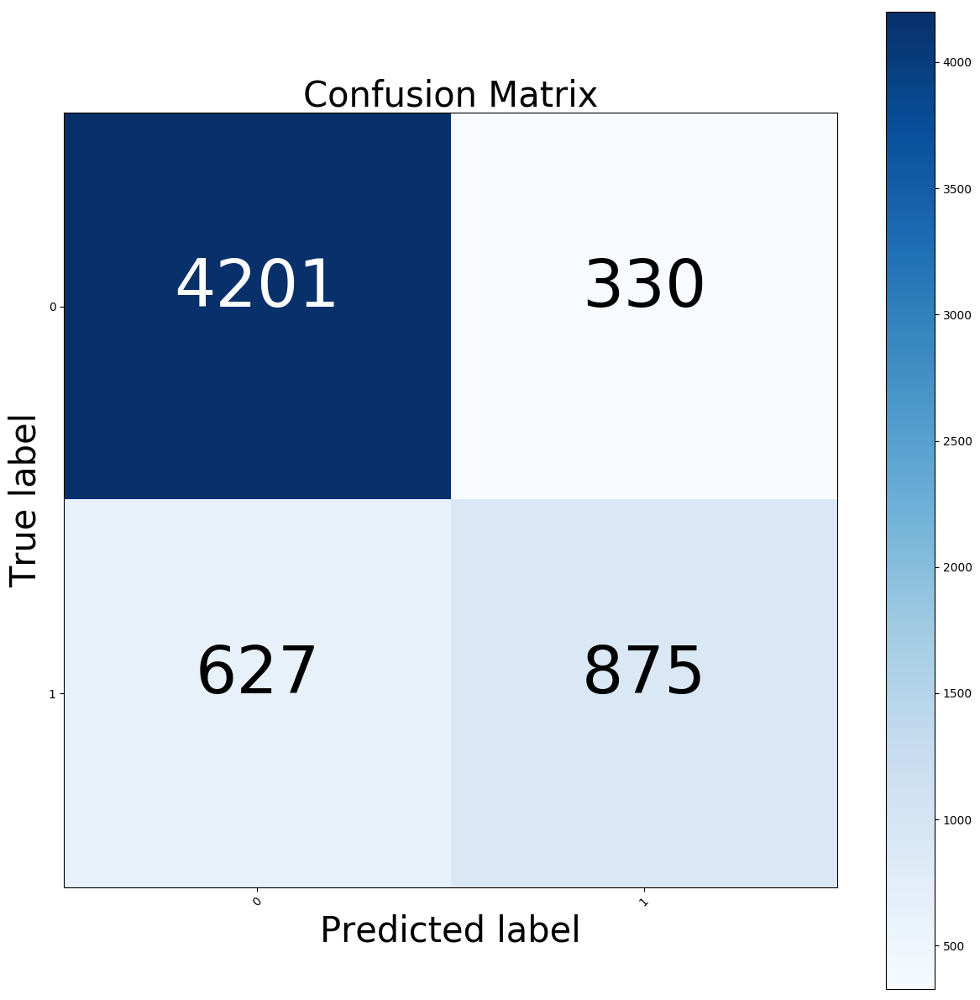

In [31]:
from sklearn.metrics import confusion_matrix

# calculate
confusion_matrix = confusion_matrix(testing_y, testing_y_pred)
normed_confusion_matrix = confusion_matrix.astype('float') / confusion_matrix.sum(axis=1)[:, np.newaxis]
num_classes = np.unique(classes)

cmap=plt.cm.Blues
plt.close()
plt.figure(figsize=(12, 12))
plt.imshow(confusion_matrix, interpolation='nearest', cmap=cmap)
plt.title('Confusion Matrix', fontsize=30)
plt.colorbar()
tick_marks = np.arange(len(num_classes))
plt.xticks(tick_marks, num_classes, rotation=45)
plt.yticks(tick_marks, num_classes)
plt.tight_layout()

fmt = 'd'
thresh = confusion_matrix.max() / 2.0

for i, j in itertools.product(range(confusion_matrix.shape[0]), range(confusion_matrix.shape[1])):
    plt.text(j, i, format(confusion_matrix[i, j], fmt),
             horizontalalignment="center",
             color='white' if confusion_matrix[i, j] > thresh else "black",
            size=56)


plt.tight_layout()
plt.ylabel('True label', fontsize=30)
plt.xlabel('Predicted label', fontsize=30)




Text(0.5,107.986,'Predicted label')

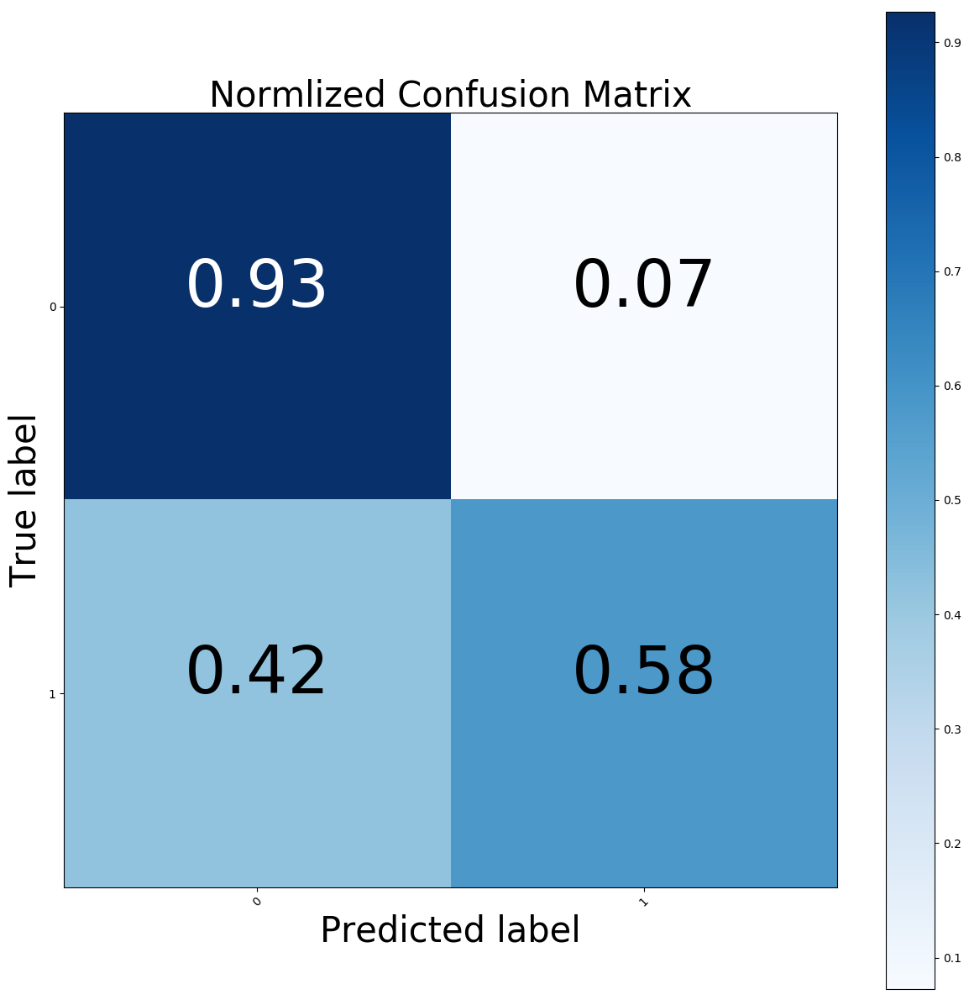

In [32]:
plt.close()
plt.figure(figsize=(12, 12))
plt.imshow(normed_confusion_matrix, interpolation='nearest', cmap=cmap)
plt.title('Normlized Confusion Matrix', fontsize=30)
plt.colorbar()
tick_marks = np.arange(len(num_classes))
plt.xticks(tick_marks, num_classes, rotation=45)
plt.yticks(tick_marks, num_classes)
plt.tight_layout()

fmt = '.2f'
thresh = confusion_matrix.max() / 2.0
for i, j in itertools.product(range(normed_confusion_matrix.shape[0]), range(normed_confusion_matrix.shape[1])):
    plt.text(j, i, format(normed_confusion_matrix[i, j], fmt),
             horizontalalignment="center",
             color='white' if confusion_matrix[i, j] > thresh else "black",
            size=26)

plt.tight_layout()
plt.ylabel('True label', fontsize=30)
plt.xlabel('Predicted label', fontsize=30)

# Learning Curve

In [52]:
train_sizes = np.append(np.linspace(0.05, 0.1, 20, endpoint=False),
                            np.linspace(0.1, 1, 20, endpoint=True))

# calculate

# balanced accuracy
# balanced_accuracy_train_sizes, balanced_accuracy_train_scores, balanced_accuracy_test_scores = sklearn.model_selection.learning_curve(
#     best_estimator,
#     training_x,
#     training_y,
#     cv=5,
#     train_sizes=train_sizes,
#     verbose=10,
#     scoring=make_scorer(balanced_accuracy),
#     n_jobs=4,
#     random_state=seed)


# unbalanced accuracy
accuracy_train_sizes, accuracy_train_scores, accuracy_test_scores = sklearn.model_selection.learning_curve(
    best_estimator,
    training_x,
    training_y,
    cv=5,
    train_sizes=train_sizes,
    verbose=10,
    scoring=make_scorer(accuracy_score),
    n_jobs=4,
    random_state=seed)

# precision
# precision_train_sizes, precision_train_scores, precision_test_scores = sklearn.model_selection.learning_curve(
#     best_estimator,
#     training_x,
#     training_y,
#     cv=5,
#     train_sizes=train_sizes,
#     verbose=10,
#     scoring=make_scorer(precision_score),
#     n_jobs=4,
#     random_state=seed)

# # recall
# recall_train_sizes, recall_train_scores, recall_test_scores = sklearn.model_selection.learning_curve(
#     best_estimator,
#     training_x,
#     training_y,
#     cv=5,
#     train_sizes=train_sizes,
#     verbose=10,
#     scoring=make_scorer(recall_score),
#     n_jobs=4,
#     random_state=seed)

# # roc_auc accuracy
# roc_auc_train_sizes, roc_auc_train_scores, roc_auc_test_scores = sklearn.model_selection.learning_curve(
#     best_estimator,
#     training_x,
#     training_y,
#     cv=5,
#     train_sizes=train_sizes,
#     verbose=10,
#     scoring=make_scorer(roc_auc_score),
#     n_jobs=4,
#     random_state=seed)




[learning_curve] Training set sizes: [  965  1013  1061  1109  1158  1206  1254  1302  1351  1399  1447  1495
  1544  1592  1640  1688  1737  1785  1833  1881  1930  2844  3758  4673
  5587  6501  7416  8330  9244 10158 11073 11987 12901 13816 14730 15644
 16559 17473 18387 19302]


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ........................ , score=0.789059262329051, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.7975549108992955, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8043928719436386, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8029423953584749, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.7977621218400331, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.7925818483215914, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.7958972233733941, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.7958972233733941, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8004558640696229, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.7876087857438873, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] ....................... , score=0.8000414421881475, total=   0.2s[CV]  ................................................................



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ........................ , score=0.810401989225031, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8089515126398674, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................


[Parallel(n_jobs=4)]: Done  12 out of 200 | elapsed:    0.9s remaining:   13.6s


[CV] ....................... , score=0.8050145047658517, total=   0.3s[CV] ........................ , score=0.806672192291753, total=   0.3s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8056361375880646, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8112308329879818, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8006630750103605, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] ....................... , score=0.8139245752175714, total=   0.3s
[CV]  ................................................................


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ........................ , score=0.819933692498964, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.7952755905511811, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8296726067136345, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8323663489432243, total=   0.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8416908412764194, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ........................ , score=0.837546622461666, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8423124740986324, total=   0.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8460422710319104, total=   0.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ........................ , score=0.855159552424368, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8555739743058434, total=   0.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8541234977206796, total=   0.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8607542478242851, total=   0.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8568172399502694, total=   1.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8586821384169084, total=   1.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................


[Parallel(n_jobs=4)]: Done  33 out of 200 | elapsed:    4.3s remaining:   21.5s


[CV] ....................... , score=0.8568172399502694, total=   1.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8559883961873187, total=   1.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8646912556983009, total=   1.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8626191462909242, total=   1.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.7842934106920846, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8033568172399502, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8603398259428098, total=   1.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ........................ , score=0.804807293825114, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.7886448404475757, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8008702859510982, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8626191462909242, total=   1.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8016991297140489, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.7981765437215085, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8095731454620804, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8064649813510153, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8083298798176544, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8613758806464982, total=   1.6s[CV] ....................... , score=0.8093659345213428, total=   0.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8159966846249482, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8037712391214256, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8058433485288024, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8141317861583092, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.7994198093659345, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8133029423953585, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................


[Parallel(n_jobs=4)]: Done  54 out of 200 | elapsed:    7.1s remaining:   19.3s


[CV] ....................... , score=0.8124740986324078, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8137173642768338, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8168255283878989, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8166183174471612, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8300870285951099, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ........................ , score=0.840033153750518, total=   0.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8427268959801077, total=   0.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8535018648984667, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8489432242022379, total=   0.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8522585992540406, total=   0.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8559883961873187, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ........................ , score=0.858889349357646, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8597181931205967, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8673849979278906, total=   0.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8642768338168255, total=   0.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8663489432242022, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8669705760464153, total=   0.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8607542478242851, total=   0.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................


[Parallel(n_jobs=4)]: Done  75 out of 200 | elapsed:   10.4s remaining:   17.4s


[CV] ....................... , score=0.8642768338168255, total=   1.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8605470368835475, total=   1.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.7880232076253626, total=   0.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.7919602154993783, total=   0.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8651056775797762, total=   1.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.7840861997513469, total=   0.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.7830501450476585, total=   0.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.7929962702030667, total=   0.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.7934106920845421, total=   0.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8661417322834646, total=   1.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.7919602154993783, total=   0.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.7975549108992955, total=   0.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ........................ , score=0.792789059262329, total=   0.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8031496062992126, total=   0.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.7946539577289681, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................[CV] ........................ , score=0.818690426854538, total=   0.2s
[CV] ....................... , score=0.8667633651056775, total=   1.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':



[CV]  ................................................................
[CV] ....................... , score=0.8112308329879818, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.7936179030252797, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] ......................... , score=0.80605055946954, total=   0.2s[CV]  ................................................................[CV] ....................... , score=0.8043928719436386, total=   0.2s




/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8122668876916701, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................


[Parallel(n_jobs=4)]: Done  96 out of 200 | elapsed:   12.2s remaining:   13.2s


[CV] ....................... , score=0.8085370907583921, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ........................ , score=0.804807293825114, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ........................ , score=0.809158723580605, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8137173642768338, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8327807708246996, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8296726067136345, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8418980522171571, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8485288023207626, total=   0.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ........................ , score=0.853916286779942, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ........................ , score=0.852051388313303, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ........................ , score=0.850808122668877, total=   0.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ........................ , score=0.853294653957729, total=   0.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8559883961873187, total=   0.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8566100290095316, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8590965602983838, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8622047244094488, total=   0.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8624119353501865, total=   0.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8570244508910071, total=   1.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ........................ , score=0.860132615002072, total=   1.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8630335681723995, total=   1.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.7786528497409326, total=   0.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................


[Parallel(n_jobs=4)]: Done 117 out of 200 | elapsed:   15.8s remaining:   11.2s


[CV] ........................ , score=0.797720207253886, total=   0.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8634479900538748, total=   1.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] ....................... , score=0.7898445595854923, total=   0.1s
[CV]  ................................................................


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.7840414507772021, total=   0.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ........................ , score=0.804559585492228, total=   0.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8667633651056775, total=   1.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ........................ , score=0.793160621761658, total=   0.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] ....................... , score=0.7919170984455959, total=   0.2s[CV]  ................................................................



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ........................ , score=0.793160621761658, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.7832124352331606, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8060103626943005, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8680066307501036, total=   1.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8070466321243523, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................[CV] ......................... , score=0.81139896373057, total=   0.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................[CV] ....................... , score=0.7964766839378238, total=   0.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8041450777202073, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8026943005181347, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.7939896373056995, total=   0.2s[CV] ....................... , score=0.8039378238341969, total=   0.2s



/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8089119170984456, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.7987564766839378, total=   0.2s
[CV] ........................ , score=0.807461139896373, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV] ........................ , score=0.806839378238342, total=   0.2s
[CV]  ................................................................


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................


[Parallel(n_jobs=4)]: Done 138 out of 200 | elapsed:   17.2s remaining:    7.7s


[CV] ....................... , score=0.8248704663212435, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8296373056994819, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8360621761658031, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8480829015544041, total=   0.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8472538860103627, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ........................ , score=0.845181347150259, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ........................ , score=0.849119170984456, total=   0.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8551295336787564, total=   0.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8516062176165803, total=   0.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8511917098445596, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8563730569948187, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8551295336787564, total=   0.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8551295336787564, total=   0.9s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8569948186528498, total=   1.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8563730569948187, total=   1.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8601036269430051, total=   1.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.7745077720207254, total=   0.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.7995854922279793, total=   0.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8576165803108808, total=   1.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.7798963730569948, total=   0.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................


[Parallel(n_jobs=4)]: Done 159 out of 200 | elapsed:   20.8s remaining:    5.4s


[CV] ....................... , score=0.7780310880829016, total=   0.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ........................ , score=0.790259067357513, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ........................ , score=0.794818652849741, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.7983419689119171, total=   0.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8625906735751295, total=   1.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.7944041450777202, total=   0.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.7956476683937824, total=   0.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8095336787564766, total=   0.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8031088082901554, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ........................ , score=0.813678756476684, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8654922279792746, total=   1.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ........................ , score=0.805181347150259, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.7919170984455959, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8049740932642487, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.7944041450777202, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8029015544041451, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ........................ , score=0.809740932642487, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8076683937823834, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8072538860103627, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8082901554404145, total=   0.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8238341968911918, total=   0.3s


[Parallel(n_jobs=4)]: Done 180 out of 200 | elapsed:   22.1s remaining:    2.5s
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ........................ , score=0.832538860103627, total=   0.3s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8387564766839378, total=   0.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8474611398963731, total=   0.4s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8522279792746114, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8555440414507772, total=   0.5s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8532642487046632, total=   0.6s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ........................ , score=0.856580310880829, total=   0.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8543005181347151, total=   0.7s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ......................... , score=0.85720207253886, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8605181347150259, total=   0.8s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8630051813471502, total=   1.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8601036269430051, total=   1.0s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8607253886010363, total=   1.1s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8665284974093265, total=   1.2s


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':


[CV]  ................................................................
[CV] ....................... , score=0.8665284974093265, total=   1.1s
[CV] ....................... , score=0.8632124352331606, total=   1.1s
[CV] ....................... , score=0.8627979274611399, total=   1.2s
[CV] ....................... , score=0.8650777202072539, total=   1.2s


[Parallel(n_jobs=4)]: Done 200 out of 200 | elapsed:   26.5s finished


In [53]:
# # plot
# plt.close()
# plt.figure(figsize=(12, 12))
# plt.title('Balanced Accuracy Learning Curve', fontsize=35)

# plt.xlabel('Training examples (count)', fontsize=30)
# plt.ylabel('Balanced Accuracy (0.0 - 1.0)', fontsize=30)
# plt.grid()
# plt.tight_layout()

# train_scores = balanced_accuracy_train_scores
# test_scores = balanced_accuracy_test_scores
# train_sizes = balanced_accuracy_train_sizes

# train_points = train_scores
# test_points = test_scores

# ax = plt.gca()
# ax.set_xscale("linear")
# ax.set_yscale("linear")

# train_scores_mean = np.mean(train_scores, axis=1)
# train_scores_std = np.std(train_scores, axis=1)
# test_scores_mean = np.mean(test_scores, axis=1)
# test_scores_std = np.std(test_scores, axis=1)
# train_points = train_scores_mean
# test_points = test_scores_mean

# plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
#                  train_scores_mean + train_scores_std, alpha=0.2)
# plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
#                  test_scores_mean + test_scores_std, alpha=0.2)

# plt.plot(train_sizes, train_points, 'o-', linewidth=1, markersize=4,
#          label="Training score")
# plt.plot(train_sizes, test_points, 'o-', linewidth=1, markersize=4,
#          label="Cross-validation score")

# plt.legend(loc="best")

# ---------------------------------------------------------------


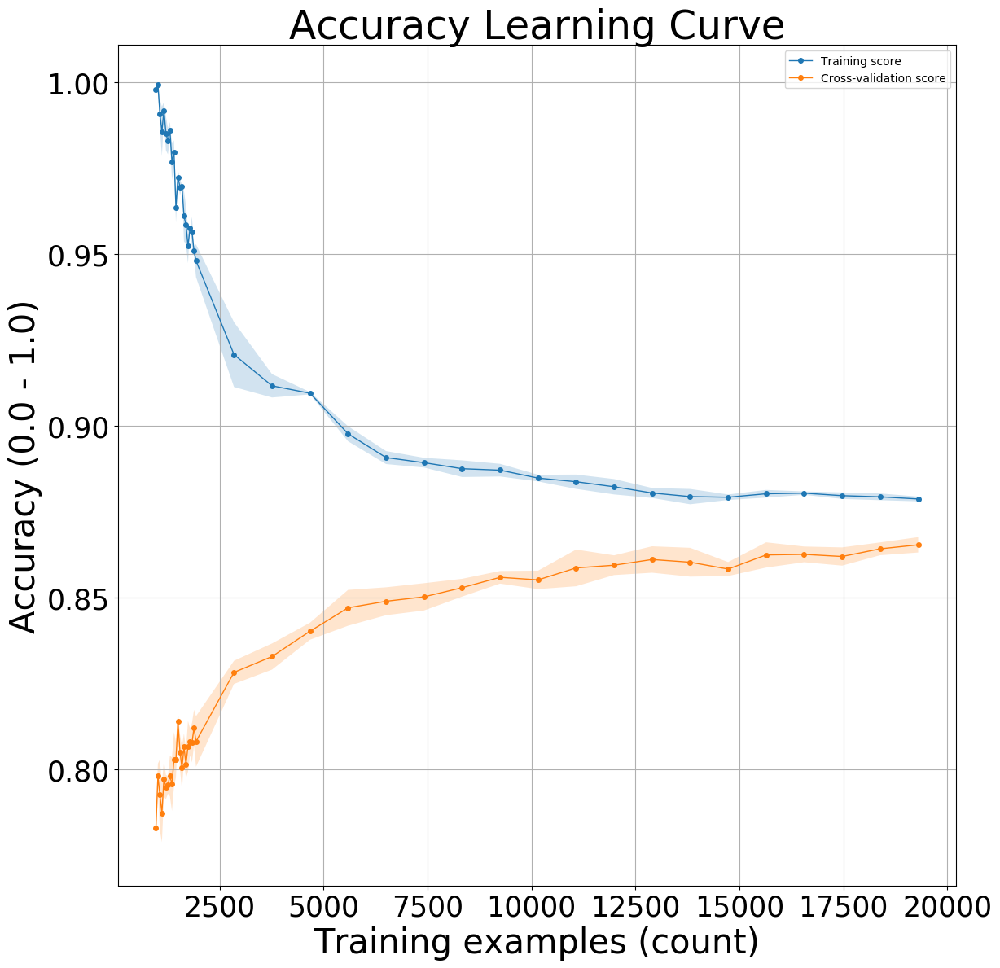

In [54]:
plt.close()
plt.figure(figsize=(12, 12))
plt.tick_params(labelsize=25)

plt.title('Accuracy Learning Curve', fontsize=35)

plt.xlabel('Training examples (count)', fontsize=30)
plt.ylabel('Accuracy (0.0 - 1.0)', fontsize=30)
plt.grid()
plt.tight_layout()

train_scores = accuracy_train_scores
test_scores = accuracy_test_scores
train_sizes = accuracy_train_sizes

train_points = train_scores
test_points = test_scores

ax = plt.gca()
ax.set_xscale("linear")
ax.set_yscale("linear")

train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)
train_points = train_scores_mean
test_points = test_scores_mean

plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.2)
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.2)

plt.plot(train_sizes, train_points, 'o-', linewidth=1, markersize=4,
         label="Training score")
plt.plot(train_sizes, test_points, 'o-', linewidth=1, markersize=4,
         label="Cross-validation score")

plt.legend(loc="best")



# ---------------------------------------------------------------

In [55]:
# plt.close()
# plt.figure(figsize=(12, 12))
# plt.title('Precision Learning Curve')

# plt.xlabel('Training examples (count)')
# plt.ylabel('Accuracy (0.0 - 1.0)')
# plt.grid()
# plt.tight_layout()

# train_scores = precision_train_scores
# test_scores = precision_test_scores
# train_sizes = precision_train_sizes

# train_points = train_scores
# test_points = test_scores

# ax = plt.gca()
# ax.set_xscale("linear")
# ax.set_yscale("linear")

# train_scores_mean = np.mean(train_scores, axis=1)
# train_scores_std = np.std(train_scores, axis=1)
# test_scores_mean = np.mean(test_scores, axis=1)
# test_scores_std = np.std(test_scores, axis=1)
# train_points = train_scores_mean
# test_points = test_scores_mean

# plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
#                  train_scores_mean + train_scores_std, alpha=0.2)
# plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
#                  test_scores_mean + test_scores_std, alpha=0.2)

# plt.plot(train_sizes, train_points, 'o-', linewidth=1, markersize=4,
#          label="Training score")
# plt.plot(train_sizes, test_points, 'o-', linewidth=1, markersize=4,
#          label="Cross-validation score")

# plt.legend(loc="best")

# -------------------------------------------


In [56]:
# plt.close()
# plt.figure(figsize=(12, 12))

# plt.title('Recall Accuracy Learning Curve')

# plt.xlabel('Training examples (count)')
# plt.ylabel('Accuracy (0.0 - 1.0)')
# plt.grid()
# plt.tight_layout()

# train_scores = recall_train_scores
# test_scores = recall_test_scores
# train_sizes = recall_train_sizes

# train_points = train_scores
# test_points = test_scores

# ax = plt.gca()
# ax.set_xscale("linear")
# ax.set_yscale("linear")

# train_scores_mean = np.mean(train_scores, axis=1)
# train_scores_std = np.std(train_scores, axis=1)
# test_scores_mean = np.mean(test_scores, axis=1)
# test_scores_std = np.std(test_scores, axis=1)
# train_points = train_scores_mean
# test_points = test_scores_mean

# plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
#                  train_scores_mean + train_scores_std, alpha=0.2)
# plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
#                  test_scores_mean + test_scores_std, alpha=0.2)

# plt.plot(train_sizes, train_points, 'o-', linewidth=1, markersize=4,
#          label="Training score")
# plt.plot(train_sizes, test_points, 'o-', linewidth=1, markersize=4,
#          label="Cross-validation score")

# plt.legend(loc="best")


# -------------------------------------------


In [57]:
# plt.close()
# plt.figure(figsize=(12, 12))
# plt.title('ROC-AUC Accuracy Learning Curve')
# plt.xlabel('Training examples (count)')
# plt.ylabel('Accuracy (0.0 - 1.0)')
# plt.grid()
# plt.tight_layout()

# train_scores = roc_auc_train_scores
# test_scores = roc_auc_test_scores
# train_sizes = roc_auc_train_sizes

# train_points = train_scores
# test_points = test_scores

# ax = plt.gca()
# ax.set_xscale("linear")
# ax.set_yscale("linear")

# train_scores_mean = np.mean(train_scores, axis=1)
# train_scores_std = np.std(train_scores, axis=1)
# test_scores_mean = np.mean(test_scores, axis=1)
# test_scores_std = np.std(test_scores, axis=1)
# train_points = train_scores_mean
# test_points = test_scores_mean

# plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
#                  train_scores_mean + train_scores_std, alpha=0.2)
# plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
#                  test_scores_mean + test_scores_std, alpha=0.2)

# plt.plot(train_sizes, train_points, 'o-', linewidth=1, markersize=4,
#          label="Training score")
# plt.plot(train_sizes, test_points, 'o-', linewidth=1, markersize=4,
#          label="Cross-validation score")

# plt.legend(loc="best")

# Compelxity Param: n_estimators

In [46]:
# balanced_accuracy_train_scores, balanced_accuracy_test_scores = sklearn.model_selection.validation_curve(best_estimator,training_x, training_y, "n_estimators", n_estimators, cv=5,
#                                                  scoring=data1_scorer, n_jobs=4)
n_estimators_adjust =  [2, 5, 10, 20, 30, 45, 60, 80, 90, 100, 110, 120, 130, 140, 150, 160, 170, 180, 190, 200]
accuracy_train_scores, accuracy_test_scores = sklearn.model_selection.validation_curve(best_estimator,training_x, training_y, "n_estimators", n_estimators_adjust, cv=5,
                                                 scoring=make_scorer(accuracy_score), n_jobs=4)

# precision_train_scores, precision_test_scores = sklearn.model_selection.validation_curve(best_estimator,training_x, training_y, "n_estimators", n_estimators, cv=5,
#                                                  scoring=make_scorer(precision_score), n_jobs=4)

# recall_train_scores, recall_test_scores = sklearn.model_selection.validation_curve(best_estimator,training_x, training_y, "n_estimators", n_estimators, cv=5,
#                                                  scoring=make_scorer(recall_score), n_jobs=4)

# roc_auc_train_scores, roc_auc_test_scores = sklearn.model_selection.validation_curve(best_estimator,training_x, training_y, "n_estimators", n_estimators, cv=5,
#                                                  scoring=make_scorer(roc_auc_score), n_jobs=4)

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/sklearn/externals/joblib/backports.py:24: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/home/shari/

In [47]:
# plt.close('all')
# plt.figure()
# plt.title('Model Complexity Curve: n_estimators')

# plt.xlabel('Training examples (count)')
# plt.ylabel('Accuracy (0.0 - 1.0)')
# plt.grid()
# plt.tight_layout()

# train_scores = balanced_accuracy_train_scores
# test_scores = balanced_accuracy_test_scores
# train_sizes = n_estimators

# train_points = train_scores
# test_points = test_scores
# ax = plt.gca()
# x_scale = 'linear'
# y_scale = 'linear'

# ax.set_xscale(x_scale)
# ax.set_yscale(y_scale)

# train_scores_mean = np.mean(train_scores, axis=1)
# train_scores_std = np.std(train_scores, axis=1)
# test_scores_mean = np.mean(test_scores, axis=1)
# test_scores_std = np.std(test_scores, axis=1)
# train_points = train_scores_mean
# test_points = test_scores_mean

# plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
#                      train_scores_mean + train_scores_std, alpha=0.2)
# plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
#                      test_scores_mean + test_scores_std, alpha=0.2)

# plt.plot(train_sizes, train_points, 'o-', linewidth=1, markersize=4,
#      label="Training score")
# plt.plot(train_sizes, test_points, 'o-', linewidth=1, markersize=4,
#      label="Cross-validation score")

# plt.legend(loc="best")
# plt.tight_layout()

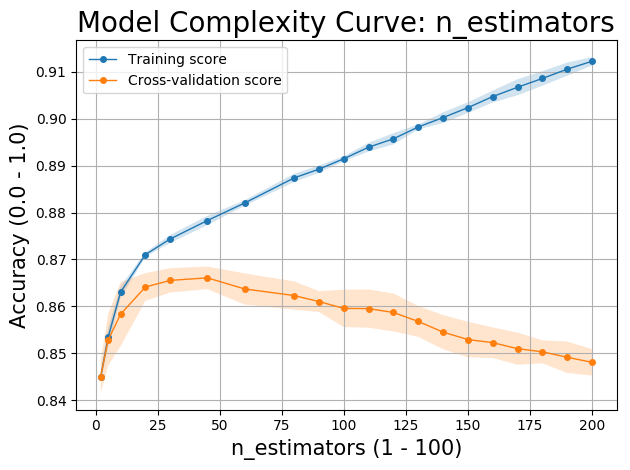

In [48]:
plt.close('all')
plt.figure()
plt.title('Model Complexity Curve: n_estimators', fontsize=20)

plt.xlabel('n_estimators (1 - 100)', fontsize=15)
plt.ylabel('Accuracy (0.0 - 1.0)', fontsize=15)
plt.grid()
plt.tight_layout()

train_scores = accuracy_train_scores
test_scores = accuracy_test_scores
train_sizes = n_estimators_adjust

train_points = train_scores
test_points = test_scores
ax = plt.gca()
x_scale = 'linear'
y_scale = 'linear'

ax.set_xscale(x_scale)
ax.set_yscale(y_scale)

train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)
train_points = train_scores_mean
test_points = test_scores_mean

plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.2)
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.2)

plt.plot(train_sizes, train_points, 'o-', linewidth=1, markersize=4,
     label="Training score")
plt.plot(train_sizes, test_points, 'o-', linewidth=1, markersize=4,
     label="Cross-validation score")

plt.legend(loc="best")
plt.tight_layout()


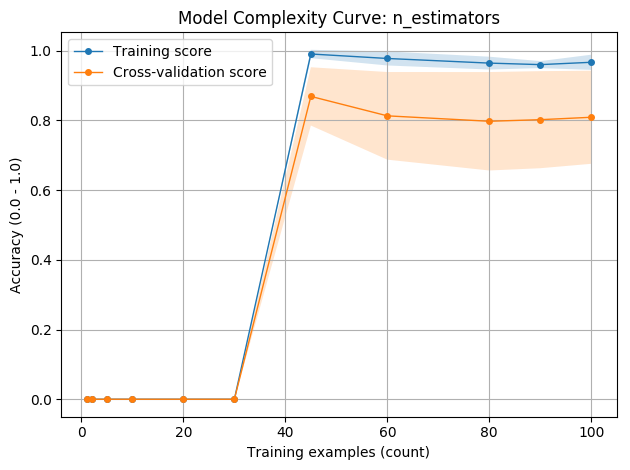

In [36]:
# plt.close('all')
# plt.figure()
# plt.title('Model Complexity Curve: n_estimators')

# plt.xlabel('Training examples (count)')
# plt.ylabel('Accuracy (0.0 - 1.0)')
# plt.grid()
# plt.tight_layout()

# train_scores = precision_train_scores
# test_scores = precision_test_scores
# train_sizes = n_estimators

# train_points = train_scores
# test_points = test_scores
# ax = plt.gca()
# x_scale = 'linear'
# y_scale = 'linear'

# ax.set_xscale(x_scale)
# ax.set_yscale(y_scale)

# train_scores_mean = np.mean(train_scores, axis=1)
# train_scores_std = np.std(train_scores, axis=1)
# test_scores_mean = np.mean(test_scores, axis=1)
# test_scores_std = np.std(test_scores, axis=1)
# train_points = train_scores_mean
# test_points = test_scores_mean

# plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
#                      train_scores_mean + train_scores_std, alpha=0.2)
# plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
#                      test_scores_mean + test_scores_std, alpha=0.2)

# plt.plot(train_sizes, train_points, 'o-', linewidth=1, markersize=4,
#      label="Training score")
# plt.plot(train_sizes, test_points, 'o-', linewidth=1, markersize=4,
#      label="Cross-validation score")

# plt.legend(loc="best")
# plt.tight_layout()

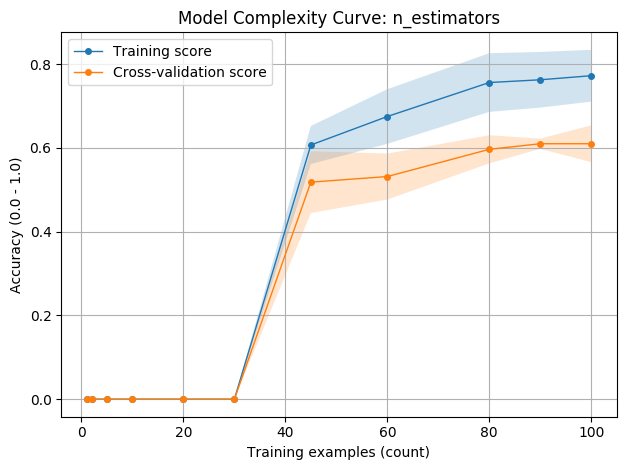

In [38]:
# plt.close('all')
# plt.figure()
# plt.title('Model Complexity Curve: n_estimators')

# plt.xlabel('Training examples (count)')
# plt.ylabel('Accuracy (0.0 - 1.0)')
# plt.grid()
# plt.tight_layout()

# train_scores = recall_train_scores
# test_scores = recall_test_scores
# train_sizes = n_estimators

# train_points = train_scores
# test_points = test_scores
# ax = plt.gca()
# x_scale = 'linear'
# y_scale = 'linear'

# ax.set_xscale(x_scale)
# ax.set_yscale(y_scale)

# train_scores_mean = np.mean(train_scores, axis=1)
# train_scores_std = np.std(train_scores, axis=1)
# test_scores_mean = np.mean(test_scores, axis=1)
# test_scores_std = np.std(test_scores, axis=1)
# train_points = train_scores_mean
# test_points = test_scores_mean

# plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
#                      train_scores_mean + train_scores_std, alpha=0.2)
# plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
#                      test_scores_mean + test_scores_std, alpha=0.2)

# plt.plot(train_sizes, train_points, 'o-', linewidth=1, markersize=4,
#      label="Training score")
# plt.plot(train_sizes, test_points, 'o-', linewidth=1, markersize=4,
#      label="Cross-validation score")

# plt.legend(loc="best")
# plt.tight_layout()

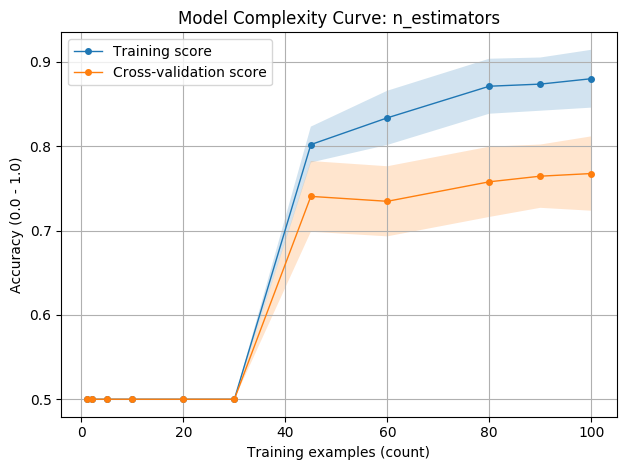

In [40]:
# plt.close('all')
# plt.figure()
# plt.title('Model Complexity Curve: n_estimators')

# plt.xlabel('Training examples (count)')
# plt.ylabel('Accuracy (0.0 - 1.0)')
# plt.grid()
# plt.tight_layout()

# train_scores = roc_auc_train_scores
# test_scores = roc_auc_test_scores
# train_sizes = n_estimators

# train_points = train_scores
# test_points = test_scores
# ax = plt.gca()
# x_scale = 'linear'
# y_scale = 'linear'

# ax.set_xscale(x_scale)
# ax.set_yscale(y_scale)

# train_scores_mean = np.mean(train_scores, axis=1)
# train_scores_std = np.std(train_scores, axis=1)
# test_scores_mean = np.mean(test_scores, axis=1)
# test_scores_std = np.std(test_scores, axis=1)
# train_points = train_scores_mean
# test_points = test_scores_mean

# plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
#                      train_scores_mean + train_scores_std, alpha=0.2)
# plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
#                      test_scores_mean + test_scores_std, alpha=0.2)

# plt.plot(train_sizes, train_points, 'o-', linewidth=1, markersize=4,
#      label="Training score")
# plt.plot(train_sizes, test_points, 'o-', linewidth=1, markersize=4,
#      label="Cross-validation score")

# plt.legend(loc="best")
# plt.tight_layout()

# Timing Curve

In [63]:
from time import clock


sizes = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
tests = 5
out = dict()
out['train'] = np.zeros(shape=(len(sizes), tests))
out['test'] = np.zeros(shape=(len(sizes), tests))

for i, frac in enumerate(sizes):
    for j in range(tests):
        np.random.seed(seed)
        x_train, x_test, y_train, y_test = sklearn.model_selection.train_test_split(training_x, training_y, test_size=1 - frac, random_state=seed)
        st = clock()
        best_estimator.fit(x_train, y_train)
        out['train'][i, j] = (clock() - st)
        st = clock()
        best_estimator.predict(x_test)
        out['test'][i, j] = (clock() - st)


/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/ipykernel_launcher.py:14: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/ipykernel_launcher.py:16: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/ipykernel_launcher.py:17: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  app.launch_new_instance()
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/ipykernel_launcher.py:19: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/ipykernel_launcher.py:16: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/ipykernel_launcher.py:17: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  app.launch_new_instance()
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/ipykernel_launcher.py:19: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/ipykernel_launcher.py:14: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.pr

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/ipykernel_launcher.py:16: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/ipykernel_launcher.py:17: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  app.launch_new_instance()
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/ipykernel_launcher.py:19: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/ipykernel_launcher.py:14: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.pr

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/ipykernel_launcher.py:16: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/ipykernel_launcher.py:17: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  app.launch_new_instance()
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/ipykernel_launcher.py:19: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/ipykernel_launcher.py:14: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.pr

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/ipykernel_launcher.py:16: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/ipykernel_launcher.py:17: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  app.launch_new_instance()
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/ipykernel_launcher.py:19: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/ipykernel_launcher.py:14: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.pr

/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/ipykernel_launcher.py:16: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/ipykernel_launcher.py:17: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  app.launch_new_instance()
/home/shari/miniconda3/envs/shari_hw_ml/lib/python3.7/site-packages/ipykernel_launcher.py:19: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


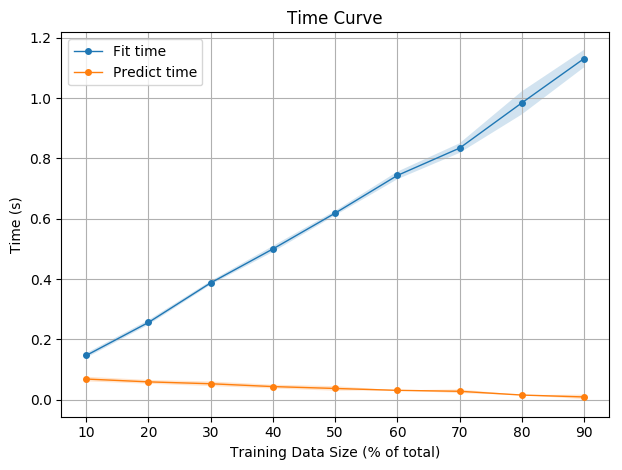

In [64]:
plt.close()
plt.figure()
plt.title("Time Curve")

plt.xlabel("Training Data Size (% of total)")
plt.ylabel("Time (s)")
fit_scores_mean = np.mean(out['train'], axis=1)
fit_scores_std = np.std(out['train'], axis=1)
predict_scores_mean = np.mean(out['test'], axis=1)
predict_scores_std = np.std(out['test'], axis=1)
plt.grid()
plt.tight_layout()

plt.fill_between(np.array(sizes) * 100, fit_scores_mean - fit_scores_std,
                 fit_scores_mean + fit_scores_std, alpha=0.2)
plt.fill_between(np.array(sizes) * 100, predict_scores_mean - predict_scores_std,
                 predict_scores_mean + predict_scores_std, alpha=0.2)
plt.plot(np.array(sizes) * 100, fit_scores_mean, 'o-', linewidth=1, markersize=4,
         label="Fit time")
plt.plot(np.array(sizes) * 100, predict_scores_mean, 'o-', linewidth=1, markersize=4,
         label="Predict time")

plt.legend(loc="best")

In [65]:
print(fit_scores_mean)
print(predict_scores_mean)

[0.146875 0.25625  0.3875   0.5      0.61875  0.74375  0.834375 0.984375
 1.13125 ]
[0.06875  0.059375 0.053125 0.04375  0.0375   0.03125  0.028125 0.015625
 0.009375]
